In [11]:
# %reload_ext snakeviz
%matplotlib inline
%run SBRG.py
import matplotlib.pyplot as plt
import time

In [12]:
def index_map(level, site):
    lower_level_sum = 6*int((level*(level+1)/2))
    if site>=6*(level+1): 
        print("Invalid Site index")
        return None
    else:
        return int(lower_level_sum + site)

def custom_2D_Ising_bdry(L_min, L_max, **para):
    # model - a dict of model parameters
    try: # set parameter alpha
        alpha = para['alpha']
        alpha_J = alpha
        alpha_mu = alpha
        alpha_h = alpha
    except:
        alpha_J = para.get('alpha_J',1)
        alpha_mu = para.get('alpha_mu',1)
        alpha_h = para.get('alpha_h',1)
    model = Model()
    model.size = 6*int((L_max*(L_max+1)/2)) #- (L_min*(L_min+1)/2))
    H_append = model.terms.append
    rnd_beta = random.betavariate
    for level in range(L_min, L_max):
        for site in range(6*(level+1)):

            ind_0 = index_map(level, site)
            ind_nbh1 = index_map(level, (site+1)%(6*(level+1)))
            
            H_append(Term(mkMat({ind_0: 3}), -para['mu']*rnd_beta(alpha_mu, 1)))
            
            H_append(Term(mkMat({ind_0: 1}), -para['h']*rnd_beta(alpha_h, 1)))
            
            H_append(Term(mkMat({ind_0: 3, ind_nbh1: 3}), -para['J']*rnd_beta(alpha_J, 1)))
            
            if level==0: None
            else:
                if site%(level+1)==0:  
                    ind_nbh2 = index_map(level-1, site*level/(level+1)) 
                    
                    H_append(Term(mkMat({ind_0: 3, ind_nbh2: 3}), -para['J']*rnd_beta(alpha_J, 1)))
                    
                else:
                    ind_nbh2 = index_map(level-1, (level*int(site/(level+1))+site%(level+1)-1)%(6*level))
                    ind_nbh3 = index_map(level-1, (level*int(site/(level+1))+site%(level+1))%(6*level))
                    
                    H_append(Term(mkMat({ind_0: 3, ind_nbh2: 3}), -para['J']*rnd_beta(alpha_J, 1)))
                    H_append(Term(mkMat({ind_0: 3, ind_nbh3: 3}), -para['J']*rnd_beta(alpha_J, 1)))
    model.terms = [term for term in model.terms if abs(term.val) > 0]
    return model

def spin_spin_op(level_1, level_2):
    ind_i = index_map(level_1, 0)
    ind_j = index_map(level_2, 0)
    return Ham([Term(mkMat({ind_i: 3, ind_j: 3}), 1)])

In [13]:
L_min = 0
L_max = 4

H = custom_2D_Ising_bdry(L_min, L_max, **{'alpha':1., 'J':1., 'mu':0., 'h':1.})
system = SBRG(H)

system.tol = 0.
system.max_rate = 1000.
system.run()


105
the sum of the absolute values of trash is  0.015383728478037343
the max_len is 75 and the total num is 105


In [ ]:
L_min_list = np.array([0, 4, 8, 12])
L_max = 50

n_runs = 300

J = 1.
h = 1.
mu = 0.

corr_array = np.zeros(shape = (len(L_min_list), L_max - L_min_list.min()))

fname = "Spin_spin_corr_hexlat_J"+str(J)+"_h"+str(h)+"_"+str(time.time())+".npz"
label = "L_max="+str(L_max)+"\nL_min_list="+str(L_min_list)+"\nn_runs="+str(n_runs)

for i, L_min in enumerate(L_min_list):
    for run in range(n_runs):
        H = custom_2D_Ising_bdry(L_min, L_max, **{'alpha':1., 'J':J, 'mu':mu, 'h':h})
        system = SBRG(H)

        system.tol = 0.
        system.max_rate = 1000.
        system.run()

        ground_state, energy = system.grndstate_blk()

        for level in range(L_min, L_max):
            spin_01 = spin_spin_op(0, level)
            corr_array[i, level] += system.measure_ops(spin_01, ground_state)


    np.savez_compressed(fname, data=corr_array, label=label)

91
the sum of the absolute values of trash is  0.13467046181889822
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.7490345088623086
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.22461245394692733
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  5.429420647614874
the max_len is 145 and the total num is 406
378
the sum of the absolute values of trash is  1.2382735502703683
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.022790304220470587
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  4.097560315417001
the max_len is 110 and the total num is 231
91
325
the sum of the absolute values of trash is  0.10682767274121183
the max_len is 130 and the total num is 325
820
the sum of the absolute values of trash is  13.728031821510974
the max_len is 205 and the total num is 820
153
9

34191
the sum of the absolute values of trash is  157.36863219831193
the max_len is 1310 and the total num is 34191
990
the sum of the absolute values of trash is  4.384659816686251
the max_len is 225 and the total num is 990
378
the sum of the absolute values of trash is  0.062333760945096205
the max_len is 140 and the total num is 378
153
the sum of the absolute values of trash is  0.9901224706260383
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.18994795663665
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.6737083791930637
the max_len is 90 and the total num is 153
2628
the sum of the absolute values of trash is  2.968048174830718
the max_len is 365 and the total num is 2628
153
465
the sum of the absolute values of trash is  2.6530516555427663
the max_len is 155 and the total num is 465
153
378
the sum of the absolute values of trash is  1.1438724630793868
the max_len is 140 and the total n

1378
the sum of the absolute values of trash is  9.978496611908703
the max_len is 265 and the total num is 1378
91
the sum of the absolute values of trash is  0.030942606295922475
the max_len is 70 and the total num is 91
1225
the sum of the absolute values of trash is  10.235926405588092
the max_len is 250 and the total num is 1225
325
the sum of the absolute values of trash is  1.9624578274182842
the max_len is 130 and the total num is 325
435
the sum of the absolute values of trash is  1.653425006761785
the max_len is 150 and the total num is 435
11628
the sum of the absolute values of trash is  2.0300425367309978
the max_len is 765 and the total num is 11628
91
the sum of the absolute values of trash is  0.22090280902636505
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.28562584679060515
the max_len is 90 and the total num is 153
6216
the sum of the absolute values of trash is  66.73843161220748
the max_len is 560 and the total num is 62

91
the sum of the absolute values of trash is  0.029644753930466648
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.01953578883535659
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.0605786714035598
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.0524952285175293
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.549943960448385
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.625027512156385
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.296098410057023
the max_len is 110 and the total num is 231
741
the sum of the absolute values of trash is  5.174541061213843
the max_len is 195 and the total num is 741
91
the sum of the absolute values of trash is  0.2022076376091265
the max_len is 70 and the total num is 91
153
the sum of 

1128
the sum of the absolute values of trash is  30.56989487776848
the max_len is 240 and the total num is 1128
325
the sum of the absolute values of trash is  1.9549945396075115
the max_len is 130 and the total num is 325
406
the sum of the absolute values of trash is  7.835914881521742
the max_len is 145 and the total num is 406
595
the sum of the absolute values of trash is  3.313974834158479
the max_len is 175 and the total num is 595
253
the sum of the absolute values of trash is  1.1253686502974076
the max_len is 115 and the total num is 253
351
the sum of the absolute values of trash is  2.3674339594105724
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  0.011012269412400834
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  0.04914292413975019
the max_len is 175 and the total num is 595
276
the sum of the absolute values of trash is  1.2459438355248806
the max_len is 120 and the total num is 276


990
the sum of the absolute values of trash is  25.35772499810925
the max_len is 225 and the total num is 990
153
153
the sum of the absolute values of trash is  0.025035957126227415
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.08156519047975017
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  1.522285783970258
the max_len is 105 and the total num is 210
1176
the sum of the absolute values of trash is  21.204105536081784
the max_len is 245 and the total num is 1176
91
the sum of the absolute values of trash is  0.058907686049316954
the max_len is 70 and the total num is 91
4186
the sum of the absolute values of trash is  14.1390596470325
the max_len is 460 and the total num is 4186
120
91
the sum of the absolute values of trash is  0.02017113189932813
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  0.14109020619261753
the max_len is 125 and the total num is 

595
the sum of the absolute values of trash is  0.07434362244919103
the max_len is 175 and the total num is 595
153
the sum of the absolute values of trash is  5.024589137830475
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.6444019672286214
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.5618055079356874
the max_len is 90 and the total num is 153
528
the sum of the absolute values of trash is  0.27795344842779196
the max_len is 165 and the total num is 528
66
the sum of the absolute values of trash is  0.03888615083089411
the max_len is 60 and the total num is 66
435
the sum of the absolute values of trash is  2.6060405002010003
the max_len is 150 and the total num is 435
91
231
the sum of the absolute values of trash is  0.10483625338696356
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  0.1933406678645388
the max_len is 150 and the total num is 435
1

153
the sum of the absolute values of trash is  0.07582856032544459
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.4674402919376873
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  10.066140731342342
the max_len is 130 and the total num is 325
630
the sum of the absolute values of trash is  6.636599821380993
the max_len is 180 and the total num is 630
231
the sum of the absolute values of trash is  1.553102376775112
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  4.103045054928916
the max_len is 110 and the total num is 231
1540
the sum of the absolute values of trash is  14.809922472936965
the max_len is 280 and the total num is 1540
91
the sum of the absolute values of trash is  0.181602898965463
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.19217646810094968
the max_len is 70 and the total num is 91
2080
the 

210
the sum of the absolute values of trash is  0.016619691810138126
the max_len is 105 and the total num is 210
496
the sum of the absolute values of trash is  13.89502926252644
the max_len is 160 and the total num is 496
2415
the sum of the absolute values of trash is  3.3511347241377587
the max_len is 350 and the total num is 2415
153
the sum of the absolute values of trash is  0.4343992887184781
the max_len is 90 and the total num is 153
8515
the sum of the absolute values of trash is  31.553424079669647
the max_len is 655 and the total num is 8515
231
the sum of the absolute values of trash is  0.9230433067408864
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.034389760140769915
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  1.0344546022457084
the max_len is 70 and the total num is 91
91
66
the sum of the absolute values of trash is  0.21787121946156285
the max_len is 60 and the total num is 6

153
the sum of the absolute values of trash is  0.514572362712516
the max_len is 90 and the total num is 153
630
the sum of the absolute values of trash is  0.20631468575346903
the max_len is 180 and the total num is 630
435
the sum of the absolute values of trash is  1.9491570956882749
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.0779942743352751
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.122522300458681
the max_len is 90 and the total num is 153
528
the sum of the absolute values of trash is  0.11902915621728608
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.09886753325730134
the max_len is 70 and the total num is 91
91
378
the sum of the absolute values of trash is  1.3337367042315218
the max_len is 140 and the total num is 378
1770
the sum of the absolute values of trash is  48.49687416381303
the max_len is 300 and the total num is 1770
630


666
the sum of the absolute values of trash is  8.201998190980657
the max_len is 185 and the total num is 666
1326
the sum of the absolute values of trash is  2.220406894755717
the max_len is 260 and the total num is 1326
153
the sum of the absolute values of trash is  1.171850691547885
the max_len is 90 and the total num is 153
630
the sum of the absolute values of trash is  6.561072026429192
the max_len is 180 and the total num is 630
17578
the sum of the absolute values of trash is  93.3093656694754
the max_len is 940 and the total num is 17578
4005
the sum of the absolute values of trash is  12.546737797185127
the max_len is 450 and the total num is 4005
561
the sum of the absolute values of trash is  14.430304881136648
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.034499523457634226
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.0689389972453704
the max_len is 110 and the total num is 231
6

231
the sum of the absolute values of trash is  0.7388541828794888
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5867920163310729
the max_len is 70 and the total num is 91
435
406
the sum of the absolute values of trash is  1.3839410898154925
the max_len is 145 and the total num is 406
120
the sum of the absolute values of trash is  1.878097550936102
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.03671210965474199
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.09968535859594105
the max_len is 90 and the total num is 153
351
the sum of the absolute values of trash is  4.605369321994199
the max_len is 135 and the total num is 351
231
the sum of the absolute values of trash is  2.5653128751705436
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  0.10265493771459416
the max_len is 160 and the total num is 496
91
t

820
the sum of the absolute values of trash is  0.4853919392813262
the max_len is 205 and the total num is 820
435
the sum of the absolute values of trash is  1.1113472524271457
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  0.3833649963092846
the max_len is 110 and the total num is 231
1485
the sum of the absolute values of trash is  2.075287838242092
the max_len is 275 and the total num is 1485
1035
the sum of the absolute values of trash is  0.12548950755778707
the max_len is 230 and the total num is 1035
2556
the sum of the absolute values of trash is  6.749599240905615
the max_len is 360 and the total num is 2556
1891
the sum of the absolute values of trash is  1.4277537942448
the max_len is 310 and the total num is 1891
153
the sum of the absolute values of trash is  1.2849327765467915
the max_len is 90 and the total num is 153
276
435
the sum of the absolute values of trash is  6.110026208260556
the max_len is 150 and the total num is

276
the sum of the absolute values of trash is  1.5707620316570698
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.02339575691916521
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.5869475858315493
the max_len is 90 and the total num is 153
1275
the sum of the absolute values of trash is  26.774101342412777
the max_len is 255 and the total num is 1275
231
the sum of the absolute values of trash is  0.04682040901876186
the max_len is 110 and the total num is 231
153
325
the sum of the absolute values of trash is  3.7634215359944783
the max_len is 130 and the total num is 325
276
the sum of the absolute values of trash is  0.817100765377222
the max_len is 120 and the total num is 276
4371
the sum of the absolute values of trash is  300.45594595652335
the max_len is 470 and the total num is 4371
91
the sum of the absolute values of trash is  0.01795590049184285
the max_len is 70 and the total num is 9

190
the sum of the absolute values of trash is  6.546978434216691
the max_len is 100 and the total num is 190
231
91
the sum of the absolute values of trash is  0.17296468003384996
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.19212328106431698
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.03247794685869149
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.3011343139966785
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.3330266312253195
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.02284038660137229
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.637562949257995
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.08656090634062741
the max_len is 110 and the total num is 231
91
the 

153
the sum of the absolute values of trash is  0.03638220412154166
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  2.2191601846033957
the max_len is 120 and the total num is 276
496
the sum of the absolute values of trash is  0.8284641717448913
the max_len is 160 and the total num is 496
561
the sum of the absolute values of trash is  1.3881230380401137
the max_len is 170 and the total num is 561
136
the sum of the absolute values of trash is  0.37466149289559125
the max_len is 85 and the total num is 136
325
the sum of the absolute values of trash is  0.4285021946462064
the max_len is 130 and the total num is 325
1653
the sum of the absolute values of trash is  64.22646479490268
the max_len is 290 and the total num is 1653
91
the sum of the absolute values of trash is  0.02398924560546626
the max_len is 70 and the total num is 91
7626
the sum of the absolute values of trash is  41.876365385263945
the max_len is 620 and the total num is 7626


231
the sum of the absolute values of trash is  0.7234005957831354
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.245383014766452
the max_len is 90 and the total num is 153
253
the sum of the absolute values of trash is  2.7893363497793313
the max_len is 115 and the total num is 253
325
the sum of the absolute values of trash is  0.9041325799686867
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  1.1560065627456693
the max_len is 90 and the total num is 153
351
the sum of the absolute values of trash is  0.3912751961441008
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  3.0712139215211107
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.02196689386746379
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.14476402137848826
the max_len is 70 and the total num is 91
231
the

153
the sum of the absolute values of trash is  0.34661851169008645
the max_len is 90 and the total num is 153
91
231
the sum of the absolute values of trash is  2.7849500359218187
the max_len is 110 and the total num is 231
1596
the sum of the absolute values of trash is  12.337487170620166
the max_len is 285 and the total num is 1596
561
the sum of the absolute values of trash is  2.8113307168343633
the max_len is 170 and the total num is 561
12090
the sum of the absolute values of trash is  57.355707254361164
the max_len is 780 and the total num is 12090
153
the sum of the absolute values of trash is  0.9860047771785638
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.36281052148106085
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  0.20601443322463153
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  0.337882900781846
the max_len is 110 and the total num

561
91
the sum of the absolute values of trash is  0.05158918013185505
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  6.079203511706777
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  0.1057922112942879
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  9.91096111318793
the max_len is 125 and the total num is 300
3160
the sum of the absolute values of trash is  47.00600831445206
the max_len is 400 and the total num is 3160
946
the sum of the absolute values of trash is  1.7873137105724572
the max_len is 220 and the total num is 946
231
the sum of the absolute values of trash is  0.4172510049410893
the max_len is 110 and the total num is 231
406
the sum of the absolute values of trash is  0.22358368171749168
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.307881590852214
the max_len is 70 and the total num is 91
528
the

435
the sum of the absolute values of trash is  3.051459118304005
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  0.02597840789186718
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.6928255295796134
the max_len is 110 and the total num is 231
171
171
300
the sum of the absolute values of trash is  3.359241344219307
the max_len is 125 and the total num is 300
231
the sum of the absolute values of trash is  0.9845313313061866
the max_len is 110 and the total num is 231
91
91
the sum of the absolute values of trash is  0.0311322083353077
the max_len is 70 and the total num is 91
153
120
the sum of the absolute values of trash is  0.09803095039648252
the max_len is 80 and the total num is 120
630
the sum of the absolute values of trash is  3.91508969163682
the max_len is 180 and the total num is 630
861
the sum of the absolute values of trash is  0.9893268869289504
the max_len is 210 and the total num 

231
the sum of the absolute values of trash is  2.142133012227802
the max_len is 110 and the total num is 231
2016
the sum of the absolute values of trash is  7.772845416275006
the max_len is 320 and the total num is 2016
210
the sum of the absolute values of trash is  0.01752046479956232
the max_len is 105 and the total num is 210
9591
the sum of the absolute values of trash is  73.9493873916834
the max_len is 695 and the total num is 9591
136
the sum of the absolute values of trash is  0.1321102423171584
the max_len is 85 and the total num is 136
231
the sum of the absolute values of trash is  0.22787757146953
the max_len is 110 and the total num is 231
465
the sum of the absolute values of trash is  0.05986478677147798
the max_len is 155 and the total num is 465
325
the sum of the absolute values of trash is  1.4968269130514793
the max_len is 130 and the total num is 325
325
the sum of the absolute values of trash is  1.1413025017325273
the max_len is 130 and the total num is 325
82

91
231
the sum of the absolute values of trash is  0.26824916883693944
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  2.098008222425274
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.9940689365125727
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.038184034494324975
the max_len is 80 and the total num is 120
2628
the sum of the absolute values of trash is  2.3809097047108496
the max_len is 365 and the total num is 2628
231
the sum of the absolute values of trash is  3.0511519192347123
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  2.853967826024671
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  0.021114968248088256
the max_len is 100 and the total num is 190
276
the sum of the absolute values of trash is  3.3623843753285003
the max_len is 120 and the total num is 

1953
the sum of the absolute values of trash is  18.11758269956161
the max_len is 315 and the total num is 1953
378
the sum of the absolute values of trash is  2.1964809470079882
the max_len is 140 and the total num is 378
903
the sum of the absolute values of trash is  8.066946327079872
the max_len is 215 and the total num is 903
276
the sum of the absolute values of trash is  0.4248691997428171
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  0.0775158272410189
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.5232979896843957
the max_len is 90 and the total num is 153
171
the sum of the absolute values of trash is  0.25570207714751836
the max_len is 95 and the total num is 171
153
the sum of the absolute values of trash is  0.6217944895393203
the max_len is 90 and the total num is 153
406
the sum of the absolute values of trash is  8.040242322101466
the max_len is 145 and the total num is 406
1275

253
the sum of the absolute values of trash is  0.0682484250950505
the max_len is 115 and the total num is 253
23436
the sum of the absolute values of trash is  427.1383694635672
the max_len is 1085 and the total num is 23436
780
the sum of the absolute values of trash is  23.398702306711975
the max_len is 200 and the total num is 780
703
the sum of the absolute values of trash is  9.509455941541157
the max_len is 190 and the total num is 703
153
231
the sum of the absolute values of trash is  0.24193523957406038
the max_len is 110 and the total num is 231
153
91
the sum of the absolute values of trash is  0.7744489627967889
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.08498945441466066
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2532482680322644
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.5338029445092518
the max_len is 110 and the total num is 2

231
the sum of the absolute values of trash is  17.153331352128138
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.013006407140327093
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.021021838728252248
the max_len is 80 and the total num is 120
276
the sum of the absolute values of trash is  5.51959622124714
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.7379188006153078
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  2.6206453869573574
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.0593904714793351
the max_len is 130 and the total num is 325
1035
the sum of the absolute values of trash is  20.214603268114026
the max_len is 230 and the total num is 1035
231
the sum of the absolute values of trash is  0.5583763233015392
the max_len is 110 and the total num is 231
91
t

231
the sum of the absolute values of trash is  0.9195647443384972
the max_len is 110 and the total num is 231
136
the sum of the absolute values of trash is  0.08171032933606985
the max_len is 85 and the total num is 136
253
the sum of the absolute values of trash is  0.1249169672266361
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  0.10400092711692524
the max_len is 70 and the total num is 91
630
the sum of the absolute values of trash is  0.5153894693855607
the max_len is 180 and the total num is 630
325
the sum of the absolute values of trash is  12.789593438988927
the max_len is 130 and the total num is 325
171
the sum of the absolute values of trash is  1.8417727452202421
the max_len is 95 and the total num is 171
378
the sum of the absolute values of trash is  0.019258969752388673
the max_len is 140 and the total num is 378
153
the sum of the absolute values of trash is  0.09509366857319947
the max_len is 90 and the total num is 153
32

91
the sum of the absolute values of trash is  0.14653564534713384
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.21831016808459056
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.37734431550334846
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  1.6101599955591033
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.04879511365811455
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  0.9066337368441221
the max_len is 105 and the total num is 210
561
the sum of the absolute values of trash is  4.577946018753615
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  3.235464805716409
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.1685008014565428
the max_len is 70 and the total num is 91
91
the sum

231
the sum of the absolute values of trash is  0.07691257998079269
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.05845334034665338
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  0.7487945925769293
the max_len is 130 and the total num is 325
820
the sum of the absolute values of trash is  1.4777315981338985
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.02320859920808377
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  4.074934283162232
the max_len is 110 and the total num is 231
91
231
the sum of the absolute values of trash is  0.0960201201404878
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.1052346604478107
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.23955713498730993
the max_len is 90 and the total num is 153
1

120
the sum of the absolute values of trash is  0.04205171686286562
the max_len is 80 and the total num is 120
406
the sum of the absolute values of trash is  9.836034750720302
the max_len is 145 and the total num is 406
1431
the sum of the absolute values of trash is  23.703429882113525
the max_len is 270 and the total num is 1431
231
the sum of the absolute values of trash is  3.5960140454139777
the max_len is 110 and the total num is 231
91
171
the sum of the absolute values of trash is  0.798735614942388
the max_len is 95 and the total num is 171
171
the sum of the absolute values of trash is  0.3099813242521575
the max_len is 95 and the total num is 171
91
325
the sum of the absolute values of trash is  1.1485894804422065
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.29234056223422034
the max_len is 70 and the total num is 91
1275
the sum of the absolute values of trash is  11.403815985174704
the max_len is 255 and the total num is 12

231
the sum of the absolute values of trash is  1.4739324029340843
the max_len is 110 and the total num is 231
946
the sum of the absolute values of trash is  5.689555084007884
the max_len is 220 and the total num is 946
120
the sum of the absolute values of trash is  0.04596764758396282
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.011582394430187623
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  13.045644547774645
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.26327340555144635
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  1.2035024792571918
the max_len is 130 and the total num is 325
1128
the sum of the absolute values of trash is  9.46557859219762
the max_len is 240 and the total num is 1128
231
the sum of the absolute values of trash is  5.489586292555151
the max_len is 110 and the total num is 231
91
the

1378
the sum of the absolute values of trash is  0.4276119603615493
the max_len is 265 and the total num is 1378
300
the sum of the absolute values of trash is  1.0201902921419002
the max_len is 125 and the total num is 300
120
the sum of the absolute values of trash is  0.4212445608388494
the max_len is 80 and the total num is 120
171
the sum of the absolute values of trash is  1.1378055585171942
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.025946220131269182
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.049608505921133486
the max_len is 90 and the total num is 153
153
91
the sum of the absolute values of trash is  0.23104211664321211
the max_len is 70 and the total num is 91
120
231
the sum of the absolute values of trash is  2.111462143383715
the max_len is 110 and the total num is 231
136
the sum of the absolute values of trash is  0.021975009163632507
the max_len is 85 and the total num is

190
the sum of the absolute values of trash is  0.012199390187456608
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.06148831889286353
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.29094323512208364
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.091896937345432
the max_len is 90 and the total num is 153
136
the sum of the absolute values of trash is  2.3541006577692514
the max_len is 85 and the total num is 136
231
the sum of the absolute values of trash is  0.03341146439922373
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.3366842365094954
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.017667366779086428
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.15866307401584226
the max_len is 70 and the total num is 91
190
the s

351
the sum of the absolute values of trash is  4.716215139456318
the max_len is 135 and the total num is 351
528
the sum of the absolute values of trash is  10.087200042035812
the max_len is 165 and the total num is 528
2346
the sum of the absolute values of trash is  8.324071094062118
the max_len is 345 and the total num is 2346
406
the sum of the absolute values of trash is  1.5816497530302223
the max_len is 145 and the total num is 406
820
the sum of the absolute values of trash is  1.663153705601375
the max_len is 205 and the total num is 820
861
the sum of the absolute values of trash is  1.0266467447254453
the max_len is 210 and the total num is 861
153
the sum of the absolute values of trash is  0.03991589251780401
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1060955076453739
the max_len is 70 and the total num is 91
91
253
the sum of the absolute values of trash is  0.7270092428206554
the max_len is 115 and the total num is 253
15

406
the sum of the absolute values of trash is  0.5348543455976591
the max_len is 145 and the total num is 406
325
the sum of the absolute values of trash is  3.740727416859297
the max_len is 130 and the total num is 325
300
the sum of the absolute values of trash is  0.11736361002692473
the max_len is 125 and the total num is 300
4560
the sum of the absolute values of trash is  11.825159963315096
the max_len is 480 and the total num is 4560
231
the sum of the absolute values of trash is  0.48650356828904834
the max_len is 110 and the total num is 231
66
the sum of the absolute values of trash is  0.3080674839196761
the max_len is 60 and the total num is 66
990
the sum of the absolute values of trash is  3.1702744750992755
the max_len is 225 and the total num is 990
741
the sum of the absolute values of trash is  0.40469012979802754
the max_len is 195 and the total num is 741
325
the sum of the absolute values of trash is  0.9418573139182445
the max_len is 130 and the total num is 325


1225
the sum of the absolute values of trash is  5.084284480004621
the max_len is 250 and the total num is 1225
91
325
the sum of the absolute values of trash is  1.8360244612306824
the max_len is 130 and the total num is 325
435
the sum of the absolute values of trash is  0.5408432475406079
the max_len is 150 and the total num is 435
1653
the sum of the absolute values of trash is  2.842390522573287
the max_len is 290 and the total num is 1653
91
the sum of the absolute values of trash is  0.38248876790556535
the max_len is 70 and the total num is 91
595
the sum of the absolute values of trash is  5.249513770219137
the max_len is 175 and the total num is 595
231
the sum of the absolute values of trash is  7.687904740383401
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.26509506524377524
the max_len is 90 and the total num is 153
630
the sum of the absolute values of trash is  0.16460036564232486
the max_len is 180 and the total num is 630

120
the sum of the absolute values of trash is  0.9241319656585701
the max_len is 80 and the total num is 120
171
the sum of the absolute values of trash is  0.04362491278184733
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.2741008343306907
the max_len is 70 and the total num is 91
666
the sum of the absolute values of trash is  12.750359747158884
the max_len is 185 and the total num is 666
91
the sum of the absolute values of trash is  0.25792379397069803
the max_len is 70 and the total num is 91
595
the sum of the absolute values of trash is  55.666397731141465
the max_len is 175 and the total num is 595
276
496
the sum of the absolute values of trash is  19.366376386023482
the max_len is 160 and the total num is 496
300
the sum of the absolute values of trash is  2.378076306112523
the max_len is 125 and the total num is 300
120
the sum of the absolute values of trash is  1.7351253234741764
the max_len is 80 and the total num is 120
300
t

91
the sum of the absolute values of trash is  0.14945952299449586
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.9544471308899327
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.5078542696387897
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.6461312880810711
the max_len is 70 and the total num is 91
1081
the sum of the absolute values of trash is  4.367379654363307
the max_len is 235 and the total num is 1081
66
2278
the sum of the absolute values of trash is  70.74276358864748
the max_len is 340 and the total num is 2278
171
the sum of the absolute values of trash is  0.2067122718228055
the max_len is 95 and the total num is 171
210
the sum of the absolute values of trash is  1.914024204674049
the max_len is 105 and the total num is 210
1081
the sum of the absolute values of trash is  2.244104907209522
the max_len is 235 and the total num is 1081
91


231
the sum of the absolute values of trash is  0.13935180522832646
the max_len is 110 and the total num is 231
253
the sum of the absolute values of trash is  0.5051198283404884
the max_len is 115 and the total num is 253
153
the sum of the absolute values of trash is  0.10032073909248747
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.8544460599989793
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.49449773313076
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  1.1064428703387033
the max_len is 105 and the total num is 210
171
the sum of the absolute values of trash is  0.6182437872338813
the max_len is 95 and the total num is 171
300
the sum of the absolute values of trash is  0.8578617785718945
the max_len is 125 and the total num is 300
3240
the sum of the absolute values of trash is  5.082626061641657
the max_len is 405 and the total num is 3240
153
the 

276
the sum of the absolute values of trash is  1.9416745575666339
the max_len is 120 and the total num is 276
210
the sum of the absolute values of trash is  0.7109153630599034
the max_len is 105 and the total num is 210
2211
the sum of the absolute values of trash is  22.407838189859305
the max_len is 335 and the total num is 2211
91
the sum of the absolute values of trash is  0.14748095644049491
the max_len is 70 and the total num is 91
630
the sum of the absolute values of trash is  6.518754912794325
the max_len is 180 and the total num is 630
171
the sum of the absolute values of trash is  0.7497961359379618
the max_len is 95 and the total num is 171
231
the sum of the absolute values of trash is  4.670971319618607
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  7.0011815070273915
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.019742163630048177
the max_len is 70 and the total num is 91
105
5

153
153
the sum of the absolute values of trash is  1.7398755378706083
the max_len is 90 and the total num is 153
171
the sum of the absolute values of trash is  0.3976777636697933
the max_len is 95 and the total num is 171
300
the sum of the absolute values of trash is  4.0049101619512655
the max_len is 125 and the total num is 300
1081
the sum of the absolute values of trash is  15.818822041242344
the max_len is 235 and the total num is 1081
630
the sum of the absolute values of trash is  0.700844804219958
the max_len is 180 and the total num is 630
561
the sum of the absolute values of trash is  8.568231451841475
the max_len is 170 and the total num is 561
861
the sum of the absolute values of trash is  0.34191836984086454
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  0.05469631867842537
the max_len is 70 and the total num is 91
1035
the sum of the absolute values of trash is  14.219431912907591
the max_len is 230 and the total num is 103

91
153
91
435
the sum of the absolute values of trash is  0.8507477813906318
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  0.55966619268856
the max_len is 90 and the total num is 153
66
the sum of the absolute values of trash is  0.027180270605734885
the max_len is 60 and the total num is 66
351
the sum of the absolute values of trash is  0.5812851544169166
the max_len is 135 and the total num is 351
231
the sum of the absolute values of trash is  0.4364529332259811
the max_len is 110 and the total num is 231
1326
the sum of the absolute values of trash is  1.2886818541548641
the max_len is 260 and the total num is 1326
66
231
the sum of the absolute values of trash is  0.049707329351370774
the max_len is 110 and the total num is 231
253
the sum of the absolute values of trash is  1.117731643337061
the max_len is 115 and the total num is 253
231
the sum of the absolute values of trash is  0.29114088763198326
the max_len is 110 and the total

91
91
820
the sum of the absolute values of trash is  30.11114709853601
the max_len is 205 and the total num is 820
231
the sum of the absolute values of trash is  9.093096097928157
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  0.8568211639013219
the max_len is 170 and the total num is 561
861
the sum of the absolute values of trash is  6.339222289306743
the max_len is 210 and the total num is 861
1275
the sum of the absolute values of trash is  25.847713753698304
the max_len is 255 and the total num is 1275
153
the sum of the absolute values of trash is  0.0718142862467947
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.20046424726025738
the max_len is 70 and the total num is 91
1275
the sum of the absolute values of trash is  4.739599462978798
the max_len is 255 and the total num is 1275
231
the sum of the absolute values of trash is  0.07042917133878346
the max_len is 110 and the total num is 2

231
the sum of the absolute values of trash is  0.18122702624132256
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.15106167879596624
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.3356308167934765
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  2.3749465537985404
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  3.028009126090301
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.5664695153251833
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2935357777261311
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07354851786547231
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.5846840046734668
the max_len is 90 and the total num is 153
2080
the sum

91
the sum of the absolute values of trash is  0.05738121814925703
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  0.1740218466690363
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  0.3090697427310009
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  0.2634463063883864
the max_len is 135 and the total num is 351
66
the sum of the absolute values of trash is  0.0594982461687293
the max_len is 60 and the total num is 66
153
1540
the sum of the absolute values of trash is  8.206252301769347
the max_len is 280 and the total num is 1540
91
the sum of the absolute values of trash is  0.09046875916459433
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.5189658080129799
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.1244847624030062
the max_len is 110 and the total num is 231
325
th

91
the sum of the absolute values of trash is  0.0599682705978229
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.6993567542043853
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.7620615123524971
the max_len is 110 and the total num is 231
946
the sum of the absolute values of trash is  5.778611419200453
the max_len is 220 and the total num is 946
465
the sum of the absolute values of trash is  5.521174781310185
the max_len is 155 and the total num is 465
231
the sum of the absolute values of trash is  0.012475401584292747
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.3696117900952478
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  2.3436065970919264
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.3177768016513982
the max_len is 110 and the total num is 231
91
the

105
the sum of the absolute values of trash is  0.03148949560786517
the max_len is 75 and the total num is 105
91
the sum of the absolute values of trash is  0.010374110899993606
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.7456546845711439
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.23005021826690666
the max_len is 70 and the total num is 91
2016
the sum of the absolute values of trash is  56.089249354303014
the max_len is 320 and the total num is 2016
435
the sum of the absolute values of trash is  0.21580569642329991
the max_len is 150 and the total num is 435
171
the sum of the absolute values of trash is  0.08731677726869662
the max_len is 95 and the total num is 171
210
the sum of the absolute values of trash is  1.4569151679764065
the max_len is 105 and the total num is 210
561
the sum of the absolute values of trash is  0.22595014386269255
the max_len is 170 and the total num is 561


11628
the sum of the absolute values of trash is  176.47515609057524
the max_len is 765 and the total num is 11628
91
the sum of the absolute values of trash is  1.0464890589664253
the max_len is 70 and the total num is 91
1953
the sum of the absolute values of trash is  46.55573640332311
the max_len is 315 and the total num is 1953
91
the sum of the absolute values of trash is  0.037148963036105126
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.023758566561287706
the max_len is 90 and the total num is 153
861
the sum of the absolute values of trash is  2.5404532607480093
the max_len is 210 and the total num is 861
325
the sum of the absolute values of trash is  0.13930928758124536
the max_len is 130 and the total num is 325
1081
the sum of the absolute values of trash is  6.880410273983491
the max_len is 235 and the total num is 1081
171
the sum of the absolute values of trash is  0.05112387870732167
the max_len is 95 and the total num is 1

231
the sum of the absolute values of trash is  0.02282268907585084
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.04629483508368963
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.04240385056126389
the max_len is 110 and the total num is 231
1830
the sum of the absolute values of trash is  18.933904200415643
the max_len is 305 and the total num is 1830
91
the sum of the absolute values of trash is  0.03449153310570277
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.9134303093092617
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.268701315210325
the max_len is 70 and the total num is 91
66
378
the sum of the absolute values of trash is  12.272167215412217
the max_len is 140 and the total num is 378
561
the sum of the absolute values of trash is  4.366890050799968
the max_len is 170 and the total num is 561
1

91
231
the sum of the absolute values of trash is  1.2115761683676576
the max_len is 110 and the total num is 231
666
the sum of the absolute values of trash is  0.05279766247238348
the max_len is 185 and the total num is 666
190
the sum of the absolute values of trash is  0.3946414919104326
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.10829683158027294
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  6.282656279313577
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.29184892208598895
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.5918922245219886
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.8643939825601292
the max_len is 80 and the total num is 120
528
the sum of the absolute values of trash is  5.341076486286153
the max_len is 165 and the total num is 528
15

435
the sum of the absolute values of trash is  0.06551187985801578
the max_len is 150 and the total num is 435
300
the sum of the absolute values of trash is  1.7769898378288982
the max_len is 125 and the total num is 300
1378
the sum of the absolute values of trash is  4.989201315238531
the max_len is 265 and the total num is 1378
1035
the sum of the absolute values of trash is  8.396963368472953
the max_len is 230 and the total num is 1035
325
the sum of the absolute values of trash is  0.18463448463321794
the max_len is 130 and the total num is 325
666
the sum of the absolute values of trash is  3.281931811853115
the max_len is 185 and the total num is 666
231
the sum of the absolute values of trash is  4.135211041356749
the max_len is 110 and the total num is 231
630
the sum of the absolute values of trash is  0.9805368072831804
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.13102565616721615
the max_len is 70 and the total num is 91
1

231
the sum of the absolute values of trash is  11.690988545166098
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  4.4035043199059825
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  0.36062378529075856
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  0.017703098724126228
the max_len is 90 and the total num is 153
561
the sum of the absolute values of trash is  20.128698725310255
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  3.801917049314819
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.019232814029375808
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.04234008917975733
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.4743429882566
the max_len is 110 and the total num is 231
91


7875
the sum of the absolute values of trash is  337.82790610735736
the max_len is 630 and the total num is 7875
91
the sum of the absolute values of trash is  0.5785682270918424
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.05996846626229607
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  0.9298802936360686
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  0.11624182500467543
the max_len is 105 and the total num is 210
1326
the sum of the absolute values of trash is  1.8950268489506565
the max_len is 260 and the total num is 1326
2415
the sum of the absolute values of trash is  14.764819420471579
the max_len is 350 and the total num is 2415
171
the sum of the absolute values of trash is  0.09338559497747474
the max_len is 95 and the total num is 171
325
the sum of the absolute values of trash is  1.471794937450122
the max_len is 130 and the total num is 32

91
91
231
the sum of the absolute values of trash is  0.15869649203694594
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.023939075693756404
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.543075342467777
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.15971294080357284
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.15707802021275896
the max_len is 90 and the total num is 153
253
231
the sum of the absolute values of trash is  1.198075761405339
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  0.5379847362146813
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  0.2745608920012726
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.17291843856372963
the max_len is 90 and the total num is 

231
the sum of the absolute values of trash is  0.2865715685669888
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  4.124626822320161
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.45161519135389633
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  2.624366988856877
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  0.5444987244352505
the max_len is 100 and the total num is 190
171
the sum of the absolute values of trash is  0.05249971702111707
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.19642458531025608
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.5642280002969674
the max_len is 90 and the total num is 153
903
the sum of the absolute values of trash is  0.20331176949303487
the max_len is 215 and the total num is 903
300
the

325
the sum of the absolute values of trash is  0.5780107003515161
the max_len is 130 and the total num is 325
496
the sum of the absolute values of trash is  15.24410802324586
the max_len is 160 and the total num is 496
153
465
the sum of the absolute values of trash is  2.602930734105119
the max_len is 155 and the total num is 465
91
990
the sum of the absolute values of trash is  2.546285020829
the max_len is 225 and the total num is 990
91
the sum of the absolute values of trash is  0.8201583542102906
the max_len is 70 and the total num is 91
435
2850
the sum of the absolute values of trash is  25.402956535396996
the max_len is 380 and the total num is 2850
325
the sum of the absolute values of trash is  4.518619594068795
the max_len is 130 and the total num is 325
946
the sum of the absolute values of trash is  0.2897668739076427
the max_len is 220 and the total num is 946
325
the sum of the absolute values of trash is  0.3749477522148723
the max_len is 130 and the total num is 32

91
the sum of the absolute values of trash is  0.43756858862924586
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  7.144451737415566
the max_len is 155 and the total num is 465
231
the sum of the absolute values of trash is  4.905867988147929
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.31304821622439744
the max_len is 70 and the total num is 91
153
91
91
the sum of the absolute values of trash is  0.05551341263920609
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.5333412841657477
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.010004903294479556
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.015557712709425872
the max_len is 70 and the total num is 91
91
325
the sum of the absolute values of trash is  0.6458547226757747
the max_len is 130 and the total num is 325

630
the sum of the absolute values of trash is  4.312363100568742
the max_len is 180 and the total num is 630
120
the sum of the absolute values of trash is  0.024346291957674945
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  1.159618800037675
the max_len is 90 and the total num is 153
351
the sum of the absolute values of trash is  0.0691108473535513
the max_len is 135 and the total num is 351
465
the sum of the absolute values of trash is  5.982419610788426
the max_len is 155 and the total num is 465
351
the sum of the absolute values of trash is  1.0782865865043327
the max_len is 135 and the total num is 351
990
the sum of the absolute values of trash is  3.15831732126077
the max_len is 225 and the total num is 990
1326
the sum of the absolute values of trash is  20.511249676224917
the max_len is 260 and the total num is 1326
1326
the sum of the absolute values of trash is  0.4590127009475929
the max_len is 260 and the total num is 1326
23

946
the sum of the absolute values of trash is  0.022646908436838975
the max_len is 220 and the total num is 946
378
the sum of the absolute values of trash is  0.02400023701969902
the max_len is 140 and the total num is 378
1711
the sum of the absolute values of trash is  12.951341269273929
the max_len is 295 and the total num is 1711
91
the sum of the absolute values of trash is  0.18926664805879415
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.0920081029711012
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  11.916113829081926
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.023454825109642242
the max_len is 70 and the total num is 91
153
153
the sum of the absolute values of trash is  0.033905688405086044
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.5182994732902362
the max_len is 70 and the total num is 91


91
the sum of the absolute values of trash is  0.023599248605276547
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.443277461910174
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.24194182619109972
the max_len is 90 and the total num is 153
990
the sum of the absolute values of trash is  10.063021968547211
the max_len is 225 and the total num is 990
153
the sum of the absolute values of trash is  0.12321737271404949
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  0.8761272500923215
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  0.03969252326230209
the max_len is 90 and the total num is 153
66
91
946
the sum of the absolute values of trash is  4.2584202432431875
the max_len is 220 and the total num is 946
231
the sum of the absolute values of trash is  0.8083134124794001
the max_len is 110 and the total num is 23

231
153
the sum of the absolute values of trash is  1.8290890440258272
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.6065659248544482
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  4.983075030984775
the max_len is 100 and the total num is 190
120
the sum of the absolute values of trash is  1.8338602408392521
the max_len is 80 and the total num is 120
378
the sum of the absolute values of trash is  7.212340902368073
the max_len is 140 and the total num is 378
105
the sum of the absolute values of trash is  0.2618803823953839
the max_len is 75 and the total num is 105
231
the sum of the absolute values of trash is  0.2550558183617065
the max_len is 110 and the total num is 231
861
the sum of the absolute values of trash is  0.11768432877740717
the max_len is 210 and the total num is 861
91
91
the sum of the absolute values of trash is  0.16372323972365824
the max_len is 70 and the total num is 91
153

66
the sum of the absolute values of trash is  0.04359697584485955
the max_len is 60 and the total num is 66
253
the sum of the absolute values of trash is  1.8615000913775512
the max_len is 115 and the total num is 253
2211
the sum of the absolute values of trash is  7.927082701147471
the max_len is 335 and the total num is 2211
561
the sum of the absolute values of trash is  9.520845563350123
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  1.5621471050965228
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  1.4032825728594953
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.1085343026343732
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.602744344053992
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.7983365457039174
the max_len is 90 and the total num is 153
780
the s

153
465
the sum of the absolute values of trash is  7.396346183845605
the max_len is 155 and the total num is 465
190
the sum of the absolute values of trash is  5.896507264391593
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  0.5967566578443697
the max_len is 110 and the total num is 231
171
the sum of the absolute values of trash is  0.29880273207469604
the max_len is 95 and the total num is 171
3160
the sum of the absolute values of trash is  3.3791384005684058
the max_len is 400 and the total num is 3160
325
the sum of the absolute values of trash is  0.07397356960795659
the max_len is 130 and the total num is 325
325
the sum of the absolute values of trash is  2.7811183321785418
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.5836496281001763
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.1230082820293645
the max_len is 110 and the total num is 2

190
the sum of the absolute values of trash is  0.026443943936461056
the max_len is 100 and the total num is 190
561
the sum of the absolute values of trash is  3.6688516459884863
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  1.464810087838583
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.468735934324554
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  1.0697439881290096
the max_len is 70 and the total num is 91
91
666
the sum of the absolute values of trash is  23.297355614563095
the max_len is 185 and the total num is 666
253
the sum of the absolute values of trash is  0.16785007774163607
the max_len is 115 and the total num is 253
2926
the sum of the absolute values of trash is  10.175195445766882
the max_len is 385 and the total num is 2926
153
the sum of the absolute values of trash is  0.21798697787250704
the max_len is 90 and the total num is 15

91
the sum of the absolute values of trash is  0.05323913580350403
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  0.5585559354350949
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  0.027654179132943067
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.010810772216404507
the max_len is 70 and the total num is 91
1953
the sum of the absolute values of trash is  1.9135803439928907
the max_len is 315 and the total num is 1953
561
the sum of the absolute values of trash is  10.122751065649648
the max_len is 170 and the total num is 561
2145
the sum of the absolute values of trash is  50.30734250471588
the max_len is 330 and the total num is 2145
465
the sum of the absolute values of trash is  3.413413061489221
the max_len is 155 and the total num is 465
91
153
the sum of the absolute values of trash is  0.15044865414744277
the max_len is 90 and the total num is 1

136
the sum of the absolute values of trash is  0.296377004854741
the max_len is 85 and the total num is 136
153
the sum of the absolute values of trash is  0.019348733767130432
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  1.083797225598478
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.6822420994264573
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.5737186186317293
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.942996981042808
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.015394751161431856
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  2.7422124995896993
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.1203302883396624
the max_len is 110 and the total num is 231
153
th

231
the sum of the absolute values of trash is  0.9423075105062997
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  7.546004853749187
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  0.4060387381520511
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  0.822910394200243
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  9.347117702425287
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  11.872728448039902
the max_len is 130 and the total num is 325
7021
the sum of the absolute values of trash is  94.5744327906452
the max_len is 595 and the total num is 7021
276
the sum of the absolute values of trash is  0.22185965677676628
the max_len is 120 and the total num is 276
190
the sum of the absolute values of trash is  1.1270673654542487
the max_len is 100 and the total num is 190
406

153
the sum of the absolute values of trash is  0.025733064308412056
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.43069446436202063
the max_len is 110 and the total num is 231
1378
the sum of the absolute values of trash is  3.730172544987615
the max_len is 265 and the total num is 1378
91
the sum of the absolute values of trash is  0.031273213172630585
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  1.4543796595614324
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.15466458158370014
the max_len is 70 and the total num is 91
2016
the sum of the absolute values of trash is  1.924042010632459
the max_len is 320 and the total num is 2016
351
the sum of the absolute values of trash is  1.1887890851418912
the max_len is 135 and the total num is 351
1431
the sum of the absolute values of trash is  2.472616741481403
the max_len is 270 and the total num is 1431

231
the sum of the absolute values of trash is  0.15595540304973857
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.7072782944972973
the max_len is 90 and the total num is 153
561
the sum of the absolute values of trash is  2.9374482299049283
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.31209598320773396
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.4838959556039708
the max_len is 90 and the total num is 153
91
153
the sum of the absolute values of trash is  0.06806192114089042
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.07737567831768265
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.3436872459077493
the max_len is 70 and the total num is 91
1176
the sum of the absolute values of trash is  1.6699847993903132
the max_len is 245 and the total num is 1176
91
t

91
the sum of the absolute values of trash is  0.04222953494774334
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.09520610862667106
the max_len is 70 and the total num is 91
595
the sum of the absolute values of trash is  0.8960265567977044
the max_len is 175 and the total num is 595
703
the sum of the absolute values of trash is  5.81198812019167
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.6973389666341167
the max_len is 70 and the total num is 91
1275
the sum of the absolute values of trash is  0.7212695411658848
the max_len is 255 and the total num is 1275
561
the sum of the absolute values of trash is  0.24879524293542477
the max_len is 170 and the total num is 561
496
the sum of the absolute values of trash is  3.071331791798295
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.11722549592319002
the max_len is 70 and the total num is 91
325
the su

1711
the sum of the absolute values of trash is  4.498225086511448
the max_len is 295 and the total num is 1711
91
the sum of the absolute values of trash is  0.43320479150312025
the max_len is 70 and the total num is 91
91
903
the sum of the absolute values of trash is  0.9358005633044921
the max_len is 215 and the total num is 903
300
the sum of the absolute values of trash is  0.2181916070561892
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.15187714071395195
the max_len is 70 and the total num is 91
91
703
the sum of the absolute values of trash is  17.500862411867285
the max_len is 190 and the total num is 703
3916
the sum of the absolute values of trash is  31.293714157338012
the max_len is 445 and the total num is 3916
231
the sum of the absolute values of trash is  0.08798550136037116
the max_len is 110 and the total num is 231
276
the sum of the absolute values of trash is  8.336260735991813
the max_len is 120 and the total num is 

91
the sum of the absolute values of trash is  0.7661115907298077
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.10351162960945397
the max_len is 110 and the total num is 231
3081
the sum of the absolute values of trash is  43.72182565103367
the max_len is 395 and the total num is 3081
496
the sum of the absolute values of trash is  0.68167503043353
the max_len is 160 and the total num is 496
136
the sum of the absolute values of trash is  0.012297650611686169
the max_len is 85 and the total num is 136
91
the sum of the absolute values of trash is  0.6904260332904141
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.842892236931056
the max_len is 110 and the total num is 231
66
231
the sum of the absolute values of trash is  0.29346398533275575
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.03126702509206593
the max_len is 90 and the total num is 153
122

231
the sum of the absolute values of trash is  3.99479173636608
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.983662931879446
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.3446106088052876
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.5496693113309012
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  5.88501575948848
the max_len is 140 and the total num is 378
120
the sum of the absolute values of trash is  0.22564823808552187
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  1.3016309246363453
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  1.1208727203101192
the max_len is 160 and the total num is 496
210
the sum of the absolute values of trash is  1.5062695636866619
the max_len is 105 and the total num is 210
276
the sum of

231
the sum of the absolute values of trash is  0.9280555730911572
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.04071988982320457
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.21518418903453893
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.21009573986028385
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  0.6747153298484643
the max_len is 110 and the total num is 231
276
the sum of the absolute values of trash is  1.9426953475719628
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.11285535154382223
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  0.9685700250859941
the max_len is 135 and the total num is 351
231
the sum of the absolute values of trash is  1.5497326750652283
the max_len is 110 and the total num is 231
153


153
903
the sum of the absolute values of trash is  5.043991573361453
the max_len is 215 and the total num is 903
903
the sum of the absolute values of trash is  15.999334362830982
the max_len is 215 and the total num is 903
406
the sum of the absolute values of trash is  1.840098049663497
the max_len is 145 and the total num is 406
595
the sum of the absolute values of trash is  4.79671952245716
the max_len is 175 and the total num is 595
351
the sum of the absolute values of trash is  0.14645101002971425
the max_len is 135 and the total num is 351
465
the sum of the absolute values of trash is  12.99224600548973
the max_len is 155 and the total num is 465
66
231
the sum of the absolute values of trash is  5.268256481561804
the max_len is 110 and the total num is 231
1225
the sum of the absolute values of trash is  17.839359453990713
the max_len is 250 and the total num is 1225
1081
the sum of the absolute values of trash is  1.4697523228916491
the max_len is 235 and the total num is 

91
the sum of the absolute values of trash is  0.17067296940037727
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.3653283789001533
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.051764361586561
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.14937287906162922
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  0.174436919531947
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  1.247230943207058
the max_len is 90 and the total num is 153
231
153
the sum of the absolute values of trash is  0.284353273558442
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.24236239125372971
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.11150627858961185
the max_len is 90 and the total num is 153
153
the sum

91
the sum of the absolute values of trash is  0.027045306405353464
the max_len is 70 and the total num is 91
66
the sum of the absolute values of trash is  0.04717639893088536
the max_len is 60 and the total num is 66
435
the sum of the absolute values of trash is  2.6541868127366937
the max_len is 150 and the total num is 435
190
the sum of the absolute values of trash is  0.4332221000056798
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.3863120580377658
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.14209435706839707
the max_len is 110 and the total num is 231
1225
the sum of the absolute values of trash is  0.7755999208681101
the max_len is 250 and the total num is 1225
666
the sum of the absolute values of trash is  0.8681793151473467
the max_len is 185 and the total num is 666
231
the sum of the absolute values of trash is  0.3153988137408181
the max_len is 110 and the total num is 231
91
t

231
the sum of the absolute values of trash is  1.257261458024617
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.10878493173159948
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  1.2050193230920063
the max_len is 130 and the total num is 325
595
the sum of the absolute values of trash is  35.374441451682706
the max_len is 175 and the total num is 595
435
the sum of the absolute values of trash is  3.785787325692871
the max_len is 150 and the total num is 435
465
the sum of the absolute values of trash is  6.8055323819764535
the max_len is 155 and the total num is 465
1128
the sum of the absolute values of trash is  4.673955001933098
the max_len is 240 and the total num is 1128
231
the sum of the absolute values of trash is  0.411354100976476
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.6540951719948253
the max_len is 70 and the total num is 91
406
the 

153
the sum of the absolute values of trash is  0.056793948796815305
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.43987790828932516
the max_len is 100 and the total num is 190
780
the sum of the absolute values of trash is  5.283122853303267
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.15408618514762926
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  0.026132616392726155
the max_len is 100 and the total num is 190
120
the sum of the absolute values of trash is  0.6313569702265828
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  3.9853690381069167
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.9014346968958206
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  0.6952112531453466
the max_len is 175 and the total num is 595
91


190
the sum of the absolute values of trash is  2.1028613888121512
the max_len is 100 and the total num is 190
351
the sum of the absolute values of trash is  9.835135796516852
the max_len is 135 and the total num is 351
780
the sum of the absolute values of trash is  1.6294382169912702
the max_len is 200 and the total num is 780
496
the sum of the absolute values of trash is  4.1573525421978905
the max_len is 160 and the total num is 496
153
the sum of the absolute values of trash is  0.10294236487137018
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.14719543439948607
the max_len is 70 and the total num is 91
4186
the sum of the absolute values of trash is  13.287142302776218
the max_len is 460 and the total num is 4186
91
the sum of the absolute values of trash is  0.013384041365538541
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  4.417536545116874
the max_len is 170 and the total num is 561
3081

231
the sum of the absolute values of trash is  2.844054685009804
the max_len is 110 and the total num is 231
595
the sum of the absolute values of trash is  0.6180772296749485
the max_len is 175 and the total num is 595
91
the sum of the absolute values of trash is  0.13870120237730552
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.03524710056892918
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.35394199080593625
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.023771135178801375
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  2.027930865379617
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.11359133204719163
the max_len is 70 and the total num is 91
903
the sum of the absolute values of trash is  3.2107520688544025
the max_len is 215 and the total num is 903
91
the s

253
the sum of the absolute values of trash is  2.514279102848481
the max_len is 115 and the total num is 253
1953
the sum of the absolute values of trash is  6.087290882056303
the max_len is 315 and the total num is 1953
231
the sum of the absolute values of trash is  0.011179817446025241
the max_len is 110 and the total num is 231
741
the sum of the absolute values of trash is  18.262001992363416
the max_len is 195 and the total num is 741
1176
the sum of the absolute values of trash is  0.2740939857721798
the max_len is 245 and the total num is 1176
231
the sum of the absolute values of trash is  0.5364610151758968
the max_len is 110 and the total num is 231
78
91
the sum of the absolute values of trash is  0.015429979744294687
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  1.946006611148502
the max_len is 115 and the total num is 253
1081
the sum of the absolute values of trash is  0.37229995811296124
the max_len is 235 and the total num i

231
the sum of the absolute values of trash is  0.04519837147290456
the max_len is 110 and the total num is 231
231
325
the sum of the absolute values of trash is  0.8506852863528569
the max_len is 130 and the total num is 325
120
the sum of the absolute values of trash is  0.389461827218856
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.19576317028937404
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.740367558716758
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.0363182271068052
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.0464819806030683
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.3643474703506403
the max_len is 90 and the total num is 153
561
the sum of the absolute values of trash is  6.258960773160034
the max_len is 170 and the total num is 561
231
the

91
the sum of the absolute values of trash is  0.6070975220435035
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.309566544329546
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  0.033956423278670274
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  3.2655108818720366
the max_len is 110 and the total num is 231
990
the sum of the absolute values of trash is  16.404532755188132
the max_len is 225 and the total num is 990
231
the sum of the absolute values of trash is  2.160728285099256
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.01618597130805253
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.3169437871968737
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.21640836608971345
the max_len is 70 and the total num is 91
325
the sum of

561
the sum of the absolute values of trash is  9.783835980408156
the max_len is 170 and the total num is 561
465
the sum of the absolute values of trash is  2.4714547923508596
the max_len is 155 and the total num is 465
231
the sum of the absolute values of trash is  0.33726123214644516
the max_len is 110 and the total num is 231
171
465
the sum of the absolute values of trash is  1.7332482324413063
the max_len is 155 and the total num is 465
91
the sum of the absolute values of trash is  0.06406474068067941
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.0973743968477906
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  2.1300815109403874
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.05072085368569431
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.732766652018218
the max_len is 110 and the total num is 231
91


231
the sum of the absolute values of trash is  1.5042908415471339
the max_len is 110 and the total num is 231
91
231
the sum of the absolute values of trash is  0.47705332003158807
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  9.1398493992335
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.7356086687948038
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.2688825339072635
the max_len is 130 and the total num is 325
171
the sum of the absolute values of trash is  0.23767312465183799
the max_len is 95 and the total num is 171
435
the sum of the absolute values of trash is  0.0649420374358986
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.08387430819790598
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.04585021435755552
the max_len is 80 and the total num is 120
630

210
the sum of the absolute values of trash is  2.978593377337014
the max_len is 105 and the total num is 210
351
the sum of the absolute values of trash is  1.8247292831952124
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  2.6204919809694043
the max_len is 90 and the total num is 153
3828
the sum of the absolute values of trash is  62.61059253176251
the max_len is 440 and the total num is 3828
91
the sum of the absolute values of trash is  0.10056586418790858
the max_len is 70 and the total num is 91
1485
the sum of the absolute values of trash is  3.3561254342354276
the max_len is 275 and the total num is 1485
120
595
the sum of the absolute values of trash is  2.8686922839963684
the max_len is 175 and the total num is 595
153
the sum of the absolute values of trash is  1.6800305445335597
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  0.05169438524346586
the max_len is 120 and the total num is 27

153
the sum of the absolute values of trash is  1.2024482802762197
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.7838316049122583
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  3.1654226214857366
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.5419008533739811
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.017766219316444537
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.07414923627344583
the max_len is 70 and the total num is 91
703
the sum of the absolute values of trash is  1.2864718670672002
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.5753903992741165
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.3909406433821775
the max_len is 70 and the total num is 91
325
the sum

2211
the sum of the absolute values of trash is  3.684018197252606
the max_len is 335 and the total num is 2211
153
the sum of the absolute values of trash is  0.05926869224555993
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  3.1820360772782723
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  0.79308182318397
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.012704790106594149
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2063023480878115
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.3277938689074636
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.2846631294732849
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.22432686793101067
the max_len is 70 and the total num is 91
703
the 

91
2628
the sum of the absolute values of trash is  0.7179404885027145
the max_len is 365 and the total num is 2628
120
the sum of the absolute values of trash is  0.01915871825824644
the max_len is 80 and the total num is 120
91
231
the sum of the absolute values of trash is  1.373264841299772
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.02438581166470117
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.04522594299250774
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.9663392069833141
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.02535480755019399
the max_len is 110 and the total num is 231
946
the sum of the absolute values of trash is  19.878689960527808
the max_len is 220 and the total num is 946
741
the sum of the absolute values of trash is  7.792688416014541
the max_len is 195 and the total num is 

231
the sum of the absolute values of trash is  0.4176511805200716
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.3827617659862931
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.06637113043300076
the max_len is 90 and the total num is 153
630
the sum of the absolute values of trash is  6.9867014169621955
the max_len is 180 and the total num is 630
153
the sum of the absolute values of trash is  0.2928502546932191
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.1931704359695222
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  2.623175624925399
the max_len is 110 and the total num is 231
741
the sum of the absolute values of trash is  0.4249755302698568
the max_len is 195 and the total num is 741
435
the sum of the absolute values of trash is  4.322918669025643
the max_len is 150 and the total num is 435
91
the 

153
the sum of the absolute values of trash is  2.0276622285644095
the max_len is 90 and the total num is 153
820
the sum of the absolute values of trash is  1.566110078993636
the max_len is 205 and the total num is 820
496
the sum of the absolute values of trash is  2.1321826955492136
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.04729578104964822
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.289698036198668
the max_len is 110 and the total num is 231
120
465
the sum of the absolute values of trash is  1.3333909043936412
the max_len is 155 and the total num is 465
136
the sum of the absolute values of trash is  0.17570080467904822
the max_len is 85 and the total num is 136
91
the sum of the absolute values of trash is  0.07249958025700505
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.4812475516693482
the max_len is 90 and the total num is 153
153
t

435
the sum of the absolute values of trash is  1.03529440215415
the max_len is 150 and the total num is 435
190
the sum of the absolute values of trash is  0.1849604663926621
the max_len is 100 and the total num is 190
276
1378
the sum of the absolute values of trash is  3.195044836477093
the max_len is 265 and the total num is 1378
120
the sum of the absolute values of trash is  0.060585516527830244
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.3199923736606343
the max_len is 70 and the total num is 91
1653
the sum of the absolute values of trash is  7.130962850008764
the max_len is 290 and the total num is 1653
1275
the sum of the absolute values of trash is  1.1166823440465812
the max_len is 255 and the total num is 1275
351
the sum of the absolute values of trash is  2.0962198088851314
the max_len is 135 and the total num is 351
325
the sum of the absolute values of trash is  0.5106296730638603
the max_len is 130 and the total num is 3

231
the sum of the absolute values of trash is  2.5491883582347055
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.27361769702947714
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.0678737185766731
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  1.259909138805803
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  13.027701149066125
the max_len is 130 and the total num is 325
630
the sum of the absolute values of trash is  3.689753757688905
the max_len is 180 and the total num is 630
190
the sum of the absolute values of trash is  0.5217764236992181
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.8628062918998123
the max_len is 90 and the total num is 153
1176
the sum of the absolute values of trash is  4.284387171281177
the max_len is 245 and the total num is 1176
91
the su

91
the sum of the absolute values of trash is  1.286267317913103
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  24.545201399384133
the max_len is 150 and the total num is 435
435
the sum of the absolute values of trash is  2.5104035066938604
the max_len is 150 and the total num is 435
435
the sum of the absolute values of trash is  0.23907220113222954
the max_len is 150 and the total num is 435
7875
the sum of the absolute values of trash is  6.426808304981746
the max_len is 630 and the total num is 7875
153
the sum of the absolute values of trash is  0.4180238705450322
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  0.2893980567818546
the max_len is 150 and the total num is 435
136
the sum of the absolute values of trash is  0.05112060927451415
the max_len is 85 and the total num is 136
630
the sum of the absolute values of trash is  1.8053190132544588
the max_len is 180 and the total num is 630
153


2080
the sum of the absolute values of trash is  39.88824373488161
the max_len is 325 and the total num is 2080
325
the sum of the absolute values of trash is  0.015799914514618624
the max_len is 130 and the total num is 325
325
the sum of the absolute values of trash is  7.7002618691337315
the max_len is 130 and the total num is 325
210
the sum of the absolute values of trash is  1.4630345944324201
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  0.041943484394288535
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.019878552440346167
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.022198330970940615
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  0.05500147206784087
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  1.1008701198322473
the max_len is 110 and the total num is

91
the sum of the absolute values of trash is  0.21356489930445838
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.8179937907242277
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  7.181680155668862
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.8823754164717426
the max_len is 90 and the total num is 153
66
231
the sum of the absolute values of trash is  4.243477700747824
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  1.225339039720616
the max_len is 160 and the total num is 496
231
the sum of the absolute values of trash is  2.6228820529553887
the max_len is 110 and the total num is 231
1540
the sum of the absolute values of trash is  28.308094401003206
the max_len is 280 and the total num is 1540
8001
the sum of the absolute values of trash is  57.06354199904879
the max_len is 635 and the total num is 8001
8

231
the sum of the absolute values of trash is  1.803694263343052
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5267816235511174
the max_len is 70 and the total num is 91
2278
the sum of the absolute values of trash is  22.24461254823798
the max_len is 340 and the total num is 2278
105
the sum of the absolute values of trash is  0.10149663781963586
the max_len is 75 and the total num is 105
91
the sum of the absolute values of trash is  0.48279481776435273
the max_len is 70 and the total num is 91
3570
the sum of the absolute values of trash is  17.583438940748056
the max_len is 425 and the total num is 3570
91
the sum of the absolute values of trash is  0.06204981751372704
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.07348498281695467
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.23012792456091946
the max_len is 70 and the total num is 91
1891
th

91
the sum of the absolute values of trash is  0.40529176135341927
the max_len is 70 and the total num is 91
66
91
the sum of the absolute values of trash is  0.030258631111016746
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  1.2386602347118287
the max_len is 150 and the total num is 435
666
the sum of the absolute values of trash is  10.01576232043994
the max_len is 185 and the total num is 666
325
the sum of the absolute values of trash is  0.4267070919320526
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.07280324217512678
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  5.161805149504534
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.08162188151606296
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  0.9109780211006195
the max_len is 145 and the total num is 406
325
the

703
the sum of the absolute values of trash is  0.021224133195834098
the max_len is 190 and the total num is 703
435
the sum of the absolute values of trash is  0.8167863249361698
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  1.8018498975798476
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  0.7851185223180868
the max_len is 120 and the total num is 276
5356
the sum of the absolute values of trash is  25.772163836936766
the max_len is 520 and the total num is 5356
630
the sum of the absolute values of trash is  9.357703055049674
the max_len is 180 and the total num is 630
741
the sum of the absolute values of trash is  8.575074344125513
the max_len is 195 and the total num is 741
171
the sum of the absolute values of trash is  0.08208244050044064
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.07348982981758993
the max_len is 70 and the total num is 91
35

325
the sum of the absolute values of trash is  0.07865396744365835
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.010428545175898947
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.4304079845022113
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.23727455822483343
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.04039713938206853
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  1.675582398085877
the max_len is 105 and the total num is 210
171
the sum of the absolute values of trash is  1.059705422241068
the max_len is 95 and the total num is 171
153
the sum of the absolute values of trash is  1.3130217731970495
the max_len is 90 and the total num is 153
136
the sum of the absolute values of trash is  0.11544470703293412
the max_len is 85 and the total num is 136
741
the

120
the sum of the absolute values of trash is  0.40332703511764956
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  0.14552490088317746
the max_len is 110 and the total num is 231
171
the sum of the absolute values of trash is  0.1270863458823823
the max_len is 95 and the total num is 171
325
the sum of the absolute values of trash is  0.5130805072359522
the max_len is 130 and the total num is 325
861
the sum of the absolute values of trash is  1.063659489968162
the max_len is 210 and the total num is 861
276
the sum of the absolute values of trash is  0.39838797310412455
the max_len is 120 and the total num is 276
91
91
the sum of the absolute values of trash is  0.07348429779661955
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  4.456747105459955
the max_len is 120 and the total num is 276
351
the sum of the absolute values of trash is  4.524113817235209
the max_len is 135 and the total num is 351
52

231
the sum of the absolute values of trash is  0.17887269744660422
the max_len is 110 and the total num is 231
12720
the sum of the absolute values of trash is  58.765794273710334
the max_len is 800 and the total num is 12720
91
the sum of the absolute values of trash is  0.07691247901666338
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  5.924130314965313
the max_len is 160 and the total num is 496
2775
the sum of the absolute values of trash is  23.5516805599178
the max_len is 375 and the total num is 2775
91
741
the sum of the absolute values of trash is  0.4314152329227824
the max_len is 195 and the total num is 741
66
91
the sum of the absolute values of trash is  0.019912396709766716
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.11519235210022245
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.2601453713500396
the max_len is 70 and the total num is

190
the sum of the absolute values of trash is  0.3541642471703454
the max_len is 100 and the total num is 190
253
the sum of the absolute values of trash is  0.14612576677132358
the max_len is 115 and the total num is 253
136
the sum of the absolute values of trash is  0.8769747376669792
the max_len is 85 and the total num is 136
153
the sum of the absolute values of trash is  3.7111475173360833
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.3446004690014003
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.06523849074783294
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.5977216664270134
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  4.264428966601642
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  0.01583373537340352
the max_len is 125 and the total num is 300
946
the 

780
the sum of the absolute values of trash is  4.593923911589669
the max_len is 200 and the total num is 780
276
the sum of the absolute values of trash is  2.2766674261132556
the max_len is 120 and the total num is 276
153
the sum of the absolute values of trash is  2.7448481544080936
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  2.387913545204861
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  0.4285882748462466
the max_len is 110 and the total num is 231
1485
the sum of the absolute values of trash is  24.644011980796705
the max_len is 275 and the total num is 1485
325
the sum of the absolute values of trash is  0.07513401047434984
the max_len is 130 and the total num is 325
496
the sum of the absolute values of trash is  19.715435790157073
the max_len is 160 and the total num is 496
703
the sum of the absolute values of trash is  4.876087263085748
the max_len is 190 and the total num is 703
91

231
the sum of the absolute values of trash is  0.8242515154280896
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.02203090304873606
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  1.2192859576964792
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.20293407392572257
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  0.06566179319419671
the max_len is 115 and the total num is 253
153
the sum of the absolute values of trash is  0.7316985042050785
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.2934753195557826
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.4274300831881206
the max_len is 70 and the total num is 91
630
the sum of the absolute values of trash is  0.9613193310198229
the max_len is 180 and the total num is 630
91
the su

528
the sum of the absolute values of trash is  20.08600440646408
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.04529215297620114
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.748298674579901
the max_len is 90 and the total num is 153
91
231
the sum of the absolute values of trash is  0.057211108037560195
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.8649728470443975
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.0822544516267883
the max_len is 90 and the total num is 153
666
the sum of the absolute values of trash is  12.89130632431093
the max_len is 185 and the total num is 666
120
the sum of the absolute values of trash is  0.37582044776483936
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  0.425621414026645
the max_len is 130 and the total num is 325
703
the

120
91
the sum of the absolute values of trash is  0.03940628909205255
the max_len is 70 and the total num is 91
105
the sum of the absolute values of trash is  0.010792655393314282
the max_len is 75 and the total num is 105
91
the sum of the absolute values of trash is  0.13284827346245132
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.9155131226210358
the max_len is 80 and the total num is 120
435
the sum of the absolute values of trash is  7.973094529803123
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  1.3772508255684082
the max_len is 70 and the total num is 91
990
the sum of the absolute values of trash is  2.4699714855377994
the max_len is 225 and the total num is 990
1485
the sum of the absolute values of trash is  1.7731086020217774
the max_len is 275 and the total num is 1485
231
the sum of the absolute values of trash is  2.21523509221447
the max_len is 110 and the total num is 231
496
t

780
the sum of the absolute values of trash is  0.061349763097769724
the max_len is 200 and the total num is 780
351
the sum of the absolute values of trash is  2.5905186420357564
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.5693702550630476
the max_len is 70 and the total num is 91
2080
the sum of the absolute values of trash is  0.28121804728274646
the max_len is 325 and the total num is 2080
231
the sum of the absolute values of trash is  2.926368684219746
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.36192559625748305
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  0.03581702768901386
the max_len is 105 and the total num is 210
630
the sum of the absolute values of trash is  3.362526078579929
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.028195372796331906
the max_len is 70 and the total num is 91


153
the sum of the absolute values of trash is  0.4274250261062125
the max_len is 90 and the total num is 153
1081
the sum of the absolute values of trash is  0.8456734830161092
the max_len is 235 and the total num is 1081
153
the sum of the absolute values of trash is  0.33067089443734055
the max_len is 90 and the total num is 153
903
the sum of the absolute values of trash is  1.319813584912497
the max_len is 215 and the total num is 903
325
the sum of the absolute values of trash is  1.8000529224162207
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  1.2344719774732185
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  4.24545933143024
the max_len is 210 and the total num is 861
325
the sum of the absolute values of trash is  1.438797592070462
the max_len is 130 and the total num is 325
703
the sum of the absolute values of trash is  1.9639576535795469
the max_len is 190 and the total num is 703
741
the

325
the sum of the absolute values of trash is  1.3794566487895132
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  3.9460659225225148
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.31322115778281856
the max_len is 90 and the total num is 153
91
91
the sum of the absolute values of trash is  0.4136480166162776
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.6676687971890167
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.861052357440551
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.08479210903206309
the max_len is 70 and the total num is 91
820
the sum of the absolute values of trash is  5.726141852294539
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.03185578076593081
the max_len is 70 and the total num is 91
91
the sum 

378
the sum of the absolute values of trash is  1.3617510516706486
the max_len is 140 and the total num is 378
2080
the sum of the absolute values of trash is  0.8517077219037823
the max_len is 325 and the total num is 2080
91
the sum of the absolute values of trash is  0.03857242427068722
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.010946986705808756
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.9094200736578318
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.39340139722100514
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.013489375297456408
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  0.5908182532869799
the max_len is 105 and the total num is 210
325
the sum of the absolute values of trash is  1.288056846717106
the max_len is 130 and the total num is 325
32

153
153
the sum of the absolute values of trash is  1.3765523180102128
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.11694679844070559
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.18762398761750387
the max_len is 70 and the total num is 91
171
91
91
the sum of the absolute values of trash is  0.1496299102625722
the max_len is 70 and the total num is 91
1081
the sum of the absolute values of trash is  2.8655349363377467
the max_len is 235 and the total num is 1081
630
the sum of the absolute values of trash is  6.0538438512452615
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.05074878726516743
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.06864117283246848
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  0.30511922704070454
the max_len is 115 and the total num is 253

820
the sum of the absolute values of trash is  3.6992205877744966
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  1.8108819385222525
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.019951993286666712
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  1.5446927311333125
the max_len is 80 and the total num is 120
903
the sum of the absolute values of trash is  26.47672439860447
the max_len is 215 and the total num is 903
1830
the sum of the absolute values of trash is  12.876099423538768
the max_len is 305 and the total num is 1830
496
the sum of the absolute values of trash is  11.21350198811434
the max_len is 160 and the total num is 496
153
the sum of the absolute values of trash is  0.09543420745557647
the max_len is 90 and the total num is 153
903
the sum of the absolute values of trash is  6.927369041416256
the max_len is 215 and the total num is 903
231


276
the sum of the absolute values of trash is  0.3795819593921892
the max_len is 120 and the total num is 276
153
the sum of the absolute values of trash is  0.12171531654362046
the max_len is 90 and the total num is 153
91
91
the sum of the absolute values of trash is  1.2853431327503895
the max_len is 70 and the total num is 91
1830
the sum of the absolute values of trash is  18.17834365898584
the max_len is 305 and the total num is 1830
231
the sum of the absolute values of trash is  0.6952942881807157
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  0.5282620114028677
the max_len is 170 and the total num is 561
325
the sum of the absolute values of trash is  0.5391987630040622
the max_len is 130 and the total num is 325
153
528
the sum of the absolute values of trash is  1.5672267045160138
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.011170843389692849
the max_len is 70 and the total num is 

703
the sum of the absolute values of trash is  11.473444954134694
the max_len is 190 and the total num is 703
253
the sum of the absolute values of trash is  2.2464887968450666
the max_len is 115 and the total num is 253
91
91
the sum of the absolute values of trash is  0.014631826140286314
the max_len is 70 and the total num is 91
1326
the sum of the absolute values of trash is  4.600923585301863
the max_len is 260 and the total num is 1326
325
the sum of the absolute values of trash is  0.5578091854826276
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.03699441369759926
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.01054887678414379
the max_len is 70 and the total num is 91
1176
the sum of the absolute values of trash is  3.9716218439082986
the max_len is 245 and the total num is 1176
990
the sum of the absolute values of trash is  5.06541632434516
the max_len is 225 and the total num is 990


91
406
the sum of the absolute values of trash is  0.4325585239231244
the max_len is 145 and the total num is 406
153
the sum of the absolute values of trash is  0.017656381510833347
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.13643829238395133
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.8024951974096584
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.3503077472100824
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.09469379326118896
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  12.813090021270542
the max_len is 175 and the total num is 595
91
the sum of the absolute values of trash is  0.11689857620651725
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.03041729459046327
the max_len is 70 and the total num is 91
300

903
the sum of the absolute values of trash is  3.0201652976874653
the max_len is 215 and the total num is 903
253
the sum of the absolute values of trash is  1.4484904621425492
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  0.02283218741376384
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.10251127739483144
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.03818689835186036
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.05861146970930347
the max_len is 70 and the total num is 91
528
the sum of the absolute values of trash is  0.2963757746389181
the max_len is 165 and the total num is 528
120
the sum of the absolute values of trash is  0.26925391625930095
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  2.0682124189283493
the max_len is 90 and the total num is 153
528
t

231
the sum of the absolute values of trash is  0.145877263160293
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  3.5353689027852164
the max_len is 110 and the total num is 231
1176
the sum of the absolute values of trash is  12.401035153557117
the max_len is 245 and the total num is 1176
153
the sum of the absolute values of trash is  0.06632560383214295
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  2.1341732483126665
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  0.8936696715956598
the max_len is 110 and the total num is 231
820
the sum of the absolute values of trash is  0.7100949229203611
the max_len is 205 and the total num is 820
325
the sum of the absolute values of trash is  8.55816848987478
the max_len is 130 and the total num is 325
276
the sum of the absolute values of trash is  1.2112022162485387
the max_len is 120 and the total num is 276
19

351
the sum of the absolute values of trash is  7.883118379369671
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.010272290320862777
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2577124802866734
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  4.518547421935377
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  2.229434541327709
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.0658821928510998
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.1865096170298967
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.12899631146739
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  0.18074639952395666
the max_len is 160 and the total num is 496
231
the sum of 

435
the sum of the absolute values of trash is  4.7250482680447
the max_len is 150 and the total num is 435
595
the sum of the absolute values of trash is  7.4220376576968405
the max_len is 175 and the total num is 595
91
the sum of the absolute values of trash is  0.10062626240453289
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.4396338788008385
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.10753743464758249
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.24910568391324361
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  1.4732386446859467
the max_len is 140 and the total num is 378
435
the sum of the absolute values of trash is  7.327796901441316
the max_len is 150 and the total num is 435
190
the sum of the absolute values of trash is  1.9904736980746027
the max_len is 100 and the total num is 190
91
the su

153
the sum of the absolute values of trash is  0.5849544009938035
the max_len is 90 and the total num is 153
351
the sum of the absolute values of trash is  0.07410572980962153
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  1.4575548602530235
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.010126889639576196
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  8.082765469932951
the max_len is 150 and the total num is 435
300
the sum of the absolute values of trash is  0.37873944328066944
the max_len is 125 and the total num is 300
1891
the sum of the absolute values of trash is  7.32031317135583
the max_len is 310 and the total num is 1891
231
the sum of the absolute values of trash is  0.31717264843211723
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.4624182723350842
the max_len is 70 and the total num is 91
231
t

496
the sum of the absolute values of trash is  15.899179623389632
the max_len is 160 and the total num is 496
231
the sum of the absolute values of trash is  4.4465807647865985
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  0.04180245596677058
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  0.015768369712212075
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.8766562597771318
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.14916423433083315
the max_len is 110 and the total num is 231
406
the sum of the absolute values of trash is  1.958611312976615
the max_len is 145 and the total num is 406
231
the sum of the absolute values of trash is  3.614763500111959
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.27229388353541123
the max_len is 90 and the total num is 153

91
the sum of the absolute values of trash is  0.2910252082058252
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  3.4556897726050395
the max_len is 115 and the total num is 253
5356
the sum of the absolute values of trash is  36.65456897430015
the max_len is 520 and the total num is 5356
91
120
the sum of the absolute values of trash is  0.03916515147548466
the max_len is 80 and the total num is 120
120
the sum of the absolute values of trash is  0.19438752309930776
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.261034628760402
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  0.17610562027781043
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  0.01815805682785876
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.05591432018107857
the max_len is 130 and the total num is 325
1

91
the sum of the absolute values of trash is  0.2309753805262665
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.605631541344106
the max_len is 70 and the total num is 91
171
the sum of the absolute values of trash is  0.13825473910378147
the max_len is 95 and the total num is 171
666
the sum of the absolute values of trash is  19.919296433392958
the max_len is 185 and the total num is 666
66
171
the sum of the absolute values of trash is  1.0841155105451543
the max_len is 95 and the total num is 171
153
the sum of the absolute values of trash is  0.12919175664577956
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.565779648455074
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  0.13200699447358688
the max_len is 135 and the total num is 351
231
the sum of the absolute values of trash is  0.7131165369748542
the max_len is 110 and the total num is 231
91
the su

496
the sum of the absolute values of trash is  10.84167501938883
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.047952831467782245
the max_len is 70 and the total num is 91
4753
the sum of the absolute values of trash is  148.96319482488238
the max_len is 490 and the total num is 4753
231
the sum of the absolute values of trash is  2.6277040919407457
the max_len is 110 and the total num is 231
1711
the sum of the absolute values of trash is  9.619744440071345
the max_len is 295 and the total num is 1711
91
the sum of the absolute values of trash is  0.5917395627561857
the max_len is 70 and the total num is 91
231
595
the sum of the absolute values of trash is  0.2713730458627084
the max_len is 175 and the total num is 595
1431
the sum of the absolute values of trash is  0.7939495178633871
the max_len is 270 and the total num is 1431
136
91
the sum of the absolute values of trash is  0.0789492845009785
the max_len is 70 and the total num is

1035
the sum of the absolute values of trash is  8.678872548305536
the max_len is 230 and the total num is 1035
91
the sum of the absolute values of trash is  0.015271386837439093
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.0728689865394738
the max_len is 110 and the total num is 231
4095
the sum of the absolute values of trash is  11.627873888523133
the max_len is 455 and the total num is 4095
325
the sum of the absolute values of trash is  7.54840070827571
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  2.815043127040605
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.030696459873912656
the max_len is 110 and the total num is 231
528
the sum of the absolute values of trash is  3.3477643083303157
the max_len is 165 and the total num is 528
78
91
the sum of the absolute values of trash is  0.4057691783962949
the max_len is 70 and the total num is 91
4

861
the sum of the absolute values of trash is  0.4933354930074969
the max_len is 210 and the total num is 861
780
the sum of the absolute values of trash is  1.8427645715353647
the max_len is 200 and the total num is 780
351
the sum of the absolute values of trash is  0.08568472590374143
the max_len is 135 and the total num is 351
231
the sum of the absolute values of trash is  0.7720745925645194
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.12331087982894993
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.1113420606467255
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.04983951846144785
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.0156290342295082
the max_len is 90 and the total num is 153
136
the sum of the absolute values of trash is  0.029278961105827676
the max_len is 85 and the total num is 136
231
t

136
the sum of the absolute values of trash is  1.7989230860001815
the max_len is 85 and the total num is 136
120
91
the sum of the absolute values of trash is  0.07255964106590396
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.44495932004355243
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.1619009623475875
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  20.782557939027644
the max_len is 140 and the total num is 378
136
the sum of the absolute values of trash is  0.24777052144806389
the max_len is 85 and the total num is 136
300
the sum of the absolute values of trash is  3.5933454171331403
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.271219250801293
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.837000177704913
the max_len is 130 and the total num is 325
153
th

703
91
the sum of the absolute values of trash is  0.28637134052067964
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07381768140227711
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.09888149120871559
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.4310345754598062
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.4459421539293416
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.09128666708748145
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.0529779910328874
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.5404923470998818
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.11930284011334286
the max_len is 70 and the total num is 91
120
the sum 

276
the sum of the absolute values of trash is  0.04846260857834603
the max_len is 120 and the total num is 276
7626
the sum of the absolute values of trash is  6.289063525164482
the max_len is 620 and the total num is 7626
820
the sum of the absolute values of trash is  0.7183941027438765
the max_len is 205 and the total num is 820
231
the sum of the absolute values of trash is  0.7203621692053735
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.15447158572869985
the max_len is 70 and the total num is 91
171
the sum of the absolute values of trash is  0.5137181795094381
the max_len is 95 and the total num is 171
406
the sum of the absolute values of trash is  16.76276125428845
the max_len is 145 and the total num is 406
153
the sum of the absolute values of trash is  0.11099060738532289
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  8.361677139537495
the max_len is 110 and the total num is 231
325


1653
the sum of the absolute values of trash is  9.738453113510193
the max_len is 290 and the total num is 1653
153
the sum of the absolute values of trash is  2.65276507617913
the max_len is 90 and the total num is 153
861
the sum of the absolute values of trash is  9.966722664654185
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  0.3659999759974021
the max_len is 70 and the total num is 91
10011
the sum of the absolute values of trash is  147.83976866240246
the max_len is 710 and the total num is 10011
990
the sum of the absolute values of trash is  2.5307652955119564
the max_len is 225 and the total num is 990
276
the sum of the absolute values of trash is  2.032446773677734
the max_len is 120 and the total num is 276
946
the sum of the absolute values of trash is  6.8787502232885
the max_len is 220 and the total num is 946
903
the sum of the absolute values of trash is  15.913185307351323
the max_len is 215 and the total num is 903
153
the

91
the sum of the absolute values of trash is  0.22459691135488044
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.13651193702386627
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.44336267146567504
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.17612609969634307
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.028820540459468108
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  1.5195859983475608
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.35547503374072437
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1809045374351522
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.07922823530155251
the max_len is 90 and the total num is 153
153
the 

66
91
the sum of the absolute values of trash is  1.5469882842891862
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07031447273074054
the max_len is 70 and the total num is 91
153
253
the sum of the absolute values of trash is  2.6728819091548774
the max_len is 115 and the total num is 253
231
the sum of the absolute values of trash is  0.6709558068872451
the max_len is 110 and the total num is 231
820
the sum of the absolute values of trash is  4.406618467584991
the max_len is 205 and the total num is 820
153
the sum of the absolute values of trash is  0.638035129756105
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  0.481398653416999
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.06017664801805574
the max_len is 70 and the total num is 91
630
the sum of the absolute values of trash is  6.110318737888085
the max_len is 180 and the total num is 630
378
th

153
the sum of the absolute values of trash is  0.032913363696655665
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.5891267209425535
the max_len is 90 and the total num is 153
820
the sum of the absolute values of trash is  0.5480921895994195
the max_len is 205 and the total num is 820
378
the sum of the absolute values of trash is  5.306599509851646
the max_len is 140 and the total num is 378
91
2145
the sum of the absolute values of trash is  13.64561561244329
the max_len is 330 and the total num is 2145
91
the sum of the absolute values of trash is  0.37871687199498894
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.020199900482328306
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.7630756687735296
the max_len is 110 and the total num is 231
1176
the sum of the absolute values of trash is  2.9132111335763287
the max_len is 245 and the total num is 1176

231
the sum of the absolute values of trash is  0.9288834591643528
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.02058601112851545
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  1.660432498091736
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.3837791416313461
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.04200882588704374
the max_len is 110 and the total num is 231
780
the sum of the absolute values of trash is  15.525947616332772
the max_len is 200 and the total num is 780
231
the sum of the absolute values of trash is  0.4132898100300236
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  2.9839215657249443
the max_len is 150 and the total num is 435
351
the sum of the absolute values of trash is  2.856188962940452
the max_len is 135 and the total num is 351
231


2346
the sum of the absolute values of trash is  1.1368266147786625
the max_len is 345 and the total num is 2346
231
the sum of the absolute values of trash is  1.0481297142017194
the max_len is 110 and the total num is 231
903
the sum of the absolute values of trash is  2.207923671534288
the max_len is 215 and the total num is 903
91
the sum of the absolute values of trash is  0.015039538713519493
the max_len is 70 and the total num is 91
703
the sum of the absolute values of trash is  3.9105905446089677
the max_len is 190 and the total num is 703
300
the sum of the absolute values of trash is  3.5975832016607736
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.0801285767566534
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  20.183009666145402
the max_len is 160 and the total num is 496
78
190
the sum of the absolute values of trash is  0.1994027468314546
the max_len is 100 and the total num is 190
3

325
the sum of the absolute values of trash is  1.1396756790064115
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.658466601426736
the max_len is 110 and the total num is 231
946
the sum of the absolute values of trash is  2.5077095101620444
the max_len is 220 and the total num is 946
153
the sum of the absolute values of trash is  0.012605732242433715
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  0.3092084976997451
the max_len is 140 and the total num is 378
1540
the sum of the absolute values of trash is  6.549719217028146
the max_len is 280 and the total num is 1540
91
the sum of the absolute values of trash is  0.3518412478761653
the max_len is 70 and the total num is 91
2415
the sum of the absolute values of trash is  17.225781027610253
the max_len is 350 and the total num is 2415
406
the sum of the absolute values of trash is  0.8289943758908898
the max_len is 145 and the total num is 406
2

325
the sum of the absolute values of trash is  5.0061516433495425
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  1.0398216681186174
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.16616824895939278
the max_len is 90 and the total num is 153
91
276
the sum of the absolute values of trash is  2.053232545484758
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.022814442519152833
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.24592038782982342
the max_len is 70 and the total num is 91
66
231
the sum of the absolute values of trash is  2.0324799092676056
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  4.217818844685713
the max_len is 110 and the total num is 231
780
the sum of the absolute values of trash is  5.761842174445859
the max_len is 200 and the total num is 780
153


465
the sum of the absolute values of trash is  34.91141483776059
the max_len is 155 and the total num is 465
1378
the sum of the absolute values of trash is  59.38552891072209
the max_len is 265 and the total num is 1378
91
the sum of the absolute values of trash is  1.3979292704391795
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.05071319374677674
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.05377922825336855
the max_len is 70 and the total num is 91
741
the sum of the absolute values of trash is  0.9537252299828249
the max_len is 195 and the total num is 741
903
the sum of the absolute values of trash is  1.4221676273680377
the max_len is 215 and the total num is 903
91
the sum of the absolute values of trash is  0.26379162477025137
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  2.732943960985972
the max_len is 110 and the total num is 231
91
153
21

435
the sum of the absolute values of trash is  3.8587251438652044
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  0.6683484119020461
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.3442951437791523
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.02642930317821883
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  2.7813578877640617
the max_len is 100 and the total num is 190
1275
the sum of the absolute values of trash is  0.5857291037993975
the max_len is 255 and the total num is 1275
1225
the sum of the absolute values of trash is  19.498521011451366
the max_len is 250 and the total num is 1225
406
the sum of the absolute values of trash is  6.82604094509977
the max_len is 145 and the total num is 406
1540
the sum of the absolute values of trash is  10.428558308838094
the max_len is 280 and the total num is 1540


2556
the sum of the absolute values of trash is  0.3958155955467013
the max_len is 360 and the total num is 2556
231
the sum of the absolute values of trash is  0.4743383944230351
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  4.363711587697519
the max_len is 125 and the total num is 300
2016
the sum of the absolute values of trash is  7.484419486047736
the max_len is 320 and the total num is 2016
231
the sum of the absolute values of trash is  2.873732861202703
the max_len is 110 and the total num is 231
820
the sum of the absolute values of trash is  0.19924235754802994
the max_len is 205 and the total num is 820
91
325
the sum of the absolute values of trash is  2.5277093430408866
the max_len is 130 and the total num is 325
465
the sum of the absolute values of trash is  10.405400102987969
the max_len is 155 and the total num is 465
91
the sum of the absolute values of trash is  0.08090657858608653
the max_len is 70 and the total num is 9

741
the sum of the absolute values of trash is  2.369081323806014
the max_len is 195 and the total num is 741
231
the sum of the absolute values of trash is  0.06118786947145217
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.04575029335461048
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.1565257176368475
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.426733280811115
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.01603530015439408
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07762548649998226
the max_len is 70 and the total num is 91
4465
the sum of the absolute values of trash is  3.414354265500905
the max_len is 475 and the total num is 4465
91
the sum of the absolute values of trash is  0.11747787580332088
the max_len is 70 and the total num is 91
91
153
91
the s

91
780
the sum of the absolute values of trash is  0.5116676414487401
the max_len is 200 and the total num is 780
66
the sum of the absolute values of trash is  0.13454668372200812
the max_len is 60 and the total num is 66
435
the sum of the absolute values of trash is  1.6862764540691453
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.09069954310821185
the max_len is 70 and the total num is 91
990
the sum of the absolute values of trash is  0.03357558408219257
the max_len is 225 and the total num is 990
561
the sum of the absolute values of trash is  4.971324523052055
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  0.48045465400106824
the max_len is 110 and the total num is 231
2415
the sum of the absolute values of trash is  10.17296989458853
the max_len is 350 and the total num is 2415
78
the sum of the absolute values of trash is  0.03932606749479614
the max_len is 65 and the total num is 78
17

231
the sum of the absolute values of trash is  1.144360329947588
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  0.6861642025058102
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.10068383535823776
the max_len is 70 and the total num is 91
1953
the sum of the absolute values of trash is  4.647292103648804
the max_len is 315 and the total num is 1953
153
the sum of the absolute values of trash is  0.6182669197960862
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.15722402705215158
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.30946148338764756
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.9946705831345066
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.08330189923661853
the max_len is 70 and the total num is 91
91
the

861
the sum of the absolute values of trash is  0.2224156650114351
the max_len is 210 and the total num is 861
465
the sum of the absolute values of trash is  0.32823427739680433
the max_len is 155 and the total num is 465
231
the sum of the absolute values of trash is  2.0922905157651632
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.10922961294605282
the max_len is 90 and the total num is 153
91
91
the sum of the absolute values of trash is  0.01713860390110734
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  0.18497212584612266
the max_len is 125 and the total num is 300
231
the sum of the absolute values of trash is  2.212936198409973
the max_len is 110 and the total num is 231
91
91
153
the sum of the absolute values of trash is  0.29908351528309124
the max_len is 90 and the total num is 153
1081
the sum of the absolute values of trash is  2.1552410450591446
the max_len is 235 and the total num

153
the sum of the absolute values of trash is  0.287429172050129
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.2516340530496093
the max_len is 110 and the total num is 231
231
91
the sum of the absolute values of trash is  0.06211399150808222
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  2.945949505683471
the max_len is 120 and the total num is 276
91
91
the sum of the absolute values of trash is  0.10459964825502611
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.29508461916867373
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.014385738759478569
the max_len is 70 and the total num is 91
91
231
the sum of the absolute values of trash is  0.5565799751072312
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.2263069888103621
the max_len is 70 and the total num is 91
90

4186
the sum of the absolute values of trash is  105.09732068908248
the max_len is 460 and the total num is 4186
91
the sum of the absolute values of trash is  0.3891725822176863
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.3106708251399054
the max_len is 110 and the total num is 231
276
the sum of the absolute values of trash is  0.20257997272097938
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  4.263285920185707
the max_len is 110 and the total num is 231
1176
the sum of the absolute values of trash is  0.6581148550321679
the max_len is 245 and the total num is 1176
1485
the sum of the absolute values of trash is  4.377926109503848
the max_len is 275 and the total num is 1485
171
the sum of the absolute values of trash is  1.7396782649475573
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.08080005587623032
the max_len is 70 and the total num is 91
10

561
the sum of the absolute values of trash is  0.05517715853137612
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.1589092184622236
the max_len is 70 and the total num is 91
21736
the sum of the absolute values of trash is  18.212865243066148
the max_len is 1045 and the total num is 21736
1485
the sum of the absolute values of trash is  8.866887617874848
the max_len is 275 and the total num is 1485
496
the sum of the absolute values of trash is  5.507073752986521
the max_len is 160 and the total num is 496
300
the sum of the absolute values of trash is  0.6704940923577718
the max_len is 125 and the total num is 300
1485
the sum of the absolute values of trash is  74.51846227373392
the max_len is 275 and the total num is 1485
1035
the sum of the absolute values of trash is  3.4073256386101214
the max_len is 230 and the total num is 1035
300
the sum of the absolute values of trash is  0.3944484804890284
the max_len is 125 and the total num is

231
the sum of the absolute values of trash is  1.1195851540305632
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.1451458309172786
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.14154010255297167
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.07913202984455851
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2924907333165592
the max_len is 70 and the total num is 91
153
496
the sum of the absolute values of trash is  0.6436867512108461
the max_len is 160 and the total num is 496
153
the sum of the absolute values of trash is  0.14561335634751707
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.03336604699424203
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.04193647742783516
the max_len is 70 and the total num is 91
1485
th

91
the sum of the absolute values of trash is  0.6186043112717966
the max_len is 70 and the total num is 91
1176
the sum of the absolute values of trash is  2.5701346280576236
the max_len is 245 and the total num is 1176
528
the sum of the absolute values of trash is  19.907561106269686
the max_len is 165 and the total num is 528
171
the sum of the absolute values of trash is  0.09753972289424814
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.07667548902698931
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.14328607810164476
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.03359454641042137
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  43.781015867306
the max_len is 210 and the total num is 861
435
the sum of the absolute values of trash is  0.4909254298263301
the max_len is 150 and the total num is 435
91
the sum 

2850
the sum of the absolute values of trash is  5.681620906851624
the max_len is 380 and the total num is 2850
1540
the sum of the absolute values of trash is  83.70344823156142
the max_len is 280 and the total num is 1540
231
the sum of the absolute values of trash is  5.9223666361233365
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.3866415341845963
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.12190597322285365
the max_len is 70 and the total num is 91
153
91
the sum of the absolute values of trash is  0.0895049558264757
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  11.789878687394612
the max_len is 90 and the total num is 153
91
190
the sum of the absolute values of trash is  1.9967435530229674
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.2940900942636472
the max_len is 90 and the total num is 153


91
the sum of the absolute values of trash is  0.3164888008529717
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  17.61016485808959
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  0.05735438034675052
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.03467424855064131
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.14291412900967732
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.6404638585407877
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  0.2509226333319197
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.13112637487710835
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.013388649927457513
the max_len is 70 and the total num is 91
153
the sum 

66
300
the sum of the absolute values of trash is  0.30383847669264785
the max_len is 125 and the total num is 300
190
the sum of the absolute values of trash is  0.17913973363841892
the max_len is 100 and the total num is 190
595
the sum of the absolute values of trash is  20.498316262952258
the max_len is 175 and the total num is 595
2415
the sum of the absolute values of trash is  4.619749358537055
the max_len is 350 and the total num is 2415
190
the sum of the absolute values of trash is  0.2052151233507785
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.03333735352314516
the max_len is 70 and the total num is 91
528
the sum of the absolute values of trash is  5.7672914820481855
the max_len is 165 and the total num is 528
276
the sum of the absolute values of trash is  0.47828694833457136
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.24573314402310303
the max_len is 70 and the total num is 9

171
the sum of the absolute values of trash is  0.09710002137951168
the max_len is 95 and the total num is 171
231
the sum of the absolute values of trash is  2.9250432032039053
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.027440219870354894
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.03909305889453147
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.40215514116783707
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.21416398272435686
the max_len is 110 and the total num is 231
1035
the sum of the absolute values of trash is  55.313115822356686
the max_len is 230 and the total num is 1035
435
the sum of the absolute values of trash is  4.73223117049016
the max_len is 150 and the total num is 435
210
the sum of the absolute values of trash is  0.049975884986690984
the max_len is 105 and the total num is 210


496
the sum of the absolute values of trash is  0.06149639495505601
the max_len is 160 and the total num is 496
1653
the sum of the absolute values of trash is  9.764790938197308
the max_len is 290 and the total num is 1653
153
the sum of the absolute values of trash is  0.5839160835376158
the max_len is 90 and the total num is 153
66
2628
the sum of the absolute values of trash is  9.267460679851743
the max_len is 365 and the total num is 2628
1891
the sum of the absolute values of trash is  1.655226509384051
the max_len is 310 and the total num is 1891
153
the sum of the absolute values of trash is  0.38883176444986645
the max_len is 90 and the total num is 153
4095
the sum of the absolute values of trash is  6.756101914871412
the max_len is 455 and the total num is 4095
231
the sum of the absolute values of trash is  0.14601584109152616
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  0.8320201206303376
the max_len is 105 and the total num 

1035
the sum of the absolute values of trash is  6.510900433410111
the max_len is 230 and the total num is 1035
231
the sum of the absolute values of trash is  0.20112606707947675
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  1.5896699668408918
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.05105743730841418
the max_len is 70 and the total num is 91
91
153
91
the sum of the absolute values of trash is  0.12888215671615322
the max_len is 70 and the total num is 91
91
153
91
the sum of the absolute values of trash is  0.5151572922736297
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.24410580379099778
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.382423811897618
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.04240060324808204
the max_len is 90 and the total num is 

1653
the sum of the absolute values of trash is  10.716433188166498
the max_len is 290 and the total num is 1653
171
the sum of the absolute values of trash is  0.6677772055645645
the max_len is 95 and the total num is 171
13861
the sum of the absolute values of trash is  149.16062893634958
the max_len is 835 and the total num is 13861
120
the sum of the absolute values of trash is  1.2867186870227232
the max_len is 80 and the total num is 120
1081
the sum of the absolute values of trash is  5.893001862716378
the max_len is 235 and the total num is 1081
561
the sum of the absolute values of trash is  0.09064901412211558
the max_len is 170 and the total num is 561
435
the sum of the absolute values of trash is  4.377900593104685
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  0.14688876548685947
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.1504876437401524
the max_len is 70 and the total num is 9

231
the sum of the absolute values of trash is  3.061394887605359
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.25822187319378287
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.18844867130714305
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  3.9556790202556913
the max_len is 140 and the total num is 378
703
the sum of the absolute values of trash is  15.593786929070493
the max_len is 190 and the total num is 703
4095
the sum of the absolute values of trash is  3.66781175167819
the max_len is 455 and the total num is 4095
153
the sum of the absolute values of trash is  0.8265676563087154
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  16.88490879634655
the max_len is 190 and the total num is 703
153
the sum of the absolute values of trash is  0.9211120547891206
the max_len is 90 and the total num is 153
276
the s

120
the sum of the absolute values of trash is  0.1835249151594337
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  1.2437005997841553
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.17576411983640627
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.02198126411599632
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.060610354159487935
the max_len is 70 and the total num is 91
435
946
the sum of the absolute values of trash is  2.304455073326734
the max_len is 220 and the total num is 946
4186
the sum of the absolute values of trash is  10.568317698788242
the max_len is 460 and the total num is 4186
666
the sum of the absolute values of trash is  1.0824686973521318
the max_len is 185 and the total num is 666
153
1035
the sum of the absolute values of trash is  1.4584526768495336
the max_len is 230 and the total num is

5886
the sum of the absolute values of trash is  28.62332541801991
the max_len is 545 and the total num is 5886
231
the sum of the absolute values of trash is  0.06433219978377121
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  3.2326265333328816
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  1.0379687435534715
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.5008154168438352
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.26931804300261325
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.013764251652511888
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.25020396980081405
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.49805303950010205
the max_len is 70 and the total num is 91
231
the s

210
the sum of the absolute values of trash is  1.444380906681055
the max_len is 105 and the total num is 210
1225
the sum of the absolute values of trash is  14.787836652998573
the max_len is 250 and the total num is 1225
861
the sum of the absolute values of trash is  0.09470796857474674
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  0.04136622741135573
the max_len is 70 and the total num is 91
78
the sum of the absolute values of trash is  0.07401916979630915
the max_len is 65 and the total num is 78
561
the sum of the absolute values of trash is  0.6083988668355595
the max_len is 170 and the total num is 561
136
the sum of the absolute values of trash is  2.621344600755343
the max_len is 85 and the total num is 136
325
the sum of the absolute values of trash is  0.08913942086849469
the max_len is 130 and the total num is 325
136
91
the sum of the absolute values of trash is  0.2650449838323634
the max_len is 70 and the total num is 91
153

253
the sum of the absolute values of trash is  0.8310662985907797
the max_len is 115 and the total num is 253
325
the sum of the absolute values of trash is  2.1660386739518276
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  1.0926582930587438
the max_len is 90 and the total num is 153
2628
the sum of the absolute values of trash is  43.67763594516283
the max_len is 365 and the total num is 2628
496
the sum of the absolute values of trash is  1.5742570638004674
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.29472958736033195
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.4557355102387804
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.1666084823847988
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.08997796629879258
the max_len is 110 and the total num is 231
378
the 

820
the sum of the absolute values of trash is  10.333139015285171
the max_len is 205 and the total num is 820
561
the sum of the absolute values of trash is  10.10956827393295
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.06483390561163456
the max_len is 70 and the total num is 91
22366
the sum of the absolute values of trash is  102.69652317437736
the max_len is 1060 and the total num is 22366
91
the sum of the absolute values of trash is  0.04280925933693202
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.020809601436123173
the max_len is 110 and the total num is 231
91
66
231
the sum of the absolute values of trash is  1.2690703007026676
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  2.4652027658111293
the max_len is 110 and the total num is 231
630
the sum of the absolute values of trash is  7.491270014021187
the max_len is 180 and the total num i

91
the sum of the absolute values of trash is  0.029748709896195193
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.11312240743614704
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  0.23433545953768292
the max_len is 155 and the total num is 465
153
91
the sum of the absolute values of trash is  0.05968736488995688
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.9638520210059086
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.21364521068142428
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  1.132663266148222
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.1517382890453461
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  6.341419472768234
the max_len is 110 and the total num is 231
153
the s

2080
the sum of the absolute values of trash is  7.000466498169219
the max_len is 325 and the total num is 2080
153
the sum of the absolute values of trash is  0.05443065902498188
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.034847477663858054
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.1344429489059823
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.08525245941659658
the max_len is 70 and the total num is 91
136
the sum of the absolute values of trash is  0.27725275634828744
the max_len is 85 and the total num is 136
153
the sum of the absolute values of trash is  0.07597122473552431
the max_len is 90 and the total num is 153
780
the sum of the absolute values of trash is  2.194860192472503
the max_len is 200 and the total num is 780
861
the sum of the absolute values of trash is  4.686663781976981
the max_len is 210 and the total num is 861
561
the 

741
the sum of the absolute values of trash is  3.0684296046281494
the max_len is 195 and the total num is 741
595
the sum of the absolute values of trash is  3.6003014901920265
the max_len is 175 and the total num is 595
351
the sum of the absolute values of trash is  2.102370990728167
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  1.121167401423297
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.0766338198817684
the max_len is 70 and the total num is 91
171
the sum of the absolute values of trash is  0.2516909762092498
the max_len is 95 and the total num is 171
231
the sum of the absolute values of trash is  2.483613897621372
the max_len is 110 and the total num is 231
4950
the sum of the absolute values of trash is  23.41973736654524
the max_len is 500 and the total num is 4950
91
231
the sum of the absolute values of trash is  1.9155848265782418
the max_len is 110 and the total num is 231
231
t

91
the sum of the absolute values of trash is  0.08299040356261717
the max_len is 70 and the total num is 91
4278
the sum of the absolute values of trash is  32.69116081935125
the max_len is 465 and the total num is 4278
210
the sum of the absolute values of trash is  0.13602922180700866
the max_len is 105 and the total num is 210
351
the sum of the absolute values of trash is  0.23697012527579972
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  0.11518996774035811
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.19256054603658077
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.19386476261048652
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.023354482816459354
the max_len is 90 and the total num is 153
1225
the sum of the absolute values of trash is  0.5718451749995804
the max_len is 250 and the total num is 1225
9

231
the sum of the absolute values of trash is  0.7965599357351688
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  4.3940473234972846
the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  34.388970378512454
the max_len is 190 and the total num is 703
325
the sum of the absolute values of trash is  0.12721558068206326
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.629488753355478
the max_len is 70 and the total num is 91
528
the sum of the absolute values of trash is  8.488418401197968
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.098092722429072
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  2.1539519279690906
the max_len is 120 and the total num is 276
3160
the sum of the absolute values of trash is  175.11598478992656
the max_len is 400 and the total num is 3160
703
the

153
the sum of the absolute values of trash is  0.3356125214402837
the max_len is 90 and the total num is 153
91
153
the sum of the absolute values of trash is  0.04516678493616979
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  1.2127973653953457
the max_len is 120 and the total num is 276
990
the sum of the absolute values of trash is  16.252882916792867
the max_len is 225 and the total num is 990
325
the sum of the absolute values of trash is  1.758271957493105
the max_len is 130 and the total num is 325
231
91
the sum of the absolute values of trash is  0.9397618274663803
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.010760640332753436
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.7121780830181389
the max_len is 90 and the total num is 153
171
the sum of the absolute values of trash is  1.0259211689287369
the max_len is 95 and the total num is 171


153
the sum of the absolute values of trash is  1.6300118916521342
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.0683053615018965
the max_len is 90 and the total num is 153
91
91
the sum of the absolute values of trash is  0.5038627116078361
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  0.31507090856138353
the max_len is 150 and the total num is 435
190
the sum of the absolute values of trash is  2.4775960136167865
the max_len is 100 and the total num is 190
325
the sum of the absolute values of trash is  0.7818480340347946
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  2.4935899188416335
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  3.647444740407599
the max_len is 110 and the total num is 231
4005
the sum of the absolute values of trash is  21.00858572501376
the max_len is 450 and the total num is 4005
703

1326
the sum of the absolute values of trash is  43.744893013010696
the max_len is 260 and the total num is 1326
91
the sum of the absolute values of trash is  0.44141898068986796
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  0.1656209120569637
the max_len is 150 and the total num is 435
528
the sum of the absolute values of trash is  6.462608379176185
the max_len is 165 and the total num is 528
120
91
the sum of the absolute values of trash is  0.7041269334426328
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  0.3286715744069139
the max_len is 125 and the total num is 300
325
the sum of the absolute values of trash is  0.2920058411119126
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.7826931869149216
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  1.512917494423404
the max_len is 130 and the total num is 325
12

153
the sum of the absolute values of trash is  0.6703499141385871
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.2433306485475226
the max_len is 90 and the total num is 153
231
91
the sum of the absolute values of trash is  0.30445983632034773
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  5.049021946401093
the max_len is 110 and the total num is 231
820
the sum of the absolute values of trash is  0.809944567264561
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.01836280951466004
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.913971680993071
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.3035228916814748
the max_len is 70 and the total num is 91
666
the sum of the absolute values of trash is  0.1598764622538126
the max_len is 185 and the total num is 666
351
the su

231
the sum of the absolute values of trash is  0.3552742571851237
the max_len is 110 and the total num is 231
91
595
the sum of the absolute values of trash is  7.251617501836496
the max_len is 175 and the total num is 595
861
the sum of the absolute values of trash is  0.010995659736091448
the max_len is 210 and the total num is 861
4278
the sum of the absolute values of trash is  7.20298004162166
the max_len is 465 and the total num is 4278
861
the sum of the absolute values of trash is  2.3356468938792294
the max_len is 210 and the total num is 861
66
1378
the sum of the absolute values of trash is  12.125802893128542
the max_len is 265 and the total num is 1378
153
the sum of the absolute values of trash is  2.1456909869742122
the max_len is 90 and the total num is 153
91
231
the sum of the absolute values of trash is  0.4439911917221004
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  6.3455797821209465
the max_len is 140 and the total n

153
the sum of the absolute values of trash is  0.1931489437457546
the max_len is 90 and the total num is 153
630
the sum of the absolute values of trash is  0.4047829130332348
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.17351055219036676
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.42748690479675727
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.496050260409303
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.23225471590406818
the max_len is 70 and the total num is 91
153
153
153
the sum of the absolute values of trash is  1.5594184886609341
the max_len is 90 and the total num is 153
946
the sum of the absolute values of trash is  9.892034635352179
the max_len is 220 and the total num is 946
153
the sum of the absolute values of trash is  0.2866878135998324
the max_len is 90 and the total num is 153
325
the

136
the sum of the absolute values of trash is  0.37910418831628
the max_len is 85 and the total num is 136
153
the sum of the absolute values of trash is  1.532173050662951
the max_len is 90 and the total num is 153
820
the sum of the absolute values of trash is  2.8054491982252205
the max_len is 205 and the total num is 820
120
the sum of the absolute values of trash is  0.07974200624509642
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.5394828657686366
the max_len is 70 and the total num is 91
703
the sum of the absolute values of trash is  0.8800895382366937
the max_len is 190 and the total num is 703
153
the sum of the absolute values of trash is  0.4713280556401486
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.7055886839488581
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.06552089248816338
the max_len is 110 and the total num is 231
153
the sum 

8385
the sum of the absolute values of trash is  87.69593499868299
the max_len is 650 and the total num is 8385
153
the sum of the absolute values of trash is  0.017736991093209142
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.20162327389499382
the max_len is 110 and the total num is 231
1176
the sum of the absolute values of trash is  9.126574433084956
the max_len is 245 and the total num is 1176
231
the sum of the absolute values of trash is  1.123572502450478
the max_len is 110 and the total num is 231
903
the sum of the absolute values of trash is  1.0566638108273638
the max_len is 215 and the total num is 903
171
the sum of the absolute values of trash is  0.49345262900710773
the max_len is 95 and the total num is 171
78
the sum of the absolute values of trash is  0.275093709463039
the max_len is 65 and the total num is 78
66
231
the sum of the absolute values of trash is  0.580027993534154
the max_len is 110 and the total num is 231


153
the sum of the absolute values of trash is  0.24837330599489504
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.10590771010828394
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.046142719992016724
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.7636688448494576
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.6105497576358085
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  5.434560178478101
the max_len is 80 and the total num is 120
276
the sum of the absolute values of trash is  0.016954658838972098
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.25784458507579433
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  1.8123993326368042
the max_len is 150 and the total num is 435
91
the sum

2016
the sum of the absolute values of trash is  33.64747815657171
the max_len is 320 and the total num is 2016
231
the sum of the absolute values of trash is  3.5064683072186638
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  1.130953539851972
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.24362033502839733
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.10058544341050207
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.02945513542417194
the max_len is 70 and the total num is 91
78
231
the sum of the absolute values of trash is  0.27526773869051435
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.0324497705314694
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  0.6476427527356946
the max_len is 170 and the total num is 561
91
the su

2278
the sum of the absolute values of trash is  14.340659089284985
the max_len is 340 and the total num is 2278
231
the sum of the absolute values of trash is  0.674677359565509
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.11624492623604543
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.5054176104595642
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.564363003798176
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.038073255033866334
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.474308587582551
the max_len is 110 and the total num is 231
253
231
the sum of the absolute values of trash is  0.06676426308053057
the max_len is 110 and the total num is 231
153
703
the sum of the absolute values of trash is  0.612470881238382
the max_len is 190 and the total num is

6903
the sum of the absolute values of trash is  10.982363402095796
the max_len is 590 and the total num is 6903
91
the sum of the absolute values of trash is  0.12444672681455804
the max_len is 70 and the total num is 91
1326
the sum of the absolute values of trash is  0.34465068153394296
the max_len is 260 and the total num is 1326
210
the sum of the absolute values of trash is  0.47952084486926266
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.7565571061561158
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  1.249134607193643
the max_len is 150 and the total num is 435
120
the sum of the absolute values of trash is  0.012222015226354119
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  2.603170826274003
the max_len is 130 and the total num is 325
136
the sum of the absolute values of trash is  0.626188318645294
the max_len is 85 and the total num is 136
66


231
the sum of the absolute values of trash is  0.6737593235085151
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.017096891007147185
the max_len is 70 and the total num is 91
741
the sum of the absolute values of trash is  0.5802346496278478
the max_len is 195 and the total num is 741
91
the sum of the absolute values of trash is  0.08427419142961574
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.38130559982741385
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  3.527255642902615
the max_len is 120 and the total num is 276
325
the sum of the absolute values of trash is  0.6484315635868153
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.22217847073739724
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  3.366527143031223
the max_len is 110 and the total num is 231
153
the

153
the sum of the absolute values of trash is  0.4645841950441782
the max_len is 90 and the total num is 153
465
the sum of the absolute values of trash is  1.8547534428331098
the max_len is 155 and the total num is 465
171
the sum of the absolute values of trash is  1.119101332284398
the max_len is 95 and the total num is 171
1035
the sum of the absolute values of trash is  13.799413200277964
the max_len is 230 and the total num is 1035
1830
the sum of the absolute values of trash is  0.6802081648686842
the max_len is 305 and the total num is 1830
153
the sum of the absolute values of trash is  1.5028605406595186
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.11920458395721048
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.021410300238313716
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.25330860228408686
the max_len is 90 and the total num is 153
91
2

231
the sum of the absolute values of trash is  0.06591187853297392
the max_len is 110 and the total num is 231
946
the sum of the absolute values of trash is  12.669949980704574
the max_len is 220 and the total num is 946
153
the sum of the absolute values of trash is  0.0690949712705439
the max_len is 90 and the total num is 153
666
the sum of the absolute values of trash is  4.701021375636605
the max_len is 185 and the total num is 666
153
the sum of the absolute values of trash is  0.7828479085122069
the max_len is 90 and the total num is 153
91
153
the sum of the absolute values of trash is  0.2945581307925719
the max_len is 90 and the total num is 153
780
the sum of the absolute values of trash is  0.6971356243710358
the max_len is 200 and the total num is 780
231
the sum of the absolute values of trash is  0.17513624698155492
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.05064163560946986
the max_len is 110 and the total num is 231

91
the sum of the absolute values of trash is  0.10520998582341212
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  0.15656353064921552
the max_len is 135 and the total num is 351
136
the sum of the absolute values of trash is  1.0974696358404108
the max_len is 85 and the total num is 136
325
the sum of the absolute values of trash is  1.6473993597495167
the max_len is 130 and the total num is 325
253
the sum of the absolute values of trash is  0.1247148923688197
the max_len is 115 and the total num is 253
1653
the sum of the absolute values of trash is  7.010707913052486
the max_len is 290 and the total num is 1653
210
the sum of the absolute values of trash is  3.9421204279931907
the max_len is 105 and the total num is 210
190
the sum of the absolute values of trash is  1.37439579026902
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  2.6077977125633107
the max_len is 110 and the total num is 231
153


231
the sum of the absolute values of trash is  4.5686915624318925
the max_len is 110 and the total num is 231
91
153
153
the sum of the absolute values of trash is  0.4421755864998514
the max_len is 90 and the total num is 153
496
the sum of the absolute values of trash is  26.657811314865913
the max_len is 160 and the total num is 496
496
the sum of the absolute values of trash is  6.194578356663093
the max_len is 160 and the total num is 496
91
231
the sum of the absolute values of trash is  1.9435140987550676
the max_len is 110 and the total num is 231
1326
the sum of the absolute values of trash is  54.791415491745
the max_len is 260 and the total num is 1326
325
the sum of the absolute values of trash is  0.04383204967957196
the max_len is 130 and the total num is 325
190
the sum of the absolute values of trash is  0.39913412365918105
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.06702105909329543
the max_len is 90 and the total num

231
the sum of the absolute values of trash is  0.12545601063300096
the max_len is 110 and the total num is 231
66
120
the sum of the absolute values of trash is  0.35759271163865547
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.36474044374184034
the max_len is 90 and the total num is 153
780
the sum of the absolute values of trash is  4.591922841247259
the max_len is 200 and the total num is 780
561
the sum of the absolute values of trash is  2.5768864975144887
the max_len is 170 and the total num is 561
2415
the sum of the absolute values of trash is  9.374618514645714
the max_len is 350 and the total num is 2415
8646
the sum of the absolute values of trash is  430.7521401481181
the max_len is 660 and the total num is 8646
91
the sum of the absolute values of trash is  0.39152761012860055
the max_len is 70 and the total num is 91
1225
the sum of the absolute values of trash is  7.63968636474578
the max_len is 250 and the total num is 122

231
the sum of the absolute values of trash is  0.7361719683206495
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  2.036471932631645
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.9820686981542313
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  0.03394132169357591
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.14981216857123367
the max_len is 70 and the total num is 91
153
91
the sum of the absolute values of trash is  0.06835265147912979
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  1.2129289288612048
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.17362056427942998
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.1993728164010874
the max_len is 110 and the total num is 231
9

91
the sum of the absolute values of trash is  0.09167898142009623
the max_len is 70 and the total num is 91
2211
the sum of the absolute values of trash is  4.0429569415222035
the max_len is 335 and the total num is 2211
1830
the sum of the absolute values of trash is  2.499384938335472
the max_len is 305 and the total num is 1830
153
the sum of the absolute values of trash is  0.6302911192069365
the max_len is 90 and the total num is 153
1225
the sum of the absolute values of trash is  0.3317243161886639
the max_len is 250 and the total num is 1225
153
231
the sum of the absolute values of trash is  0.6973812007158937
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.07244150680141152
the max_len is 70 and the total num is 91
78
the sum of the absolute values of trash is  0.0313054320066189
the max_len is 65 and the total num is 78
91
the sum of the absolute values of trash is  0.17067797661902037
the max_len is 70 and the total num is 91
91

91
the sum of the absolute values of trash is  0.036551843447353495
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  0.2457203521638155
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.0798768263171434
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.24692971043005332
the max_len is 90 and the total num is 153
561
the sum of the absolute values of trash is  63.375197243417034
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  3.64307162678552
the max_len is 110 and the total num is 231
153
91
the sum of the absolute values of trash is  0.08681577645046822
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  2.2311320406025783
the max_len is 135 and the total num is 351
1891
the sum of the absolute values of trash is  5.8304231649933556
the max_len is 310 and the total num is 1891
241

231
the sum of the absolute values of trash is  1.797369542683751
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  1.029600456521293
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.2006179559609724
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.4525291324295538
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.5596220945403816
the max_len is 120 and the total num is 276
78
153
the sum of the absolute values of trash is  1.65008560065989
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  3.746073678756427
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.04557277549382341
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.9681351011600264
the max_len is 90 and the total num is 153
780
the sum o

1326
the sum of the absolute values of trash is  5.484011690405267
the max_len is 260 and the total num is 1326
153
the sum of the absolute values of trash is  4.292932007464022
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.19334521788160455
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.10966951767900288
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.5985310320637472
the max_len is 70 and the total num is 91
780
the sum of the absolute values of trash is  22.339517806140353
the max_len is 200 and the total num is 780
253
the sum of the absolute values of trash is  2.5020239589400166
the max_len is 115 and the total num is 253
231
the sum of the absolute values of trash is  0.3567097210028549
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.5560621060022325
the max_len is 110 and the total num is 231
5995
th

153
the sum of the absolute values of trash is  0.05798095327822214
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.33473606286666324
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.37952341045589333
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.0138699106193994
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  0.5961635385934178
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.09400424621388498
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.03173245982385546
the max_len is 110 and the total num is 231
153
66
231
the sum of the absolute values of trash is  0.5434676633294657
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.14033967104290485
the max_len is 70 and the total num is 91


190
the sum of the absolute values of trash is  0.06489066945597793
the max_len is 100 and the total num is 190
2775
the sum of the absolute values of trash is  59.56762894266089
the max_len is 375 and the total num is 2775
153
the sum of the absolute values of trash is  0.13747358852802005
the max_len is 90 and the total num is 153
741
the sum of the absolute values of trash is  22.365611785722294
the max_len is 195 and the total num is 741
1275
the sum of the absolute values of trash is  65.68614603471556
the max_len is 255 and the total num is 1275
1081
the sum of the absolute values of trash is  2.065069076161849
the max_len is 235 and the total num is 1081
91
the sum of the absolute values of trash is  0.1961489814166455
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  2.7724225290008837
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  26.856850980679006
the max_len is 130 and the total num is 325


120
the sum of the absolute values of trash is  0.019240179382890455
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  0.05260661410427431
the max_len is 110 and the total num is 231
66
the sum of the absolute values of trash is  0.01684563285655289
the max_len is 60 and the total num is 66
153
the sum of the absolute values of trash is  1.5361520003856193
the max_len is 90 and the total num is 153
406
the sum of the absolute values of trash is  3.0594377664504058
the max_len is 145 and the total num is 406
231
the sum of the absolute values of trash is  2.0161729165073017
the max_len is 110 and the total num is 231
990
the sum of the absolute values of trash is  45.92291940932715
the max_len is 225 and the total num is 990
153
the sum of the absolute values of trash is  0.092845108776832
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.012443588318902575
the max_len is 70 and the total num is 91
1128
t

91
the sum of the absolute values of trash is  0.3003593395314179
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  7.431075239495125
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.09747349612090084
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.7298182924602994
the max_len is 110 and the total num is 231
91
231
the sum of the absolute values of trash is  0.6333593886994092
the max_len is 110 and the total num is 231
3081
the sum of the absolute values of trash is  85.91803029114747
the max_len is 395 and the total num is 3081
153
the sum of the absolute values of trash is  0.10684227099136738
the max_len is 90 and the total num is 153
300
the sum of the absolute values of trash is  0.41695435145681614
the max_len is 125 and the total num is 300
231
the sum of the absolute values of trash is  0.21596382568761985
the max_len is 110 and the total num is 231

231
the sum of the absolute values of trash is  0.3108365487177298
the max_len is 110 and the total num is 231
276
the sum of the absolute values of trash is  0.7835174423654723
the max_len is 120 and the total num is 276
861
the sum of the absolute values of trash is  0.6174850031621465
the max_len is 210 and the total num is 861
210
the sum of the absolute values of trash is  0.08176192984896719
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  0.03245671963471142
the max_len is 90 and the total num is 153
666
the sum of the absolute values of trash is  4.131167937607637
the max_len is 185 and the total num is 666
1891
the sum of the absolute values of trash is  2.3883160450702214
the max_len is 310 and the total num is 1891
153
the sum of the absolute values of trash is  0.28775902847487156
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.8178949720676627
the max_len is 130 and the total num is 325

91
the sum of the absolute values of trash is  0.030228898980408862
the max_len is 70 and the total num is 91
1431
the sum of the absolute values of trash is  5.421401890602114
the max_len is 270 and the total num is 1431
91
the sum of the absolute values of trash is  0.9129744356391771
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.41317348961365546
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.09533329674044767
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  1.411343097048333
the max_len is 100 and the total num is 190
276
the sum of the absolute values of trash is  0.41532713650599956
the max_len is 120 and the total num is 276
903
the sum of the absolute values of trash is  19.928618671014213
the max_len is 215 and the total num is 903
231
the sum of the absolute values of trash is  0.4652036980540558
the max_len is 110 and the total num is 231
66
th

231
the sum of the absolute values of trash is  2.440596336350361
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.5171074068886746
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.7071453104184616
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.37629259633056755
the max_len is 80 and the total num is 120
300
the sum of the absolute values of trash is  0.8193845207399806
the max_len is 125 and the total num is 300
406
the sum of the absolute values of trash is  1.2461820048596184
the max_len is 145 and the total num is 406
231
the sum of the absolute values of trash is  0.5085989143960875
the max_len is 110 and the total num is 231
1176
the sum of the absolute values of trash is  1.674564553478831
the max_len is 245 and the total num is 1176
91
91
the sum of the absolute values of trash is  0.04856668475722002
the max_len is 70 and the total num is 91
3

91
the sum of the absolute values of trash is  0.014863175959352763
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  1.9165207597535554
the max_len is 160 and the total num is 496
210
the sum of the absolute values of trash is  0.5837320175914563
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.0652360069785621
the max_len is 70 and the total num is 91
1326
the sum of the absolute values of trash is  13.781311721003114
the max_len is 260 and the total num is 1326
153
the sum of the absolute values of trash is  2.4558887537786434
the max_len is 90 and the total num is 153
2556
the sum of the absolute values of trash is  21.108689214445278
the max_len is 360 and the total num is 2556
1596
the sum of the absolute values of trash is  0.4159922756971916
the max_len is 285 and the total num is 1596
171
the sum of the absolute values of trash is  0.15170843304976944
the max_len is 95 and the total num is 171


190
the sum of the absolute values of trash is  0.03706067877922586
the max_len is 100 and the total num is 190
66
91
the sum of the absolute values of trash is  0.13266314039814317
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.010606764747567233
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.3862086520290182
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  3.4729799736935925
the max_len is 125 and the total num is 300
325
the sum of the absolute values of trash is  0.3280395365364053
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.5295564386424209
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.10919757392987996
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.1313845941957165
the max_len is 70 and the total num is 91
190
91
t

91
the sum of the absolute values of trash is  0.07866650315499406
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.24701476075932757
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  0.1718996012185574
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.23166689818460412
the max_len is 70 and the total num is 91
1431
the sum of the absolute values of trash is  0.44070730669790253
the max_len is 270 and the total num is 1431
231
the sum of the absolute values of trash is  0.06802447424830343
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.9341916443970087
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  5.916778382868284
the max_len is 110 and the total num is 231
1485
the sum of the absolute values of trash is  7.6172980132532855
the max_len is 275 and the total num is 1485

231
the sum of the absolute values of trash is  0.21071715445646308
the max_len is 110 and the total num is 231
465
the sum of the absolute values of trash is  2.6324337481005644
the max_len is 155 and the total num is 465
231
the sum of the absolute values of trash is  0.24907243364686293
the max_len is 110 and the total num is 231
1225
the sum of the absolute values of trash is  0.6024785368866392
the max_len is 250 and the total num is 1225
820
the sum of the absolute values of trash is  3.576544852208687
the max_len is 205 and the total num is 820
1485
the sum of the absolute values of trash is  3.5892305278095247
the max_len is 275 and the total num is 1485
210
the sum of the absolute values of trash is  0.027768559343824144
the max_len is 105 and the total num is 210
1378
the sum of the absolute values of trash is  2.8597936392199688
the max_len is 265 and the total num is 1378
595
the sum of the absolute values of trash is  3.4210854706425757
the max_len is 175 and the total num

153
the sum of the absolute values of trash is  0.07325428614481401
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.03189730705559549
the max_len is 70 and the total num is 91
630
the sum of the absolute values of trash is  0.3653593015531619
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.08793611790867173
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  3.8978699366109364
the max_len is 150 and the total num is 435
66
the sum of the absolute values of trash is  0.01776312560377235
the max_len is 60 and the total num is 66
136
the sum of the absolute values of trash is  0.4348619748786188
the max_len is 85 and the total num is 136
91
the sum of the absolute values of trash is  0.33824244555958494
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.20255684468776794
the max_len is 70 and the total num is 91
378
the sum 

14706
the sum of the absolute values of trash is  105.3198497680277
the max_len is 860 and the total num is 14706
105
91
the sum of the absolute values of trash is  0.12860650577012175
the max_len is 70 and the total num is 91
153
91
the sum of the absolute values of trash is  0.15389379766997338
the max_len is 70 and the total num is 91
171
the sum of the absolute values of trash is  0.25847335991972614
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.16391018522209735
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.23394509135556057
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.23726775399978955
the max_len is 105 and the total num is 210
820
the sum of the absolute values of trash is  26.844111586576755
the max_len is 205 and the total num is 820
153
the sum of the absolute values of trash is  0.03318233001873181
the max_len is 90 and the total num is 1

91
the sum of the absolute values of trash is  0.1409226277595903
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  1.9765746441438845
the max_len is 145 and the total num is 406
561
the sum of the absolute values of trash is  8.416283723665131
the max_len is 170 and the total num is 561
91
91
the sum of the absolute values of trash is  0.11534672196386411
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.24380773276891662
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.151081436804362
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.7439556027029174
the max_len is 110 and the total num is 231
666
the sum of the absolute values of trash is  8.000803391458753
the max_len is 185 and the total num is 666
231
the sum of the absolute values of trash is  6.4774286185050975
the max_len is 110 and the total num is 231
153
153
t

136
the sum of the absolute values of trash is  0.27196371529417795
the max_len is 85 and the total num is 136
190
the sum of the absolute values of trash is  0.9571055774172678
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  1.3935496138092058
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.34728181627363647
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  3.9576835373377195
the max_len is 220 and the total num is 946
630
the sum of the absolute values of trash is  1.9015872328475212
the max_len is 180 and the total num is 630
210
the sum of the absolute values of trash is  0.0513490402752738
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.3630654688801464
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  21.555101951507467
the max_len is 220 and the total num is 946
3321
the 

561
the sum of the absolute values of trash is  3.2137368090152725
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  0.06506574335142952
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  5.526424600613648
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  0.056581901982961945
the max_len is 110 and the total num is 231
630
the sum of the absolute values of trash is  11.112911148695089
the max_len is 180 and the total num is 630
325
the sum of the absolute values of trash is  0.9836968617237366
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.029870643484437305
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.5421992356801768
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1649841338859443
the max_len is 70 and the total num is 91
1

325
the sum of the absolute values of trash is  2.3135338190037995
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.20841674548728456
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.02047819555417421
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.5329610982089009
the max_len is 100 and the total num is 190
780
the sum of the absolute values of trash is  8.651197408248407
the max_len is 200 and the total num is 780
153
the sum of the absolute values of trash is  6.230700546582651
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  1.4305641908972686
the max_len is 100 and the total num is 190
190
the sum of the absolute values of trash is  2.481570747867593
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.04349798146038964
the max_len is 90 and the total num is 153
120
the

91
the sum of the absolute values of trash is  0.13098683706207495
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.09858600102560666
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.786757480993683
the max_len is 110 and the total num is 231
630
the sum of the absolute values of trash is  4.271881097665812
the max_len is 180 and the total num is 630
190
the sum of the absolute values of trash is  0.1867938425558557
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  1.1873802999433494
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.0692270181585026
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  8.316318051465254
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.4642282264126174
the max_len is 70 and the total num is 91
465
the sum

378
the sum of the absolute values of trash is  0.046381027279888305
the max_len is 140 and the total num is 378
528
the sum of the absolute values of trash is  0.12184632962565976
the max_len is 165 and the total num is 528
2415
the sum of the absolute values of trash is  41.94798045989772
the max_len is 350 and the total num is 2415
153
the sum of the absolute values of trash is  0.351406043223639
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.31435901295379537
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  0.18966191464804064
the max_len is 140 and the total num is 378
2016
the sum of the absolute values of trash is  17.269326236286823
the max_len is 320 and the total num is 2016
153
the sum of the absolute values of trash is  0.06499558497886475
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.034087533927820074
the max_len is 90 and the total num is 1

231
the sum of the absolute values of trash is  0.3050815979116011
the max_len is 110 and the total num is 231
253
231
the sum of the absolute values of trash is  0.5784025503077637
the max_len is 110 and the total num is 231
10153
the sum of the absolute values of trash is  20.31529560584815
the max_len is 715 and the total num is 10153
153
the sum of the absolute values of trash is  0.3967574108536028
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.2757285881102441
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.7678193786707048
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.22457379999943589
the max_len is 90 and the total num is 153
496
the sum of the absolute values of trash is  3.969966320971864
the max_len is 160 and the total num is 496
276
the sum of the absolute values of trash is  1.55345289515489
the max_len is 120 and the total num is 276
21

231
the sum of the absolute values of trash is  0.6524340582565545
the max_len is 110 and the total num is 231
465
the sum of the absolute values of trash is  0.32212232706426375
the max_len is 155 and the total num is 465
153
the sum of the absolute values of trash is  0.12842068013298719
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  0.07770984153040686
the max_len is 140 and the total num is 378
325
the sum of the absolute values of trash is  1.2263017608834532
the max_len is 130 and the total num is 325
325
the sum of the absolute values of trash is  0.08750720364915289
the max_len is 130 and the total num is 325
2016
the sum of the absolute values of trash is  25.640977504951504
the max_len is 320 and the total num is 2016
231
the sum of the absolute values of trash is  0.2670714465276709
the max_len is 110 and the total num is 231
1953
the sum of the absolute values of trash is  6.579141630701846
the max_len is 315 and the total num is 

231
the sum of the absolute values of trash is  0.12610738316825248
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.3018539669278477
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.05526797745195486
the max_len is 80 and the total num is 120
253
the sum of the absolute values of trash is  0.5218088625430752
the max_len is 115 and the total num is 253
276
the sum of the absolute values of trash is  6.524665644348675
the max_len is 120 and the total num is 276
190
the sum of the absolute values of trash is  3.480410030706443
the max_len is 100 and the total num is 190
465
the sum of the absolute values of trash is  3.0170930941874134
the max_len is 155 and the total num is 465
8256
the sum of the absolute values of trash is  17.936341296411662
the max_len is 645 and the total num is 8256
1891
the sum of the absolute values of trash is  17.981865325949986
the max_len is 310 and the total num is 189

153
the sum of the absolute values of trash is  5.500896193118176
the max_len is 90 and the total num is 153
91
153
the sum of the absolute values of trash is  0.886655763954973
the max_len is 90 and the total num is 153
1225
the sum of the absolute values of trash is  0.5345365907491688
the max_len is 250 and the total num is 1225
91
the sum of the absolute values of trash is  0.023600990008643855
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.4386650892833317
the max_len is 70 and the total num is 91
703
the sum of the absolute values of trash is  4.017825975484449
the max_len is 190 and the total num is 703
1711
the sum of the absolute values of trash is  14.253724195572717
the max_len is 295 and the total num is 1711
66
the sum of the absolute values of trash is  0.018640622102345045
the max_len is 60 and the total num is 66
351
the sum of the absolute values of trash is  0.11887593684944506
the max_len is 135 and the total num is 351
153

325
the sum of the absolute values of trash is  0.6789333915805256
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.1925803014720015
the max_len is 90 and the total num is 153
300
the sum of the absolute values of trash is  0.038836907733637634
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.1266348046089163
the max_len is 70 and the total num is 91
1035
the sum of the absolute values of trash is  9.223342394703515
the max_len is 230 and the total num is 1035
153
the sum of the absolute values of trash is  0.4377996746721424
the max_len is 90 and the total num is 153
496
the sum of the absolute values of trash is  3.852754793968523
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.08108852649808851
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.55698480985954
the max_len is 120 and the total num is 276
153
the 

231
the sum of the absolute values of trash is  0.4298664773676261
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  8.75927573413038
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.21201033081033002
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.5137478781936929
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.2812787884533437
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.5977452340102537
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.11162961814192779
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.112452987466144
the max_len is 90 and the total num is 153
171
the sum of the absolute values of trash is  0.33129346904114887
the max_len is 95 and the total num is 171
231
the sum of

496
the sum of the absolute values of trash is  0.6052840754625431
the max_len is 160 and the total num is 496
210
the sum of the absolute values of trash is  0.8508204208995593
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  0.9646030379947451
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.3916196859519615
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  0.1430506274746338
the max_len is 100 and the total num is 190
435
the sum of the absolute values of trash is  2.1889428476108277
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  0.01677774203949943
the max_len is 110 and the total num is 231
91
703
the sum of the absolute values of trash is  1.4527251253607203
the max_len is 190 and the total num is 703
231
the sum of the absolute values of trash is  0.1455883068586183
the max_len is 110 and the total num is 2

210
630
the sum of the absolute values of trash is  0.18614016271806721
the max_len is 180 and the total num is 630
990
the sum of the absolute values of trash is  4.449191710884599
the max_len is 225 and the total num is 990
91
the sum of the absolute values of trash is  0.05094514168762303
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.8740396584852785
the max_len is 120 and the total num is 276
153
the sum of the absolute values of trash is  0.031131495905311807
the max_len is 90 and the total num is 153
780
the sum of the absolute values of trash is  0.07369960164948759
the max_len is 200 and the total num is 780
378
the sum of the absolute values of trash is  6.21124382334134
the max_len is 140 and the total num is 378
153
the sum of the absolute values of trash is  0.24101830543849498
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.03907272095789587
the max_len is 110 and the total num is 23

153
the sum of the absolute values of trash is  0.02130227415157242
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.09363487017573675
the max_len is 70 and the total num is 91
153
595
the sum of the absolute values of trash is  2.7365615758375785
the max_len is 175 and the total num is 595
666
the sum of the absolute values of trash is  0.30718420341697483
the max_len is 185 and the total num is 666
231
the sum of the absolute values of trash is  0.3543573130528902
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.5742119974851037
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  1.3894108877464617
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  0.15401080526568794
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.412265490437513
the max_len is 90 and the total num is 153


1176
the sum of the absolute values of trash is  0.30152437300319257
the max_len is 245 and the total num is 1176
153
the sum of the absolute values of trash is  0.37746369427678406
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.2227932415651226
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.28024668509137096
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.01624637523373944
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.012903645858793665
the max_len is 70 and the total num is 91
66
the sum of the absolute values of trash is  0.10534941097456549
the max_len is 60 and the total num is 66
325
the sum of the absolute values of trash is  0.28113967590473476
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.03315514240974143
the max_len is 110 and the total num is 231
9

465
the sum of the absolute values of trash is  1.8341485205473647
the max_len is 155 and the total num is 465
496
the sum of the absolute values of trash is  0.616240498623981
the max_len is 160 and the total num is 496
153
91
the sum of the absolute values of trash is  0.07961264979884476
the max_len is 70 and the total num is 91
66
the sum of the absolute values of trash is  0.011848224125739167
the max_len is 60 and the total num is 66
1711
the sum of the absolute values of trash is  1.712451676310202
the max_len is 295 and the total num is 1711
378
the sum of the absolute values of trash is  0.36151037471209624
the max_len is 140 and the total num is 378
276
the sum of the absolute values of trash is  0.02167795322888112
the max_len is 120 and the total num is 276
276
the sum of the absolute values of trash is  0.9199451958708325
the max_len is 120 and the total num is 276
153
the sum of the absolute values of trash is  0.1064186622340749
the max_len is 90 and the total num is 153

91
the sum of the absolute values of trash is  0.07536836137947282
the max_len is 70 and the total num is 91
136
the sum of the absolute values of trash is  0.2115921278695472
the max_len is 85 and the total num is 136
378
the sum of the absolute values of trash is  0.418920766470192
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.8529584151435472
the max_len is 70 and the total num is 91
703
the sum of the absolute values of trash is  12.52803853245284
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.2966104942104403
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.7875379423140303
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.24461060050525207
the max_len is 70 and the total num is 91
136
the sum of the absolute values of trash is  0.012571843821755937
the max_len is 85 and the total num is 136
231
the sum of

325
the sum of the absolute values of trash is  0.032929909600961135
the max_len is 130 and the total num is 325
741
the sum of the absolute values of trash is  4.1052062736446455
the max_len is 195 and the total num is 741
3403
the sum of the absolute values of trash is  77.73575286221225
the max_len is 415 and the total num is 3403
91
the sum of the absolute values of trash is  0.0803447719142395
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  2.9747223705776302
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.3317313150358254
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.08610445819340787
the max_len is 70 and the total num is 91
231
276
the sum of the absolute values of trash is  2.417386597388991
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.05904257477770906
the max_len is 70 and the total num is 91
91
th

91
the sum of the absolute values of trash is  0.18573414817386166
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.22878239163719988
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  7.709923822848738
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.525582088592254
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.043706553986211254
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2026666875033608
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.4100445236493449
the max_len is 70 and the total num is 91
91
153
the sum of the absolute values of trash is  1.5487635128573702
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.018372288026121297
the max_len is 110 and the total num is 231
91
the su

630
the sum of the absolute values of trash is  5.074632237959674
the max_len is 180 and the total num is 630
231
the sum of the absolute values of trash is  0.022126850257395424
the max_len is 110 and the total num is 231
66
the sum of the absolute values of trash is  0.022573102251086708
the max_len is 60 and the total num is 66
91
91
the sum of the absolute values of trash is  0.4263066872656808
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  7.65805846551968
the max_len is 160 and the total num is 496
595
the sum of the absolute values of trash is  3.965623031434953
the max_len is 175 and the total num is 595
276
the sum of the absolute values of trash is  13.852562875600448
the max_len is 120 and the total num is 276
231
153
91
the sum of the absolute values of trash is  0.26533660741643333
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.04019683444209171
the max_len is 70 and the total num is 91


91
the sum of the absolute values of trash is  0.5554497603191396
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.15164073809334777
the max_len is 90 and the total num is 153
231
136
the sum of the absolute values of trash is  2.1214803747548117
the max_len is 85 and the total num is 136
91
the sum of the absolute values of trash is  0.03709064242718721
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  1.6362997634490688
the max_len is 80 and the total num is 120
528
the sum of the absolute values of trash is  27.795563790402642
the max_len is 165 and the total num is 528
231
the sum of the absolute values of trash is  0.07514916007981425
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  5.230380669607297
the max_len is 110 and the total num is 231
91
91
the sum of the absolute values of trash is  0.2128855044581189
the max_len is 70 and the total num is 91
91
t

231
the sum of the absolute values of trash is  2.031340794034391
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.3008183370393538
the max_len is 110 and the total num is 231
91
231
the sum of the absolute values of trash is  0.3638629581433992
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.07755006274574393
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.2755842078580799
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  3.124546616537735
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.2968939801288944
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.024245051886040737
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.5588720176426998
the max_len is 70 and the total num is 91
153
the

231
the sum of the absolute values of trash is  0.1467641525922074
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  10.189047365586838
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  0.17332575545041493
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.024090608330536716
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  2.611725586532971
the max_len is 140 and the total num is 378
325
the sum of the absolute values of trash is  4.463467874680545
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  1.979669648178069
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.0750489300025754
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.05547264797880924
the max_len is 70 and the total num is 91
190
the s

1653
the sum of the absolute values of trash is  26.92969421370075
the max_len is 290 and the total num is 1653
91
the sum of the absolute values of trash is  0.10001121779814388
the max_len is 70 and the total num is 91
1128
the sum of the absolute values of trash is  5.140470388865882
the max_len is 240 and the total num is 1128
1176
the sum of the absolute values of trash is  21.50089473678027
the max_len is 245 and the total num is 1176
231
the sum of the absolute values of trash is  4.669428083410539
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  1.1444522437470364
the max_len is 135 and the total num is 351
325
the sum of the absolute values of trash is  5.416334100148258
the max_len is 130 and the total num is 325
3741
the sum of the absolute values of trash is  74.01683232242732
the max_len is 435 and the total num is 3741
561
the sum of the absolute values of trash is  6.619500834575301
the max_len is 170 and the total num is 561
66

91
the sum of the absolute values of trash is  0.1061275282263331
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.2131127350386302
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5429365055473934
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.5843613260394278
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.1313387945363431
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.3831039988236139
the max_len is 90 and the total num is 153
105
the sum of the absolute values of trash is  0.18651607333703338
the max_len is 75 and the total num is 105
595
the sum of the absolute values of trash is  3.690158523039062
the max_len is 175 and the total num is 595
435
the sum of the absolute values of trash is  0.302551397115411
the max_len is 150 and the total num is 435
91
231
the

153
the sum of the absolute values of trash is  0.08874785232874811
the max_len is 90 and the total num is 153
2775
the sum of the absolute values of trash is  9.143557185513314
the max_len is 375 and the total num is 2775
630
the sum of the absolute values of trash is  36.29661076306367
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.012542497238542855
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.09051584241530607
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.013546071987854687
the max_len is 70 and the total num is 91
1378
the sum of the absolute values of trash is  10.828621177110643
the max_len is 265 and the total num is 1378
496
the sum of the absolute values of trash is  7.552372877079346
the max_len is 160 and the total num is 496
703
the sum of the absolute values of trash is  14.124980950106796
the max_len is 190 and the total num is 703
1209

105
the sum of the absolute values of trash is  0.0329674130681545
the max_len is 75 and the total num is 105
378
the sum of the absolute values of trash is  1.9288555896920518
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  3.554536021419721
the max_len is 110 and the total num is 231
153
1711
the sum of the absolute values of trash is  12.914189309593347
the max_len is 295 and the total num is 1711
91
the sum of the absolute values of trash is  0.11460195129020649
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.024054774770144338
the max_len is 70 and the total num is 91
2211
the sum of the absolute values of trash is  11.487997397623094
the max_len is 335 and the total num is 2211
153
the sum of the absolute values of trash is  0.055099896908348156
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.0370455159533234
the max_len is 90 and the total num is 15

136
231
the sum of the absolute values of trash is  0.02475023956005594
the max_len is 110 and the total num is 231
630
the sum of the absolute values of trash is  1.5195664603198904
the max_len is 180 and the total num is 630
153
91
the sum of the absolute values of trash is  0.10993712749402622
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  0.3687769551914726
the max_len is 210 and the total num is 861
153
the sum of the absolute values of trash is  2.2608794023343366
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.15271525464837485
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  1.2439620758724685
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.04035226465470428
the max_len is 70 and the total num is 91
1953
the sum of the absolute values of trash is  7.994006608728181
the max_len is 315 and the total num is 195

120
the sum of the absolute values of trash is  0.8039768603136079
the max_len is 80 and the total num is 120
66
the sum of the absolute values of trash is  0.1915583089192147
the max_len is 60 and the total num is 66
435
the sum of the absolute values of trash is  0.29478530751099724
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.016848490300948753
the max_len is 70 and the total num is 91
66
the sum of the absolute values of trash is  0.02066035766316204
the max_len is 60 and the total num is 66
91
the sum of the absolute values of trash is  1.2016672508213169
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.11589225627321043
the max_len is 70 and the total num is 91
630
the sum of the absolute values of trash is  0.7175506070047432
the max_len is 180 and the total num is 630
153
the sum of the absolute values of trash is  0.2126198335736268
the max_len is 90 and the total num is 153
23436
the sum

91
the sum of the absolute values of trash is  0.8388305326778698
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.17061362015516307
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.35537012168879306
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.010778836167626794
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.4035557754918679
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.44795602242793175
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.1352589269455492
the max_len is 80 and the total num is 120
210
the sum of the absolute values of trash is  0.1972412466292665
the max_len is 105 and the total num is 210
91
153
the sum of the absolute values of trash is  2.590931141370499
the max_len is 90 and the total num is 153
153
the

703
the sum of the absolute values of trash is  1.022367384240575
the max_len is 190 and the total num is 703
561
the sum of the absolute values of trash is  4.050491174086118
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  0.1803033102922661
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.14752290444274077
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.1361623328359236
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.350596892954848
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  1.9841899661115938
the max_len is 130 and the total num is 325
91
120
91
the sum of the absolute values of trash is  0.6608575967650787
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.01672620342825125
the max_len is 80 and the total num is 120
153


300
the sum of the absolute values of trash is  0.5277184076727881
the max_len is 125 and the total num is 300
231
the sum of the absolute values of trash is  0.15070916694326927
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  1.5859214631971992
the max_len is 170 and the total num is 561
210
91
the sum of the absolute values of trash is  0.3811575415310686
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  1.8296873753634915
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  1.9427470708264154
the max_len is 70 and the total num is 91
595
the sum of the absolute values of trash is  6.343954431534568
the max_len is 175 and the total num is 595
300
the sum of the absolute values of trash is  0.9258614972931862
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.19765010173478303
the max_len is 70 and the total num is 91
1891


153
the sum of the absolute values of trash is  0.05446498065255395
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.09483432143719818
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.6815869360313431
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.0407020424807621
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.3158117110140085
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.030565280914937012
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.27572539397085316
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  1.3330394272664765
the max_len is 135 and the total num is 351
231
the sum of the absolute values of trash is  4.676934307475897
the max_len is 110 and the total num is 231
91
the sum 

300
the sum of the absolute values of trash is  2.3138693134074177
the max_len is 125 and the total num is 300
3916
the sum of the absolute values of trash is  22.46317613272945
the max_len is 445 and the total num is 3916
780
the sum of the absolute values of trash is  2.061151817163492
the max_len is 200 and the total num is 780
780
the sum of the absolute values of trash is  6.899514984859891
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.39456769563934596
the max_len is 70 and the total num is 91
780
the sum of the absolute values of trash is  5.47025530659721
the max_len is 200 and the total num is 780
91
780
the sum of the absolute values of trash is  13.285955717236323
the max_len is 200 and the total num is 780
2850
the sum of the absolute values of trash is  42.11716016490637
the max_len is 380 and the total num is 2850
120
the sum of the absolute values of trash is  0.024076055180779463
the max_len is 80 and the total num is 120
1

66
the sum of the absolute values of trash is  0.06160436453824567
the max_len is 60 and the total num is 66
946
the sum of the absolute values of trash is  14.097586983390366
the max_len is 220 and the total num is 946
153
the sum of the absolute values of trash is  0.5682395533933017
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.14345215796718777
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  1.1948775866333132
the max_len is 70 and the total num is 91
66
the sum of the absolute values of trash is  0.12063742827756807
the max_len is 60 and the total num is 66
378
the sum of the absolute values of trash is  1.1423329102617021
the max_len is 140 and the total num is 378
378
the sum of the absolute values of trash is  0.10955299257437834
the max_len is 140 and the total num is 378
2145
the sum of the absolute values of trash is  12.85400360730876
the max_len is 330 and the total num is 2145
231
th

91
the sum of the absolute values of trash is  0.11488179112847424
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.1168566373484852
the max_len is 70 and the total num is 91
1326
the sum of the absolute values of trash is  9.737684718199064
the max_len is 260 and the total num is 1326
231
the sum of the absolute values of trash is  4.0858469468531835
the max_len is 110 and the total num is 231
1653
the sum of the absolute values of trash is  66.79444773555508
the max_len is 290 and the total num is 1653
231
the sum of the absolute values of trash is  10.266394614709537
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.5192057683483065
the max_len is 130 and the total num is 325
153
91
the sum of the absolute values of trash is  0.13600205923589873
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.04523377050148721
the max_len is 70 and the total num is 91
210


4095
the sum of the absolute values of trash is  19.787614149522145
the max_len is 455 and the total num is 4095
153
153
the sum of the absolute values of trash is  0.09434066847789271
the max_len is 90 and the total num is 153
66
120
the sum of the absolute values of trash is  0.05682099735176401
the max_len is 80 and the total num is 120
351
the sum of the absolute values of trash is  0.5040189827205266
the max_len is 135 and the total num is 351
231
the sum of the absolute values of trash is  0.4916505727130817
the max_len is 110 and the total num is 231
1431
the sum of the absolute values of trash is  0.4507911593204939
the max_len is 270 and the total num is 1431
231
the sum of the absolute values of trash is  4.449881904611449
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.23065703266760912
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.27469010911186265
the max_len is 110 and the total n

153
the sum of the absolute values of trash is  0.021790729546692197
the max_len is 90 and the total num is 153
136
231
the sum of the absolute values of trash is  0.8006239838248591
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  0.41598129825446145
the max_len is 150 and the total num is 435
190
the sum of the absolute values of trash is  2.3877096511321305
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  0.21058767680238896
the max_len is 110 and the total num is 231
1225
the sum of the absolute values of trash is  0.5664842529920102
the max_len is 250 and the total num is 1225
1953
the sum of the absolute values of trash is  23.85305038537829
the max_len is 315 and the total num is 1953
136
the sum of the absolute values of trash is  1.495013738728258
the max_len is 85 and the total num is 136
2415
the sum of the absolute values of trash is  6.144477127847152
the max_len is 350 and the total num 

91
the sum of the absolute values of trash is  0.07898467682268294
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.03825706029381992
the max_len is 90 and the total num is 153
2415
the sum of the absolute values of trash is  53.04524361545041
the max_len is 350 and the total num is 2415
153
the sum of the absolute values of trash is  0.17318053696417968
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.5788734020834644
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  7.682677679071932
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  0.6982021202582979
the max_len is 135 and the total num is 351
435
the sum of the absolute values of trash is  2.831287870635912
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.1626682771290195
the max_len is 70 and the total num is 91
78
the sum

91
the sum of the absolute values of trash is  0.11595717654743277
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.015050626107415296
the max_len is 70 and the total num is 91
1485
the sum of the absolute values of trash is  18.237988504685163
the max_len is 275 and the total num is 1485
153
153
the sum of the absolute values of trash is  0.42253145343413306
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  2.049965247347985
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  0.42848099176796356
the max_len is 110 and the total num is 231
66
91
the sum of the absolute values of trash is  0.013563215720528397
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  1.787668869681244
the max_len is 155 and the total num is 465
153
the sum of the absolute values of trash is  0.9759548811823551
the max_len is 90 and the total num is

231
the sum of the absolute values of trash is  0.4258630704790273
the max_len is 110 and the total num is 231
741
the sum of the absolute values of trash is  1.0938748135443077
the max_len is 195 and the total num is 741
406
the sum of the absolute values of trash is  0.03093150283123326
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.8782726554358037
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.24094248672661492
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.16133955226737018
the max_len is 70 and the total num is 91
66
231
the sum of the absolute values of trash is  0.5666604013098221
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.19982534627407755
the max_len is 90 and the total num is 153
561
the sum of the absolute values of trash is  1.2896635201553013
the max_len is 170 and the total num is 561
9

91
the sum of the absolute values of trash is  0.1007718971878674
the max_len is 70 and the total num is 91
1485
the sum of the absolute values of trash is  6.846331021754434
the max_len is 275 and the total num is 1485
91
the sum of the absolute values of trash is  0.0309538932620968
the max_len is 70 and the total num is 91
78
the sum of the absolute values of trash is  0.04931212363802773
the max_len is 65 and the total num is 78
91
the sum of the absolute values of trash is  0.03319072358983727
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.05769353347761545
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.7748176688108387
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  0.47366839259437504
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.03987382373053126
the max_len is 70 and the total num is 91
153
the sum 

325
the sum of the absolute values of trash is  0.06276865645493684
the max_len is 130 and the total num is 325
1540
the sum of the absolute values of trash is  31.884122186445985
the max_len is 280 and the total num is 1540
91
the sum of the absolute values of trash is  0.11783932839665492
the max_len is 70 and the total num is 91
1176
the sum of the absolute values of trash is  9.727578911106335
the max_len is 245 and the total num is 1176
136
the sum of the absolute values of trash is  0.17606432914587733
the max_len is 85 and the total num is 136
136
the sum of the absolute values of trash is  0.33112050245818414
the max_len is 85 and the total num is 136
231
the sum of the absolute values of trash is  2.2181032248009913
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.027855054603976897
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.7764038329897646
the max_len is 70 and the total num is 91
3

190
the sum of the absolute values of trash is  3.0817112493371215
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.0231268258068004
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.6210750868965261
the max_len is 110 and the total num is 231
91
231
the sum of the absolute values of trash is  0.5573011817215966
the max_len is 110 and the total num is 231
276
the sum of the absolute values of trash is  0.13937570717354128
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.04998353000406411
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.06767097173209503
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.30272014993774393
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.24171843860875994
the max_len is 90 and the total num is 153
9

91
the sum of the absolute values of trash is  0.036336046637467076
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2309084038882054
the max_len is 70 and the total num is 91
666
the sum of the absolute values of trash is  0.023213190483035037
the max_len is 185 and the total num is 666
210
the sum of the absolute values of trash is  0.42211044362861555
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.1754096202268297
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.8030370773082522
the max_len is 90 and the total num is 153
561
the sum of the absolute values of trash is  3.6612076662790614
the max_len is 170 and the total num is 561
378
the sum of the absolute values of trash is  6.6871804167065685
the max_len is 140 and the total num is 378
300
the sum of the absolute values of trash is  2.2779857698643524
the max_len is 125 and the total num is 300
231
th

3003
the sum of the absolute values of trash is  15.428004621317209
the max_len is 390 and the total num is 3003
91
the sum of the absolute values of trash is  0.014140756085452715
the max_len is 70 and the total num is 91
153
190
the sum of the absolute values of trash is  0.2295577053951034
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.13419945916852744
the max_len is 90 and the total num is 153
946
the sum of the absolute values of trash is  11.289286218848945
the max_len is 220 and the total num is 946
4005
the sum of the absolute values of trash is  61.411207577262346
the max_len is 450 and the total num is 4005
91
the sum of the absolute values of trash is  0.1497989001169636
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.7220196531020275
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.10919809586400767
the max_len is 70 and the total num is 91

630
the sum of the absolute values of trash is  0.5092660546494467
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.10686618266910441
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.9207400417534628
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.2608005784289663
the max_len is 90 and the total num is 153
465
the sum of the absolute values of trash is  0.11655762453306112
the max_len is 155 and the total num is 465
153
the sum of the absolute values of trash is  0.552397089040972
the max_len is 90 and the total num is 153
2016
the sum of the absolute values of trash is  10.878318663240117
the max_len is 320 and the total num is 2016
351
the sum of the absolute values of trash is  0.8053120616754865
the max_len is 135 and the total num is 351
120
the sum of the absolute values of trash is  0.018770707757280396
the max_len is 80 and the total num is 120
820

5050
the sum of the absolute values of trash is  198.36006501370227
the max_len is 505 and the total num is 5050
153
the sum of the absolute values of trash is  0.8602422422801695
the max_len is 90 and the total num is 153
9870
the sum of the absolute values of trash is  151.40123322554857
the max_len is 705 and the total num is 9870
153
the sum of the absolute values of trash is  0.0972015566208754
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  4.721830827392322
the max_len is 130 and the total num is 325
276
the sum of the absolute values of trash is  0.5983476909525759
the max_len is 120 and the total num is 276
595
the sum of the absolute values of trash is  1.1505473631017022
the max_len is 175 and the total num is 595
276
the sum of the absolute values of trash is  0.020085180215323895
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.17570447360740626
the max_len is 70 and the total num is 91


5778
the sum of the absolute values of trash is  13.69004669443101
the max_len is 540 and the total num is 5778
3486
the sum of the absolute values of trash is  1.4777201187507576
the max_len is 420 and the total num is 3486
231
the sum of the absolute values of trash is  0.4126155540568629
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.07725857782400122
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  1.0787352401077401
the max_len is 100 and the total num is 190
171
the sum of the absolute values of trash is  0.011201221632435691
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.14383591070714796
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  0.4244626137212833
the max_len is 160 and the total num is 496
630
the sum of the absolute values of trash is  1.6235316103668964
the max_len is 180 and the total num is 630

190
the sum of the absolute values of trash is  0.04301120375895885
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.3915960999028739
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07085573732265633
the max_len is 70 and the total num is 91
703
the sum of the absolute values of trash is  7.673251918140115
the max_len is 190 and the total num is 703
153
the sum of the absolute values of trash is  0.6450368987113276
the max_len is 90 and the total num is 153
820
the sum of the absolute values of trash is  6.6369221084906425
the max_len is 205 and the total num is 820
66
the sum of the absolute values of trash is  0.033774963810238645
the max_len is 60 and the total num is 66
153
the sum of the absolute values of trash is  0.09958587028568293
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  1.028907000128355
the max_len is 70 and the total num is 91
153
the sum 

66
the sum of the absolute values of trash is  0.02689204728721754
the max_len is 60 and the total num is 66
630
the sum of the absolute values of trash is  4.764128106604251
the max_len is 180 and the total num is 630
153
the sum of the absolute values of trash is  2.211538598799194
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.7728339919522439
the max_len is 110 and the total num is 231
91
91
the sum of the absolute values of trash is  0.13302127368369834
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.7267977200286139
the max_len is 70 and the total num is 91
1035
the sum of the absolute values of trash is  5.094626247802897
the max_len is 230 and the total num is 1035
105
the sum of the absolute values of trash is  0.011490003758070067
the max_len is 75 and the total num is 105
91
the sum of the absolute values of trash is  0.09823298946622121
the max_len is 70 and the total num is 91
91
the s

231
the sum of the absolute values of trash is  0.2992994484135893
the max_len is 110 and the total num is 231
253
the sum of the absolute values of trash is  0.18267898882521194
the max_len is 115 and the total num is 253
1891
the sum of the absolute values of trash is  0.24886386780278044
the max_len is 310 and the total num is 1891
171
153
496
the sum of the absolute values of trash is  0.7684467352932707
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.09133274847140964
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  3.2201286928646216
the max_len is 170 and the total num is 561
91
946
the sum of the absolute values of trash is  0.8663272780912503
the max_len is 220 and the total num is 946
1225
the sum of the absolute values of trash is  0.2620117454565898
the max_len is 250 and the total num is 1225
153
the sum of the absolute values of trash is  0.663331267493079
the max_len is 90 and the total

153
the sum of the absolute values of trash is  0.09224205582071716
the max_len is 90 and the total num is 153
561
the sum of the absolute values of trash is  12.182416919937324
the max_len is 170 and the total num is 561
561
the sum of the absolute values of trash is  8.301874004645232
the max_len is 170 and the total num is 561
153
the sum of the absolute values of trash is  0.42512324972011684
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  2.8858254927133835
the max_len is 130 and the total num is 325
325
the sum of the absolute values of trash is  0.038705174179905225
the max_len is 130 and the total num is 325
561
the sum of the absolute values of trash is  2.8233068663044047
the max_len is 170 and the total num is 561
703
the sum of the absolute values of trash is  8.149742893726632
the max_len is 190 and the total num is 703
171
the sum of the absolute values of trash is  0.03284585838375951
the max_len is 95 and the total num is 171
1

630
the sum of the absolute values of trash is  1.6072637146638724
the max_len is 180 and the total num is 630
231
the sum of the absolute values of trash is  2.015531663027537
the max_len is 110 and the total num is 231
276
the sum of the absolute values of trash is  0.3354591539475628
the max_len is 120 and the total num is 276
66
231
the sum of the absolute values of trash is  0.09247721074913116
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.33086157647857545
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.6031746584132375
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.819442968417897
the max_len is 80 and the total num is 120
1596
the sum of the absolute values of trash is  2.761241557694941
the max_len is 285 and the total num is 1596
153
the sum of the absolute values of trash is  0.32851574975003633
the max_len is 90 and the total num is 153
19

91
the sum of the absolute values of trash is  0.23621467000912458
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  3.568353369975873
the max_len is 150 and the total num is 435
120
the sum of the absolute values of trash is  1.5796131602479615
the max_len is 80 and the total num is 120
1275
the sum of the absolute values of trash is  15.922594505148808
the max_len is 255 and the total num is 1275
325
the sum of the absolute values of trash is  3.5796162605629362
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.17401670119776602
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  1.5080545922596802
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  2.636009925393369
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.049476416360393904
the max_len is 90 and the total num is 153
91
th

528
the sum of the absolute values of trash is  0.5846395952047069
the max_len is 165 and the total num is 528
153
the sum of the absolute values of trash is  0.10693855985163112
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.062324517247532636
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5961457943538836
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.11392100995001445
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  0.338171962190889
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  3.745897234142233
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.19898192799786404
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.020682965987478555
the max_len is 70 and the total num is 91
703


153
the sum of the absolute values of trash is  0.8112278130313729
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.02198528969406271
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.33925523147710973
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.301716223890943
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.024052525072314784
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.1524244414878571
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.039968116177984264
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.36336387388902525
the max_len is 130 and the total num is 325
1891
the sum of the absolute values of trash is  9.675504446359911
the max_len is 310 and the total num is 1891
153
2

1326
the sum of the absolute values of trash is  7.041596222766848
the max_len is 260 and the total num is 1326
231
the sum of the absolute values of trash is  2.271876588564227
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.028653412082790788
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.0880899155579562
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.07610004033099586
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.418820263138415
the max_len is 90 and the total num is 153
78
the sum of the absolute values of trash is  0.01613413532932321
the max_len is 65 and the total num is 78
3741
the sum of the absolute values of trash is  28.55087606712302
the max_len is 435 and the total num is 3741
231
the sum of the absolute values of trash is  0.07187740699926155
the max_len is 110 and the total num is 231
91
the

946
the sum of the absolute values of trash is  5.423222145240317
the max_len is 220 and the total num is 946
2211
the sum of the absolute values of trash is  29.30052015358738
the max_len is 335 and the total num is 2211
91
the sum of the absolute values of trash is  0.6769426689880875
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  0.9359281336586815
the max_len is 150 and the total num is 435
1540
the sum of the absolute values of trash is  3.427609084041298
the max_len is 280 and the total num is 1540
903
the sum of the absolute values of trash is  3.580639615424947
the max_len is 215 and the total num is 903
231
the sum of the absolute values of trash is  7.7244841898852075
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  4.804295683062824
the max_len is 125 and the total num is 300
136
the sum of the absolute values of trash is  0.5447574132091894
the max_len is 85 and the total num is 136
406
th

26106
the sum of the absolute values of trash is  404.98095455683347
the max_len is 1145 and the total num is 26106
91
153
the sum of the absolute values of trash is  0.2976655369759759
the max_len is 90 and the total num is 153
406
the sum of the absolute values of trash is  7.213337177014792
the max_len is 145 and the total num is 406
153
91
the sum of the absolute values of trash is  0.10217464132298312
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.2065347639442085
the max_len is 110 and the total num is 231
2016
the sum of the absolute values of trash is  18.887094584031384
the max_len is 320 and the total num is 2016
231
the sum of the absolute values of trash is  0.5002209475984731
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.06948081765930798
the max_len is 70 and the total num is 91
231
153
the sum of the absolute values of trash is  0.08145873480736408
the max_len is 90 and the total 

300
the sum of the absolute values of trash is  1.026609206564438
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  1.6783928330296223
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.687522108105707
the max_len is 90 and the total num is 153
253
the sum of the absolute values of trash is  0.09482368651698501
the max_len is 115 and the total num is 253
528
the sum of the absolute values of trash is  33.58546313380918
the max_len is 165 and the total num is 528
120
the sum of the absolute values of trash is  0.02477638778559879
the max_len is 80 and the total num is 120
1770
the sum of the absolute values of trash is  2.983360554527664
the max_len is 300 and the total num is 1770
91
the sum of the absolute values of trash is  0.08627953165465314
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  1.1499140442126883
the max_len is 105 and the total num is 210
91
the s

66
153
91
the sum of the absolute values of trash is  0.3211538366316656
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.012791082119614883
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.4770230668594659
the max_len is 90 and the total num is 153
91
630
the sum of the absolute values of trash is  4.1939369498664245
the max_len is 180 and the total num is 630
91
153
153
120
the sum of the absolute values of trash is  1.1730600349131766
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.08339768176557513
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.03392121509401774
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.02441355956685728
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.6040344681527132
the max_len is 90 and the total nu

231
153
the sum of the absolute values of trash is  0.5311149500493338
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.01635972304618041
the max_len is 80 and the total num is 120
210
the sum of the absolute values of trash is  0.2073221240050504
the max_len is 105 and the total num is 210
435
the sum of the absolute values of trash is  6.058475064852612
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.14861359929166054
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.3500681578886042
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  21.26029788765721
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  0.13306467895117685
the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  1.6536665462341755
the max_len is 190 and the total num is 703
4

231
the sum of the absolute values of trash is  0.022223435547202304
the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  1.647458730573733
the max_len is 190 and the total num is 703
120
the sum of the absolute values of trash is  0.10240259012796488
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  1.2085715256576648
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.2847762512183344
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.096287442050735
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.09619248729052791
the max_len is 70 and the total num is 91
990
the sum of the absolute values of trash is  0.04074086684063377
the max_len is 225 and the total num is 990
4278
the sum of the absolute values of trash is  10.271575030061143
the max_len is 465 and the total num is 4278
136

378
the sum of the absolute values of trash is  5.133956944828061
the max_len is 140 and the total num is 378
153
153
the sum of the absolute values of trash is  0.25601927326311563
the max_len is 90 and the total num is 153
820
the sum of the absolute values of trash is  1.4398135894507154
the max_len is 205 and the total num is 820
153
the sum of the absolute values of trash is  0.2387679332533508
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  4.3131178799018945
the max_len is 110 and the total num is 231
78
300
the sum of the absolute values of trash is  0.6919152725164901
the max_len is 125 and the total num is 300
1770
the sum of the absolute values of trash is  56.57575259144388
the max_len is 300 and the total num is 1770
3486
the sum of the absolute values of trash is  28.2646463484751
the max_len is 420 and the total num is 3486
91
the sum of the absolute values of trash is  0.9433943089559483
the max_len is 70 and the total num is 9

91
the sum of the absolute values of trash is  0.039366296476499626
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  0.21831525756648557
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  2.6486364543590835
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  0.22941991274897583
the max_len is 100 and the total num is 190
300
the sum of the absolute values of trash is  5.664593407592181
the max_len is 125 and the total num is 300
3486
the sum of the absolute values of trash is  26.608646776515137
the max_len is 420 and the total num is 3486
91
the sum of the absolute values of trash is  0.9362648183484424
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.27059149408099037
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.3664926931404266
the max_len is 70 and the total num is 91
153
the

91
300
the sum of the absolute values of trash is  1.1782363810811585
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.14434737122344896
the max_len is 70 and the total num is 91
1326
the sum of the absolute values of trash is  3.5224348204416547
the max_len is 260 and the total num is 1326
378
the sum of the absolute values of trash is  0.3273421699992983
the max_len is 140 and the total num is 378
1326
the sum of the absolute values of trash is  20.150239659507516
the max_len is 260 and the total num is 1326
91
300
the sum of the absolute values of trash is  1.3548113176310057
the max_len is 125 and the total num is 300
1035
the sum of the absolute values of trash is  0.8458568162838994
the max_len is 230 and the total num is 1035
1081
the sum of the absolute values of trash is  10.319392740991589
the max_len is 235 and the total num is 1081
153
the sum of the absolute values of trash is  0.31068368262912754
the max_len is 90 and the total 

153
the sum of the absolute values of trash is  2.9514709013750773
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.275897619493197
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.3551027570734687
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  5.476900763464118
the max_len is 110 and the total num is 231
253
the sum of the absolute values of trash is  0.1163449540933692
the max_len is 115 and the total num is 253
153
the sum of the absolute values of trash is  0.15791293413571703
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.24920922631209766
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.13466973315192446
the max_len is 110 and the total num is 231
171
the sum of the absolute values of trash is  1.5555237283687815
the max_len is 95 and the total num is 171
91
the 

528
the sum of the absolute values of trash is  1.1924247921684514
the max_len is 165 and the total num is 528
861
the sum of the absolute values of trash is  21.99230977560559
the max_len is 210 and the total num is 861
3081
the sum of the absolute values of trash is  76.00782990058973
the max_len is 395 and the total num is 3081
990
the sum of the absolute values of trash is  0.436311341223077
the max_len is 225 and the total num is 990
2556
the sum of the absolute values of trash is  9.909053973239917
the max_len is 360 and the total num is 2556
231
the sum of the absolute values of trash is  0.44490069543217514
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.4396010709160294
the max_len is 110 and the total num is 231
465
the sum of the absolute values of trash is  12.030170827607488
the max_len is 155 and the total num is 465
91
the sum of the absolute values of trash is  0.06132143132452639
the max_len is 70 and the total num is 91
12

231
the sum of the absolute values of trash is  0.1084023441766661
the max_len is 110 and the total num is 231
2628
the sum of the absolute values of trash is  21.262822805642344
the max_len is 365 and the total num is 2628
5356
the sum of the absolute values of trash is  122.48968098650997
the max_len is 520 and the total num is 5356
91
the sum of the absolute values of trash is  0.5681382270641775
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.1640346977813527
the max_len is 90 and the total num is 153
406
the sum of the absolute values of trash is  0.06398450464855092
the max_len is 145 and the total num is 406
3741
the sum of the absolute values of trash is  20.135481133157498
the max_len is 435 and the total num is 3741
136
153
946
the sum of the absolute values of trash is  0.4115298001564102
the max_len is 220 and the total num is 946
78
the sum of the absolute values of trash is  0.054756172713115475
the max_len is 65 and the total n

91
the sum of the absolute values of trash is  0.010783977864974334
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.08559500559274338
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.8314130561321154
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.30682680961712
the max_len is 70 and the total num is 91
1035
the sum of the absolute values of trash is  3.7608276802002445
the max_len is 230 and the total num is 1035
91
the sum of the absolute values of trash is  0.5967547977823798
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.5261695026634375
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  0.8593907704244993
the max_len is 160 and the total num is 496
231
the sum of the absolute values of trash is  1.3907935884912244
the max_len is 110 and the total num is 231
91
the s

231
the sum of the absolute values of trash is  0.42833723839130833
the max_len is 110 and the total num is 231
153
91
the sum of the absolute values of trash is  0.03667336096342524
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.011018163468707771
the max_len is 110 and the total num is 231
91
91
the sum of the absolute values of trash is  0.021296406194907115
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  3.091167525748479
the max_len is 150 and the total num is 435
153
91
the sum of the absolute values of trash is  0.12178223613147943
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.08225597105995518
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  0.9035497956268774
the max_len is 100 and the total num is 190
351
the sum of the absolute values of trash is  0.6129656922812502
the max_len is 135 and the total num

496
the sum of the absolute values of trash is  7.777601631802884
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.02256149718791929
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  1.6628637486864177
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.6990713098225724
the max_len is 110 and the total num is 231
990
the sum of the absolute values of trash is  8.294790277279263
the max_len is 225 and the total num is 990
741
the sum of the absolute values of trash is  0.5642146280947525
the max_len is 195 and the total num is 741
231
the sum of the absolute values of trash is  0.0671760234240204
the max_len is 110 and the total num is 231
1081
the sum of the absolute values of trash is  18.175582891906597
the max_len is 235 and the total num is 1081
91
the sum of the absolute values of trash is  0.08752707097486082
the max_len is 70 and the total num is 91
66
13

91
153
the sum of the absolute values of trash is  0.054293794725605804
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.14170618753172146
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.20083271585862503
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.4476413326761763
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.4342445981271276
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07416004121401885
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.8711361607190766
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.24311902395875742
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.04873045221026497
the max_len is 110 and the total num is 231
6

91
the sum of the absolute values of trash is  0.49414009576342344
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  0.13326667069900336
the max_len is 210 and the total num is 861
210
the sum of the absolute values of trash is  0.06670912784915393
the max_len is 105 and the total num is 210
91
325
the sum of the absolute values of trash is  5.155084459575059
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  1.031617015792357
the max_len is 110 and the total num is 231
630
the sum of the absolute values of trash is  1.5686989220198382
the max_len is 180 and the total num is 630
820
the sum of the absolute values of trash is  0.1548743083505176
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.22289249944941486
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  0.09885318452200856
the max_len is 155 and the total num is 465
9

2346
the sum of the absolute values of trash is  0.2035115844887715
the max_len is 345 and the total num is 2346
231
the sum of the absolute values of trash is  1.3355772024598083
the max_len is 110 and the total num is 231
91
780
the sum of the absolute values of trash is  1.1724778125282211
the max_len is 200 and the total num is 780
190
the sum of the absolute values of trash is  0.05580709277617628
the max_len is 100 and the total num is 190
2628
the sum of the absolute values of trash is  12.942811355429535
the max_len is 365 and the total num is 2628
820
the sum of the absolute values of trash is  0.182696776684602
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.14951905934349197
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.4220315820911777
the max_len is 90 and the total num is 153
91
91
the sum of the absolute values of trash is  0.2997004327763565
the max_len is 70 and the total num is 

406
the sum of the absolute values of trash is  0.6660926193992083
the max_len is 145 and the total num is 406
351
the sum of the absolute values of trash is  0.29601019191991607
the max_len is 135 and the total num is 351
1891
the sum of the absolute values of trash is  7.361292214195788
the max_len is 310 and the total num is 1891
153
the sum of the absolute values of trash is  0.012160984322040684
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  4.511875658056412
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.23898191620815734
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.5248940916065536
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  5.677213642388265
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  4.69248419409992
the max_len is 110 and the total num is 231
528

231
the sum of the absolute values of trash is  2.0795573094361455
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.011138782403502832
the max_len is 70 and the total num is 91
2926
the sum of the absolute values of trash is  11.248530019231392
the max_len is 385 and the total num is 2926
231
the sum of the absolute values of trash is  1.0784792979707616
the max_len is 110 and the total num is 231
528
the sum of the absolute values of trash is  2.4986509673970403
the max_len is 165 and the total num is 528
78
the sum of the absolute values of trash is  0.04315229154337676
the max_len is 65 and the total num is 78
496
the sum of the absolute values of trash is  0.30003395188821247
the max_len is 160 and the total num is 496
231
the sum of the absolute values of trash is  0.05561383959009957
the max_len is 110 and the total num is 231
1275
the sum of the absolute values of trash is  27.412169127306953
the max_len is 255 and the total num is 127

231
210
the sum of the absolute values of trash is  1.6227253701464794
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  0.2619879482591545
the max_len is 110 and the total num is 231
231
153
the sum of the absolute values of trash is  0.024615798695263102
the max_len is 90 and the total num is 153
780
the sum of the absolute values of trash is  3.358608258061692
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.03493216008946691
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.0309650278266213
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  5.264307417127823
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.06825908445592355
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.010236761121440497
the max_len is 70 and the total num is 91
2

231
the sum of the absolute values of trash is  0.023087156914953846
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.5011104181595241
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.08719361522765905
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.032762888172341464
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.6698887346060087
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.011728035585118783
the max_len is 110 and the total num is 231
66
the sum of the absolute values of trash is  0.01267047284056971
the max_len is 60 and the total num is 66
153
the sum of the absolute values of trash is  0.22057578698736682
the max_len is 90 and the total num is 153
1830
the sum of the absolute values of trash is  6.242144488130782
the max_len is 305 and the total num is 1830


91
the sum of the absolute values of trash is  0.05684229522448226
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  10.04289285084807
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.07136622346502593
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  7.829213545761016
the max_len is 110 and the total num is 231
820
the sum of the absolute values of trash is  1.30276377672164
the max_len is 205 and the total num is 820
406
the sum of the absolute values of trash is  5.889410127151901
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.4346531733885396
the max_len is 70 and the total num is 91
91
153
the sum of the absolute values of trash is  0.01581571694422032
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.03387662222345574
the max_len is 70 and the total num is 91
78
the sum o

153
91
the sum of the absolute values of trash is  0.035698463394907946
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  10.329908693136794
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.14297142581690372
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.018662119202317286
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.02208701071755116
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.9468863024357872
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.9709749197989082
the max_len is 90 and the total num is 153
66
the sum of the absolute values of trash is  0.02608686994818565
the max_len is 60 and the total num is 66
406
the sum of the absolute values of trash is  0.19476526146712858
the max_len is 145 and the total num is 406
630


42195
the sum of the absolute values of trash is  1631.9800868960244
the max_len is 1455 and the total num is 42195
91
the sum of the absolute values of trash is  0.0504475473134096
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  3.4253233262103735
the max_len is 210 and the total num is 861
91
91
the sum of the absolute values of trash is  0.09699322989394539
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2210246348209474
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.05602888907953659
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.023629519048369914
the max_len is 110 and the total num is 231
1653
the sum of the absolute values of trash is  2.1446592772398145
the max_len is 290 and the total num is 1653
153
the sum of the absolute values of trash is  0.17327578772394628
the max_len is 90 and the total num is 

3486
the sum of the absolute values of trash is  115.30207349096946
the max_len is 420 and the total num is 3486
2278
the sum of the absolute values of trash is  9.737680549205217
the max_len is 340 and the total num is 2278
231
the sum of the absolute values of trash is  0.14342759233634186
the max_len is 110 and the total num is 231
1431
the sum of the absolute values of trash is  3.108223961066715
the max_len is 270 and the total num is 1431
1830
the sum of the absolute values of trash is  0.19237139389954502
the max_len is 305 and the total num is 1830
820
the sum of the absolute values of trash is  0.6232541404864917
the max_len is 205 and the total num is 820
78
105
the sum of the absolute values of trash is  0.058418196678844306
the max_len is 75 and the total num is 105
153
the sum of the absolute values of trash is  0.018360434324849018
the max_len is 90 and the total num is 153
120
153
the sum of the absolute values of trash is  5.419382612258168
the max_len is 90 and the tot

153
the sum of the absolute values of trash is  0.014684911717758396
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1398553055299882
the max_len is 70 and the total num is 91
91
153
the sum of the absolute values of trash is  0.17069031909917298
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.0267395280540857
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.28279898351238997
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.6446219313073569
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  1.3833805797311154
the max_len is 210 and the total num is 861
153
the sum of the absolute values of trash is  0.46699610083727083
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.01774774668406638
the max_len is 90 and the total num is 153
91
t

153
the sum of the absolute values of trash is  0.5743234340773561
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  0.39274956217938034
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.37260276003793774
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.04768205662581736
the max_len is 110 and the total num is 231
630
the sum of the absolute values of trash is  5.640273478059135
the max_len is 180 and the total num is 630
595
the sum of the absolute values of trash is  1.75786902180047
the max_len is 175 and the total num is 595
325
the sum of the absolute values of trash is  3.070360774022891
the max_len is 130 and the total num is 325
741
the sum of the absolute values of trash is  9.189248341643667
the max_len is 195 and the total num is 741
91
the sum of the absolute values of trash is  0.17293891943468573
the max_len is 70 and the total num is 91
120
the s

190
the sum of the absolute values of trash is  2.2279761239363776
the max_len is 100 and the total num is 190
120
the sum of the absolute values of trash is  0.014175860778102255
the max_len is 80 and the total num is 120
5356
the sum of the absolute values of trash is  17.307661747657548
the max_len is 520 and the total num is 5356
231
820
the sum of the absolute values of trash is  4.391483169507072
the max_len is 205 and the total num is 820
820
the sum of the absolute values of trash is  3.8131290511537808
the max_len is 205 and the total num is 820
2415
the sum of the absolute values of trash is  18.680707072887465
the max_len is 350 and the total num is 2415
91
the sum of the absolute values of trash is  0.28709835820225776
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.1676479517375516
the max_len is 70 and the total num is 91
91
91
153
the sum of the absolute values of trash is  0.999628745333459
the max_len is 90 and the total num i

153
the sum of the absolute values of trash is  0.10069034039692389
the max_len is 90 and the total num is 153
406
the sum of the absolute values of trash is  3.344964840280408
the max_len is 145 and the total num is 406
153
the sum of the absolute values of trash is  0.28301199451723164
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  0.21690911611586086
the max_len is 150 and the total num is 435
741
the sum of the absolute values of trash is  0.09591322916499886
the max_len is 195 and the total num is 741
231
the sum of the absolute values of trash is  6.27290521821276
the max_len is 110 and the total num is 231
1653
the sum of the absolute values of trash is  30.010235976502944
the max_len is 290 and the total num is 1653
9730
the sum of the absolute values of trash is  112.24061154361635
the max_len is 700 and the total num is 9730
91
the sum of the absolute values of trash is  0.2750572966468905
the max_len is 70 and the total num is 91
1

2850
the sum of the absolute values of trash is  1.1875275525896822
the max_len is 380 and the total num is 2850
91
the sum of the absolute values of trash is  0.02480408936037452
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.16057874136923236
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  4.440537058915712
the max_len is 160 and the total num is 496
2016
the sum of the absolute values of trash is  49.42994938527683
the max_len is 320 and the total num is 2016
153
1035
the sum of the absolute values of trash is  39.614635766172356
the max_len is 230 and the total num is 1035
2628
the sum of the absolute values of trash is  3.7069142499186296
the max_len is 365 and the total num is 2628
153
the sum of the absolute values of trash is  0.011432688100440607
the max_len is 90 and the total num is 153
861
the sum of the absolute values of trash is  9.38557801698781
the max_len is 210 and the total num is 

153
the sum of the absolute values of trash is  0.022174949379443715
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.08636327474499564
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.02957228012078173
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  2.4480934247764634
the max_len is 100 and the total num is 190
561
the sum of the absolute values of trash is  15.031917866145683
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  3.15927133956077
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.10437582346128123
the max_len is 90 and the total num is 153
300
the sum of the absolute values of trash is  0.5376025454646234
the max_len is 125 and the total num is 300
91
153
the sum of the absolute values of trash is  0.06804210187000335
the max_len is 90 and the total num is 15

66
2346
the sum of the absolute values of trash is  17.64356921648294
the max_len is 345 and the total num is 2346
153
the sum of the absolute values of trash is  0.2326376894777791
the max_len is 90 and the total num is 153
91
325
the sum of the absolute values of trash is  1.2638649124834964
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.04992408033793046
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.1587486211515463
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  0.11829084950760616
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.010001051928018114
the max_len is 70 and the total num is 91
78
300
the sum of the absolute values of trash is  0.5191303779204955
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.08968098226751176
the max_len is 70 and the total num is

1953
the sum of the absolute values of trash is  5.080147902974002
the max_len is 315 and the total num is 1953
351
the sum of the absolute values of trash is  0.08847296359450951
the max_len is 135 and the total num is 351
3240
the sum of the absolute values of trash is  6.670214706810635
the max_len is 405 and the total num is 3240
91
the sum of the absolute values of trash is  0.19470621161204008
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  11.386094132036394
the max_len is 210 and the total num is 861
153
the sum of the absolute values of trash is  0.03143699501730988
the max_len is 90 and the total num is 153
4278
the sum of the absolute values of trash is  20.077156551131218
the max_len is 465 and the total num is 4278
153
the sum of the absolute values of trash is  2.0732475188883708
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.12722877812204908
the max_len is 90 and the total num is 153

325
the sum of the absolute values of trash is  4.439982172536292
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.9482357408733518
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  3.9158740574740616
the max_len is 130 and the total num is 325
780
the sum of the absolute values of trash is  1.329940315504462
the max_len is 200 and the total num is 780
325
the sum of the absolute values of trash is  1.5285273783262368
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.08858258504127503
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  0.5249669722343983
the max_len is 220 and the total num is 946
153
the sum of the absolute values of trash is  0.3522572945872716
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.12405099685123575
the max_len is 130 and the total num is 325
78
th

325
the sum of the absolute values of trash is  0.8349784159436072
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.027333567952862497
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  1.9644091333554177
the max_len is 130 and the total num is 325
325
the sum of the absolute values of trash is  0.341475510615708
the max_len is 130 and the total num is 325
66
the sum of the absolute values of trash is  0.010791456938892191
the max_len is 60 and the total num is 66
5778
the sum of the absolute values of trash is  5.473757947530902
the max_len is 540 and the total num is 5778
595
the sum of the absolute values of trash is  0.5555597782035679
the max_len is 175 and the total num is 595
231
the sum of the absolute values of trash is  0.27242582592654907
the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  0.5893364534741272
the max_len is 190 and the total num is 703
91

91
the sum of the absolute values of trash is  0.9235258288228047
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.3328606910870137
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.2858811065902286
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.4450155099300726
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.27391497262643794
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.198116962351085
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.28821244053725015
the max_len is 90 and the total num is 153
91
153
the sum of the absolute values of trash is  1.754545768695278
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.016707342519089063
the max_len is 70 and the total num is 91
120
231
the s

78
the sum of the absolute values of trash is  0.026870566744255128
the max_len is 65 and the total num is 78
2211
the sum of the absolute values of trash is  25.567988408508846
the max_len is 335 and the total num is 2211
276
the sum of the absolute values of trash is  0.45534311200358757
the max_len is 120 and the total num is 276
153
91
the sum of the absolute values of trash is  0.5439321077032855
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.058228128493477534
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.03899746327984622
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.7165766175316532
the max_len is 70 and the total num is 91
66
the sum of the absolute values of trash is  0.023989838786869402
the max_len is 60 and the total num is 66
91
the sum of the absolute values of trash is  0.1322964401998053
the max_len is 70 and the total num is 91
231
the 

435
the sum of the absolute values of trash is  5.151625162916874
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  0.3389937318640076
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.0503149024584537
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  1.227672219670478
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  4.902270025683572
the max_len is 130 and the total num is 325
325
the sum of the absolute values of trash is  4.357270173266422
the max_len is 130 and the total num is 325
1653
the sum of the absolute values of trash is  25.7292089186834
the max_len is 290 and the total num is 1653
2556
the sum of the absolute values of trash is  32.642024784047535
the max_len is 360 and the total num is 2556
91
the sum of the absolute values of trash is  0.12302541272350441
the max_len is 70 and the total num is 91
406
the su

91
the sum of the absolute values of trash is  0.061851318202408176
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  1.881122517280991
the max_len is 100 and the total num is 190
153
153
the sum of the absolute values of trash is  0.175628209195613
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.6355460025486194
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.10111164881581934
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.46342821575826876
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.8951682859501773
the max_len is 90 and the total num is 153
741
the sum of the absolute values of trash is  0.24389169984792358
the max_len is 195 and the total num is 741
153
the sum of the absolute values of trash is  0.3495052125141277
the max_len is 90 and the total num is 153
9

496
the sum of the absolute values of trash is  0.7450753742474591
the max_len is 160 and the total num is 496
231
the sum of the absolute values of trash is  0.6913051423119407
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  2.4489575700011916
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.022050816462465435
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.04478317040041823
the max_len is 90 and the total num is 153
9591
the sum of the absolute values of trash is  7.24511248588319
the max_len is 695 and the total num is 9591
435
the sum of the absolute values of trash is  2.6061716759614098
the max_len is 150 and the total num is 435
496
the sum of the absolute values of trash is  0.8888800328179598
the max_len is 160 and the total num is 496
153
the sum of the absolute values of trash is  0.7007716717842992
the max_len is 90 and the total num is 153
1

231
the sum of the absolute values of trash is  0.07332759395317333
the max_len is 110 and the total num is 231
153
91
the sum of the absolute values of trash is  0.2212059294142846
the max_len is 70 and the total num is 91
820
the sum of the absolute values of trash is  3.2833720496655885
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  1.1917456976512302
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  1.3025871089935497
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.09301808908906042
the max_len is 70 and the total num is 91
666
the sum of the absolute values of trash is  4.245968272161003
the max_len is 185 and the total num is 666
91
the sum of the absolute values of trash is  0.22999003167040383
the max_len is 70 and the total num is 91
91
153
the sum of the absolute values of trash is  0.3432987995635917
the max_len is 90 and the total num is 153
231
t

561
the sum of the absolute values of trash is  23.77148744079156
the max_len is 170 and the total num is 561
435
the sum of the absolute values of trash is  0.08428335664215453
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.11003259228556732
the max_len is 70 and the total num is 91
741
the sum of the absolute values of trash is  8.000378140746559
the max_len is 195 and the total num is 741
153
the sum of the absolute values of trash is  0.06052904062753012
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  1.647526440513789
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.18078785406326225
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  0.8137493393222615
the max_len is 150 and the total num is 435
703
the sum of the absolute values of trash is  3.5244489123274994
the max_len is 190 and the total num is 703
136
the

630
the sum of the absolute values of trash is  2.59951279647304
the max_len is 180 and the total num is 630
105
the sum of the absolute values of trash is  0.022468429550922937
the max_len is 75 and the total num is 105
861
the sum of the absolute values of trash is  14.67655765465942
the max_len is 210 and the total num is 861
231
91
the sum of the absolute values of trash is  0.059183105871366555
the max_len is 70 and the total num is 91
595
the sum of the absolute values of trash is  0.8356814930991245
the max_len is 175 and the total num is 595
210
the sum of the absolute values of trash is  0.18479510014052067
the max_len is 105 and the total num is 210
210
the sum of the absolute values of trash is  0.39095328584182154
the max_len is 105 and the total num is 210
435
the sum of the absolute values of trash is  0.22548431186497123
the max_len is 150 and the total num is 435
1711
the sum of the absolute values of trash is  45.40810234563956
the max_len is 295 and the total num is 1

231
the sum of the absolute values of trash is  0.3241192787717357
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.3424297675968858
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5948361835552349
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.3630312495841532
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  6.4132727253820185
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.6919745968619492
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.04972154902540573
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  3.5864761361971382
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.14718898672176628
the max_len is 70 and the total num is 91
91
91
the

190
the sum of the absolute values of trash is  0.046035297799167194
the max_len is 100 and the total num is 190
91
153
the sum of the absolute values of trash is  0.18480057433212355
the max_len is 90 and the total num is 153
861
the sum of the absolute values of trash is  1.8350861705052541
the max_len is 210 and the total num is 861
300
the sum of the absolute values of trash is  0.2287110190699917
the max_len is 125 and the total num is 300
435
the sum of the absolute values of trash is  0.5520330842834663
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.061183122156139365
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.0932278752937038
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  8.627018836379868
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.055830395133469886
the max_len is 90 and the total num is 15

91
the sum of the absolute values of trash is  0.29803951709644605
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.49694111826336956
the max_len is 120 and the total num is 276
7260
the sum of the absolute values of trash is  3.892425221194247
the max_len is 605 and the total num is 7260
153
the sum of the absolute values of trash is  0.7262838132771152
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.887269192270812
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.23327457394841078
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.012907515032599882
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.4562090485291322
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.1341816483224506
the max_len is 70 and the total num is 91
120
91
the 

820
the sum of the absolute values of trash is  1.0970704281767718
the max_len is 205 and the total num is 820
153
the sum of the absolute values of trash is  0.08193487688890938
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  1.0469226499360722
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.20537776244602218
the max_len is 70 and the total num is 91
66
the sum of the absolute values of trash is  0.07946626068592427
the max_len is 60 and the total num is 66
153
the sum of the absolute values of trash is  0.550690233925735
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.31708472428850515
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.4673062480096222
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.14501762708639568
the max_len is 70 and the total num is 91
91
91
the su

276
the sum of the absolute values of trash is  2.2078643545535943
the max_len is 120 and the total num is 276
276
the sum of the absolute values of trash is  1.9110534527458076
the max_len is 120 and the total num is 276
595
the sum of the absolute values of trash is  4.6125894064137105
the max_len is 175 and the total num is 595
406
the sum of the absolute values of trash is  1.1713155348302178
the max_len is 145 and the total num is 406
231
the sum of the absolute values of trash is  0.04642084375266875
the max_len is 110 and the total num is 231
6105
the sum of the absolute values of trash is  212.81112628841953
the max_len is 555 and the total num is 6105
861
the sum of the absolute values of trash is  7.187277533405625
the max_len is 210 and the total num is 861
703
the sum of the absolute values of trash is  14.724568781795139
the max_len is 190 and the total num is 703
465
the sum of the absolute values of trash is  0.09658339850409745
the max_len is 155 and the total num is 46

231
the sum of the absolute values of trash is  0.08140060787783723
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.4833949794565011
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1610141013690252
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.23124225415957345
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.4048694149620167
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.149078225042072
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.013263120523491382
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.49478798891859965
the max_len is 130 and the total num is 325
351
the sum of the absolute values of trash is  0.43715153212662017
the max_len is 135 and the total num is 351
91
28

120
the sum of the absolute values of trash is  0.9747681988218708
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  0.7391939465775329
the max_len is 110 and the total num is 231
1770
the sum of the absolute values of trash is  6.713557520511229
the max_len is 300 and the total num is 1770
1711
the sum of the absolute values of trash is  5.943438227481525
the max_len is 295 and the total num is 1711
435
the sum of the absolute values of trash is  14.128488643879479
the max_len is 150 and the total num is 435
990
the sum of the absolute values of trash is  8.071901479131043
the max_len is 225 and the total num is 990
300
the sum of the absolute values of trash is  0.2890306262399043
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.03798491509574924
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.01944332102211326
the max_len is 70 and the total num is 91
231
t

120
the sum of the absolute values of trash is  0.43103300063419603
the max_len is 80 and the total num is 120
136
66
171
the sum of the absolute values of trash is  1.5320647689335625
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.010191679607009757
the max_len is 70 and the total num is 91
29403
the sum of the absolute values of trash is  24.146491301218322
the max_len is 1215 and the total num is 29403
91
the sum of the absolute values of trash is  0.14823738590464347
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.039447833576656065
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.06352092282803298
the max_len is 110 and the total num is 231
153
91
153
the sum of the absolute values of trash is  0.47709813790760713
the max_len is 90 and the total num is 153
153
120
the sum of the absolute values of trash is  4.032875135974843
the max_len is 80 and th

6903
the sum of the absolute values of trash is  250.99249708821256
the max_len is 590 and the total num is 6903
2775
the sum of the absolute values of trash is  1.9049664778096727
the max_len is 375 and the total num is 2775
435
the sum of the absolute values of trash is  8.32901250849704
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  0.01686620777598015
the max_len is 90 and the total num is 153
1540
the sum of the absolute values of trash is  83.11262738280931
the max_len is 280 and the total num is 1540
91
the sum of the absolute values of trash is  0.015589020392624293
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.8271291236063583
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.40403764175954004
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.3293599737380167
the max_len is 110 and the total num is 231
91

666
the sum of the absolute values of trash is  4.620075756029364
the max_len is 185 and the total num is 666
561
the sum of the absolute values of trash is  0.2815340956159292
the max_len is 170 and the total num is 561
780
the sum of the absolute values of trash is  5.572973215547092
the max_len is 200 and the total num is 780
820
the sum of the absolute values of trash is  2.1595382425608416
the max_len is 205 and the total num is 820
190
153
the sum of the absolute values of trash is  0.1352108660951226
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.46927020469651676
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.0516470128277453
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.031267101257566
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  2.1863213162753294
the max_len is 90 and the total num is 153
153

435
the sum of the absolute values of trash is  12.609796243185455
the max_len is 150 and the total num is 435
1225
the sum of the absolute values of trash is  39.34976447140887
the max_len is 250 and the total num is 1225
1596
the sum of the absolute values of trash is  24.34165778300769
the max_len is 285 and the total num is 1596
91
the sum of the absolute values of trash is  0.241390593033317
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.5467503992967788
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.022886186651195572
the max_len is 70 and the total num is 91
1540
the sum of the absolute values of trash is  16.90107970543702
the max_len is 280 and the total num is 1540
190
the sum of the absolute values of trash is  0.2552803018894654
the max_len is 100 and the total num is 190
120
the sum of the absolute values of trash is  0.09625537020940549
the max_len is 80 and the total num is 120
153


351
the sum of the absolute values of trash is  0.23261830723576402
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  0.16914467257442975
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.06864206042603724
the max_len is 90 and the total num is 153
465
the sum of the absolute values of trash is  0.7103467998172093
the max_len is 155 and the total num is 465
231
the sum of the absolute values of trash is  5.524719816998621
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.12474553835187542
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.41675382052418086
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  3.7009295333010837
the max_len is 110 and the total num is 231
528
the sum of the absolute values of trash is  0.9937782942688336
the max_len is 165 and the total num is 528


136
the sum of the absolute values of trash is  3.4320385883770403
the max_len is 85 and the total num is 136
1035
the sum of the absolute values of trash is  1.521545091518497
the max_len is 230 and the total num is 1035
406
the sum of the absolute values of trash is  5.9278590229390655
the max_len is 145 and the total num is 406
1540
the sum of the absolute values of trash is  15.50632960452792
the max_len is 280 and the total num is 1540
630
the sum of the absolute values of trash is  7.383580450133815
the max_len is 180 and the total num is 630
666
the sum of the absolute values of trash is  0.04010421305509995
the max_len is 185 and the total num is 666
91
190
the sum of the absolute values of trash is  0.016395642617715266
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  0.45753991830287155
the max_len is 110 and the total num is 231
253
the sum of the absolute values of trash is  0.08807443043698522
the max_len is 115 and the total num 

703
the sum of the absolute values of trash is  1.3921774965337579
the max_len is 190 and the total num is 703
351
the sum of the absolute values of trash is  3.6912061870173853
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.14131761918700111
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.18680068789181373
the max_len is 70 and the total num is 91
136
the sum of the absolute values of trash is  1.1331087411867546
the max_len is 85 and the total num is 136
231
the sum of the absolute values of trash is  0.4132705100331509
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.27908547756368574
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.26085920461139617
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  2.22000279265236
the max_len is 105 and the total num is 210
120
the 

231
the sum of the absolute values of trash is  0.1570336299725294
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  0.576202313388962
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  0.21408215081009918
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.6024239363008975
the max_len is 130 and the total num is 325
528
the sum of the absolute values of trash is  5.746772725408849
the max_len is 165 and the total num is 528
231
the sum of the absolute values of trash is  1.72779137530642
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  9.885729856489501
the max_len is 160 and the total num is 496
2701
the sum of the absolute values of trash is  74.01008274208695
the max_len is 370 and the total num is 2701
231
the sum of the absolute values of trash is  1.9952602405165998
the max_len is 110 and the total num is 231
91
th

325
the sum of the absolute values of trash is  0.06732603126909138
the max_len is 130 and the total num is 325
66
the sum of the absolute values of trash is  0.039559140413582196
the max_len is 60 and the total num is 66
153
the sum of the absolute values of trash is  0.2474458689956986
the max_len is 90 and the total num is 153
91
91
91
the sum of the absolute values of trash is  0.22182672800777276
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.08554919439104414
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.11055038769511794
the max_len is 70 and the total num is 91
666
the sum of the absolute values of trash is  1.9244355547856389
the max_len is 185 and the total num is 666
91
the sum of the absolute values of trash is  0.038891155019756464
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.08273717125008923
the max_len is 70 and the total num is 91
91
th

153
the sum of the absolute values of trash is  0.1104130494676268
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  0.6321723897832935
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.27615932794669307
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.014891894770867088
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.12611089936816874
the max_len is 70 and the total num is 91
1431
the sum of the absolute values of trash is  1.504519357994943
the max_len is 270 and the total num is 1431
231
the sum of the absolute values of trash is  1.268266293763941
the max_len is 110 and the total num is 231
666
the sum of the absolute values of trash is  0.09321968877396114
the max_len is 185 and the total num is 666
1128
the sum of the absolute values of trash is  2.544438621103031
the max_len is 240 and the total num is 1128
153
2

91
91
the sum of the absolute values of trash is  0.1600946693106212
the max_len is 70 and the total num is 91
703
the sum of the absolute values of trash is  2.1999442060426766
the max_len is 190 and the total num is 703
630
the sum of the absolute values of trash is  0.06418349151497998
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.011988370706876568
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.7280874933215651
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.13648332474157024
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.1342405364247917
the max_len is 70 and the total num is 91
105
the sum of the absolute values of trash is  0.016415651683266353
the max_len is 75 and the total num is 105
325
the sum of the absolute values of trash is  0.4164857690946788
the max_len is 130 and the total num is 325
231
2

91
the sum of the absolute values of trash is  0.0379611460851847
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.010780658687948069
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.6748201024905075
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  5.10549536983695
the max_len is 170 and the total num is 561
171
91
the sum of the absolute values of trash is  0.23340965351503098
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.21927051375260215
the max_len is 70 and the total num is 91
2701
the sum of the absolute values of trash is  5.606954021926402
the max_len is 370 and the total num is 2701
91
the sum of the absolute values of trash is  0.2169271226909524
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.0774765022551636
the max_len is 110 and the total num is 231
91
the

the sum of the absolute values of trash is  37.4400570272667
the max_len is 535 and the total num is 5671
153
the sum of the absolute values of trash is  0.20951513085240872
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.3888140746849433
the max_len is 90 and the total num is 153
1326
the sum of the absolute values of trash is  28.73267133423612
the max_len is 260 and the total num is 1326
406
the sum of the absolute values of trash is  2.7527825997756894
the max_len is 145 and the total num is 406
903
the sum of the absolute values of trash is  21.558934913049985
the max_len is 215 and the total num is 903
91
the sum of the absolute values of trash is  0.14035848841973972
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.018734630266553958
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.6943737693328496
the max_len is 70 and the total num is 91
153
the sum 

91
the sum of the absolute values of trash is  0.7312138111756394
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.13451283507918488
the max_len is 70 and the total num is 91
780
the sum of the absolute values of trash is  1.4663373253150038
the max_len is 200 and the total num is 780
325
the sum of the absolute values of trash is  2.7591457184231367
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.48215360714324573
the max_len is 70 and the total num is 91
276
1953
the sum of the absolute values of trash is  21.395608911217717
the max_len is 315 and the total num is 1953
741
the sum of the absolute values of trash is  3.436279137073823
the max_len is 195 and the total num is 741
171
the sum of the absolute values of trash is  0.017618088523264058
the max_len is 95 and the total num is 171
1431
the sum of the absolute values of trash is  4.764033653502453
the max_len is 270 and the total num is 1431
2

the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  3.053938022692802
the max_len is 190 and the total num is 703
153
the sum of the absolute values of trash is  0.305265069928229
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  1.0608955744176365
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  14.179731884513151
the max_len is 105 and the total num is 210
703
the sum of the absolute values of trash is  3.924924970973327
the max_len is 190 and the total num is 703
91
78
153
the sum of the absolute values of trash is  0.8196389470520045
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.6081601740402418
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.3159238950475698
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.20894110524932008
the

351
the sum of the absolute values of trash is  0.4656149162873296
the max_len is 135 and the total num is 351
741
the sum of the absolute values of trash is  4.502046209315699
the max_len is 195 and the total num is 741
4278
the sum of the absolute values of trash is  23.08577536186725
the max_len is 465 and the total num is 4278
91
the sum of the absolute values of trash is  0.048707537791257825
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  0.32806336270535713
the max_len is 170 and the total num is 561
561
the sum of the absolute values of trash is  2.2964581551081866
the max_len is 170 and the total num is 561
210
the sum of the absolute values of trash is  0.5743708200362437
the max_len is 105 and the total num is 210
136
the sum of the absolute values of trash is  0.1676307402150027
the max_len is 85 and the total num is 136
990
the sum of the absolute values of trash is  21.442690433877036
the max_len is 225 and the total num is 990
91

1540
the sum of the absolute values of trash is  36.35343085017874
the max_len is 280 and the total num is 1540
91
the sum of the absolute values of trash is  0.12012777617298502
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.03919268069170012
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  1.5248745035628586
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  0.21237151861895176
the max_len is 110 and the total num is 231
1275
the sum of the absolute values of trash is  22.17469451100435
the max_len is 255 and the total num is 1275
231
the sum of the absolute values of trash is  0.05927138046264371
the max_len is 110 and the total num is 231
1953
the sum of the absolute values of trash is  46.61270139797387
the max_len is 315 and the total num is 1953
91
the sum of the absolute values of trash is  0.03294209294417599
the max_len is 70 and the total num is 91
23

630
the sum of the absolute values of trash is  18.938002401144146
the max_len is 180 and the total num is 630
231
the sum of the absolute values of trash is  0.575450974936548
the max_len is 110 and the total num is 231
91
351
the sum of the absolute values of trash is  6.394101802204095
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.010115468723437335
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.03561652053104104
the max_len is 110 and the total num is 231
66
231
the sum of the absolute values of trash is  0.9450437262902919
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.362910512199594
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.30156011071119615
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  0.6469096183116728
the max_len is 145 and the total num is 406
5

the sum of the absolute values of trash is  0.1459298358838853
the max_len is 220 and the total num is 946
231
the sum of the absolute values of trash is  0.9300233858588931
the max_len is 110 and the total num is 231
861
the sum of the absolute values of trash is  0.9785328542714642
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  0.1077290972170341
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.5688952432129316
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.10101082256247565
the max_len is 130 and the total num is 325
153
820
the sum of the absolute values of trash is  8.864223409361422
the max_len is 205 and the total num is 820
496
the sum of the absolute values of trash is  30.530198397572494
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.20410601055003952
the max_len is 70 and the total num is 91
91
the 

91
the sum of the absolute values of trash is  0.36612551559447826
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.15828975767072995
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.01409222196611114
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.06052241434390516
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.025430272678613485
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.8097351872854623
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.22567934815814
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.9300378926150288
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  1.5888104135063972
the max_len is 100 and the total num is 190
231
the sum 

231
the sum of the absolute values of trash is  2.667245491369727
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.06085941747063394
the max_len is 70 and the total num is 91
4560
the sum of the absolute values of trash is  43.339006428326044
the max_len is 480 and the total num is 4560
91
the sum of the absolute values of trash is  1.456301384987893
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.18309447931039974
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.13452749480412304
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.5363049533566628
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5241766499485293
the max_len is 70 and the total num is 91
231
666
the sum of the absolute values of trash is  1.390657250851286
the max_len is 185 and the total num is 666
300
the 

276
the sum of the absolute values of trash is  0.21325338571537533
the max_len is 120 and the total num is 276
171
the sum of the absolute values of trash is  0.02189298127637062
the max_len is 95 and the total num is 171
861
the sum of the absolute values of trash is  0.6767460659669122
the max_len is 210 and the total num is 861
276
the sum of the absolute values of trash is  10.2833697052804
the max_len is 120 and the total num is 276
91
406
the sum of the absolute values of trash is  36.525323815681105
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.7934678931169019
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.19174411204671962
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.0730094354773228
the max_len is 80 and the total num is 120
2346
the sum of the absolute values of trash is  9.314478809818766
the max_len is 345 and the total num is 2346
11

4753
the sum of the absolute values of trash is  59.199520324904036
the max_len is 490 and the total num is 4753
91
the sum of the absolute values of trash is  0.026980267033226906
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.8937856285351592
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.4364500499988796
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.48162121675016206
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.38381440899579494
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.16256616384198463
the max_len is 90 and the total num is 153
1176
the sum of the absolute values of trash is  0.09835021812207202
the max_len is 245 and the total num is 1176
741
the sum of the absolute values of trash is  39.64768259689752
the max_len is 195 and the total num is 741
3

231
the sum of the absolute values of trash is  0.9803882520539389
the max_len is 110 and the total num is 231
1225
the sum of the absolute values of trash is  0.8711850210839539
the max_len is 250 and the total num is 1225
496
the sum of the absolute values of trash is  11.706135575112455
the max_len is 160 and the total num is 496
91
1128
the sum of the absolute values of trash is  9.91862495692946
the max_len is 240 and the total num is 1128
153
the sum of the absolute values of trash is  4.608787754936292
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.09283122656011021
the max_len is 70 and the total num is 91
78
91
91
the sum of the absolute values of trash is  0.01799576760999152
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  10.149573021371854
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.19640060618681512
the max_len is 70 and the total num is 9

253
the sum of the absolute values of trash is  3.2094885816980394
the max_len is 115 and the total num is 253
903
the sum of the absolute values of trash is  1.2941060541569283
the max_len is 215 and the total num is 903
91
9316
the sum of the absolute values of trash is  13.849100026280238
the max_len is 685 and the total num is 9316
91
the sum of the absolute values of trash is  0.14147223644739187
the max_len is 70 and the total num is 91
91
1176
the sum of the absolute values of trash is  2.058829419271506
the max_len is 245 and the total num is 1176
630
the sum of the absolute values of trash is  4.717132773268368
the max_len is 180 and the total num is 630
1891
the sum of the absolute values of trash is  2.476706134932988
the max_len is 310 and the total num is 1891
210
the sum of the absolute values of trash is  0.6569430123036014
the max_len is 105 and the total num is 210
1953
the sum of the absolute values of trash is  6.400516179398232
the max_len is 315 and the total num i

91
the sum of the absolute values of trash is  0.056048562922828005
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.026500742659899924
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.6613992612847766
the max_len is 110 and the total num is 231
120
153
the sum of the absolute values of trash is  0.8347899718821697
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.8149265523675465
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  0.9471344579509372
the max_len is 100 and the total num is 190
1176
the sum of the absolute values of trash is  1.1380970697507722
the max_len is 245 and the total num is 1176
561
the sum of the absolute values of trash is  74.78723845893191
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.026686633002645108
the max_len is 70 and the total num is 9

741
the sum of the absolute values of trash is  3.882056873246924
the max_len is 195 and the total num is 741
190
the sum of the absolute values of trash is  0.4367974059955681
the max_len is 100 and the total num is 190
78
946
the sum of the absolute values of trash is  8.899670070819298
the max_len is 220 and the total num is 946
91
the sum of the absolute values of trash is  0.046953902942632575
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.4117382832621299
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  3.666342794591105
the max_len is 90 and the total num is 153
465
the sum of the absolute values of trash is  0.15570612632837538
the max_len is 155 and the total num is 465
595
the sum of the absolute values of trash is  14.94873324438041
the max_len is 175 and the total num is 595
91
the sum of the absolute values of trash is  0.4673192943604725
the max_len is 70 and the total num is 91
2485
t

153
351
the sum of the absolute values of trash is  2.788632664014574
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.014811284694418291
the max_len is 70 and the total num is 91
153
4278
the sum of the absolute values of trash is  185.76425048817288
the max_len is 465 and the total num is 4278
153
the sum of the absolute values of trash is  0.017837681282639278
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.2974645202360306
the max_len is 90 and the total num is 153
780
the sum of the absolute values of trash is  0.1558777839390212
the max_len is 200 and the total num is 780
528
the sum of the absolute values of trash is  3.9573766619900166
the max_len is 165 and the total num is 528
231
the sum of the absolute values of trash is  0.11452620194277156
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.07132029590837746
the max_len is 110 and the total nu

153
the sum of the absolute values of trash is  0.29583127255300296
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.10699063859956712
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  3.706427203156203
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.13863916715526253
the max_len is 70 and the total num is 91
5886
the sum of the absolute values of trash is  7.5572981077425325
the max_len is 545 and the total num is 5886
3655
the sum of the absolute values of trash is  22.840357692962442
the max_len is 430 and the total num is 3655
153
the sum of the absolute values of trash is  0.02505986091125843
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.017395059471124203
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  0.024488618931822092
the max_len is 110 and the total num is 2

91
the sum of the absolute values of trash is  0.11214948378351912
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.7824467451385277
the max_len is 70 and the total num is 91
2080
the sum of the absolute values of trash is  10.586308874837346
the max_len is 325 and the total num is 2080
496
the sum of the absolute values of trash is  7.544814924018471
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.6613343428904577
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.329890735207431
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.34644668069790363
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.08082157807325431
the max_len is 130 and the total num is 325
2556
the sum of the absolute values of trash is  8.528427264515066
the max_len is 360 and the total num is 2556
231
the

the sum of the absolute values of trash is  5.912641291156554
the max_len is 225 and the total num is 990
91
the sum of the absolute values of trash is  0.1047764096890835
the max_len is 70 and the total num is 91
120
435
the sum of the absolute values of trash is  0.01836300397334613
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  0.4207546566982773
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1250314669200549
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  7.043035317724142
the max_len is 130 and the total num is 325
120
10296
the sum of the absolute values of trash is  17.686042732997365
the max_len is 720 and the total num is 10296
91
the sum of the absolute values of trash is  0.015318730056620853
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  4.2818697445152
the max_len is 170 and the total num is 561
3570


3403
the sum of the absolute values of trash is  61.12900724261389
the max_len is 415 and the total num is 3403
253
the sum of the absolute values of trash is  9.49697031976557
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  0.049475325651031306
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.965564887721959
the max_len is 90 and the total num is 153
91
153
the sum of the absolute values of trash is  0.3940609657565183
the max_len is 90 and the total num is 153
253
the sum of the absolute values of trash is  0.024382207476950992
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  0.2074486900409026
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.4321337218330752
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.08162697185293882
the max_len is 90 and the total num is 153
325


210
the sum of the absolute values of trash is  0.06659952780923467
the max_len is 105 and the total num is 210
903
the sum of the absolute values of trash is  0.5720391458053226
the max_len is 215 and the total num is 903
1953
the sum of the absolute values of trash is  15.962603671977076
the max_len is 315 and the total num is 1953
406
the sum of the absolute values of trash is  5.669508626590579
the max_len is 145 and the total num is 406
1378
the sum of the absolute values of trash is  5.750118319922114
the max_len is 265 and the total num is 1378
120
the sum of the absolute values of trash is  0.6033483324237091
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.03234425582143801
the max_len is 70 and the total num is 91
703
the sum of the absolute values of trash is  15.109041178814245
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.014315113435999562
the max_len is 70 and the total num is 91
66

91
the sum of the absolute values of trash is  0.018761789479375356
the max_len is 70 and the total num is 91
780
the sum of the absolute values of trash is  2.7968514297155784
the max_len is 200 and the total num is 780
351
the sum of the absolute values of trash is  1.0789246162166721
the max_len is 135 and the total num is 351
595
the sum of the absolute values of trash is  17.35969580485412
the max_len is 175 and the total num is 595
153
the sum of the absolute values of trash is  1.8603523187693531
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.0642599224482463
the max_len is 110 and the total num is 231
465
the sum of the absolute values of trash is  0.40029980855427544
the max_len is 155 and the total num is 465
1035
the sum of the absolute values of trash is  2.278970055729412
the max_len is 230 and the total num is 1035
231
the sum of the absolute values of trash is  0.012663527270925727
the max_len is 110 and the total num is 231


91
231
the sum of the absolute values of trash is  0.08014889582800755
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.202667285774199
the max_len is 90 and the total num is 153
528
the sum of the absolute values of trash is  15.830169291886989
the max_len is 165 and the total num is 528
351
the sum of the absolute values of trash is  3.217789741609962
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.07647538939847748
the max_len is 70 and the total num is 91
703
the sum of the absolute values of trash is  14.076718315678395
the max_len is 190 and the total num is 703
325
the sum of the absolute values of trash is  0.6062749773550541
the max_len is 130 and the total num is 325
1035
the sum of the absolute values of trash is  0.6432893707711376
the max_len is 230 and the total num is 1035
120
the sum of the absolute values of trash is  0.8779276418628775
the max_len is 80 and the total num is 120
9

91
406
the sum of the absolute values of trash is  11.17321817682926
the max_len is 145 and the total num is 406
231
the sum of the absolute values of trash is  1.691514146422329
the max_len is 110 and the total num is 231
1035
the sum of the absolute values of trash is  11.404490766636119
the max_len is 230 and the total num is 1035
91
the sum of the absolute values of trash is  0.07403745062703289
the max_len is 70 and the total num is 91
820
the sum of the absolute values of trash is  0.22645267641417566
the max_len is 205 and the total num is 820
66
153
the sum of the absolute values of trash is  0.6091516266171679
the max_len is 90 and the total num is 153
325
153
231
the sum of the absolute values of trash is  0.017662087889004585
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  3.361490000488942
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.3992475626240415
the max_len is 70 and the total n

120
the sum of the absolute values of trash is  1.6742546358514656
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.07761204235768523
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.2675022886001705
the max_len is 100 and the total num is 190
325
the sum of the absolute values of trash is  0.7999429930143626
the max_len is 130 and the total num is 325
91
91
the sum of the absolute values of trash is  0.09281517645691431
the max_len is 70 and the total num is 91
2556
the sum of the absolute values of trash is  16.694868457230314
the max_len is 360 and the total num is 2556
91
the sum of the absolute values of trash is  0.011314131933612562
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.15028280323404247
the max_len is 110 and the total num is 231
171
the sum of the absolute values of trash is  0.12365701354531175
the max_len is 95 and the total num is 171

91
the sum of the absolute values of trash is  0.3829469195435339
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  4.670761720698799
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.04835436907432604
the max_len is 70 and the total num is 91
1081
the sum of the absolute values of trash is  7.732704704205306
the max_len is 235 and the total num is 1081
4656
the sum of the absolute values of trash is  7.063561823542011
the max_len is 485 and the total num is 4656
780
the sum of the absolute values of trash is  1.2107550484923157
the max_len is 200 and the total num is 780
276
the sum of the absolute values of trash is  0.1666256026383693
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.1151836820422938
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.039441544419740515
the max_len is 70 and the total num is 91
231
the s

210
the sum of the absolute values of trash is  0.7444297575729972
the max_len is 105 and the total num is 210
820
the sum of the absolute values of trash is  23.217173960546866
the max_len is 205 and the total num is 820
496
the sum of the absolute values of trash is  6.0062269193437485
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.22486148936657982
the max_len is 70 and the total num is 91
666
the sum of the absolute values of trash is  2.127826441841245
the max_len is 185 and the total num is 666
153
the sum of the absolute values of trash is  0.21021800825172984
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.3167900817877831
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.9148834205433698
the max_len is 110 and the total num is 231
91
231
the sum of the absolute values of trash is  0.6346147662723696
the max_len is 110 and the total num is 231
435


91
the sum of the absolute values of trash is  0.29508672068380926
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.0599237769424736
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.11252089358214444
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.8311726463790946
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  9.254745245215428
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  19.42527233400211
the max_len is 140 and the total num is 378
105
the sum of the absolute values of trash is  0.4460689333882053
the max_len is 75 and the total num is 105
153
4095
the sum of the absolute values of trash is  33.795691793363815
the max_len is 455 and the total num is 4095
91
91
the sum of the absolute values of trash is  0.3279678040841742
the max_len is 70 and the total num is 91
74

946
the sum of the absolute values of trash is  13.88626808601218
the max_len is 220 and the total num is 946
231
the sum of the absolute values of trash is  0.019130799735023064
the max_len is 110 and the total num is 231
66
the sum of the absolute values of trash is  0.0330830035708653
the max_len is 60 and the total num is 66
91
the sum of the absolute values of trash is  0.08285575221107838
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.0921874574634973
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.4108707381865477
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.24096863721997752
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.042120193033359246
the max_len is 70 and the total num is 91
990
the sum of the absolute values of trash is  4.447961875973217
the max_len is 225 and the total num is 990
91
the 

528
the sum of the absolute values of trash is  1.8267399248795015
the max_len is 165 and the total num is 528
435
the sum of the absolute values of trash is  6.622972252332464
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  0.4932310928618835
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.12164205962848251
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.18217203750803196
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.08863685154766297
the max_len is 120 and the total num is 276
1596
the sum of the absolute values of trash is  7.303471680515211
the max_len is 285 and the total num is 1596
91
the sum of the absolute values of trash is  0.017599464759746497
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.2721110259673508
the max_len is 70 and the total num is 91
190
th

91
the sum of the absolute values of trash is  0.23017325701388566
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.10607816509944015
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.441392180396027
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.3318571275673216
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  5.569415565387342
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  1.0262165712804316
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  1.244367099189776
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.14702004820479012
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.0770303299040039
the max_len is 70 and the total num is 91
153
the sum of th

153
4095
the sum of the absolute values of trash is  148.41212118679297
the max_len is 455 and the total num is 4095
276
the sum of the absolute values of trash is  5.1225540217356755
the max_len is 120 and the total num is 276
300
the sum of the absolute values of trash is  6.554378393301077
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  0.49833735844522675
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.07153982266039031
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  0.2501157349944069
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.08930881799833731
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.0401703326403627
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.6452598919070289
the max_len is 70 and the total num is 91
91


91
91
the sum of the absolute values of trash is  0.05334171867266606
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.3889125009304425
the max_len is 120 and the total num is 276
861
the sum of the absolute values of trash is  23.598115429240483
the max_len is 210 and the total num is 861
861
the sum of the absolute values of trash is  0.5246733358233558
the max_len is 210 and the total num is 861
946
the sum of the absolute values of trash is  19.077008658794668
the max_len is 220 and the total num is 946
2850
the sum of the absolute values of trash is  89.47590904897798
the max_len is 380 and the total num is 2850
990
the sum of the absolute values of trash is  4.447172658579612
the max_len is 225 and the total num is 990
153
the sum of the absolute values of trash is  0.21238391410453367
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  4.074142239830264
the max_len is 110 and the total num is 231
3

153
the sum of the absolute values of trash is  0.01596848678351801
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.3757910846502796
the max_len is 110 and the total num is 231
153
253
the sum of the absolute values of trash is  0.18456008414000796
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  1.3847240167678718
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.7843620909778495
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.14885407702015477
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.016570430884024153
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.6921214910393502
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.13075872785078116
the max_len is 70 and the total num is 91
91
the s

91
the sum of the absolute values of trash is  0.012774905239064585
the max_len is 70 and the total num is 91
66
231
the sum of the absolute values of trash is  3.8576644605696364
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  1.7293739321678978
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  2.56923621324025
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.03669023555272399
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  2.1324755856250146
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.10065892547060078
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.5699343561357316
the max_len is 110 and the total num is 231
91
231
the sum of the absolute values of trash is  0.052425390277103634
the max_len is 110 and the total num is 231
3

780
the sum of the absolute values of trash is  5.054532416695758
the max_len is 200 and the total num is 780
253
the sum of the absolute values of trash is  1.213569301255998
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  0.10108933647987221
the max_len is 70 and the total num is 91
1596
the sum of the absolute values of trash is  25.12355678334749
the max_len is 285 and the total num is 1596
2415
the sum of the absolute values of trash is  6.765614212949589
the max_len is 350 and the total num is 2415
1035
the sum of the absolute values of trash is  21.464846112001425
the max_len is 230 and the total num is 1035
91
630
the sum of the absolute values of trash is  0.9632571672382955
the max_len is 180 and the total num is 630
153
the sum of the absolute values of trash is  0.14254016391445795
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.21877487666474965
the max_len is 70 and the total num is 91


903
the sum of the absolute values of trash is  0.5327885336627003
the max_len is 215 and the total num is 903
231
the sum of the absolute values of trash is  1.154496157363048
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.12107615262234132
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.01554525068325368
the max_len is 70 and the total num is 91
2346
the sum of the absolute values of trash is  1.1229436587721593
the max_len is 345 and the total num is 2346
325
the sum of the absolute values of trash is  7.903886001946215
the max_len is 130 and the total num is 325
91
325
the sum of the absolute values of trash is  1.157958207061683
the max_len is 130 and the total num is 325
1128
the sum of the absolute values of trash is  6.795807623077166
the max_len is 240 and the total num is 1128
435
the sum of the absolute values of trash is  0.5830132411363682
the max_len is 150 and the total num is 435

153
the sum of the absolute values of trash is  0.44359322269586093
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  8.264384587620544
the max_len is 130 and the total num is 325
378
the sum of the absolute values of trash is  2.108618100527154
the max_len is 140 and the total num is 378
253
the sum of the absolute values of trash is  1.4173955375847034
the max_len is 115 and the total num is 253
465
the sum of the absolute values of trash is  5.403637625722295
the max_len is 155 and the total num is 465
300
the sum of the absolute values of trash is  8.582749780232618
the max_len is 125 and the total num is 300
406
the sum of the absolute values of trash is  13.497464135578088
the max_len is 145 and the total num is 406
91
528
the sum of the absolute values of trash is  10.336033590750747
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.1690629796723693
the max_len is 70 and the total num is 91
325
t

325
the sum of the absolute values of trash is  3.451717158130368
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.02101095026370762
the max_len is 90 and the total num is 153
171
the sum of the absolute values of trash is  0.047870358144808486
the max_len is 95 and the total num is 171
231
the sum of the absolute values of trash is  0.8016541342322512
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  0.1789475000302549
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  0.03800193956242211
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5581154721231675
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.6910419086802846
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.09241494808938543
the max_len is 70 and the total num is 91
153
9

91
the sum of the absolute values of trash is  0.15591954008034808
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.4151919648349479
the max_len is 110 and the total num is 231
528
the sum of the absolute values of trash is  3.9814262845481556
the max_len is 165 and the total num is 528
231
the sum of the absolute values of trash is  0.22450308516294717
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.22494942231325382
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.05267394862794045
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.1741515858369165
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.17541348370719914
the max_len is 70 and the total num is 91
2211
the sum of the absolute values of trash is  9.405630466891823
the max_len is 335 and the total num is 2211
231
the su

2850
the sum of the absolute values of trash is  29.433801909331795
the max_len is 380 and the total num is 2850
325
the sum of the absolute values of trash is  0.6168584759958872
the max_len is 130 and the total num is 325
703
the sum of the absolute values of trash is  6.35622385427347
the max_len is 190 and the total num is 703
253
the sum of the absolute values of trash is  1.1639870992264263
the max_len is 115 and the total num is 253
153
the sum of the absolute values of trash is  0.030448239070050533
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.036752418464085626
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.020998946178357902
the max_len is 70 and the total num is 91
91
276
the sum of the absolute values of trash is  0.5078207329030795
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  0.27671442115874
the max_len is 110 and the total num is 23

136
the sum of the absolute values of trash is  0.023394704809972935
the max_len is 85 and the total num is 136
153
153
the sum of the absolute values of trash is  0.690490870491846
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  4.257762418836431
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.6806117765018536
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.6364613130246299
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5935908347218684
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.2277711466232357
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.2503978698352046
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.010408211702773503
the max_len is 70 and the total num is 91
231
th

378
the sum of the absolute values of trash is  3.0880104136665576
the max_len is 140 and the total num is 378
630
the sum of the absolute values of trash is  0.3178176121105291
the max_len is 180 and the total num is 630
406
the sum of the absolute values of trash is  2.004638466444019
the max_len is 145 and the total num is 406
780
the sum of the absolute values of trash is  1.3846367701107822
the max_len is 200 and the total num is 780
276
the sum of the absolute values of trash is  0.014263637514465929
the max_len is 120 and the total num is 276
153
the sum of the absolute values of trash is  0.04284896391363112
the max_len is 90 and the total num is 153
1540
the sum of the absolute values of trash is  42.10080673777337
the max_len is 280 and the total num is 1540
91
the sum of the absolute values of trash is  0.5314852515752754
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.038740261933273845
the max_len is 70 and the total num is 91
666

325
the sum of the absolute values of trash is  2.2827536623417912
the max_len is 130 and the total num is 325
66
the sum of the absolute values of trash is  0.0111644926798326
the max_len is 60 and the total num is 66
120
the sum of the absolute values of trash is  0.8692763452314682
the max_len is 80 and the total num is 120
990
the sum of the absolute values of trash is  19.0559029907036
the max_len is 225 and the total num is 990
91
the sum of the absolute values of trash is  0.03291619586326643
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  3.6820444496815155
the max_len is 140 and the total num is 378
990
the sum of the absolute values of trash is  9.208150676556354
the max_len is 225 and the total num is 990
780
the sum of the absolute values of trash is  10.936456695827601
the max_len is 200 and the total num is 780
120
the sum of the absolute values of trash is  0.1300054482614651
the max_len is 80 and the total num is 120
190
the sum

153
the sum of the absolute values of trash is  0.029104572888818726
the max_len is 90 and the total num is 153
253
the sum of the absolute values of trash is  0.3220093037352614
the max_len is 115 and the total num is 253
153
the sum of the absolute values of trash is  0.998280862512623
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.045994350098786746
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.014359073664198314
the max_len is 110 and the total num is 231
78
276
the sum of the absolute values of trash is  1.3934473173805513
the max_len is 120 and the total num is 276
6441
the sum of the absolute values of trash is  9.140619034160034
the max_len is 570 and the total num is 6441
153
the sum of the absolute values of trash is  0.9490581172120764
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.9756954577105916
the max_len is 110 and the total num is 23

378
the sum of the absolute values of trash is  0.3184344799412894
the max_len is 140 and the total num is 378
903
the sum of the absolute values of trash is  9.77791662305087
the max_len is 215 and the total num is 903
120
the sum of the absolute values of trash is  1.0882733484717233
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.19686601198089898
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  0.36984715527282797
the max_len is 140 and the total num is 378
741
the sum of the absolute values of trash is  1.1475984677278765
the max_len is 195 and the total num is 741
91
the sum of the absolute values of trash is  0.056415607941074974
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.37230786366943625
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  0.21470419864459517
the max_len is 145 and the total num is 406
91
th

231
the sum of the absolute values of trash is  1.1427198967392318
the max_len is 110 and the total num is 231
253
the sum of the absolute values of trash is  2.457705210802874
the max_len is 115 and the total num is 253
528
the sum of the absolute values of trash is  0.6647805751239415
the max_len is 165 and the total num is 528
1891
the sum of the absolute values of trash is  24.411429189455063
the max_len is 310 and the total num is 1891
210
the sum of the absolute values of trash is  0.09802989546525975
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  1.279933410952747
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.40243783897117064
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.182840148660031
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.37206314772564497
the max_len is 70 and the total num is 91
91
th

300
the sum of the absolute values of trash is  0.01016902603066153
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  0.020932120029842124
the max_len is 90 and the total num is 153
4005
the sum of the absolute values of trash is  42.38443457612812
the max_len is 450 and the total num is 4005
153
the sum of the absolute values of trash is  2.2589321377200666
the max_len is 90 and the total num is 153
2145
the sum of the absolute values of trash is  1.412999245960197
the max_len is 330 and the total num is 2145
153
the sum of the absolute values of trash is  0.9755941245898364
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.21313703917894578
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  3.575000407772534
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  0.42684314390237765
the max_len is 70 and the total num is 91
253


190
the sum of the absolute values of trash is  2.4930483931918337
the max_len is 100 and the total num is 190
378
the sum of the absolute values of trash is  0.13599726757225838
the max_len is 140 and the total num is 378
990
the sum of the absolute values of trash is  8.62165859836876
the max_len is 225 and the total num is 990
91
the sum of the absolute values of trash is  0.010679679503225438
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.20676617135883615
the max_len is 70 and the total num is 91
630
the sum of the absolute values of trash is  9.545471879362204
the max_len is 180 and the total num is 630
406
the sum of the absolute values of trash is  1.2490556508770339
the max_len is 145 and the total num is 406
231
the sum of the absolute values of trash is  1.9100177062268722
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.6340685698905262
the max_len is 70 and the total num is 91
120
the s

153
the sum of the absolute values of trash is  0.15853871958665866
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  0.4250068896116444
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.04565329853105378
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.5540084283235562
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.08883056459022422
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.12563695723704124
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.39881005614639337
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.37965952870410086
the max_len is 90 and the total num is 153
780
the sum of the absolute values of trash is  9.216522165592819
the max_len is 200 and the total num is 780
171
91


946
the sum of the absolute values of trash is  14.851454036757179
the max_len is 220 and the total num is 946
351
the sum of the absolute values of trash is  7.9274209977627255
the max_len is 135 and the total num is 351
120
the sum of the absolute values of trash is  0.20799126256011502
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.1312945337965554
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.41804383462940026
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.10350234123607722
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.09166954459413573
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.11668668736484118
the max_len is 90 and the total num is 153
406
the sum of the absolute values of trash is  0.05573872134861557
the max_len is 145 and the total num is 406
91
t

528
the sum of the absolute values of trash is  0.0766217308463269
the max_len is 165 and the total num is 528
741
the sum of the absolute values of trash is  0.07809323045996606
the max_len is 195 and the total num is 741
300
the sum of the absolute values of trash is  2.7898109740613495
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  0.08433609641508003
the max_len is 90 and the total num is 153
91
741
the sum of the absolute values of trash is  2.333242811488679
the max_len is 195 and the total num is 741
2211
the sum of the absolute values of trash is  11.140757021668609
the max_len is 335 and the total num is 2211
91
the sum of the absolute values of trash is  0.046861807929322784
the max_len is 70 and the total num is 91
1378
the sum of the absolute values of trash is  1.0320274795740136
the max_len is 265 and the total num is 1378
91
the sum of the absolute values of trash is  0.03033649842953589
the max_len is 70 and the total num is 

465
the sum of the absolute values of trash is  3.7668251855954145
the max_len is 155 and the total num is 465
171
the sum of the absolute values of trash is  0.18286679351329493
the max_len is 95 and the total num is 171
1081
the sum of the absolute values of trash is  0.953749273866608
the max_len is 235 and the total num is 1081
66
the sum of the absolute values of trash is  0.22110653277479703
the max_len is 60 and the total num is 66
630
the sum of the absolute values of trash is  0.2458308465607815
the max_len is 180 and the total num is 630
4465
the sum of the absolute values of trash is  42.97240592177472
the max_len is 475 and the total num is 4465
153
91
91
the sum of the absolute values of trash is  0.03813467601005546
the max_len is 70 and the total num is 91
105
the sum of the absolute values of trash is  0.9876248165788004
the max_len is 75 and the total num is 105
91
the sum of the absolute values of trash is  0.06297782848243122
the max_len is 70 and the total num is 91

435
the sum of the absolute values of trash is  0.2731927874100017
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  0.03459040697458636
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  25.91104934147195
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.2167945793952116
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.17354054214131348
the max_len is 70 and the total num is 91
105
780
the sum of the absolute values of trash is  0.1951873847922109
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.6178289127409484
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.4551400734310274
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  9.153416931335787
the max_len is 190 and the total num is 703
231
the

153
the sum of the absolute values of trash is  0.0738414518741547
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  0.3212763410268491
the max_len is 190 and the total num is 703
11325
the sum of the absolute values of trash is  178.90653848585453
the max_len is 755 and the total num is 11325
91
the sum of the absolute values of trash is  0.017272057523915415
the max_len is 70 and the total num is 91
4753
the sum of the absolute values of trash is  64.69303590963091
the max_len is 490 and the total num is 4753
91
the sum of the absolute values of trash is  0.015089237407402182
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.5733484456058886
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.6038926989497571
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.012345703502441581
the max_len is 90 and the total num is 153

66
the sum of the absolute values of trash is  0.019750646555571773
the max_len is 60 and the total num is 66
91
the sum of the absolute values of trash is  0.10913154937497016
the max_len is 70 and the total num is 91
528
the sum of the absolute values of trash is  6.802949087591608
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.3223154742925793
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.3940520307738541
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.7706407049464802
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  3.413087478968616
the max_len is 125 and the total num is 300
406
the sum of the absolute values of trash is  2.0802541041326315
the max_len is 145 and the total num is 406
741
the sum of the absolute values of trash is  0.3094943952871954
the max_len is 195 and the total num is 741
231
the s

630
the sum of the absolute values of trash is  0.10358567412688616
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  1.3696482804107952
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.042994362703723636
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.013089317055460242
the max_len is 90 and the total num is 153
2415
the sum of the absolute values of trash is  65.99658515619889
the max_len is 350 and the total num is 2415
1485
the sum of the absolute values of trash is  2.234234624285235
the max_len is 275 and the total num is 1485
91
153
the sum of the absolute values of trash is  0.7992163372600048
the max_len is 90 and the total num is 153
1326
the sum of the absolute values of trash is  41.90799134317421
the max_len is 260 and the total num is 1326
91
the sum of the absolute values of trash is  0.021919388807609068
the max_len is 70 and the total num is 91

406
the sum of the absolute values of trash is  9.28710568296895
the max_len is 145 and the total num is 406
153
the sum of the absolute values of trash is  0.011881335461550973
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.33132771456136817
the max_len is 90 and the total num is 153
153
91
the sum of the absolute values of trash is  0.03275444333350118
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.04131537070174628
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.0900335290824474
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.02892359364649095
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.22531352839254598
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.4698685868006764
the max_len is 110 and the total num is 231
231
t

561
the sum of the absolute values of trash is  0.0820827283520203
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.015769905746621498
the max_len is 70 and the total num is 91
1653
the sum of the absolute values of trash is  21.542892225570256
the max_len is 290 and the total num is 1653
231
the sum of the absolute values of trash is  0.024610095856738724
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.06170941667239293
the max_len is 90 and the total num is 153
45150
the sum of the absolute values of trash is  1415.4801855031558
the max_len is 1505 and the total num is 45150
210
the sum of the absolute values of trash is  0.6721161144503742
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.22670708782097396
the max_len is 70 and the total num is 91
1128
the sum of the absolute values of trash is  9.001626957445744
the max_len is 240 and the total num is

946
the sum of the absolute values of trash is  0.7862821138032529
the max_len is 220 and the total num is 946
91
the sum of the absolute values of trash is  0.11676645777787567
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.022776237031552706
the max_len is 70 and the total num is 91
91
231
253
the sum of the absolute values of trash is  1.674560655741736
the max_len is 115 and the total num is 253
231
the sum of the absolute values of trash is  1.0723285094938693
the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  4.328661892090376
the max_len is 190 and the total num is 703
703
the sum of the absolute values of trash is  5.894718277740643
the max_len is 190 and the total num is 703
465
the sum of the absolute values of trash is  2.2848214761911128
the max_len is 155 and the total num is 465
780
the sum of the absolute values of trash is  2.08904798143546
the max_len is 200 and the total num is 780
12

2775
the sum of the absolute values of trash is  169.31837786911183
the max_len is 375 and the total num is 2775
231
the sum of the absolute values of trash is  0.5557549800783623
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.2698305299740455
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.14978994095394818
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.06476214740016129
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.1803182307893163
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.9785831379627667
the max_len is 130 and the total num is 325
741
the sum of the absolute values of trash is  33.27564344244182
the max_len is 195 and the total num is 741
91
the sum of the absolute values of trash is  0.0511349802324665
the max_len is 70 and the total num is 91
91
the su

91
the sum of the absolute values of trash is  0.061275579340066846
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2112534001470669
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.031140992491933868
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.04145411464045112
the max_len is 120 and the total num is 276
378
the sum of the absolute values of trash is  0.01419558465743086
the max_len is 140 and the total num is 378
190
the sum of the absolute values of trash is  0.7276165367562488
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  5.800256640946156
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.28561853241170476
the max_len is 90 and the total num is 153
253
the sum of the absolute values of trash is  0.10816727823856462
the max_len is 115 and the total num is 253
210


325
the sum of the absolute values of trash is  1.7773545119704168
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.2477669248290185
the max_len is 110 and the total num is 231
861
the sum of the absolute values of trash is  11.767682801783277
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  1.0706836975452045
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  0.19582417155365306
the max_len is 150 and the total num is 435
406
the sum of the absolute values of trash is  0.33873705717763963
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.023003800070300125
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.3907942710999973
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.13970033025614093
the max_len is 90 and the total num is 153
153
15

231
the sum of the absolute values of trash is  0.18870011187700075
the max_len is 110 and the total num is 231
666
the sum of the absolute values of trash is  5.3160554729136855
the max_len is 185 and the total num is 666
231
the sum of the absolute values of trash is  0.7157826002122492
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.9890578079475508
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.7489451928493543
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.06490094416926094
the max_len is 110 and the total num is 231
820
the sum of the absolute values of trash is  16.394219222289625
the max_len is 205 and the total num is 820
528
the sum of the absolute values of trash is  0.6674062559209732
the max_len is 165 and the total num is 528
153
the sum of the absolute values of trash is  0.18012663436952456
the max_len is 90 and the total num is 153
3

78
the sum of the absolute values of trash is  0.01801415828409035
the max_len is 65 and the total num is 78
406
the sum of the absolute values of trash is  1.1187092546387625
the max_len is 145 and the total num is 406
903
the sum of the absolute values of trash is  5.980554562358333
the max_len is 215 and the total num is 903
190
the sum of the absolute values of trash is  0.2697809219666168
the max_len is 100 and the total num is 190
325
the sum of the absolute values of trash is  0.2164913770376415
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  1.2492086005352883
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  8.446691988976697
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.02583932512400262
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  2.5744717464836127
the max_len is 170 and the total num is 561
231
the su

231
the sum of the absolute values of trash is  1.5746422551173533
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.24935953527416552
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.01263528439478134
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.14654033161476543
the max_len is 70 and the total num is 91
3916
the sum of the absolute values of trash is  81.74492963832975
the max_len is 445 and the total num is 3916
325
the sum of the absolute values of trash is  2.0374091851779625
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  2.1555221997056675
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.1960574569308943
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.293573286475614
the max_len is 110 and the total num is 231
153


153
the sum of the absolute values of trash is  1.233369478455244
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.13872631592842066
the max_len is 70 and the total num is 91
1653
the sum of the absolute values of trash is  20.01486962412219
the max_len is 290 and the total num is 1653
153
the sum of the absolute values of trash is  0.1634580723683366
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.783690140572733
the max_len is 110 and the total num is 231
4560
the sum of the absolute values of trash is  83.0691232933502
the max_len is 480 and the total num is 4560
120
the sum of the absolute values of trash is  1.2355389757705972
the max_len is 80 and the total num is 120
903
the sum of the absolute values of trash is  0.2073535362764984
the max_len is 215 and the total num is 903
2211
the sum of the absolute values of trash is  79.13309743289102
the max_len is 335 and the total num is 2211
91
112

666
the sum of the absolute values of trash is  0.7902764739467258
the max_len is 185 and the total num is 666
231
the sum of the absolute values of trash is  0.41311598474706035
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.019802520268812893
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.024154041471786666
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.38415473824746393
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.03998050276960182
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.8985316197808162
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.0022727591339475
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.018979753433218043
the max_len is 70 and the total num is 91
78
91


2628
the sum of the absolute values of trash is  11.54852071328584
the max_len is 365 and the total num is 2628
153
the sum of the absolute values of trash is  0.9146128484199721
the max_len is 90 and the total num is 153
496
the sum of the absolute values of trash is  0.592774770595612
the max_len is 160 and the total num is 496
465
the sum of the absolute values of trash is  2.393096232696831
the max_len is 155 and the total num is 465
406
the sum of the absolute values of trash is  1.416451783488757
the max_len is 145 and the total num is 406
120
the sum of the absolute values of trash is  0.2503597066881421
the max_len is 80 and the total num is 120
4278
the sum of the absolute values of trash is  1.1225459688586168
the max_len is 465 and the total num is 4278
253
the sum of the absolute values of trash is  0.11113296742028032
the max_len is 115 and the total num is 253
190
the sum of the absolute values of trash is  1.501318105423948
the max_len is 100 and the total num is 190
435

231
the sum of the absolute values of trash is  0.1296764478708728
the max_len is 110 and the total num is 231
78
the sum of the absolute values of trash is  0.03853683395735001
the max_len is 65 and the total num is 78
120
22791
the sum of the absolute values of trash is  276.5340011286427
the max_len is 1070 and the total num is 22791
231
the sum of the absolute values of trash is  0.022675702731771136
the max_len is 110 and the total num is 231
630
the sum of the absolute values of trash is  2.551032526921355
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.05174124179286687
the max_len is 70 and the total num is 91
1378
the sum of the absolute values of trash is  21.63524326064424
the max_len is 265 and the total num is 1378
703
the sum of the absolute values of trash is  4.519092883263682
the max_len is 190 and the total num is 703
153
the sum of the absolute values of trash is  1.7835572183393342
the max_len is 90 and the total num is 1

946
the sum of the absolute values of trash is  3.66173567242613
the max_len is 220 and the total num is 946
231
the sum of the absolute values of trash is  0.4038279963482545
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.08680896273870009
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.2171879356542793
the max_len is 80 and the total num is 120
4560
the sum of the absolute values of trash is  3.571162832801
the max_len is 480 and the total num is 4560
153
the sum of the absolute values of trash is  0.19306488421820822
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  3.9943873977864306
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.6649346589314628
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  3.9055496666773237
the max_len is 90 and the total num is 153
231
the su

435
the sum of the absolute values of trash is  1.7510229299675633
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.2601885895894197
the max_len is 70 and the total num is 91
780
the sum of the absolute values of trash is  0.2419880899307983
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.03942021601032865
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.0843657051773494
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  8.29117567867018
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  2.733413236664557
the max_len is 130 and the total num is 325
820
the sum of the absolute values of trash is  41.63223630089224
the max_len is 205 and the total num is 820
91
231
the sum of the absolute values of trash is  0.3166295239950697
the max_len is 110 and the total num is 231
136
the 

153
the sum of the absolute values of trash is  0.0727823520704583
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.5719163162635029
the max_len is 90 and the total num is 153
2701
the sum of the absolute values of trash is  21.68935176508559
the max_len is 370 and the total num is 2701
210
the sum of the absolute values of trash is  0.42115791419690085
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  3.2213671807029307
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.39588368411313274
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.5145527911712374
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.35373909077100346
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  0.7117142008236272
the max_len is 150 and the total num is 435
153
23

190
the sum of the absolute values of trash is  0.012244189670290973
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.07544174280640317
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.021157689371825657
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.43144949500917396
the max_len is 130 and the total num is 325
300
the sum of the absolute values of trash is  0.6148499717029146
the max_len is 125 and the total num is 300
780
the sum of the absolute values of trash is  51.67693903504647
the max_len is 200 and the total num is 780
231
the sum of the absolute values of trash is  4.2771938468174655
the max_len is 110 and the total num is 231
1378
the sum of the absolute values of trash is  1.6370887658136317
the max_len is 265 and the total num is 1378
120
the sum of the absolute values of trash is  0.10415346917815463
the max_len is 80 and the total num is 12

91
the sum of the absolute values of trash is  0.9100295771778721
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  2.2247084804183612
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  0.01180647308349618
the max_len is 110 and the total num is 231
3321
the sum of the absolute values of trash is  12.063092255100617
the max_len is 410 and the total num is 3321
528
the sum of the absolute values of trash is  22.179863562042172
the max_len is 165 and the total num is 528
171
the sum of the absolute values of trash is  0.9588484251517658
the max_len is 95 and the total num is 171
2016
the sum of the absolute values of trash is  44.760083537932076
the max_len is 320 and the total num is 2016
1081
the sum of the absolute values of trash is  8.302874611225754
the max_len is 235 and the total num is 1081
91
the sum of the absolute values of trash is  0.3072286426150401
the max_len is 70 and the total num is 91
19

903
the sum of the absolute values of trash is  14.781868834623994
the max_len is 215 and the total num is 903
66
the sum of the absolute values of trash is  0.07639188408460115
the max_len is 60 and the total num is 66
91
the sum of the absolute values of trash is  0.09747364162518905
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  13.571409662360757
the max_len is 145 and the total num is 406
4560
the sum of the absolute values of trash is  47.55751707739533
the max_len is 480 and the total num is 4560
595
the sum of the absolute values of trash is  1.009376358008523
the max_len is 175 and the total num is 595
253
the sum of the absolute values of trash is  0.7758377708549331
the max_len is 115 and the total num is 253
231
the sum of the absolute values of trash is  0.34547690278115756
the max_len is 110 and the total num is 231
136
153
153
the sum of the absolute values of trash is  1.463942334306282
the max_len is 90 and the total num is 15

153
the sum of the absolute values of trash is  1.2018470920377482
the max_len is 90 and the total num is 153
1035
the sum of the absolute values of trash is  5.683538974612073
the max_len is 230 and the total num is 1035
1953
the sum of the absolute values of trash is  21.25531152490275
the max_len is 315 and the total num is 1953
3916
the sum of the absolute values of trash is  35.97761484143649
the max_len is 445 and the total num is 3916
528
the sum of the absolute values of trash is  1.715526430318751
the max_len is 165 and the total num is 528
253
the sum of the absolute values of trash is  0.7580778294102294
the max_len is 115 and the total num is 253
253
the sum of the absolute values of trash is  2.9679906085936607
the max_len is 115 and the total num is 253
153
the sum of the absolute values of trash is  0.09200580406730346
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.018969676945810098
the max_len is 110 and the total num is 23

171
the sum of the absolute values of trash is  1.0354694365462842
the max_len is 95 and the total num is 171
153
the sum of the absolute values of trash is  1.1973141399785965
the max_len is 90 and the total num is 153
465
the sum of the absolute values of trash is  0.5897971535691373
the max_len is 155 and the total num is 465
703
the sum of the absolute values of trash is  1.5019698705988807
the max_len is 190 and the total num is 703
190
the sum of the absolute values of trash is  1.0954963237620012
the max_len is 100 and the total num is 190
1128
the sum of the absolute values of trash is  14.18265655428594
the max_len is 240 and the total num is 1128
2775
the sum of the absolute values of trash is  39.9339193157258
the max_len is 375 and the total num is 2775
153
the sum of the absolute values of trash is  2.527932801210775
the max_len is 90 and the total num is 153
91
153
153
the sum of the absolute values of trash is  0.017911250866597922
the max_len is 90 and the total num is 

153
the sum of the absolute values of trash is  1.775537732795492
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  2.0274547770301004
the max_len is 120 and the total num is 276
153
the sum of the absolute values of trash is  0.03444033824808022
the max_len is 90 and the total num is 153
171
the sum of the absolute values of trash is  0.38943307632219887
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.10846441068838822
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  2.574231081098009
the max_len is 130 and the total num is 325
171
the sum of the absolute values of trash is  0.11630016721570549
the max_len is 95 and the total num is 171
231
the sum of the absolute values of trash is  0.6344504110854245
the max_len is 110 and the total num is 231
171
the sum of the absolute values of trash is  0.854579853372411
the max_len is 95 and the total num is 171
91
the s

496
the sum of the absolute values of trash is  0.024089895064153356
the max_len is 160 and the total num is 496
231
231
the sum of the absolute values of trash is  2.938876737406904
the max_len is 110 and the total num is 231
231
91
the sum of the absolute values of trash is  0.10373494251370607
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  1.3381997972349502
the max_len is 120 and the total num is 276
153
91
the sum of the absolute values of trash is  0.11460365734959428
the max_len is 70 and the total num is 91
528
the sum of the absolute values of trash is  1.0679401986213763
the max_len is 165 and the total num is 528
120
the sum of the absolute values of trash is  0.06469710624975712
the max_len is 80 and the total num is 120
1128
the sum of the absolute values of trash is  6.008952370809707
the max_len is 240 and the total num is 1128
231
the sum of the absolute values of trash is  12.589157712332526
the max_len is 110 and the total nu

378
the sum of the absolute values of trash is  0.08911297787853839
the max_len is 140 and the total num is 378
561
the sum of the absolute values of trash is  1.976716426364269
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.1383437457243864
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.04670417882944118
the max_len is 70 and the total num is 91
171
the sum of the absolute values of trash is  0.24702888953772822
the max_len is 95 and the total num is 171
153
the sum of the absolute values of trash is  0.2530194232987697
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.04297638263586233
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.40155418257822967
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.6565798967659906
the max_len is 110 and the total num is 231
153
the sum

153
the sum of the absolute values of trash is  0.7104438550951363
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.02734715982480264
the max_len is 80 and the total num is 120
253
the sum of the absolute values of trash is  0.7962368697590135
the max_len is 115 and the total num is 253
91
91
the sum of the absolute values of trash is  0.45258343878907903
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.19156478017941664
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1471999273136291
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.0098067907462283
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.15672433076900932
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.38370862029185787
the max_len is 70 and the total num is 91
91
528
th

780
the sum of the absolute values of trash is  1.1325707348528975
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.05648897203486844
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  3.072309269270539
the max_len is 155 and the total num is 465
325
the sum of the absolute values of trash is  4.721245157642112
the max_len is 130 and the total num is 325
66
13203
the sum of the absolute values of trash is  67.68366754477185
the max_len is 815 and the total num is 13203
435
the sum of the absolute values of trash is  1.6894818638450961
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  0.07179747679177371
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.036641121095065086
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.018976429128814136
the max_len is 110 and the total num is 23

231
the sum of the absolute values of trash is  0.26883252979391636
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.018480735507246243
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  6.414665333037972
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  0.5052798403821207
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  4.941037618396665
the max_len is 175 and the total num is 595
1225
the sum of the absolute values of trash is  12.305477665384826
the max_len is 250 and the total num is 1225
153
the sum of the absolute values of trash is  0.29012005985031086
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  0.7086759259667089
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  2.2986878004912596
the max_len is 110 and the total num is 231
15

231
the sum of the absolute values of trash is  0.1509149673566429
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  1.9704397166874954
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.3927723631438729
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.08551303792866227
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  1.896510679722917
the max_len is 120 and the total num is 276
171
the sum of the absolute values of trash is  0.197414970415953
the max_len is 95 and the total num is 171
465
the sum of the absolute values of trash is  0.07440744469436043
the max_len is 155 and the total num is 465
153
the sum of the absolute values of trash is  0.029295242801347196
the max_len is 90 and the total num is 153
253
the sum of the absolute values of trash is  2.7374479973519645
the max_len is 115 and the total num is 253
153
t

231
the sum of the absolute values of trash is  2.9568801605266697
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.5239305813910117
the max_len is 110 and the total num is 231
1035
the sum of the absolute values of trash is  0.8501095776434513
the max_len is 230 and the total num is 1035
91
the sum of the absolute values of trash is  0.030380250479837532
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.3225477352654839
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  4.257689763904472
the max_len is 140 and the total num is 378
153
the sum of the absolute values of trash is  1.3039650183795999
the max_len is 90 and the total num is 153
91
136
91
the sum of the absolute values of trash is  0.05952186872757661
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.061281329825452854
the max_len is 70 and the total num is 9

5778
the sum of the absolute values of trash is  53.61866438741364
the max_len is 540 and the total num is 5778
325
the sum of the absolute values of trash is  1.8926485768495165
the max_len is 130 and the total num is 325
703
the sum of the absolute values of trash is  29.646821389985092
the max_len is 190 and the total num is 703
325
the sum of the absolute values of trash is  0.46560617133766263
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.08950835595678104
the max_len is 70 and the total num is 91
91
210
231
the sum of the absolute values of trash is  0.40183497711417093
the max_len is 110 and the total num is 231
406
the sum of the absolute values of trash is  0.38029804369866027
the max_len is 145 and the total num is 406
120
the sum of the absolute values of trash is  0.5998980682667028
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  0.8302224805669073
the max_len is 110 and the total num 

903
the sum of the absolute values of trash is  3.0679725819211803
the max_len is 215 and the total num is 903
300
the sum of the absolute values of trash is  4.422974685740214
the max_len is 125 and the total num is 300
91
351
the sum of the absolute values of trash is  0.12430114614112035
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.032036638019575896
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.33029672118561404
the max_len is 80 and the total num is 120
990
the sum of the absolute values of trash is  1.6241701047479713
the max_len is 225 and the total num is 990
153
the sum of the absolute values of trash is  0.1882314671571505
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  0.2280662494522238
the max_len is 105 and the total num is 210
496
the sum of the absolute values of trash is  14.231221760762828
the max_len is 160 and the total num is 496


66
210
the sum of the absolute values of trash is  0.13047117891081397
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.12415625662225194
the max_len is 70 and the total num is 91
153
91
the sum of the absolute values of trash is  0.013743213969443363
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.053104659252357383
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.018068260795379563
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.0717690746087862
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.40002749027926426
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.360744543261348
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.23193247701267836
the max_len is 70 and the total num is 91
23

78
91
the sum of the absolute values of trash is  0.05596251036232869
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  1.3867099504439917
the max_len is 125 and the total num is 300
630
the sum of the absolute values of trash is  5.739144978056278
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.4907417140924362
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.03356399167284343
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  1.3860166825494362
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.5420192691852462
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.3838884248336531
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.3859613378511584
the max_len is 90 and the total num is 153
231
the sum

153
the sum of the absolute values of trash is  0.14631170658180345
the max_len is 90 and the total num is 153
666
the sum of the absolute values of trash is  0.5708291724514931
the max_len is 185 and the total num is 666
861
the sum of the absolute values of trash is  23.774949868614726
the max_len is 210 and the total num is 861
1953
the sum of the absolute values of trash is  10.481239335304522
the max_len is 315 and the total num is 1953
78
231
the sum of the absolute values of trash is  0.22761955903839262
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  2.222972275707717
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.6672482467806489
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.13221259884428074
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.18366118742065785
the max_len is 70 and the total num is 91
91


66
91
the sum of the absolute values of trash is  0.04454457596682226
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.26327276397774424
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.12998869315658845
the max_len is 70 and the total num is 91
2701
the sum of the absolute values of trash is  4.909191015531107
the max_len is 370 and the total num is 2701
91
the sum of the absolute values of trash is  1.599914441522946
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.47276934109025165
the max_len is 90 and the total num is 153
1176
the sum of the absolute values of trash is  0.5270238871857967
the max_len is 245 and the total num is 1176
91
the sum of the absolute values of trash is  0.012334322576105679
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.356675857111631
the max_len is 110 and the total num is 231
325


91
120
1275
the sum of the absolute values of trash is  108.84661517966134
the max_len is 255 and the total num is 1275
153
the sum of the absolute values of trash is  1.2838915907475894
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.5982506281313387
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.2270136035506996
the max_len is 90 and the total num is 153
253
the sum of the absolute values of trash is  3.285987778010606
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  0.25719638040148873
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.10485063680778511
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  1.3170148662351502
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.011553568029132514
the max_len is 70 and the total num is 

91
the sum of the absolute values of trash is  0.5251387921920989
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.377660830161419
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.7823345841059971
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  6.152139184236907
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  0.2558129759565802
the max_len is 110 and the total num is 231
120
276
the sum of the absolute values of trash is  3.0380727703015444
the max_len is 120 and the total num is 276
666
the sum of the absolute values of trash is  4.954653648774982
the max_len is 185 and the total num is 666
153
91
the sum of the absolute values of trash is  0.10127844158735816
the max_len is 70 and the total num is 91
136
the sum of the absolute values of trash is  0.6705139686984095
the max_len is 85 and the total num is 136
231
t

780
the sum of the absolute values of trash is  3.3620177417844204
the max_len is 200 and the total num is 780
231
the sum of the absolute values of trash is  2.027966271254439
the max_len is 110 and the total num is 231
1431
the sum of the absolute values of trash is  11.030041054697719
the max_len is 270 and the total num is 1431
561
the sum of the absolute values of trash is  1.9256003461443578
the max_len is 170 and the total num is 561
153
the sum of the absolute values of trash is  0.17722660661296058
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.6080385397140753
the max_len is 90 and the total num is 153
1225
the sum of the absolute values of trash is  0.1823149065195645
the max_len is 250 and the total num is 1225
231
the sum of the absolute values of trash is  0.18465759444320107
the max_len is 110 and the total num is 231
276
the sum of the absolute values of trash is  3.9864506809757376
the max_len is 120 and the total num is 27

171
the sum of the absolute values of trash is  0.6368011783798233
the max_len is 95 and the total num is 171
231
the sum of the absolute values of trash is  0.7387008751935129
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.0749544213790307
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.6416855873877422
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.41875558812606656
the max_len is 100 and the total num is 190
3403
the sum of the absolute values of trash is  63.748708200086064
the max_len is 415 and the total num is 3403
990
the sum of the absolute values of trash is  21.655180695397306
the max_len is 225 and the total num is 990
561
the sum of the absolute values of trash is  2.8408718677331763
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.027492950872115725
the max_len is 70 and the total num is 91
74

351
the sum of the absolute values of trash is  3.451747550113252
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.037823873542136
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  1.2632964195830698
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.38022209854031663
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.06314008065831737
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.06311320401668795
the max_len is 70 and the total num is 91
91
153
the sum of the absolute values of trash is  0.018811927233620906
the max_len is 90 and the total num is 153
78
the sum of the absolute values of trash is  0.029857079044508288
the max_len is 65 and the total num is 78
153
the sum of the absolute values of trash is  0.36172278002504704
the max_len is 90 and the total num is 153
231
th

435
the sum of the absolute values of trash is  0.1993053754903079
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.02886052031582025
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  3.490150655585961
the max_len is 100 and the total num is 190
120
the sum of the absolute values of trash is  1.643114844943344
the max_len is 80 and the total num is 120
276
the sum of the absolute values of trash is  3.003886186629436
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.17299806980036783
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.7190369250396085
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.022037604554141495
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.05217906000986348
the max_len is 70 and the total num is 91
120
the sum o

153
the sum of the absolute values of trash is  0.08344890697263559
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  2.4762261702624335
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  0.12753233980903697
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5509353801973825
the max_len is 70 and the total num is 91
1081
the sum of the absolute values of trash is  2.0897656685660375
the max_len is 235 and the total num is 1081
1081
the sum of the absolute values of trash is  0.632097840154295
the max_len is 235 and the total num is 1081
3570
the sum of the absolute values of trash is  27.236715365657513
the max_len is 425 and the total num is 3570
231
the sum of the absolute values of trash is  3.1413827354735826
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  0.46926145340114933
the max_len is 100 and the total num is 1

190
the sum of the absolute values of trash is  2.0953806783792417
the max_len is 100 and the total num is 190
595
the sum of the absolute values of trash is  0.5612599563358286
the max_len is 175 and the total num is 595
666
the sum of the absolute values of trash is  1.3678023887093416
the max_len is 185 and the total num is 666
91
171
the sum of the absolute values of trash is  0.054804701350856695
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.6804031147958874
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.0280391311779461
the max_len is 70 and the total num is 91
2485
the sum of the absolute values of trash is  14.014429711002272
the max_len is 355 and the total num is 2485
325
the sum of the absolute values of trash is  0.7604283975417929
the max_len is 130 and the total num is 325
91
105
the sum of the absolute values of trash is  0.03008660737252645
the max_len is 75 and the total num is 10

741
the sum of the absolute values of trash is  1.3132286917068206
the max_len is 195 and the total num is 741
1653
the sum of the absolute values of trash is  0.5038131624075294
the max_len is 290 and the total num is 1653
91
the sum of the absolute values of trash is  0.23843507238185427
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  6.848386574830717
the max_len is 155 and the total num is 465
1176
the sum of the absolute values of trash is  2.6958548211800606
the max_len is 245 and the total num is 1176
153
the sum of the absolute values of trash is  0.14119886393911332
the max_len is 90 and the total num is 153
1830
the sum of the absolute values of trash is  24.062186253819213
the max_len is 305 and the total num is 1830
210
the sum of the absolute values of trash is  1.5705285586778257
the max_len is 105 and the total num is 210
465
the sum of the absolute values of trash is  11.365724448994515
the max_len is 155 and the total num is 46

231
the sum of the absolute values of trash is  0.23931220569842868
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  10.067599879526984
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  9.110196392288849
the max_len is 140 and the total num is 378
666
the sum of the absolute values of trash is  12.363638214368084
the max_len is 185 and the total num is 666
231
the sum of the absolute values of trash is  0.9694237197153395
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.3245183199883919
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5615234328349521
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.8638169961238844
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.9566263484039244
the max_len is 110 and the total num is 231
231
t

231
the sum of the absolute values of trash is  6.477993613358779
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  0.016027395844974875
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.09509014341502423
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.652046501006146
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.09258480597022833
the max_len is 90 and the total num is 153
861
the sum of the absolute values of trash is  21.713000447160212
the max_len is 210 and the total num is 861
153
91
the sum of the absolute values of trash is  0.5337062213709398
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.36394193068889524
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  0.5709338992553314
the max_len is 110 and the total num is 231
231

171
91
the sum of the absolute values of trash is  0.5981665110213816
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.08598418200331552
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  3.4897237314499687
the max_len is 130 and the total num is 325
66
the sum of the absolute values of trash is  0.02075494815628765
the max_len is 60 and the total num is 66
210
the sum of the absolute values of trash is  0.266802402951737
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.05735543710850466
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.055296206056811764
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.2641419142121785
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.021592887119737857
the max_len is 110 and the total num is 231
32

231
the sum of the absolute values of trash is  0.18038201867526754
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.40193501740833953
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.22415001984813884
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  1.8492444791999751
the max_len is 190 and the total num is 703
190
the sum of the absolute values of trash is  0.9755270890244547
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.07569813227527658
the max_len is 70 and the total num is 91
91
300
the sum of the absolute values of trash is  1.4500168407645782
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.6919704328678472
the max_len is 70 and the total num is 91
5050
the sum of the absolute values of trash is  32.76104423595956
the max_len is 505 and the total num is 5050
153

91
the sum of the absolute values of trash is  0.38920526491629637
the max_len is 70 and the total num is 91
630
the sum of the absolute values of trash is  0.32717964486687123
the max_len is 180 and the total num is 630
703
the sum of the absolute values of trash is  4.05066235190768
the max_len is 190 and the total num is 703
1485
the sum of the absolute values of trash is  3.764416337941154
the max_len is 275 and the total num is 1485
630
the sum of the absolute values of trash is  10.795300627991491
the max_len is 180 and the total num is 630
3916
the sum of the absolute values of trash is  130.3210533952398
the max_len is 445 and the total num is 3916
496
the sum of the absolute values of trash is  3.8486325163457735
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.03891680369931911
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.5736873044220296
the max_len is 70 and the total num is 91
1081
th

153
1830
the sum of the absolute values of trash is  110.72495273876312
the max_len is 305 and the total num is 1830
231
the sum of the absolute values of trash is  0.2864245524749152
the max_len is 110 and the total num is 231
171
the sum of the absolute values of trash is  0.5491557235863599
the max_len is 95 and the total num is 171
153
the sum of the absolute values of trash is  0.03535352401254194
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.3679828296242055
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  4.22747369058503
the max_len is 130 and the total num is 325
351
the sum of the absolute values of trash is  2.572260281673823
the max_len is 135 and the total num is 351
276
the sum of the absolute values of trash is  1.7662801433899982
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.10908869978688826
the max_len is 70 and the total num is 91
1

2485
the sum of the absolute values of trash is  5.720857858273847
the max_len is 355 and the total num is 2485
231
the sum of the absolute values of trash is  0.04510918149825258
the max_len is 110 and the total num is 231
780
the sum of the absolute values of trash is  7.343253470837138
the max_len is 200 and the total num is 780
231
the sum of the absolute values of trash is  0.39542068430044724
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  1.1014682086820187
the max_len is 160 and the total num is 496
231
the sum of the absolute values of trash is  0.4688799050240377
the max_len is 110 and the total num is 231
1275
the sum of the absolute values of trash is  28.93590590581935
the max_len is 255 and the total num is 1275
91
the sum of the absolute values of trash is  0.04166391304143292
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.6747688298399079
the max_len is 70 and the total num is 91
231

231
the sum of the absolute values of trash is  0.012198445148716281
the max_len is 110 and the total num is 231
66
the sum of the absolute values of trash is  0.08024397867996852
the max_len is 60 and the total num is 66
5460
the sum of the absolute values of trash is  1.7204418959284724
the max_len is 525 and the total num is 5460
210
the sum of the absolute values of trash is  2.1991067377706366
the max_len is 105 and the total num is 210
325
the sum of the absolute values of trash is  0.547529096055595
the max_len is 130 and the total num is 325
10878
the sum of the absolute values of trash is  7.1386379794846615
the max_len is 740 and the total num is 10878
91
the sum of the absolute values of trash is  0.031775875059551394
the max_len is 70 and the total num is 91
780
the sum of the absolute values of trash is  9.259718266733243
the max_len is 200 and the total num is 780
903
the sum of the absolute values of trash is  9.771286120511997
the max_len is 215 and the total num is 903

91
the sum of the absolute values of trash is  0.9549841778882842
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.017938166821033368
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.15723786843045945
the max_len is 70 and the total num is 91
1770
the sum of the absolute values of trash is  16.588964935166864
the max_len is 300 and the total num is 1770
91
the sum of the absolute values of trash is  0.22410863296664765
the max_len is 70 and the total num is 91
171
the sum of the absolute values of trash is  1.1666498373170497
the max_len is 95 and the total num is 171
231
the sum of the absolute values of trash is  0.10342145728787475
the max_len is 110 and the total num is 231
861
the sum of the absolute values of trash is  0.6855251067218722
the max_len is 210 and the total num is 861
231
the sum of the absolute values of trash is  14.728517849639802
the max_len is 110 and the total num is 231
276
the

153
the sum of the absolute values of trash is  1.090920490284098
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.09934580281276909
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.2799643636926463
the max_len is 110 and the total num is 231
171
the sum of the absolute values of trash is  0.07690953103960388
the max_len is 95 and the total num is 171
561
the sum of the absolute values of trash is  8.01644307768956
the max_len is 170 and the total num is 561
300
the sum of the absolute values of trash is  4.4900091770792265
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  0.14942735127162707
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.2705521337058465
the max_len is 110 and the total num is 231
253
the sum of the absolute values of trash is  4.269363548231068
the max_len is 115 and the total num is 253
3240
the

91
the sum of the absolute values of trash is  1.2120675598063442
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.0843991177465941
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.1470525095308668
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.16067919724074695
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.019883210060267643
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.1404978954738472
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.1285166799147697
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.11470853196032557
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.407080445759106
the max_len is 110 and the total num is 231
231
the sum of

276
the sum of the absolute values of trash is  2.332204621243757
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.2473929409385279
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.049993798048294735
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.09461782909362343
the max_len is 80 and the total num is 120
406
the sum of the absolute values of trash is  0.3938486937666259
the max_len is 145 and the total num is 406
91
820
the sum of the absolute values of trash is  6.227863969093449
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.5330138002938867
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.0950011175500588
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.11397966583743126
the max_len is 70 and the total num is 91
91
the su

136
153
the sum of the absolute values of trash is  0.5452998350541579
the max_len is 90 and the total num is 153
946
the sum of the absolute values of trash is  13.841276128151085
the max_len is 220 and the total num is 946
561
the sum of the absolute values of trash is  10.253235725013184
the max_len is 170 and the total num is 561
435
the sum of the absolute values of trash is  7.301563413671338
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.3989397319891073
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  3.2785266138125406
the max_len is 155 and the total num is 465
231
91
the sum of the absolute values of trash is  0.05338204480118563
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  22.075188989635325
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.0383064363383539
the max_len is 70 and the total num is 91
171

3655
the sum of the absolute values of trash is  31.41495397536945
the max_len is 430 and the total num is 3655
231
the sum of the absolute values of trash is  0.09684199731290406
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.061036270099738554
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  0.3217099323626851
the max_len is 115 and the total num is 253
120
the sum of the absolute values of trash is  0.07369619555565043
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  2.311898769135291
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.07763465854628726
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.06987784810428982
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.10509628550673276
the max_len is 90 and the total num is 153
231


351
the sum of the absolute values of trash is  0.48442303409980586
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.12693422526876466
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.5074475922542525
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.402804371424823
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  0.4585638660601179
the max_len is 135 and the total num is 351
378
the sum of the absolute values of trash is  2.0875677495562774
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  1.0189182789820193
the max_len is 110 and the total num is 231
595
the sum of the absolute values of trash is  9.647110732132928
the max_len is 175 and the total num is 595
153
the sum of the absolute values of trash is  0.199045780407956
the max_len is 90 and the total num is 153
378
the s

231
the sum of the absolute values of trash is  0.056282797329986096
the max_len is 110 and the total num is 231
91
153
the sum of the absolute values of trash is  0.24480735235670928
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  0.09471186837295609
the max_len is 175 and the total num is 595
703
the sum of the absolute values of trash is  0.24162775836151512
the max_len is 190 and the total num is 703
153
the sum of the absolute values of trash is  0.7873102818969742
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.026380928709968672
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  5.46030958928663
the max_len is 145 and the total num is 406
231
the sum of the absolute values of trash is  0.30338259873013795
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.4639924438269274
the max_len is 110 and the total num is 2

91
the sum of the absolute values of trash is  0.49312611423788444
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.23365760508172065
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.9875605049362284
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.03446085320377566
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.9644087503378446
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2363126647559984
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.6392643710219362
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  1.3334696348059571
the max_len is 155 and the total num is 465
153
the sum of the absolute values of trash is  2.711935863117871
the max_len is 90 and the total num is 153
105
120
the sum of 

561
the sum of the absolute values of trash is  7.814173746856117
the max_len is 170 and the total num is 561
325
the sum of the absolute values of trash is  0.05900344147419889
the max_len is 130 and the total num is 325
703
the sum of the absolute values of trash is  1.413479528484225
the max_len is 190 and the total num is 703
120
the sum of the absolute values of trash is  0.33501057468052675
the max_len is 80 and the total num is 120
1378
the sum of the absolute values of trash is  5.799746145950343
the max_len is 265 and the total num is 1378
2556
the sum of the absolute values of trash is  32.24039774129328
the max_len is 360 and the total num is 2556
406
the sum of the absolute values of trash is  1.0331024590198956
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.4613226752250717
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.11235990295818145
the max_len is 70 and the total num is 91
91
18

465
the sum of the absolute values of trash is  4.866643472495662
the max_len is 155 and the total num is 465
595
the sum of the absolute values of trash is  0.18171740295278954
the max_len is 175 and the total num is 595
153
the sum of the absolute values of trash is  1.4625909867540021
the max_len is 90 and the total num is 153
4753
the sum of the absolute values of trash is  217.7467899807475
the max_len is 490 and the total num is 4753
91
253
the sum of the absolute values of trash is  3.300959022176539
the max_len is 115 and the total num is 253
351
the sum of the absolute values of trash is  3.5018741429968183
the max_len is 135 and the total num is 351
561
the sum of the absolute values of trash is  3.670335851815687
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.23578507673245847
the max_len is 70 and the total num is 91
2485
the sum of the absolute values of trash is  19.119779059001953
the max_len is 355 and the total num is 2485


91
the sum of the absolute values of trash is  0.019658916481903155
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.14476107297514154
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.018036896464626286
the max_len is 70 and the total num is 91
91
66
the sum of the absolute values of trash is  0.010689081903558844
the max_len is 60 and the total num is 66
231
the sum of the absolute values of trash is  0.1832327956682575
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.8877065543103619
the max_len is 90 and the total num is 153
136
the sum of the absolute values of trash is  1.4144231181456068
the max_len is 85 and the total num is 136
231
the sum of the absolute values of trash is  2.0201531458180977
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  2.0089344735146315
the max_len is 110 and the total num is 231
153
t

153
the sum of the absolute values of trash is  2.7200554226456126
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  1.0355594435334492
the max_len is 140 and the total num is 378
820
the sum of the absolute values of trash is  1.7298507891332682
the max_len is 205 and the total num is 820
153
the sum of the absolute values of trash is  0.2944894238309029
the max_len is 90 and the total num is 153
171
the sum of the absolute values of trash is  1.4677485925129945
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.9189363579230913
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.33183116551551545
the max_len is 70 and the total num is 91
66
231
the sum of the absolute values of trash is  0.42017314882089835
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.3157253740406349
the max_len is 90 and the total num is 153
120
th

190
the sum of the absolute values of trash is  1.6850709198679508
the max_len is 100 and the total num is 190
44551
the sum of the absolute values of trash is  31.86616538771154
the max_len is 1495 and the total num is 44551
1081
the sum of the absolute values of trash is  5.579760465731756
the max_len is 235 and the total num is 1081
630
the sum of the absolute values of trash is  0.216085397750118
the max_len is 180 and the total num is 630
378
the sum of the absolute values of trash is  0.43382770359444656
the max_len is 140 and the total num is 378
190
153
the sum of the absolute values of trash is  0.9398840393558097
the max_len is 90 and the total num is 153
903
the sum of the absolute values of trash is  7.370671306832071
the max_len is 215 and the total num is 903
231
the sum of the absolute values of trash is  0.24937260541186676
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.5895198014731226
the max_len is 90 and the total num i

91
the sum of the absolute values of trash is  0.024468034822527577
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.29602896411265694
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  0.32889156010087456
the max_len is 135 and the total num is 351
1035
the sum of the absolute values of trash is  4.006211004412946
the max_len is 230 and the total num is 1035
231
the sum of the absolute values of trash is  5.934883098976175
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  6.93023621839472
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.3933749922424326
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.5408064014236884
the max_len is 110 and the total num is 231
630
the sum of the absolute values of trash is  5.175047597168358
the max_len is 180 and the total num is 630
91
the su

378
the sum of the absolute values of trash is  0.341055553290202
the max_len is 140 and the total num is 378
1326
the sum of the absolute values of trash is  2.6783322502434777
the max_len is 260 and the total num is 1326
1176
the sum of the absolute values of trash is  6.091792762176322
the max_len is 245 and the total num is 1176
153
the sum of the absolute values of trash is  0.0492787244956144
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.3631049578377292
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.30641652569147615
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  1.232193687190311
the max_len is 130 and the total num is 325
210
the sum of the absolute values of trash is  5.575404312110279
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.024805416917081293
the max_len is 70 and the total num is 91
325
t

231
the sum of the absolute values of trash is  1.6075547312215464
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.053582750073878395
the max_len is 110 and the total num is 231
465
the sum of the absolute values of trash is  0.18946720037542397
the max_len is 155 and the total num is 465
1378
the sum of the absolute values of trash is  2.4062741075160843
the max_len is 265 and the total num is 1378
21528
the sum of the absolute values of trash is  121.03633328038495
the max_len is 1040 and the total num is 21528
465
the sum of the absolute values of trash is  4.9581491640034026
the max_len is 155 and the total num is 465
2850
the sum of the absolute values of trash is  19.63240300074803
the max_len is 380 and the total num is 2850
190
153
the sum of the absolute values of trash is  0.04512427829779183
the max_len is 90 and the total num is 153
66
the sum of the absolute values of trash is  0.03922365991176954
the max_len is 60 and the tota

153
the sum of the absolute values of trash is  1.030609204667658
the max_len is 90 and the total num is 153
300
the sum of the absolute values of trash is  8.315229551850004
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  0.14037701888677617
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.4119934988060052
the max_len is 110 and the total num is 231
3160
the sum of the absolute values of trash is  22.411346005850806
the max_len is 400 and the total num is 3160
231
the sum of the absolute values of trash is  11.316385755151616
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.8145887343426506
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.018458953112677326
the max_len is 110 and the total num is 231
171
the sum of the absolute values of trash is  2.78011527895113
the max_len is 95 and the total num is 171
153


465
the sum of the absolute values of trash is  0.1912971651966091
the max_len is 155 and the total num is 465
465
the sum of the absolute values of trash is  2.183479831299953
the max_len is 155 and the total num is 465
903
the sum of the absolute values of trash is  0.25813601807646747
the max_len is 215 and the total num is 903
231
the sum of the absolute values of trash is  7.1051095591371265
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.031525733530407316
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.025346382780706483
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.33966855948153174
the max_len is 90 and the total num is 153
561
the sum of the absolute values of trash is  0.24244008576323425
the max_len is 170 and the total num is 561
496
the sum of the absolute values of trash is  4.332932046372012
the max_len is 160 and the total num is 496

91
the sum of the absolute values of trash is  0.9659937406414836
the max_len is 70 and the total num is 91
91
210
the sum of the absolute values of trash is  0.1326181036249388
the max_len is 105 and the total num is 210
66
the sum of the absolute values of trash is  0.02569219520704245
the max_len is 60 and the total num is 66
231
the sum of the absolute values of trash is  0.17889682013094585
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.050383780665346024
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  9.182157312620841
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.1617824864686733
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  5.92772514912493
the max_len is 140 and the total num is 378
325
the sum of the absolute values of trash is  1.4327767839718497
the max_len is 130 and the total num is 325
231
the

231
the sum of the absolute values of trash is  0.22386885691657
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  2.0028779630473457
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.09669809776070537
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.078721450139598
the max_len is 80 and the total num is 120
120
the sum of the absolute values of trash is  0.019040383112316372
the max_len is 80 and the total num is 120
666
the sum of the absolute values of trash is  0.4027404185572885
the max_len is 185 and the total num is 666
231
the sum of the absolute values of trash is  0.10070068645998675
the max_len is 110 and the total num is 231
666
the sum of the absolute values of trash is  0.6296558340701508
the max_len is 185 and the total num is 666
1326
the sum of the absolute values of trash is  4.903914398570407
the max_len is 260 and the total num is 1326
78
20

210
the sum of the absolute values of trash is  0.10132994613308678
the max_len is 105 and the total num is 210
741
the sum of the absolute values of trash is  10.12627469161391
the max_len is 195 and the total num is 741
190
the sum of the absolute values of trash is  0.976944505511719
the max_len is 100 and the total num is 190
190
the sum of the absolute values of trash is  2.131126951985962
the max_len is 100 and the total num is 190
300
the sum of the absolute values of trash is  1.2123637954723108
the max_len is 125 and the total num is 300
325
the sum of the absolute values of trash is  0.8509043133116202
the max_len is 130 and the total num is 325
190
the sum of the absolute values of trash is  5.298527156152655
the max_len is 100 and the total num is 190
496
the sum of the absolute values of trash is  0.8575005446929886
the max_len is 160 and the total num is 496
595
the sum of the absolute values of trash is  4.090325059949355
the max_len is 175 and the total num is 595
190
t

153
the sum of the absolute values of trash is  0.6037336343550384
the max_len is 90 and the total num is 153
1891
the sum of the absolute values of trash is  3.0517762324825273
the max_len is 310 and the total num is 1891
231
the sum of the absolute values of trash is  0.20094561754947657
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  3.82984020158779
the max_len is 135 and the total num is 351
231
the sum of the absolute values of trash is  0.38044089971685885
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  3.118588515328014
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.24138748063249624
the max_len is 70 and the total num is 91
1378
the sum of the absolute values of trash is  0.05494189624881176
the max_len is 265 and the total num is 1378
190
the sum of the absolute values of trash is  0.014255613370691665
the max_len is 100 and the total num is 190

91
the sum of the absolute values of trash is  0.06869334099805802
the max_len is 70 and the total num is 91
1485
the sum of the absolute values of trash is  18.09285417053832
the max_len is 275 and the total num is 1485
91
the sum of the absolute values of trash is  0.12402131465554225
the max_len is 70 and the total num is 91
666
the sum of the absolute values of trash is  1.530848999111122
the max_len is 185 and the total num is 666
276
the sum of the absolute values of trash is  0.03540897597399677
the max_len is 120 and the total num is 276
210
the sum of the absolute values of trash is  0.1290182981616264
the max_len is 105 and the total num is 210
406
the sum of the absolute values of trash is  0.34289972123678414
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.03413797499962026
the max_len is 70 and the total num is 91
820
the sum of the absolute values of trash is  12.099033112638981
the max_len is 205 and the total num is 820
91
th

91
the sum of the absolute values of trash is  0.42438880236724136
the max_len is 70 and the total num is 91
5151
the sum of the absolute values of trash is  0.3876704955692754
the max_len is 510 and the total num is 5151
465
the sum of the absolute values of trash is  0.02325499960666446
the max_len is 155 and the total num is 465
2211
the sum of the absolute values of trash is  10.043825225986197
the max_len is 335 and the total num is 2211
1540
the sum of the absolute values of trash is  34.93102448352415
the max_len is 280 and the total num is 1540
1953
the sum of the absolute values of trash is  1.6632063972117679
the max_len is 315 and the total num is 1953
496
the sum of the absolute values of trash is  8.99352077913386
the max_len is 160 and the total num is 496
465
the sum of the absolute values of trash is  0.5879577890400451
the max_len is 155 and the total num is 465
120
the sum of the absolute values of trash is  0.2799458911589612
the max_len is 80 and the total num is 12

91
the sum of the absolute values of trash is  0.01077385515449048
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  2.540298150620598
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.0424698454397054
the max_len is 70 and the total num is 91
1081
the sum of the absolute values of trash is  16.425616174584942
the max_len is 235 and the total num is 1081
136
the sum of the absolute values of trash is  0.12396264586961035
the max_len is 85 and the total num is 136
5253
the sum of the absolute values of trash is  16.203418880914075
the max_len is 515 and the total num is 5253
91
the sum of the absolute values of trash is  0.07672546277126747
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.013273278153379782
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.0788346200956977
the max_len is 110 and the total num is 231
153
th

435
the sum of the absolute values of trash is  1.7592294469329912
the max_len is 150 and the total num is 435
153
153
3828
the sum of the absolute values of trash is  30.255910185163387
the max_len is 440 and the total num is 3828
91
the sum of the absolute values of trash is  0.5268638565919863
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  0.38736741038939104
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  0.31074735069566084
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.6549331999580286
the max_len is 110 and the total num is 231
1485
the sum of the absolute values of trash is  3.9729952763753245
the max_len is 275 and the total num is 1485
528
the sum of the absolute values of trash is  2.2682751968277346
the max_len is 165 and the total num is 528
496
the sum of the absolute values of trash is  0.33594580556288894
the max_len is 160 and the total n

91
the sum of the absolute values of trash is  0.2310357818506069
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.7572783145349378
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  11.418151689611301
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.20212484152024018
the max_len is 100 and the total num is 190
91
300
231
the sum of the absolute values of trash is  0.13918049392581416
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.016714232148073282
the max_len is 70 and the total num is 91
231
153
the sum of the absolute values of trash is  0.1588702131031753
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.15067742675541643
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  3.1601401888705656
the max_len is 90 and the total num is 1

561
the sum of the absolute values of trash is  1.9293529672367942
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.7892698084863567
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.6964225826025997
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.7863209709608877
the max_len is 110 and the total num is 231
528
the sum of the absolute values of trash is  0.26053821384614073
the max_len is 165 and the total num is 528
528
the sum of the absolute values of trash is  2.6711465848860505
the max_len is 165 and the total num is 528
378
the sum of the absolute values of trash is  0.18882765621400138
the max_len is 140 and the total num is 378
91
276
the sum of the absolute values of trash is  1.2727678710627446
the max_len is 120 and the total num is 276
1653
the sum of the absolute values of trash is  16.687715767015163
the max_len is 290 and the total num is 16

1540
the sum of the absolute values of trash is  14.565529701282463
the max_len is 280 and the total num is 1540
780
the sum of the absolute values of trash is  1.7370486320299667
the max_len is 200 and the total num is 780
276
the sum of the absolute values of trash is  1.991806946441034
the max_len is 120 and the total num is 276
946
the sum of the absolute values of trash is  4.625079706159817
the max_len is 220 and the total num is 946
703
the sum of the absolute values of trash is  2.533975052672897
the max_len is 190 and the total num is 703
231
the sum of the absolute values of trash is  0.2472784792481911
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  0.355188801537396
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  0.5213895100126098
the max_len is 90 and the total num is 153
5253
the sum of the absolute values of trash is  62.838926346858294
the max_len is 515 and the total num is 5253
19

231
the sum of the absolute values of trash is  0.19629881709093264
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.0728321827836685
the max_len is 70 and the total num is 91
741
the sum of the absolute values of trash is  0.9442678353017979
the max_len is 195 and the total num is 741
253
the sum of the absolute values of trash is  0.2812964772186126
the max_len is 115 and the total num is 253
861
the sum of the absolute values of trash is  1.5850026581474836
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  0.041941897137061555
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.31060322558884135
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.1757593734386155
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.10701870120836134
the max_len is 90 and the total num is 153
91
t

153
the sum of the absolute values of trash is  0.7644178852530185
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  1.482360637232648
the max_len is 175 and the total num is 595
1176
the sum of the absolute values of trash is  2.7518847617299005
the max_len is 245 and the total num is 1176
91
the sum of the absolute values of trash is  0.6455481993024825
the max_len is 70 and the total num is 91
2145
the sum of the absolute values of trash is  1.5652045012978113
the max_len is 330 and the total num is 2145
153
the sum of the absolute values of trash is  2.338754335949812
the max_len is 90 and the total num is 153
1081
the sum of the absolute values of trash is  8.59610874611616
the max_len is 235 and the total num is 1081
3240
the sum of the absolute values of trash is  63.51092331566616
the max_len is 405 and the total num is 3240
325
the sum of the absolute values of trash is  1.377962694080185
the max_len is 130 and the total num is 325
231


171
the sum of the absolute values of trash is  1.8875894440968448
the max_len is 95 and the total num is 171
91
903
the sum of the absolute values of trash is  3.3129996557663235
the max_len is 215 and the total num is 903
276
the sum of the absolute values of trash is  0.3365480357096427
the max_len is 120 and the total num is 276
561
the sum of the absolute values of trash is  0.5416368892856798
the max_len is 170 and the total num is 561
780
the sum of the absolute values of trash is  5.801041262565759
the max_len is 200 and the total num is 780
120
the sum of the absolute values of trash is  0.4955699506461906
the max_len is 80 and the total num is 120
120
the sum of the absolute values of trash is  3.590498718750987
the max_len is 80 and the total num is 120
66
the sum of the absolute values of trash is  0.023264181318784397
the max_len is 60 and the total num is 66
231
the sum of the absolute values of trash is  1.0307115432372194
the max_len is 110 and the total num is 231
276


2016
the sum of the absolute values of trash is  15.100371605178552
the max_len is 320 and the total num is 2016
91
435
the sum of the absolute values of trash is  10.978352873929756
the max_len is 150 and the total num is 435
325
the sum of the absolute values of trash is  7.953136206397982
the max_len is 130 and the total num is 325
2628
the sum of the absolute values of trash is  0.11671939932199028
the max_len is 365 and the total num is 2628
231
the sum of the absolute values of trash is  1.216241607965318
the max_len is 110 and the total num is 231
231
231
the sum of the absolute values of trash is  0.9875610831657529
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.0560990606531715
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  0.49872201191972904
the max_len is 140 and the total num is 378
91
630
the sum of the absolute values of trash is  0.0799845618528149
the max_len is 180 and the total

153
the sum of the absolute values of trash is  1.1591342987757558
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  0.0812917716133323
the max_len is 105 and the total num is 210
1770
the sum of the absolute values of trash is  0.8060440308875164
the max_len is 300 and the total num is 1770
231
the sum of the absolute values of trash is  0.14664975299785557
the max_len is 110 and the total num is 231
666
the sum of the absolute values of trash is  2.7440369134534013
the max_len is 185 and the total num is 666
6670
the sum of the absolute values of trash is  68.32788618031668
the max_len is 580 and the total num is 6670
91
91
the sum of the absolute values of trash is  0.07568826568082326
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.07630394070043776
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.6666591065304552
the max_len is 110 and the total num is 2

91
the sum of the absolute values of trash is  0.08196234702508354
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.23428300214831982
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  2.7992390435911565
the max_len is 110 and the total num is 231
630
the sum of the absolute values of trash is  9.81970283229607
the max_len is 180 and the total num is 630
231
the sum of the absolute values of trash is  0.37379213556038393
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.03314937831052848
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.14791089613649183
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.21433480983549663
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.5578447449726587
the max_len is 110 and the total num is 231
210
the su

820
the sum of the absolute values of trash is  68.69233729444646
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.36663701249477987
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  3.4577107054891907
the max_len is 145 and the total num is 406
325
the sum of the absolute values of trash is  0.22335452791385094
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.17032103803112683
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  2.794331099306304
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  0.5778012826535859
the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  19.38650311241654
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.3338645840215521
the max_len is 70 and the total num is 91
231
the 

91
the sum of the absolute values of trash is  0.11258190652211277
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.19596154633649038
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.1902688544787126
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.6228842240701096
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  2.9932308564254897
the max_len is 120 and the total num is 276
325
the sum of the absolute values of trash is  8.845528883852385
the max_len is 130 and the total num is 325
171
861
the sum of the absolute values of trash is  5.077509308428937
the max_len is 210 and the total num is 861
231
the sum of the absolute values of trash is  2.5640941453230823
the max_len is 110 and the total num is 231
595
the sum of the absolute values of trash is  2.52945907294426
the max_len is 175 and the total num is 595
2145
t

6903
the sum of the absolute values of trash is  170.73102313327374
the max_len is 590 and the total num is 6903
17020
the sum of the absolute values of trash is  286.1558746194885
the max_len is 925 and the total num is 17020
561
the sum of the absolute values of trash is  2.564731614856197
the max_len is 170 and the total num is 561
406
the sum of the absolute values of trash is  2.0882411599217443
the max_len is 145 and the total num is 406
210
the sum of the absolute values of trash is  2.0914288892279793
the max_len is 105 and the total num is 210
325
the sum of the absolute values of trash is  1.0221643768432664
the max_len is 130 and the total num is 325
703
the sum of the absolute values of trash is  9.52240006484692
the max_len is 190 and the total num is 703
1225
the sum of the absolute values of trash is  10.712866592482682
the max_len is 250 and the total num is 1225
91
the sum of the absolute values of trash is  0.2380829247094254
the max_len is 70 and the total num is 91


91
the sum of the absolute values of trash is  0.13027300296353594
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.05422085428668515
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.2005067125316296
the max_len is 90 and the total num is 153
91
190
the sum of the absolute values of trash is  0.38250580462926437
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  3.0026491332185676
the max_len is 90 and the total num is 153
300
the sum of the absolute values of trash is  5.401195307441481
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  0.2790221212524423
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  0.22622613648267936
the max_len is 120 and the total num is 276
666
the sum of the absolute values of trash is  5.1098340673305485
the max_len is 185 and the total num is 666
231


91
the sum of the absolute values of trash is  0.014065411172158707
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.058352777927153016
the max_len is 120 and the total num is 276
171
the sum of the absolute values of trash is  0.07495256850517522
the max_len is 95 and the total num is 171
351
the sum of the absolute values of trash is  0.5615419457763811
the max_len is 135 and the total num is 351
171
the sum of the absolute values of trash is  0.01699737489522017
the max_len is 95 and the total num is 171
703
the sum of the absolute values of trash is  0.47760543602152955
the max_len is 190 and the total num is 703
2628
the sum of the absolute values of trash is  6.488944344919782
the max_len is 365 and the total num is 2628
153
the sum of the absolute values of trash is  0.10108441528291295
the max_len is 90 and the total num is 153
91
2346
the sum of the absolute values of trash is  4.805701776411274
the max_len is 345 and the total num is

3240
the sum of the absolute values of trash is  29.37822547558132
the max_len is 405 and the total num is 3240
351
the sum of the absolute values of trash is  3.938572140368182
the max_len is 135 and the total num is 351
43660
the sum of the absolute values of trash is  78.69084292725088
the max_len is 1480 and the total num is 43660
91
the sum of the absolute values of trash is  0.36784044812246713
the max_len is 70 and the total num is 91
595
the sum of the absolute values of trash is  1.1933315178949226
the max_len is 175 and the total num is 595
120
the sum of the absolute values of trash is  0.03783075710252439
the max_len is 80 and the total num is 120
561
the sum of the absolute values of trash is  6.604216875494589
the max_len is 170 and the total num is 561
171
the sum of the absolute values of trash is  0.07036110573191853
the max_len is 95 and the total num is 171
231
the sum of the absolute values of trash is  0.585599559842922
the max_len is 110 and the total num is 231
9

91
the sum of the absolute values of trash is  0.5368192070345346
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.9313656988474228
the max_len is 90 and the total num is 153
231
703
the sum of the absolute values of trash is  2.8395600660204403
the max_len is 190 and the total num is 703
120
the sum of the absolute values of trash is  0.04398967160343187
the max_len is 80 and the total num is 120
253
the sum of the absolute values of trash is  1.103359837062844
the max_len is 115 and the total num is 253
1081
the sum of the absolute values of trash is  7.962864084864697
the max_len is 235 and the total num is 1081
1275
the sum of the absolute values of trash is  16.220476432018998
the max_len is 255 and the total num is 1275
171
the sum of the absolute values of trash is  0.19048490489478895
the max_len is 95 and the total num is 171
561
the sum of the absolute values of trash is  9.69413897509157
the max_len is 170 and the total num is 561
1

18145
the sum of the absolute values of trash is  81.38823062302892
the max_len is 955 and the total num is 18145
153
the sum of the absolute values of trash is  1.5217794727979859
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.719761454892365
the max_len is 80 and the total num is 120
780
the sum of the absolute values of trash is  2.471453895288182
the max_len is 200 and the total num is 780
703
the sum of the absolute values of trash is  8.391230879757554
the max_len is 190 and the total num is 703
153
the sum of the absolute values of trash is  0.24383744408573324
the max_len is 90 and the total num is 153
1326
the sum of the absolute values of trash is  7.267076518377447
the max_len is 260 and the total num is 1326
153
the sum of the absolute values of trash is  0.04296734257963379
the max_len is 90 and the total num is 153
351
the sum of the absolute values of trash is  0.9439022178457724
the max_len is 135 and the total num is 351
48

231
630
the sum of the absolute values of trash is  0.9191338226416852
the max_len is 180 and the total num is 630
276
the sum of the absolute values of trash is  0.2158660354098539
the max_len is 120 and the total num is 276
276
the sum of the absolute values of trash is  9.036915119084833
the max_len is 120 and the total num is 276
861
the sum of the absolute values of trash is  0.45428253174341765
the max_len is 210 and the total num is 861
153
231
the sum of the absolute values of trash is  0.46237207158246546
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.03211523734343139
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  0.6361812822293921
the max_len is 125 and the total num is 300
496
the sum of the absolute values of trash is  3.2666311736854596
the max_len is 160 and the total num is 496
276
the sum of the absolute values of trash is  0.04672099670238151
the max_len is 120 and the total num 

3741
the sum of the absolute values of trash is  13.90422153583162
the max_len is 435 and the total num is 3741
496
the sum of the absolute values of trash is  9.610961004988587
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.07987988557341502
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.34978083430266727
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  11.54921325180988
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  15.166630670115188
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  0.06183287484307227
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.3231176976525723
the max_len is 90 and the total num is 153
1225
the sum of the absolute values of trash is  16.18298632406579
the max_len is 250 and the total num is 1225
153
th

153
the sum of the absolute values of trash is  1.4084221987379189
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.19600854893985953
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.572012629118761
the max_len is 90 and the total num is 153
66
91
the sum of the absolute values of trash is  0.18845084819323185
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.10103421522454313
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.0857703887650068
the max_len is 90 and the total num is 153
1378
the sum of the absolute values of trash is  38.58626102701219
the max_len is 265 and the total num is 1378
231
the sum of the absolute values of trash is  0.27071886337151696
the max_len is 110 and the total num is 231
2628
the sum of the absolute values of trash is  74.10707783179195
the max_len is 365 and the total num is 2628
17

2850
the sum of the absolute values of trash is  56.330827901976214
the max_len is 380 and the total num is 2850
210
the sum of the absolute values of trash is  0.41173334064004397
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  0.2906618516453043
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.4304429942104552
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.16163420033700704
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  5.5316445872264
the max_len is 170 and the total num is 561
946
the sum of the absolute values of trash is  13.459863191064706
the max_len is 220 and the total num is 946
231
the sum of the absolute values of trash is  0.5893033760949061
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.25389866143683487
the max_len is 70 and the total num is 91
91
th

91
the sum of the absolute values of trash is  0.03218048743070628
the max_len is 70 and the total num is 91
3655
the sum of the absolute values of trash is  26.75667946207189
the max_len is 430 and the total num is 3655
561
the sum of the absolute values of trash is  1.9995928550686162
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  0.18783412890035006
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.9823820909370219
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.05925848121775866
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.024709509669398055
the max_len is 70 and the total num is 91
595
the sum of the absolute values of trash is  3.273516482423785
the max_len is 175 and the total num is 595
210
the sum of the absolute values of trash is  0.5110383999971676
the max_len is 105 and the total num is 210
91


91
the sum of the absolute values of trash is  2.4138938609798175
the max_len is 70 and the total num is 91
78
91
the sum of the absolute values of trash is  0.06742921881163139
the max_len is 70 and the total num is 91
91
231
the sum of the absolute values of trash is  2.868781742020921
the max_len is 110 and the total num is 231
91
325
the sum of the absolute values of trash is  2.800607420217007
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.014058423689658957
the max_len is 70 and the total num is 91
190
153
the sum of the absolute values of trash is  2.588587915415957
the max_len is 90 and the total num is 153
300
the sum of the absolute values of trash is  0.23028686175873944
the max_len is 125 and the total num is 300
231
the sum of the absolute values of trash is  1.284130635471598
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.17791746185904664
the max_len is 80 and the total num is 12

703
the sum of the absolute values of trash is  0.7531137439321703
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.1739622607883654
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.8023780965317592
the max_len is 110 and the total num is 231
253
the sum of the absolute values of trash is  0.33398855414748135
the max_len is 115 and the total num is 253
120
the sum of the absolute values of trash is  1.4874122501963154
the max_len is 80 and the total num is 120
136
the sum of the absolute values of trash is  0.030836080823248922
the max_len is 85 and the total num is 136
153
the sum of the absolute values of trash is  0.032861997435077187
the max_len is 90 and the total num is 153
780
the sum of the absolute values of trash is  3.13477467390713
the max_len is 200 and the total num is 780
325
the sum of the absolute values of trash is  4.408740808053953
the max_len is 130 and the total num is 325
136
t

153
the sum of the absolute values of trash is  0.4455567235743326
the max_len is 90 and the total num is 153
1225
the sum of the absolute values of trash is  28.529874753856266
the max_len is 250 and the total num is 1225
1540
the sum of the absolute values of trash is  3.3328013698798933
the max_len is 280 and the total num is 1540
210
the sum of the absolute values of trash is  0.05250512891300935
the max_len is 105 and the total num is 210
666
the sum of the absolute values of trash is  0.8690580214923486
the max_len is 185 and the total num is 666
231
the sum of the absolute values of trash is  0.059585939778498305
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  2.1987717381470344
the max_len is 105 and the total num is 210
66
231
the sum of the absolute values of trash is  0.4589823825359966
the max_len is 110 and the total num is 231
66
66
91
91
the sum of the absolute values of trash is  0.22833208677001787
the max_len is 70 and the t

1128
the sum of the absolute values of trash is  21.28996202128361
the max_len is 240 and the total num is 1128
231
the sum of the absolute values of trash is  1.6142450271554507
the max_len is 110 and the total num is 231
91
325
the sum of the absolute values of trash is  4.330535143148752
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.14690320415858915
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.6968209245913979
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.041015987669230904
the max_len is 70 and the total num is 91
820
the sum of the absolute values of trash is  4.005501163553065
the max_len is 205 and the total num is 820
231
the sum of the absolute values of trash is  0.18814298110776853
the max_len is 110 and the total num is 231
171
the sum of the absolute values of trash is  0.014212862383186602
the max_len is 95 and the total num is 171
4

91
91
the sum of the absolute values of trash is  0.41606913868661993
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  1.6704102749199745
the max_len is 100 and the total num is 190
630
the sum of the absolute values of trash is  11.778705993545096
the max_len is 180 and the total num is 630
231
the sum of the absolute values of trash is  0.43897982396671836
the max_len is 110 and the total num is 231
66
630
the sum of the absolute values of trash is  11.234759644537185
the max_len is 180 and the total num is 630
190
the sum of the absolute values of trash is  0.8738390692007433
the max_len is 100 and the total num is 190
120
the sum of the absolute values of trash is  0.11233605607371294
the max_len is 80 and the total num is 120
1176
the sum of the absolute values of trash is  26.323843437719
the max_len is 245 and the total num is 1176
91
the sum of the absolute values of trash is  1.0964143749022237
the max_len is 70 and the total num is 91


153
the sum of the absolute values of trash is  0.8666135786855331
the max_len is 90 and the total num is 153
3916
the sum of the absolute values of trash is  40.68167065857965
the max_len is 445 and the total num is 3916
861
the sum of the absolute values of trash is  2.71265033784282
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  0.06298846716727635
the max_len is 70 and the total num is 91
903
the sum of the absolute values of trash is  11.677899620762318
the max_len is 215 and the total num is 903
153
210
the sum of the absolute values of trash is  0.0641065712860402
the max_len is 105 and the total num is 210
666
the sum of the absolute values of trash is  0.8178131986375301
the max_len is 185 and the total num is 666
2080
the sum of the absolute values of trash is  33.82272167873031
the max_len is 325 and the total num is 2080
903
the sum of the absolute values of trash is  4.856818052189504
the max_len is 215 and the total num is 903
9

153
11781
the sum of the absolute values of trash is  13.542918878364787
the max_len is 770 and the total num is 11781
7750
the sum of the absolute values of trash is  9.013245853666719
the max_len is 625 and the total num is 7750
91
the sum of the absolute values of trash is  0.05203274208477445
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.0259812386158317
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  1.789522097694372
the max_len is 130 and the total num is 325
105
the sum of the absolute values of trash is  0.6734253321968707
the max_len is 75 and the total num is 105
741
the sum of the absolute values of trash is  0.545582439008106
the max_len is 195 and the total num is 741
91
231
the sum of the absolute values of trash is  0.4017886660841422
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  6.856419609360992
the max_len is 130 and the total num is

120
the sum of the absolute values of trash is  2.1654627189540805
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  2.832443972826892
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  1.6072401176507554
the max_len is 110 and the total num is 231
1128
the sum of the absolute values of trash is  3.231918218358084
the max_len is 240 and the total num is 1128
3828
the sum of the absolute values of trash is  12.758084899301462
the max_len is 440 and the total num is 3828
153
the sum of the absolute values of trash is  0.03583396606079802
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  0.24372440320485642
the max_len is 150 and the total num is 435
91
325
91
the sum of the absolute values of trash is  0.0714229431412777
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.012740762933517382
the max_len is 70 and the total num is

91
the sum of the absolute values of trash is  0.09539496302805858
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.4327252731320384
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.2103003080081261
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.15787317419061328
the max_len is 130 and the total num is 325
136
the sum of the absolute values of trash is  0.12122221301631478
the max_len is 85 and the total num is 136
231
the sum of the absolute values of trash is  0.06645726305550573
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  0.029884544769469196
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.031194855339638894
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.6905536652944493
the max_len is 110 and the total num is 231
122

990
the sum of the absolute values of trash is  2.647855914807332
the max_len is 225 and the total num is 990
780
the sum of the absolute values of trash is  9.318724443459756
the max_len is 200 and the total num is 780
153
the sum of the absolute values of trash is  0.04402398598200472
the max_len is 90 and the total num is 153
946
the sum of the absolute values of trash is  4.934129353853871
the max_len is 220 and the total num is 946
91
the sum of the absolute values of trash is  0.1714374273226597
the max_len is 70 and the total num is 91
136
the sum of the absolute values of trash is  0.03041863156320438
the max_len is 85 and the total num is 136
91
the sum of the absolute values of trash is  0.012248411091604412
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  2.4341386852297804
the max_len is 220 and the total num is 946
153
the sum of the absolute values of trash is  13.03330632039306
the max_len is 90 and the total num is 153
231
the su

231
the sum of the absolute values of trash is  0.27044114033713784
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.9928520795512049
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.027836150920081452
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.06220326420284571
the max_len is 80 and the total num is 120
703
the sum of the absolute values of trash is  0.521023198326006
the max_len is 190 and the total num is 703
741
the sum of the absolute values of trash is  5.398729371052088
the max_len is 195 and the total num is 741
153
the sum of the absolute values of trash is  1.61651483111312
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.9101035935616029
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.18564287917854805
the max_len is 110 and the total num is 231
465
th

153
the sum of the absolute values of trash is  0.16548243963143255
the max_len is 90 and the total num is 153
1176
the sum of the absolute values of trash is  1.0696725401559233
the max_len is 245 and the total num is 1176
153
the sum of the absolute values of trash is  0.19540251530167618
the max_len is 90 and the total num is 153
561
the sum of the absolute values of trash is  9.260327389891883
the max_len is 170 and the total num is 561
1081
the sum of the absolute values of trash is  5.375230749792833
the max_len is 235 and the total num is 1081
66
the sum of the absolute values of trash is  0.03826123691303202
the max_len is 60 and the total num is 66
231
the sum of the absolute values of trash is  0.11770738369386795
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.14684342656660998
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  0.169615610598658
the max_len is 175 and the total num is 595
2

120
the sum of the absolute values of trash is  0.15992708599967678
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.025880431436908508
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  1.6773008185774685
the max_len is 155 and the total num is 465
120
91
the sum of the absolute values of trash is  0.16460700713365184
the max_len is 70 and the total num is 91
91
231
the sum of the absolute values of trash is  0.40569011180947634
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.05183834686675818
the max_len is 90 and the total num is 153
276
378
the sum of the absolute values of trash is  1.8759155442954636
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.1636290896443714
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.020489834262152527
the max_len is 70 and the total num is

153
the sum of the absolute values of trash is  0.8861306524993939
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.0381313386296705
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  0.09427593657014688
the max_len is 150 and the total num is 435
325
the sum of the absolute values of trash is  2.2138137910387474
the max_len is 130 and the total num is 325
378
the sum of the absolute values of trash is  5.41026303317464
the max_len is 140 and the total num is 378
105
91
the sum of the absolute values of trash is  0.0554011405194299
the max_len is 70 and the total num is 91
2211
the sum of the absolute values of trash is  0.1724433266980893
the max_len is 335 and the total num is 2211
91
the sum of the absolute values of trash is  0.12763210496562868
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.05147792429255323
the max_len is 70 and the total num is 91
990
the

780
the sum of the absolute values of trash is  0.6545230297938724
the max_len is 200 and the total num is 780
91
153
the sum of the absolute values of trash is  0.30081872125070686
the max_len is 90 and the total num is 153
4005
the sum of the absolute values of trash is  107.47673445958394
the max_len is 450 and the total num is 4005
1081
the sum of the absolute values of trash is  0.6211946179987495
the max_len is 235 and the total num is 1081
595
the sum of the absolute values of trash is  1.5648029862731836
the max_len is 175 and the total num is 595
2346
the sum of the absolute values of trash is  6.0738036029474864
the max_len is 345 and the total num is 2346
231
the sum of the absolute values of trash is  0.0750603255029445
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.18612512189193753
the max_len is 90 and the total num is 153
741
the sum of the absolute values of trash is  0.02136936972534066
the max_len is 195 and the total nu

1081
the sum of the absolute values of trash is  0.24079319865362014
the max_len is 235 and the total num is 1081
91
the sum of the absolute values of trash is  0.5129223717007331
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  1.5711046784728433
the max_len is 135 and the total num is 351
231
the sum of the absolute values of trash is  1.886049044732273
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.3288103570365681
the max_len is 110 and the total num is 231
2775
the sum of the absolute values of trash is  7.588281787326445
the max_len is 375 and the total num is 2775
91
the sum of the absolute values of trash is  0.1667161521691608
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  8.507219560169176
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  0.13675366368750388
the max_len is 110 and the total num is 231
153


91
the sum of the absolute values of trash is  0.4909529091406158
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  3.94463648896479
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  0.049940980017551775
the max_len is 110 and the total num is 231
231
231
the sum of the absolute values of trash is  0.12069697054896972
the max_len is 110 and the total num is 231
3486
the sum of the absolute values of trash is  210.51772846480964
the max_len is 420 and the total num is 3486
190
the sum of the absolute values of trash is  0.248329685915447
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  4.88689809635595
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.059449559587637
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.8415621262315588
the max_len is 90 and the total num is 153
153

253
the sum of the absolute values of trash is  13.984531368384049
the max_len is 115 and the total num is 253
231
the sum of the absolute values of trash is  0.19975536651336256
the max_len is 110 and the total num is 231
378
703
the sum of the absolute values of trash is  2.483460240762794
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.12668010083981734
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  0.30333523197026563
the max_len is 100 and the total num is 190
325
the sum of the absolute values of trash is  0.14812338964865554
the max_len is 130 and the total num is 325
325
the sum of the absolute values of trash is  0.15435703463794184
the max_len is 130 and the total num is 325
1275
the sum of the absolute values of trash is  2.7034412532682115
the max_len is 255 and the total num is 1275
9045
the sum of the absolute values of trash is  169.0748535297389
the max_len is 675 and the total num i

91
the sum of the absolute values of trash is  0.016246527721789628
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.23926535488500678
the max_len is 90 and the total num is 153
91
153
the sum of the absolute values of trash is  0.01723629919258894
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.2420645600011433
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.11366247459273099
the max_len is 90 and the total num is 153
253
the sum of the absolute values of trash is  0.43509604346371855
the max_len is 115 and the total num is 253
120
the sum of the absolute values of trash is  0.08663687898364925
the max_len is 80 and the total num is 120
435
the sum of the absolute values of trash is  30.885367279916505
the max_len is 150 and the total num is 435
1275
the sum of the absolute values of trash is  13.168971366904742
the max_len is 255 and the total num is 1

the sum of the absolute values of trash is  51.88500642472654
the max_len is 375 and the total num is 2775
946
the sum of the absolute values of trash is  14.979320733249311
the max_len is 220 and the total num is 946
231
the sum of the absolute values of trash is  0.3898963497977783
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.7426229368841863
the max_len is 70 and the total num is 91
1128
the sum of the absolute values of trash is  42.07480789890807
the max_len is 240 and the total num is 1128
153
the sum of the absolute values of trash is  0.967724080477363
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.05262338017735079
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.5283453130983887
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.9473289074547051
the max_len is 110 and the total num is 231
435
the sum

91
231
the sum of the absolute values of trash is  3.25730049383983
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.2717696295712337
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.6433602053524681
the max_len is 130 and the total num is 325
136
the sum of the absolute values of trash is  0.1422692365402288
the max_len is 85 and the total num is 136
153
the sum of the absolute values of trash is  0.020315083225602687
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.24749296184720104
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.3070134453323438
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  0.03831139721872769
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.1036239464229429
the max_len is 110 and the total num is 231
153


171
the sum of the absolute values of trash is  0.03985999104025956
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.13065869137640548
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  6.636844609186836
the max_len is 160 and the total num is 496
325
the sum of the absolute values of trash is  0.17229918000798528
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.6229688082643559
the max_len is 110 and the total num is 231
91
300
the sum of the absolute values of trash is  1.8498432987614821
the max_len is 125 and the total num is 300
1035
the sum of the absolute values of trash is  33.0929490187971
the max_len is 230 and the total num is 1035
153
the sum of the absolute values of trash is  0.3827228991674243
the max_len is 90 and the total num is 153
171
the sum of the absolute values of trash is  0.05350629028498983
the max_len is 95 and the total num is 171
1

91
the sum of the absolute values of trash is  0.5193793259929324
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.0457178824518555
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1659679644507586
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  1.762956616142422
the max_len is 120 and the total num is 276
1326
the sum of the absolute values of trash is  0.5015166567880245
the max_len is 260 and the total num is 1326
12561
the sum of the absolute values of trash is  1.3951366852841331
the max_len is 795 and the total num is 12561
276
the sum of the absolute values of trash is  0.2800956684897873
the max_len is 120 and the total num is 276
153
the sum of the absolute values of trash is  1.9435794630514538
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.2140887583100661
the max_len is 70 and the total num is 91
91
the 

91
the sum of the absolute values of trash is  0.0903886663926856
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.5971694363147845
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  0.2659932972103681
the max_len is 160 and the total num is 496
435
the sum of the absolute values of trash is  0.7364150319565205
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  5.9269517085654
the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  0.2513333012040627
the max_len is 190 and the total num is 703
435
the sum of the absolute values of trash is  0.01669763978597507
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.21144508619159347
the max_len is 70 and the total num is 91
630
the sum of the absolute values of trash is  0.6157339923205234
the max_len is 180 and the total num is 630
325
the sum

253
the sum of the absolute values of trash is  0.07249521634388671
the max_len is 115 and the total num is 253
2556
the sum of the absolute values of trash is  1.9516083042812862
the max_len is 360 and the total num is 2556
300
the sum of the absolute values of trash is  1.2300198240291873
the max_len is 125 and the total num is 300
435
the sum of the absolute values of trash is  0.877829282320203
the max_len is 150 and the total num is 435
120
the sum of the absolute values of trash is  3.6639544276560594
the max_len is 80 and the total num is 120
496
the sum of the absolute values of trash is  11.514330201348848
the max_len is 160 and the total num is 496
903
the sum of the absolute values of trash is  16.391223006511943
the max_len is 215 and the total num is 903
231
the sum of the absolute values of trash is  0.08828542209298017
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  0.06877368179965826
the max_len is 105 and the total num is 21

91
the sum of the absolute values of trash is  0.35784911863675517
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.23582743318235433
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.012766512325000666
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.6980951062380882
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.32751840522604764
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.023586566496064713
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.17811607686503905
the max_len is 110 and the total num is 231
91
210
the sum of the absolute values of trash is  4.57195417091675
the max_len is 105 and the total num is 210
91
666
the sum of the absolute values of trash is  8.387976920524602
the max_len is 185 and the total num is 666
91

630
the sum of the absolute values of trash is  7.146228591693428
the max_len is 180 and the total num is 630
105
the sum of the absolute values of trash is  0.09079181318733248
the max_len is 75 and the total num is 105
91
the sum of the absolute values of trash is  0.11688362967490082
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.02298892090357758
the max_len is 70 and the total num is 91
91
1891
the sum of the absolute values of trash is  21.533310871253498
the max_len is 310 and the total num is 1891
496
the sum of the absolute values of trash is  4.871268675773933
the max_len is 160 and the total num is 496
1953
the sum of the absolute values of trash is  1.030602286167862
the max_len is 315 and the total num is 1953
406
the sum of the absolute values of trash is  0.7478618529250961
the max_len is 145 and the total num is 406
496
the sum of the absolute values of trash is  13.701193711462842
the max_len is 160 and the total num is 496
2

91
the sum of the absolute values of trash is  0.34426840508626444
the max_len is 70 and the total num is 91
3240
the sum of the absolute values of trash is  27.21998503648442
the max_len is 405 and the total num is 3240
91
the sum of the absolute values of trash is  1.6010145034390162
the max_len is 70 and the total num is 91
1128
the sum of the absolute values of trash is  1.0226985599575982
the max_len is 240 and the total num is 1128
91
the sum of the absolute values of trash is  0.02076599182040403
the max_len is 70 and the total num is 91
903
the sum of the absolute values of trash is  0.582676524508679
the max_len is 215 and the total num is 903
153
the sum of the absolute values of trash is  0.2761187329507378
the max_len is 90 and the total num is 153
630
the sum of the absolute values of trash is  0.5475442005047121
the max_len is 180 and the total num is 630
325
the sum of the absolute values of trash is  0.8602830984772992
the max_len is 130 and the total num is 325
91
153


91
the sum of the absolute values of trash is  0.17319134654341106
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.5039754116801931
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2599513222800212
the max_len is 70 and the total num is 91
903
the sum of the absolute values of trash is  7.138437130430901
the max_len is 215 and the total num is 903
91
the sum of the absolute values of trash is  0.24401479358128664
the max_len is 70 and the total num is 91
231
703
the sum of the absolute values of trash is  5.099708196014289
the max_len is 190 and the total num is 703
231
the sum of the absolute values of trash is  0.0609537298152962
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.9231784308903064
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.38517978572938943
the max_len is 70 and the total num is 91
861
the sum of

66
351
the sum of the absolute values of trash is  0.17585715622697373
the max_len is 135 and the total num is 351
210
231
the sum of the absolute values of trash is  2.2792459342183276
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  6.13703284493754
the max_len is 135 and the total num is 351
91
153
465
the sum of the absolute values of trash is  0.6341837791427977
the max_len is 155 and the total num is 465
91
the sum of the absolute values of trash is  0.8766020218767081
the max_len is 70 and the total num is 91
703
the sum of the absolute values of trash is  7.668207724522139
the max_len is 190 and the total num is 703
1540
the sum of the absolute values of trash is  26.932185220228558
the max_len is 280 and the total num is 1540
861
the sum of the absolute values of trash is  0.19685859233184938
the max_len is 210 and the total num is 861
231
the sum of the absolute values of trash is  0.27232008984571326
the max_len is 110 and the total

91
the sum of the absolute values of trash is  0.3506308442233555
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.22364696880620416
the max_len is 70 and the total num is 91
66
153
91
the sum of the absolute values of trash is  0.5802441659248796
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  0.4262242887407565
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.06346482142863547
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.9898995238332685
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.0948024629425677
the max_len is 110 and the total num is 231
406
the sum of the absolute values of trash is  3.4448190243119807
the max_len is 145 and the total num is 406
231
the sum of the absolute values of trash is  1.3566459408275493
the max_len is 110 and the total num is 231
91
t

325
the sum of the absolute values of trash is  3.1917677948471033
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.03168089634229736
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  1.7357111064541957
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.3844165448865394
the max_len is 70 and the total num is 91
630
the sum of the absolute values of trash is  9.79627302461788
the max_len is 180 and the total num is 630
2926
the sum of the absolute values of trash is  37.349878403027525
the max_len is 385 and the total num is 2926
190
the sum of the absolute values of trash is  0.02507154863224362
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  3.388827971579251
the max_len is 110 and the total num is 231
153
91
the sum of the absolute values of trash is  0.04488330731041619
the max_len is 70 and the total num is 91
231


1081
the sum of the absolute values of trash is  0.9733470878079865
the max_len is 235 and the total num is 1081
91
the sum of the absolute values of trash is  0.031818380974144266
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  0.01305050340882618
the max_len is 150 and the total num is 435
325
the sum of the absolute values of trash is  0.5975484471116829
the max_len is 130 and the total num is 325
3081
the sum of the absolute values of trash is  4.767817103871618
the max_len is 395 and the total num is 3081
153
the sum of the absolute values of trash is  5.418478520955827
the max_len is 90 and the total num is 153
1035
the sum of the absolute values of trash is  1.0928628607837807
the max_len is 230 and the total num is 1035
120
the sum of the absolute values of trash is  1.4922107035769334
the max_len is 80 and the total num is 120
903
the sum of the absolute values of trash is  36.40369200444434
the max_len is 215 and the total num is 903


210
the sum of the absolute values of trash is  0.277861879086537
the max_len is 105 and the total num is 210
903
the sum of the absolute values of trash is  8.029493954653256
the max_len is 215 and the total num is 903
91
the sum of the absolute values of trash is  0.02509068541577355
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.04135378281878024
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.010579398574907148
the max_len is 130 and the total num is 325
595
the sum of the absolute values of trash is  3.7313925890635526
the max_len is 175 and the total num is 595
231
the sum of the absolute values of trash is  0.18867739220393465
the max_len is 110 and the total num is 231
66
the sum of the absolute values of trash is  0.04029163082398851
the max_len is 60 and the total num is 66
231
91
the sum of the absolute values of trash is  0.26087295660769466
the max_len is 70 and the total num is 91
153


190
the sum of the absolute values of trash is  1.04579529997242
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.016182743427206117
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  1.1046122668924152
the max_len is 210 and the total num is 861
153
the sum of the absolute values of trash is  0.10619149778414497
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.629400150002883
the max_len is 70 and the total num is 91
4371
the sum of the absolute values of trash is  17.499521364021902
the max_len is 470 and the total num is 4371
231
the sum of the absolute values of trash is  1.6974454984253324
the max_len is 110 and the total num is 231
1035
the sum of the absolute values of trash is  0.088657169485068
the max_len is 230 and the total num is 1035
91
406
the sum of the absolute values of trash is  0.06628693947299262
the max_len is 145 and the total num is 406
3

91
the sum of the absolute values of trash is  0.02584494899228242
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.6138373571025768
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.3171632162755013
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  3.5149707228373632
the max_len is 170 and the total num is 561
1485
the sum of the absolute values of trash is  7.545859355532302
the max_len is 275 and the total num is 1485
2850
the sum of the absolute values of trash is  1.0868635418358852
the max_len is 380 and the total num is 2850
120
the sum of the absolute values of trash is  0.6547341391030804
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.10300258796271183
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  0.6574130915469767
the max_len is 105 and the total num is 210
91
th

1891
the sum of the absolute values of trash is  12.350988875198562
the max_len is 310 and the total num is 1891
4186
the sum of the absolute values of trash is  14.05195260534776
the max_len is 460 and the total num is 4186
231
the sum of the absolute values of trash is  0.10539536518058162
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.07129805577612326
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  0.8721436626844928
the max_len is 135 and the total num is 351
1225
the sum of the absolute values of trash is  1.7801896722020896
the max_len is 250 and the total num is 1225
528
the sum of the absolute values of trash is  10.2296095415307
the max_len is 165 and the total num is 528
378
the sum of the absolute values of trash is  0.42973755787901846
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.16625644364070088
the max_len is 70 and the total num is 

1275
the sum of the absolute values of trash is  22.92625992924432
the max_len is 255 and the total num is 1275
1830
the sum of the absolute values of trash is  3.1125054553866116
the max_len is 305 and the total num is 1830
990
the sum of the absolute values of trash is  28.39976255179964
the max_len is 225 and the total num is 990
91
the sum of the absolute values of trash is  0.07269990767635884
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.33687289201454834
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  1.0400021935664692
the max_len is 80 and the total num is 120
1540
the sum of the absolute values of trash is  22.146390781969085
the max_len is 280 and the total num is 1540
91
153
the sum of the absolute values of trash is  0.2232722202548793
the max_len is 90 and the total num is 153
561
the sum of the absolute values of trash is  1.5799200438533105
the max_len is 170 and the total num is 56

91
the sum of the absolute values of trash is  0.06525513859520453
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.07871370363952998
the max_len is 90 and the total num is 153
2278
the sum of the absolute values of trash is  2.9669028510932627
the max_len is 340 and the total num is 2278
91
the sum of the absolute values of trash is  0.025037223100523427
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.36811216079491427
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.9185361899121128
the max_len is 90 and the total num is 153
861
the sum of the absolute values of trash is  4.174669412807122
the max_len is 210 and the total num is 861
190
the sum of the absolute values of trash is  0.03810537649634171
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  0.5127866663199773
the max_len is 110 and the total num is 231
820
t

91
the sum of the absolute values of trash is  0.029599780436629263
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.14193519445503294
the max_len is 70 and the total num is 91
91
946
the sum of the absolute values of trash is  21.89253131622256
the max_len is 220 and the total num is 946
990
the sum of the absolute values of trash is  10.68800161059491
the max_len is 225 and the total num is 990
435
the sum of the absolute values of trash is  3.3085240827765565
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.052549689736449544
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.15385596468735696
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.49458259176632047
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.391516163988264
the max_len is 90 and the total num is 153
231


465
the sum of the absolute values of trash is  3.630577349044819
the max_len is 155 and the total num is 465
91
the sum of the absolute values of trash is  0.03230119171865787
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.40673829159029995
the max_len is 120 and the total num is 276
1081
the sum of the absolute values of trash is  4.72692898876541
the max_len is 235 and the total num is 1081
4560
the sum of the absolute values of trash is  28.10540489494263
the max_len is 480 and the total num is 4560
1326
the sum of the absolute values of trash is  11.398751454349352
the max_len is 260 and the total num is 1326
780
the sum of the absolute values of trash is  2.6096232945818993
the max_len is 200 and the total num is 780
153
the sum of the absolute values of trash is  0.013812647150174554
the max_len is 90 and the total num is 153
1035
the sum of the absolute values of trash is  0.9786110497754763
the max_len is 230 and the total num is 10

91
the sum of the absolute values of trash is  0.12295015980765735
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  0.41199245012146724
the max_len is 155 and the total num is 465
91
the sum of the absolute values of trash is  0.057162121056288866
the max_len is 70 and the total num is 91
2211
the sum of the absolute values of trash is  6.542124816604035
the max_len is 335 and the total num is 2211
231
the sum of the absolute values of trash is  0.017913534934794938
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.08700475504117883
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.202133411836206
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.034114737400105934
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.46985859764386245
the max_len is 90 and the total num is 153
171

91
the sum of the absolute values of trash is  0.09574558319021344
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  3.6702490479560717
the max_len is 120 and the total num is 276
153
the sum of the absolute values of trash is  0.29954940685542764
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.10867324299234521
the max_len is 110 and the total num is 231
1035
the sum of the absolute values of trash is  3.6340511646145184
the max_len is 230 and the total num is 1035
153
the sum of the absolute values of trash is  0.10073201364291012
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.43347805563531905
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.40313329696658035
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  3.9003230066437453
the max_len is 220 and the total num is 946
9

153
91
the sum of the absolute values of trash is  0.08805779161470689
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.0688333960394777
the max_len is 70 and the total num is 91
91
66
the sum of the absolute values of trash is  0.10764154009004104
the max_len is 60 and the total num is 66
231
the sum of the absolute values of trash is  2.0702293685915136
the max_len is 110 and the total num is 231
91
91
the sum of the absolute values of trash is  0.04973065409365944
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.016129591425286974
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.11715940804153956
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.1004607561031187
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.1013539352594085
the max_len is 90 and the total num is 153
120
t

91
91
the sum of the absolute values of trash is  0.046133150395344255
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.5879619723995593
the max_len is 110 and the total num is 231
66
the sum of the absolute values of trash is  0.14845125097662995
the max_len is 60 and the total num is 66
325
the sum of the absolute values of trash is  3.049438605708103
the max_len is 130 and the total num is 325
153
861
the sum of the absolute values of trash is  1.9040696748877957
the max_len is 210 and the total num is 861
136
703
the sum of the absolute values of trash is  1.1111316331418237
the max_len is 190 and the total num is 703
231
the sum of the absolute values of trash is  10.335412608179022
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  0.49489367008834817
the max_len is 140 and the total num is 378
153
the sum of the absolute values of trash is  0.023560335943179984
the max_len is 90 and the total num

105
the sum of the absolute values of trash is  0.01028419394607908
the max_len is 75 and the total num is 105
666
the sum of the absolute values of trash is  14.629129463830235
the max_len is 185 and the total num is 666
703
the sum of the absolute values of trash is  0.49073456321466785
the max_len is 190 and the total num is 703
66
the sum of the absolute values of trash is  0.9128470389958838
the max_len is 60 and the total num is 66
231
the sum of the absolute values of trash is  0.11414697187611698
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.08995253013906548
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.12998003565928998
the max_len is 110 and the total num is 231
3240
the sum of the absolute values of trash is  62.13294090051246
the max_len is 405 and the total num is 3240
231
the sum of the absolute values of trash is  2.8070545513229916
the max_len is 110 and the total num is 231
91

595
the sum of the absolute values of trash is  0.28952299849421875
the max_len is 175 and the total num is 595
231
the sum of the absolute values of trash is  2.012357656482183
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  47.78104214205069
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.011059784854719541
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.23941088927443344
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.02114925464343924
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  0.349193622247034
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.25937154793875117
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.9276696078664701
the max_len is 70 and the total num is 91
91
the sum 

231
the sum of the absolute values of trash is  0.9257251327699131
the max_len is 110 and the total num is 231
465
the sum of the absolute values of trash is  6.059936591144181
the max_len is 155 and the total num is 465
153
the sum of the absolute values of trash is  1.7840689240499774
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.06807169034928516
the max_len is 70 and the total num is 91
528
the sum of the absolute values of trash is  1.4563507465800245
the max_len is 165 and the total num is 528
231
the sum of the absolute values of trash is  0.7129853057364621
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.2645335038159402
the max_len is 110 and the total num is 231
528
the sum of the absolute values of trash is  0.17418601678802803
the max_len is 165 and the total num is 528
136
the sum of the absolute values of trash is  0.021557480922742185
the max_len is 85 and the total num is 136
231

780
the sum of the absolute values of trash is  2.8692572074452505
the max_len is 200 and the total num is 780
91
465
the sum of the absolute values of trash is  0.1839657748564116
the max_len is 155 and the total num is 465
153
the sum of the absolute values of trash is  0.43421769798284315
the max_len is 90 and the total num is 153
91
153
the sum of the absolute values of trash is  0.9029309070234511
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.6869753433327408
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.055108866523174614
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.03704287682117052
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.586130448025382
the max_len is 90 and the total num is 153
465
the sum of the absolute values of trash is  2.9438012062692906
the max_len is 155 and the total num is 46

231
the sum of the absolute values of trash is  2.247510480516322
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  7.266131428018028
the max_len is 130 and the total num is 325
5253
the sum of the absolute values of trash is  23.539202634435796
the max_len is 515 and the total num is 5253
300
the sum of the absolute values of trash is  3.474151767285635
the max_len is 125 and the total num is 300
210
the sum of the absolute values of trash is  3.8670856182161173
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  2.513798656578788
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.060760685694563485
the max_len is 90 and the total num is 153
1176
the sum of the absolute values of trash is  14.174909658297196
the max_len is 245 and the total num is 1176
231
the sum of the absolute values of trash is  3.106352312607516
the max_len is 110 and the total num is 231
1

91
the sum of the absolute values of trash is  0.30664551937148676
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  2.7252872840365567
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  3.8840961769596456
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  1.721087238770747
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  4.424724020833623
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.2941369758725934
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.2231630856444529
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.0584257334798872
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.010460696209137678
the max_len is 70 and the total num is 91
231
the sum 

153
the sum of the absolute values of trash is  0.1720131314793232
the max_len is 90 and the total num is 153
2775
the sum of the absolute values of trash is  21.448971809058285
the max_len is 375 and the total num is 2775
231
the sum of the absolute values of trash is  3.2168530728227216
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  0.010826953275487376
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  1.129619251589703
the max_len is 110 and the total num is 231
91
91
91
190
the sum of the absolute values of trash is  0.056940395805387845
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  1.444832756271268
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.49429850679673293
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  2.6755763044363583
the max_len is 120 and the total 

91
91
253
the sum of the absolute values of trash is  1.1676412049900582
the max_len is 115 and the total num is 253
3081
the sum of the absolute values of trash is  18.84508781134588
the max_len is 395 and the total num is 3081
4005
the sum of the absolute values of trash is  10.801980602348426
the max_len is 450 and the total num is 4005
231
the sum of the absolute values of trash is  0.33494084077626685
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  6.6666907274825835
the max_len is 150 and the total num is 435
2556
the sum of the absolute values of trash is  2.370217505164026
the max_len is 360 and the total num is 2556
253
the sum of the absolute values of trash is  1.1905648546317638
the max_len is 115 and the total num is 253
231
the sum of the absolute values of trash is  0.06904001975352259
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  3.8834840626750378
the max_len is 110 and the total 

231
the sum of the absolute values of trash is  0.5411340066901041
the max_len is 110 and the total num is 231
820
the sum of the absolute values of trash is  0.08739422329359002
the max_len is 205 and the total num is 820
1891
the sum of the absolute values of trash is  14.585369640730434
the max_len is 310 and the total num is 1891
210
the sum of the absolute values of trash is  0.13848939912338043
the max_len is 105 and the total num is 210
171
the sum of the absolute values of trash is  0.030179515375327894
the max_len is 95 and the total num is 171
120
the sum of the absolute values of trash is  0.10046626943601117
the max_len is 80 and the total num is 120
136
the sum of the absolute values of trash is  4.470272100214597
the max_len is 85 and the total num is 136
210
the sum of the absolute values of trash is  0.017363530737534386
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  1.9372995118994394
the max_len is 90 and the total num is 1

1770
the sum of the absolute values of trash is  22.72893913896153
the max_len is 300 and the total num is 1770
351
the sum of the absolute values of trash is  2.2503805126515735
the max_len is 135 and the total num is 351
496
the sum of the absolute values of trash is  0.09025235869834099
the max_len is 160 and the total num is 496
66
91
the sum of the absolute values of trash is  0.233617475944075
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  0.05055141553133973
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.0439583829644062
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  0.041728315930323896
the max_len is 135 and the total num is 351
231
the sum of the absolute values of trash is  1.6676564649399703
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.6833674095859407
the max_len is 90 and the total num is 153
9

231
the sum of the absolute values of trash is  0.5649870079810058
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.13373275028021064
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.022813986778303437
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  6.333126189240358
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  1.0067234299853776
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.2492946263457643
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  1.9427282796720804
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.021029608623024623
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.30431568354448
the max_len is 90 and the total num is 153
91
the sum

300
the sum of the absolute values of trash is  1.4909142877282793
the max_len is 125 and the total num is 300
1891
the sum of the absolute values of trash is  3.342731469464911
the max_len is 310 and the total num is 1891
231
the sum of the absolute values of trash is  1.3711628060658034
the max_len is 110 and the total num is 231
595
the sum of the absolute values of trash is  2.4207824938148956
the max_len is 175 and the total num is 595
91
the sum of the absolute values of trash is  0.15700641983425212
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.337440968462287
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.10542082991739846
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.7872866201755508
the max_len is 110 and the total num is 231
2346
the sum of the absolute values of trash is  20.519221451888036
the max_len is 345 and the total num is 2346
231

231
the sum of the absolute values of trash is  2.4259957663438527
the max_len is 110 and the total num is 231
666
the sum of the absolute values of trash is  4.308309943420008
the max_len is 185 and the total num is 666
1953
the sum of the absolute values of trash is  7.190644184056138
the max_len is 315 and the total num is 1953
231
the sum of the absolute values of trash is  11.54157449924634
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  1.8097627585017726
the max_len is 125 and the total num is 300
465
the sum of the absolute values of trash is  0.23863059792698882
the max_len is 155 and the total num is 465
4465
the sum of the absolute values of trash is  26.71804259478978
the max_len is 475 and the total num is 4465
861
the sum of the absolute values of trash is  12.419183485904432
the max_len is 210 and the total num is 861
465
the sum of the absolute values of trash is  2.173917035239002
the max_len is 155 and the total num is 465
9

153
the sum of the absolute values of trash is  2.4497422122557433
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.6985294602289238
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.4664723560034128
the max_len is 90 and the total num is 153
66
91
the sum of the absolute values of trash is  0.8069670462793817
the max_len is 70 and the total num is 91
91
231
the sum of the absolute values of trash is  1.892079068069379
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.10673694898847332
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.3741001489426387
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  4.264934972975548
the max_len is 190 and the total num is 703
666
the sum of the absolute values of trash is  9.25346271125204
the max_len is 185 and the total num is 666
91
the s

435
the sum of the absolute values of trash is  10.432313286742456
the max_len is 150 and the total num is 435
6903
the sum of the absolute values of trash is  7.9957668656859004
the max_len is 590 and the total num is 6903
153
the sum of the absolute values of trash is  2.0501842684398786
the max_len is 90 and the total num is 153
91
496
the sum of the absolute values of trash is  1.565762744483014
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.06359948143953456
the max_len is 70 and the total num is 91
2485
the sum of the absolute values of trash is  19.082887138058496
the max_len is 355 and the total num is 2485
231
the sum of the absolute values of trash is  1.5379886081085923
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.09955880551363076
the max_len is 90 and the total num is 153
666
the sum of the absolute values of trash is  7.640349205360867
the max_len is 185 and the total num is 666

325
the sum of the absolute values of trash is  0.4293221874898132
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.026073572087328068
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  3.863057376310592
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.33107475844404166
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  3.9457110914274
the max_len is 135 and the total num is 351
231
the sum of the absolute values of trash is  3.145623528676342
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.010552646121254302
the max_len is 70 and the total num is 91
1830
the sum of the absolute values of trash is  27.387430736091993
the max_len is 305 and the total num is 1830
1081
the sum of the absolute values of trash is  44.20729615494248
the max_len is 235 and the total num is 1081
378


231
the sum of the absolute values of trash is  0.0607536032732116
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  5.0032682749097095
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  5.332263507610186
the max_len is 110 and the total num is 231
1596
the sum of the absolute values of trash is  12.254725627085051
the max_len is 285 and the total num is 1596
78
120
the sum of the absolute values of trash is  0.5647352065451667
the max_len is 80 and the total num is 120
1176
the sum of the absolute values of trash is  7.978190781853246
the max_len is 245 and the total num is 1176
91
the sum of the absolute values of trash is  0.5438287661361568
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.013500236156657951
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.2199887934644945
the max_len is 90 and the total num is 153


231
the sum of the absolute values of trash is  0.04369477403351367
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.5576635922180261
the max_len is 110 and the total num is 231
4186
the sum of the absolute values of trash is  41.02053846502342
the max_len is 460 and the total num is 4186
91
the sum of the absolute values of trash is  0.09090043348301827
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.7054646532173476
the max_len is 80 and the total num is 120
666
the sum of the absolute values of trash is  20.996097843596967
the max_len is 185 and the total num is 666
528
the sum of the absolute values of trash is  1.621116742622332
the max_len is 165 and the total num is 528
231
the sum of the absolute values of trash is  0.11585873031663296
the max_len is 110 and the total num is 231
231
210
the sum of the absolute values of trash is  3.2381124002155213
the max_len is 105 and the total num is 21

153
the sum of the absolute values of trash is  1.386198746742132
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.12561772361622467
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.1653532897368667
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.2985604089673929
the max_len is 110 and the total num is 231
528
the sum of the absolute values of trash is  1.2028045091796387
the max_len is 165 and the total num is 528
231
the sum of the absolute values of trash is  0.2278453830677139
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.7795357056713674
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.022390826377085688
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.23520166930662909
the max_len is 70 and the total num is 91
91
the su

91
the sum of the absolute values of trash is  0.3451963193130881
the max_len is 70 and the total num is 91
91
276
the sum of the absolute values of trash is  1.0689043096759465
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  1.5741118486741499
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.02014383599274342
the max_len is 90 and the total num is 153
946
the sum of the absolute values of trash is  4.485302437838014
the max_len is 220 and the total num is 946
153
the sum of the absolute values of trash is  0.5737422647510227
the max_len is 90 and the total num is 153
136
the sum of the absolute values of trash is  0.0813107824554683
the max_len is 85 and the total num is 136
231
the sum of the absolute values of trash is  1.729616530295808
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.016777994112124633
the max_len is 70 and the total num is 91
325
th

153
the sum of the absolute values of trash is  0.5330523110389287
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.17762816807429677
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.08083314952144639
the max_len is 110 and the total num is 231
741
the sum of the absolute values of trash is  4.535024255344345
the max_len is 195 and the total num is 741
91
the sum of the absolute values of trash is  0.05297146658013778
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.8028107758146994
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.17081387662359954
the max_len is 70 and the total num is 91
2485
the sum of the absolute values of trash is  39.330709805137914
the max_len is 355 and the total num is 2485
91
the sum of the absolute values of trash is  0.0611748882676106
the max_len is 70 and the total num is 91
91
153
91


153
the sum of the absolute values of trash is  0.11926373899853462
the max_len is 90 and the total num is 153
153
91
153
the sum of the absolute values of trash is  1.065668699298553
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  1.7040058389948785
the max_len is 120 and the total num is 276
153
the sum of the absolute values of trash is  0.3772757921180484
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.30198592599981455
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.04598788305751296
the max_len is 110 and the total num is 231
136
the sum of the absolute values of trash is  0.4275428275341516
the max_len is 85 and the total num is 136
378
the sum of the absolute values of trash is  0.7373656940380627
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.1783160948850137
the max_len is 70 and the total num is 91


465
the sum of the absolute values of trash is  0.5629154090233075
the max_len is 155 and the total num is 465
120
the sum of the absolute values of trash is  0.12819082241674862
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  0.9989533474537939
the max_len is 130 and the total num is 325
66
325
the sum of the absolute values of trash is  2.9647625082422095
the max_len is 130 and the total num is 325
120
the sum of the absolute values of trash is  0.053492158312396065
the max_len is 80 and the total num is 120
351
the sum of the absolute values of trash is  1.015165744586292
the max_len is 135 and the total num is 351
1081
the sum of the absolute values of trash is  36.35835185262292
the max_len is 235 and the total num is 1081
153
the sum of the absolute values of trash is  0.9707963804685632
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  0.6409440744971272
the max_len is 175 and the total num is 59

91
the sum of the absolute values of trash is  0.08026329835873297
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  1.854903833727907
the max_len is 130 and the total num is 325
153
231
the sum of the absolute values of trash is  0.21345332733867986
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  2.0026651311162182
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.09473924449054598
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.6495743482760207
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.06258055533442469
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.17765684366169446
the max_len is 70 and the total num is 91
1081
the sum of the absolute values of trash is  21.382930453745672
the max_len is 235 and the total num is 1081


4278
the sum of the absolute values of trash is  14.29413295021984
the max_len is 465 and the total num is 4278
231
the sum of the absolute values of trash is  2.1094534731991383
the max_len is 110 and the total num is 231
528
the sum of the absolute values of trash is  0.9983055970289417
the max_len is 165 and the total num is 528
120
the sum of the absolute values of trash is  0.11909370927812349
the max_len is 80 and the total num is 120
253
the sum of the absolute values of trash is  0.05250990351279114
the max_len is 115 and the total num is 253
120
the sum of the absolute values of trash is  0.7501486316134476
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.5864160969640441
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.3682521595638288
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.20819350779799367
the max_len is 90 and the total num is 153
23

153
the sum of the absolute values of trash is  0.5937126163410338
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.17456093970773714
the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  5.205751088056937
the max_len is 190 and the total num is 703
231
the sum of the absolute values of trash is  1.0943377491053201
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.5636243766285155
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.09018798731233749
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.01428349860765289
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.02856621537531031
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  8.582530681491159
the max_len is 135 and the total num is 351
91
th

528
the sum of the absolute values of trash is  1.2139845248414896
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.6855603837873061
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.19935965703869563
the max_len is 120 and the total num is 276
120
91
the sum of the absolute values of trash is  0.4114387034522473
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.2716739125092892
the max_len is 90 and the total num is 153
1653
the sum of the absolute values of trash is  11.448107310091954
the max_len is 290 and the total num is 1653
153
the sum of the absolute values of trash is  1.2588747283508943
the max_len is 90 and the total num is 153
171
the sum of the absolute values of trash is  0.0693825540396109
the max_len is 95 and the total num is 171
2556
the sum of the absolute values of trash is  1.0335480994886372
the max_len is 360 and the total num is 2556
3

231
the sum of the absolute values of trash is  1.21871606616026
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.0636492299670586
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  0.6309015533630099
the max_len is 140 and the total num is 378
496
the sum of the absolute values of trash is  0.418852115838448
the max_len is 160 and the total num is 496
231
the sum of the absolute values of trash is  0.1383628135354516
the max_len is 110 and the total num is 231
2628
the sum of the absolute values of trash is  19.242882422624344
the max_len is 365 and the total num is 2628
231
the sum of the absolute values of trash is  3.108436059715793
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.19910904565263562
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.11589082142878876
the max_len is 70 and the total num is 91
820
the su

190
the sum of the absolute values of trash is  0.4599949496212291
the max_len is 100 and the total num is 190
231
528
the sum of the absolute values of trash is  1.8100424151261159
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.2623994428557655
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.08543734126841013
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.13420544331930667
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  3.8207115515893824
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.5176671592961305
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.014696798982512952
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  0.3579647031564521
the max_len is 115 and the total num is 253
3

351
the sum of the absolute values of trash is  0.023604995098937962
the max_len is 135 and the total num is 351
2628
the sum of the absolute values of trash is  17.652017162040618
the max_len is 365 and the total num is 2628
153
the sum of the absolute values of trash is  5.625257170792227
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  5.892840212839343
the max_len is 110 and the total num is 231
136
the sum of the absolute values of trash is  0.10376309073459163
the max_len is 85 and the total num is 136
91
the sum of the absolute values of trash is  0.03009477371789351
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  3.0853634239425465
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.22340251539638104
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  8.99349532426607
the max_len is 120 and the total num is 276
1378
th

91
the sum of the absolute values of trash is  0.15794707061447924
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.31996920877544044
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.698218664812892
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.22051274408459193
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  2.219397858934648
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.08687088282453342
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.011360802818433713
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.3809620477068101
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  0.08964836718058274
the max_len is 100 and the total num is 190
153
the sum of 

91
496
the sum of the absolute values of trash is  19.75063095852409
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.10757697777299037
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.3404794655764746
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  1.0117791861508756
the max_len is 110 and the total num is 231
595
the sum of the absolute values of trash is  14.756019860280745
the max_len is 175 and the total num is 595
120
the sum of the absolute values of trash is  0.41258756523157136
the max_len is 80 and the total num is 120
1830
the sum of the absolute values of trash is  6.711869977333152
the max_len is 305 and the total num is 1830
153
the sum of the absolute values of trash is  0.13272109358602316
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  3.6193396283889783
the max_len is 130 and the total num is 325


325
the sum of the absolute values of trash is  3.2333441261392695
the max_len is 130 and the total num is 325
2346
the sum of the absolute values of trash is  10.725242107885864
the max_len is 345 and the total num is 2346
2278
the sum of the absolute values of trash is  38.9590482459274
the max_len is 340 and the total num is 2278
630
the sum of the absolute values of trash is  0.8534515307488011
the max_len is 180 and the total num is 630
190
the sum of the absolute values of trash is  0.02291842430137853
the max_len is 100 and the total num is 190
300
the sum of the absolute values of trash is  2.897446690523481
the max_len is 125 and the total num is 300
231
the sum of the absolute values of trash is  0.04908412450548937
the max_len is 110 and the total num is 231
2145
the sum of the absolute values of trash is  3.3706212518915732
the max_len is 330 and the total num is 2145
666
the sum of the absolute values of trash is  34.18357747690552
the max_len is 185 and the total num is 6

231
the sum of the absolute values of trash is  0.9760432666878549
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.22978491110905205
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2815793971175332
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.14946479961614348
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.1502858411343379
the max_len is 70 and the total num is 91
820
the sum of the absolute values of trash is  12.602835599658572
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.48660740972740935
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.21835536653449472
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.3173681163342912
the max_len is 70 and the total num is 91
153
the sum 

153
the sum of the absolute values of trash is  0.19798174720482342
the max_len is 90 and the total num is 153
780
the sum of the absolute values of trash is  0.662623131840649
the max_len is 200 and the total num is 780
153
the sum of the absolute values of trash is  0.8835632117985909
the max_len is 90 and the total num is 153
861
the sum of the absolute values of trash is  1.5244399558994224
the max_len is 210 and the total num is 861
5778
the sum of the absolute values of trash is  48.98651584951591
the max_len is 540 and the total num is 5778
703
the sum of the absolute values of trash is  0.26894027241350493
the max_len is 190 and the total num is 703
1653
the sum of the absolute values of trash is  21.524860463561104
the max_len is 290 and the total num is 1653
435
the sum of the absolute values of trash is  0.9094314971158101
the max_len is 150 and the total num is 435
325
the sum of the absolute values of trash is  2.463658546352198
the max_len is 130 and the total num is 325


136
the sum of the absolute values of trash is  0.47150001756039983
the max_len is 85 and the total num is 136
91
the sum of the absolute values of trash is  0.07772740626380029
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.22210360571873397
the max_len is 90 and the total num is 153
351
the sum of the absolute values of trash is  4.582379007334548
the max_len is 135 and the total num is 351
325
the sum of the absolute values of trash is  0.8161683751171297
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.17410745774596403
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.6420985928168947
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.05227651307123009
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.0055493282651295
the max_len is 90 and the total num is 153
91
the 

91
the sum of the absolute values of trash is  0.1313759392943706
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  24.732458469562154
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  0.04214305422491246
the max_len is 110 and the total num is 231
741
the sum of the absolute values of trash is  5.811711870661171
the max_len is 195 and the total num is 741
861
the sum of the absolute values of trash is  0.11742995109590902
the max_len is 210 and the total num is 861
231
the sum of the absolute values of trash is  0.3428003883657685
the max_len is 110 and the total num is 231
2628
the sum of the absolute values of trash is  82.20135079284142
the max_len is 365 and the total num is 2628
153
153
the sum of the absolute values of trash is  0.16212973094437685
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.6097290639974884
the max_len is 90 and the total num is 153

325
the sum of the absolute values of trash is  0.06003157641416202
the max_len is 130 and the total num is 325
136
the sum of the absolute values of trash is  0.09815296703682289
the max_len is 85 and the total num is 136
1176
the sum of the absolute values of trash is  10.535633451912755
the max_len is 245 and the total num is 1176
990
the sum of the absolute values of trash is  15.905530811269635
the max_len is 225 and the total num is 990
91
the sum of the absolute values of trash is  0.1663029432893928
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2789211937852522
the max_len is 70 and the total num is 91
171
the sum of the absolute values of trash is  1.2749038120883713
the max_len is 95 and the total num is 171
231
the sum of the absolute values of trash is  0.46969068459827634
the max_len is 110 and the total num is 231
153
153
the sum of the absolute values of trash is  0.09406207443476695
the max_len is 90 and the total num is 153


153
the sum of the absolute values of trash is  0.058036843912935294
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.1334239153606029
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.6314076150092873
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.13041662856631223
the max_len is 70 and the total num is 91
153
153
325
the sum of the absolute values of trash is  0.4019643560139103
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.10484467778280673
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.0557701607791703
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  4.57095076142157
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  1.1029704475009934
the max_len is 150 and the total num is 435
1

435
the sum of the absolute values of trash is  3.4659291545577124
the max_len is 150 and the total num is 435
2211
the sum of the absolute values of trash is  16.4748327931921
the max_len is 335 and the total num is 2211
153
the sum of the absolute values of trash is  0.22486207331940034
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.06635430328047942
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.910731929284395
the max_len is 110 and the total num is 231
66
3486
the sum of the absolute values of trash is  2.483003319490731
the max_len is 420 and the total num is 3486
946
the sum of the absolute values of trash is  38.41357591452031
the max_len is 220 and the total num is 946
153
the sum of the absolute values of trash is  0.9613712581878205
the max_len is 90 and the total num is 153
1485
the sum of the absolute values of trash is  49.4401990198793
the max_len is 275 and the total num is 1485
32

91
741
the sum of the absolute values of trash is  0.32472366702602856
the max_len is 195 and the total num is 741
378
the sum of the absolute values of trash is  3.2216740823206154
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  1.3001655609615843
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  4.681261615559593
the max_len is 110 and the total num is 231
595
the sum of the absolute values of trash is  0.15337748240511678
the max_len is 175 and the total num is 595
666
the sum of the absolute values of trash is  13.398789490961317
the max_len is 185 and the total num is 666
13203
the sum of the absolute values of trash is  56.2039051476435
the max_len is 815 and the total num is 13203
1035
the sum of the absolute values of trash is  7.154770396474934
the max_len is 230 and the total num is 1035
1128
the sum of the absolute values of trash is  39.57132491973371
the max_len is 240 and the total num i

231
the sum of the absolute values of trash is  0.26623184323027094
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  0.1825934874939491
the max_len is 150 and the total num is 435
153
231
the sum of the absolute values of trash is  9.359795424847063
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.6562866415678527
the max_len is 70 and the total num is 91
91
325
the sum of the absolute values of trash is  1.6047396059561665
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.01629728437301358
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.14443913809014983
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.6570707494324375
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  2.203270947122667
the max_len is 130 and the total num is 325
23

91
the sum of the absolute values of trash is  0.23434809810753077
the max_len is 70 and the total num is 91
595
the sum of the absolute values of trash is  9.394175763978492
the max_len is 175 and the total num is 595
2556
the sum of the absolute values of trash is  3.1269200037359717
the max_len is 360 and the total num is 2556
231
the sum of the absolute values of trash is  1.1965185518027035
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.836816755148757
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  1.7874004596521014
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.02324007571006426
the max_len is 70 and the total num is 91
1176
the sum of the absolute values of trash is  2.1185397352191426
the max_len is 245 and the total num is 1176
465
the sum of the absolute values of trash is  14.302485000171927
the max_len is 155 and the total num is 465
91
t

406
the sum of the absolute values of trash is  1.343334239868661
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.022072774822624593
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  17.947707373841833
the max_len is 150 and the total num is 435
91
91
91
the sum of the absolute values of trash is  0.12092338013353664
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.30367656329088616
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.061671423042864076
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.27239695477128406
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  1.7316020209425518
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.0885279182036321
the max_len is 90 and the total num is 153
23

820
the sum of the absolute values of trash is  2.082750307053289
the max_len is 205 and the total num is 820
153
the sum of the absolute values of trash is  0.37084439992863144
the max_len is 90 and the total num is 153
1128
the sum of the absolute values of trash is  2.382386655599806
the max_len is 240 and the total num is 1128
378
the sum of the absolute values of trash is  8.116631629507726
the max_len is 140 and the total num is 378
1431
the sum of the absolute values of trash is  10.433422213136343
the max_len is 270 and the total num is 1431
91
780
the sum of the absolute values of trash is  1.9276484508654126
the max_len is 200 and the total num is 780
1081
the sum of the absolute values of trash is  14.29212013001142
the max_len is 235 and the total num is 1081
703
the sum of the absolute values of trash is  2.837638644568468
the max_len is 190 and the total num is 703
1035
the sum of the absolute values of trash is  2.828195296042734
the max_len is 230 and the total num is 1

351
the sum of the absolute values of trash is  2.2585613948645737
the max_len is 135 and the total num is 351
435
the sum of the absolute values of trash is  1.099883625327513
the max_len is 150 and the total num is 435
741
the sum of the absolute values of trash is  15.855499756498098
the max_len is 195 and the total num is 741
820
the sum of the absolute values of trash is  0.4061705938681278
the max_len is 205 and the total num is 820
666
the sum of the absolute values of trash is  0.7043656308674835
the max_len is 185 and the total num is 666
91
the sum of the absolute values of trash is  0.16250307770539388
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  3.1046975181878205
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  2.9321310855060836
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  3.242272645476848
the max_len is 90 and the total num is 153
406
th

1953
the sum of the absolute values of trash is  12.928376960214319
the max_len is 315 and the total num is 1953
153
the sum of the absolute values of trash is  4.527851460194706
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.017382465155557622
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.28887866536257706
the max_len is 110 and the total num is 231
91
120
the sum of the absolute values of trash is  0.14434929460700338
the max_len is 80 and the total num is 120
406
the sum of the absolute values of trash is  1.9393886136233953
the max_len is 145 and the total num is 406
780
the sum of the absolute values of trash is  0.054049796806300995
the max_len is 200 and the total num is 780
861
the sum of the absolute values of trash is  1.691932162283387
the max_len is 210 and the total num is 861
231
the sum of the absolute values of trash is  3.04114985349642
the max_len is 110 and the total num is 2

9591
the sum of the absolute values of trash is  148.5674477389154
the max_len is 695 and the total num is 9591
153
the sum of the absolute values of trash is  0.4477655090362855
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  3.1220531654515304
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  1.342118864356153
the max_len is 150 and the total num is 435
741
the sum of the absolute values of trash is  6.117753082336679
the max_len is 195 and the total num is 741
153
91
the sum of the absolute values of trash is  0.5098216353023206
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  2.984347122174184
the max_len is 160 and the total num is 496
153
the sum of the absolute values of trash is  5.799299057778902
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  1.516550041327599
the max_len is 130 and the total num is 325
325
th

153
the sum of the absolute values of trash is  0.23312726228657124
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.0092157047307382
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.08653232486367143
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.2551612699205583
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  7.243857402716915
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.014440215435429556
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.07203863034928763
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.110815171233881
the max_len is 90 and the total num is 153
465
the sum of the absolute values of trash is  2.2134105118802165
the max_len is 155 and the total num is 465
91
the 

300
the sum of the absolute values of trash is  2.347958467694035
the max_len is 125 and the total num is 300
903
the sum of the absolute values of trash is  14.87675995788657
the max_len is 215 and the total num is 903
91
the sum of the absolute values of trash is  0.04007840852949614
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.5472762720727953
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.3680314330057219
the max_len is 90 and the total num is 153
171
the sum of the absolute values of trash is  0.4639449741522255
the max_len is 95 and the total num is 171
153
91
the sum of the absolute values of trash is  0.016851202716271038
the max_len is 70 and the total num is 91
6555
the sum of the absolute values of trash is  165.092754449859
the max_len is 575 and the total num is 6555
2485
the sum of the absolute values of trash is  4.4054502328853715
the max_len is 355 and the total num is 2485
153

153
the sum of the absolute values of trash is  0.13201761114421806
the max_len is 90 and the total num is 153
1128
the sum of the absolute values of trash is  30.956534792845794
the max_len is 240 and the total num is 1128
6670
the sum of the absolute values of trash is  3.336271368335614
the max_len is 580 and the total num is 6670
231
the sum of the absolute values of trash is  0.31942852372976543
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.1680913834965472
the max_len is 90 and the total num is 153
231
91
the sum of the absolute values of trash is  1.0843347112914263
the max_len is 70 and the total num is 91
4278
the sum of the absolute values of trash is  59.340794948046224
the max_len is 465 and the total num is 4278
153
the sum of the absolute values of trash is  0.08522724804846227
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  1.3937337001684444
the max_len is 190 and the total num is

231
the sum of the absolute values of trash is  1.1035566777291663
the max_len is 110 and the total num is 231
91
91
the sum of the absolute values of trash is  0.018716146630194483
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  1.4135379460545041
the max_len is 130 and the total num is 325
630
the sum of the absolute values of trash is  13.270453930189564
the max_len is 180 and the total num is 630
378
the sum of the absolute values of trash is  0.43112570574038733
the max_len is 140 and the total num is 378
153
the sum of the absolute values of trash is  0.034712730751052814
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.8722397292273392
the max_len is 110 and the total num is 231
300
378
the sum of the absolute values of trash is  4.622924465123253
the max_len is 140 and the total num is 378
780
the sum of the absolute values of trash is  3.896553499038552
the max_len is 200 and the total num is

153
the sum of the absolute values of trash is  0.7013169644372794
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.09761641997469227
the max_len is 100 and the total num is 190
120
the sum of the absolute values of trash is  0.07461455636301365
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.03373889594898618
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  1.566847750604744
the max_len is 210 and the total num is 861
300
the sum of the absolute values of trash is  0.0140151720064692
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.20075361174716574
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.11266441207028843
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.018630922613919743
the max_len is 70 and the total num is 91
91
the

1275
the sum of the absolute values of trash is  5.254303575230161
the max_len is 255 and the total num is 1275
435
the sum of the absolute values of trash is  0.5247254473679401
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.02325515750222614
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.6405376810216246
the max_len is 110 and the total num is 231
9180
the sum of the absolute values of trash is  195.64371680235607
the max_len is 680 and the total num is 9180
153
the sum of the absolute values of trash is  0.0256097590825834
the max_len is 90 and the total num is 153
231
91
the sum of the absolute values of trash is  0.13814438873760518
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.03667423505949019
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.7697246271658215
the max_len is 90 and the total num is 153
15

171
the sum of the absolute values of trash is  0.20851217453773965
the max_len is 95 and the total num is 171
153
the sum of the absolute values of trash is  0.18010983820886797
the max_len is 90 and the total num is 153
2346
the sum of the absolute values of trash is  3.753294497452088
the max_len is 345 and the total num is 2346
325
the sum of the absolute values of trash is  14.420269014261965
the max_len is 130 and the total num is 325
325
the sum of the absolute values of trash is  7.098556318350062
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.36156232870765426
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  0.3792620789316281
the max_len is 190 and the total num is 703
136
the sum of the absolute values of trash is  0.012050227249562031
the max_len is 85 and the total num is 136
91
the sum of the absolute values of trash is  0.5677039942392144
the max_len is 70 and the total num is 91
231

1431
the sum of the absolute values of trash is  63.747710774159756
the max_len is 270 and the total num is 1431
435
the sum of the absolute values of trash is  7.46872708059144
the max_len is 150 and the total num is 435
91
91
the sum of the absolute values of trash is  0.1631564121532989
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.2975222627207574
the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  2.527199814899955
the max_len is 190 and the total num is 703
5253
the sum of the absolute values of trash is  7.931183167269012
the max_len is 515 and the total num is 5253
153
the sum of the absolute values of trash is  0.14505378107563777
the max_len is 90 and the total num is 153
3570
the sum of the absolute values of trash is  23.41226079391753
the max_len is 425 and the total num is 3570
561
the sum of the absolute values of trash is  3.3925316287688587
the max_len is 170 and the total num is 561


1540
the sum of the absolute values of trash is  2.3786669760510377
the max_len is 280 and the total num is 1540
231
325
the sum of the absolute values of trash is  0.025020564394835375
the max_len is 130 and the total num is 325
300
the sum of the absolute values of trash is  0.06434855825425152
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.012788300609069637
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  5.427113073229379
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.01481989644076295
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.18235093491654505
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.3250492379052452
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.033307775025459965
the max_len is 70 and the total num is

528
the sum of the absolute values of trash is  4.695788023305718
the max_len is 165 and the total num is 528
820
the sum of the absolute values of trash is  5.685609786613636
the max_len is 205 and the total num is 820
210
the sum of the absolute values of trash is  1.2802716063470332
the max_len is 105 and the total num is 210
171
the sum of the absolute values of trash is  0.5615997513590443
the max_len is 95 and the total num is 171
153
the sum of the absolute values of trash is  0.626194914913095
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.458302098421422
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  4.537629426753606
the max_len is 105 and the total num is 210
91
325
the sum of the absolute values of trash is  3.4841020425428164
the max_len is 130 and the total num is 325
496
the sum of the absolute values of trash is  0.8078821078112154
the max_len is 160 and the total num is 496
153
9

231
the sum of the absolute values of trash is  0.07323796194187718
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.17269616472428703
the max_len is 130 and the total num is 325
210
the sum of the absolute values of trash is  0.015097777200790731
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  1.67531674716848
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.9682436626658146
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.8744813952791906
the max_len is 110 and the total num is 231
66
231
the sum of the absolute values of trash is  9.015506809889715
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.03762631252027737
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.031916598522905425
the max_len is 110 and the total num is 231

703
the sum of the absolute values of trash is  24.343769078210737
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.20972954905478877
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.7107405574758752
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.3932411378968098
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.2396805804660651
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5322960100797007
the max_len is 70 and the total num is 91
153
91
the sum of the absolute values of trash is  0.4159782519822638
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07412211380676953
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.394575323130388
the max_len is 80 and the total num is 120
210
the s

91
the sum of the absolute values of trash is  0.3062968329630687
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  4.62885525754059
the max_len is 220 and the total num is 946
780
the sum of the absolute values of trash is  7.673905972901187
the max_len is 200 and the total num is 780
1953
the sum of the absolute values of trash is  8.055807029633183
the max_len is 315 and the total num is 1953
3655
the sum of the absolute values of trash is  15.23753405496373
the max_len is 430 and the total num is 3655
2211
the sum of the absolute values of trash is  1.7500557059671689
the max_len is 335 and the total num is 2211
231
the sum of the absolute values of trash is  0.9873759501548768
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.32503665676443416
the max_len is 70 and the total num is 91
1128
the sum of the absolute values of trash is  0.6761379301346852
the max_len is 240 and the total num is 1128
153

4753
the sum of the absolute values of trash is  8.23963088324458
the max_len is 490 and the total num is 4753
91
the sum of the absolute values of trash is  0.14976662881714148
the max_len is 70 and the total num is 91
153
231
the sum of the absolute values of trash is  2.9789972066685837
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.194206596974293
the max_len is 80 and the total num is 120
231
325
the sum of the absolute values of trash is  0.43047700551854035
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.010923777318797678
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.07552907445967437
the max_len is 110 and the total num is 231
2850
the sum of the absolute values of trash is  9.768814083559738
the max_len is 380 and the total num is 2850
153
the sum of the absolute values of trash is  0.02040236370380161
the max_len is 90 and the total num is

153
231
the sum of the absolute values of trash is  0.18781331507311594
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.07053117833984072
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.05244698417473788
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  3.1567185513834803
the max_len is 220 and the total num is 946
465
the sum of the absolute values of trash is  3.7178114072592865
the max_len is 155 and the total num is 465
153
the sum of the absolute values of trash is  0.42126997341265987
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.1001739108524298
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  1.5136878619036738
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.7793590047699882
the max_len is 70 and the total num is 91
1

91
the sum of the absolute values of trash is  0.11606772893257064
the max_len is 70 and the total num is 91
1431
the sum of the absolute values of trash is  2.6703456611963645
the max_len is 270 and the total num is 1431
1431
the sum of the absolute values of trash is  13.028779811458262
the max_len is 270 and the total num is 1431
630
the sum of the absolute values of trash is  3.319371143338227
the max_len is 180 and the total num is 630
946
the sum of the absolute values of trash is  0.22497860383275223
the max_len is 220 and the total num is 946
946
the sum of the absolute values of trash is  7.116514087018054
the max_len is 220 and the total num is 946
3081
the sum of the absolute values of trash is  15.06163110432905
the max_len is 395 and the total num is 3081
435
the sum of the absolute values of trash is  0.44341169699226624
the max_len is 150 and the total num is 435
741
the sum of the absolute values of trash is  0.014192779184722957
the max_len is 195 and the total num is 

2850
the sum of the absolute values of trash is  87.1791845677687
the max_len is 380 and the total num is 2850
91
the sum of the absolute values of trash is  0.7414744385971643
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  2.5869474182263605
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.5834232050125717
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.18022729303167165
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.6230054366380154
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.1301127770128276
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.7188967243907068
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.023674291110151787
the max_len is 90 and the total num is 153
91
the sum of

861
the sum of the absolute values of trash is  23.1093522638933
the max_len is 210 and the total num is 861
78
the sum of the absolute values of trash is  0.023071203813730696
the max_len is 65 and the total num is 78
1711
the sum of the absolute values of trash is  109.48558395403512
the max_len is 295 and the total num is 1711
91
the sum of the absolute values of trash is  0.09261701886624538
the max_len is 70 and the total num is 91
990
the sum of the absolute values of trash is  64.38708982606424
the max_len is 225 and the total num is 990
153
the sum of the absolute values of trash is  0.9514717831201385
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.4497365149847798
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.7834194000576349
the max_len is 110 and the total num is 231
630
the sum of the absolute values of trash is  19.42432676778449
the max_len is 180 and the total num is 630
496
the su

91
the sum of the absolute values of trash is  0.04981005133993651
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  2.549462324826675
the max_len is 110 and the total num is 231
528
the sum of the absolute values of trash is  2.903580390097135
the max_len is 165 and the total num is 528
153
the sum of the absolute values of trash is  0.7116032809828605
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.08432359064252772
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1911601773779183
the max_len is 70 and the total num is 91
171
the sum of the absolute values of trash is  0.8791738863495443
the max_len is 95 and the total num is 171
231
the sum of the absolute values of trash is  2.0574385058157767
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  0.05340156721764702
the max_len is 105 and the total num is 210
91
the su

465
the sum of the absolute values of trash is  2.5898164634192704
the max_len is 155 and the total num is 465
325
the sum of the absolute values of trash is  2.8776151263625223
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.21319760911254276
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.6190103324138851
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.15905673481471097
the max_len is 70 and the total num is 91
666
the sum of the absolute values of trash is  14.119013386183644
the max_len is 185 and the total num is 666
91
the sum of the absolute values of trash is  1.0959778597774679
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.5373461396887834
the max_len is 70 and the total num is 91
630
the sum of the absolute values of trash is  38.20984419647161
the max_len is 180 and the total num is 630
231
the sum of 

91
the sum of the absolute values of trash is  0.02963090303279352
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  8.653758818454463
the max_len is 220 and the total num is 946
703
the sum of the absolute values of trash is  0.5864609631585714
the max_len is 190 and the total num is 703
780
the sum of the absolute values of trash is  27.744901160351667
the max_len is 200 and the total num is 780
496
the sum of the absolute values of trash is  0.37491116006089276
the max_len is 160 and the total num is 496
120
253
the sum of the absolute values of trash is  0.02269411264778451
the max_len is 115 and the total num is 253
66
153
the sum of the absolute values of trash is  0.060659507908580886
the max_len is 90 and the total num is 153
136
the sum of the absolute values of trash is  1.7206895715017354
the max_len is 85 and the total num is 136
351
the sum of the absolute values of trash is  0.01800793623132147
the max_len is 135 and the total num i

300
the sum of the absolute values of trash is  9.919623172743414
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.028032204421848655
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.015834052867605718
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.748175722405974
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.024061177117562872
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  0.24199852308927125
the max_len is 190 and the total num is 703
465
the sum of the absolute values of trash is  1.9795050686377036
the max_len is 155 and the total num is 465
91
the sum of the absolute values of trash is  0.01717832579638503
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.0822836580199224
the max_len is 70 and the total num is 91
91
the sum 

703
the sum of the absolute values of trash is  10.28233944420393
the max_len is 190 and the total num is 703
66
the sum of the absolute values of trash is  0.23323235916049992
the max_len is 60 and the total num is 66
190
the sum of the absolute values of trash is  1.1198280623015162
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.16183832623614186
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  2.599744864436579
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.3103738513048186
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.262519114550229
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  0.7463903594469389
the max_len is 115 and the total num is 253
153
153
the sum of the absolute values of trash is  1.2025932523560818
the max_len is 90 and the total num is 153
1128
the 

741
the sum of the absolute values of trash is  11.100852012183918
the max_len is 195 and the total num is 741
91
the sum of the absolute values of trash is  0.13163362680029536
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  0.9564908956945275
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  0.014015890190908396
the max_len is 70 and the total num is 91
666
the sum of the absolute values of trash is  0.26299924130140034
the max_len is 185 and the total num is 666
300
the sum of the absolute values of trash is  0.4374828435907028
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  6.101318106472732
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.4646801780074035
the max_len is 110 and the total num is 231
136
the sum of the absolute values of trash is  0.12922827681220952
the max_len is 85 and the total num is 136
153
1

231
the sum of the absolute values of trash is  3.628970042981383
the max_len is 110 and the total num is 231
136
the sum of the absolute values of trash is  0.0303558785760408
the max_len is 85 and the total num is 136
351
the sum of the absolute values of trash is  7.8441081803370984
the max_len is 135 and the total num is 351
153
210
the sum of the absolute values of trash is  0.46101454385319507
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.020334259335036967
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.011028761924182794
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  0.34642971245427145
the max_len is 125 and the total num is 300
210
the sum of the absolute values of trash is  2.2822568598714366
the max_len is 105 and the total num is 210
703
the sum of the absolute values of trash is  1.6698860803656264
the max_len is 190 and the total num is 703

2628
the sum of the absolute values of trash is  1.492138018800582
the max_len is 365 and the total num is 2628
91
the sum of the absolute values of trash is  0.06259408292048897
the max_len is 70 and the total num is 91
780
the sum of the absolute values of trash is  0.9299146224565995
the max_len is 200 and the total num is 780
153
the sum of the absolute values of trash is  0.5808825285779429
the max_len is 90 and the total num is 153
2278
the sum of the absolute values of trash is  2.463749912139296
the max_len is 340 and the total num is 2278
91
153
153
the sum of the absolute values of trash is  0.06400946488722951
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.054869785958939946
the max_len is 70 and the total num is 91
1176
the sum of the absolute values of trash is  16.260156719512707
the max_len is 245 and the total num is 1176
300
the sum of the absolute values of trash is  1.7464787334504832
the max_len is 125 and the total num i

12720
the sum of the absolute values of trash is  355.8211967019989
the max_len is 800 and the total num is 12720
276
the sum of the absolute values of trash is  0.740550328459489
the max_len is 120 and the total num is 276
153
the sum of the absolute values of trash is  0.012666099034715227
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.12338001948072667
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.013594723797881665
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.17638345522561594
the max_len is 70 and the total num is 91
5253
the sum of the absolute values of trash is  67.39044405198136
the max_len is 515 and the total num is 5253
231
the sum of the absolute values of trash is  5.3420191406934
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  3.8080701155538064
the max_len is 100 and the total num is 190
1128


231
the sum of the absolute values of trash is  3.109760497991166
the max_len is 110 and the total num is 231
91
325
the sum of the absolute values of trash is  0.9366234411569765
the max_len is 130 and the total num is 325
91
946
the sum of the absolute values of trash is  9.340895285001256
the max_len is 220 and the total num is 946
153
the sum of the absolute values of trash is  0.026950472671097653
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  0.8702497788401931
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.7008605482119074
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.027018181139245437
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  1.8224914330785884
the max_len is 190 and the total num is 703
171
the sum of the absolute values of trash is  0.08467448571173128
the max_len is 95 and the total num is 17

136
the sum of the absolute values of trash is  0.6916564292224651
the max_len is 85 and the total num is 136
91
the sum of the absolute values of trash is  0.5242675945777024
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.10438266660294876
the max_len is 70 and the total num is 91
780
the sum of the absolute values of trash is  6.528131481242983
the max_len is 200 and the total num is 780
153
231
the sum of the absolute values of trash is  1.985377888613081
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.08113155250808818
the max_len is 110 and the total num is 231
1081
the sum of the absolute values of trash is  1.5542222142427455
the max_len is 235 and the total num is 1081
91
1431
the sum of the absolute values of trash is  69.4733244586891
the max_len is 270 and the total num is 1431
153
325
the sum of the absolute values of trash is  1.7229941794949357
the max_len is 130 and the total num is

820
the sum of the absolute values of trash is  2.5525922443269127
the max_len is 205 and the total num is 820
1378
the sum of the absolute values of trash is  39.6550570336432
the max_len is 265 and the total num is 1378
2556
the sum of the absolute values of trash is  91.36872160524982
the max_len is 360 and the total num is 2556
528
the sum of the absolute values of trash is  0.010784909854699171
the max_len is 165 and the total num is 528
435
the sum of the absolute values of trash is  0.31123227676162685
the max_len is 150 and the total num is 435
120
the sum of the absolute values of trash is  0.3276789934080715
the max_len is 80 and the total num is 120
253
the sum of the absolute values of trash is  0.23466665831178377
the max_len is 115 and the total num is 253
276
the sum of the absolute values of trash is  0.2836877945216515
the max_len is 120 and the total num is 276
3321
the sum of the absolute values of trash is  3.7477632990454675
the max_len is 410 and the total num is 

496
the sum of the absolute values of trash is  1.629484939785692
the max_len is 160 and the total num is 496
231
the sum of the absolute values of trash is  0.15547558250998414
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5925298761154546
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.11302171201020308
the max_len is 80 and the total num is 120
190
325
the sum of the absolute values of trash is  1.1950789035788136
the max_len is 130 and the total num is 325
2016
the sum of the absolute values of trash is  1.9401845501321648
the max_len is 320 and the total num is 2016
406
the sum of the absolute values of trash is  0.26985638519585603
the max_len is 145 and the total num is 406
231
the sum of the absolute values of trash is  0.03134559522604208
the max_len is 110 and the total num is 231
666
the sum of the absolute values of trash is  0.21371834286921373
the max_len is 185 and the total num is

378
the sum of the absolute values of trash is  2.3233520118399236
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.20860603818109497
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  7.8267005292219585
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.1700072827489957
the max_len is 70 and the total num is 91
4656
the sum of the absolute values of trash is  24.85453884095325
the max_len is 485 and the total num is 4656
153
the sum of the absolute values of trash is  0.3099512205253097
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.05864379637417122
the max_len is 110 and the total num is 231
630
the sum of the absolute values of trash is  5.5300165869305635
the max_len is 180 and the total num is 630
300
the sum of the absolute values of trash is  1.410803871146203
the max_len is 125 and the total num is 300
91
231

171
the sum of the absolute values of trash is  0.20214916018906676
the max_len is 95 and the total num is 171
496
the sum of the absolute values of trash is  39.04281915835874
the max_len is 160 and the total num is 496
153
the sum of the absolute values of trash is  2.1784236036645677
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.028002850199002997
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.06144981540908248
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.10526064560323675
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  2.3677716464556955
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.5029225700769204
the max_len is 90 and the total num is 153
496
the sum of the absolute values of trash is  2.727016024061511
the max_len is 160 and the total num is 496
8

1485
the sum of the absolute values of trash is  18.003129982442932
the max_len is 275 and the total num is 1485
66
the sum of the absolute values of trash is  0.04924200747721211
the max_len is 60 and the total num is 66
325
the sum of the absolute values of trash is  0.04891472779958842
the max_len is 130 and the total num is 325
741
the sum of the absolute values of trash is  1.020411848709677
the max_len is 195 and the total num is 741
91
the sum of the absolute values of trash is  0.0547616919633407
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  5.2086449263732675
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.03591155614610825
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.657300372969465
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.23668796952426924
the max_len is 70 and the total num is 91
91
153
the

1225
the sum of the absolute values of trash is  10.521604130335659
the max_len is 250 and the total num is 1225
820
the sum of the absolute values of trash is  6.819074379554701
the max_len is 205 and the total num is 820
435
the sum of the absolute values of trash is  5.989211994165588
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  0.5358274776582361
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.18486412222553197
the max_len is 80 and the total num is 120
1830
the sum of the absolute values of trash is  6.963822268780479
the max_len is 305 and the total num is 1830
325
the sum of the absolute values of trash is  3.070181113486606
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.0919714958150256
the max_len is 70 and the total num is 91
1176
the sum of the absolute values of trash is  0.4503091919932198
the max_len is 245 and the total num is 1176
820

153
the sum of the absolute values of trash is  0.5571961853699781
the max_len is 90 and the total num is 153
91
91
the sum of the absolute values of trash is  0.014832334194928165
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.34616676652109096
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  9.273754141633265
the max_len is 110 and the total num is 231
66
the sum of the absolute values of trash is  0.023061408819910416
the max_len is 60 and the total num is 66
231
the sum of the absolute values of trash is  4.559809227892874
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  2.5416234198362595
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.9283309398347505
the max_len is 90 and the total num is 153
1326
the sum of the absolute values of trash is  3.6200332469867815
the max_len is 260 and the total num is 1326
153


91
the sum of the absolute values of trash is  0.18225531752251778
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.595916895219975
the max_len is 130 and the total num is 325
496
the sum of the absolute values of trash is  2.150208926236753
the max_len is 160 and the total num is 496
231
the sum of the absolute values of trash is  2.2483259207378135
the max_len is 110 and the total num is 231
91
1653
the sum of the absolute values of trash is  4.93693955643195
the max_len is 290 and the total num is 1653
153
the sum of the absolute values of trash is  0.6506088787159297
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  2.0398872020670495
the max_len is 175 and the total num is 595
231
the sum of the absolute values of trash is  0.2564321244145021
the max_len is 110 and the total num is 231
946
the sum of the absolute values of trash is  6.584013224298694
the max_len is 220 and the total num is 946
91
t

91
the sum of the absolute values of trash is  0.20457306157963875
the max_len is 70 and the total num is 91
91
231
the sum of the absolute values of trash is  0.051989739425755535
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.7201220074013949
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.08783038626365061
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.19830905007763847
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.11235688929618598
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.010966530206602945
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  3.4454953379135453
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.02949151237357433
the max_len is 70 and the total num is 91
276
th

91
the sum of the absolute values of trash is  0.28914671770517636
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.03334660363824395
the max_len is 110 and the total num is 231
780
the sum of the absolute values of trash is  0.3669948033824509
the max_len is 200 and the total num is 780
153
the sum of the absolute values of trash is  0.35350258530264383
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.039124616173624824
the max_len is 90 and the total num is 153
2775
the sum of the absolute values of trash is  4.201913373849154
the max_len is 375 and the total num is 2775
91
the sum of the absolute values of trash is  0.01994265385932398
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.09245950194307932
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.2674545314473304
the max_len is 110 and the total num is 231
13

66
the sum of the absolute values of trash is  0.013642084859243607
the max_len is 60 and the total num is 66
153
the sum of the absolute values of trash is  0.06464994566742142
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  1.2105590292520052
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.4778358853905134
the max_len is 90 and the total num is 153
2556
the sum of the absolute values of trash is  14.877403023691391
the max_len is 360 and the total num is 2556
561
the sum of the absolute values of trash is  3.342884451784679
the max_len is 170 and the total num is 561
528
the sum of the absolute values of trash is  11.149639724307189
the max_len is 165 and the total num is 528
3240
the sum of the absolute values of trash is  3.8542530664519177
the max_len is 405 and the total num is 3240
91
the sum of the absolute values of trash is  0.011464000556867639
the max_len is 70 and the total num is 91
21

231
the sum of the absolute values of trash is  3.643831649161263
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.29368161163221845
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.2817971932691514
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.042593217219400695
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.020651525793871237
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.8220927953798776
the max_len is 110 and the total num is 231
91
120
the sum of the absolute values of trash is  0.17134181556459782
the max_len is 80 and the total num is 120
120
the sum of the absolute values of trash is  0.6624985926794786
the max_len is 80 and the total num is 120
91
91
78
231
the sum of the absolute values of trash is  0.28294831515564967
the max_len is 110 and the total num

91
the sum of the absolute values of trash is  0.6490145167319523
the max_len is 70 and the total num is 91
7021
the sum of the absolute values of trash is  69.14041140632446
the max_len is 595 and the total num is 7021
325
the sum of the absolute values of trash is  1.8255488912594169
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.03853311060992667
the max_len is 70 and the total num is 91
153
91
the sum of the absolute values of trash is  2.1082909778693044
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.5902874394808977
the max_len is 110 and the total num is 231
1176
the sum of the absolute values of trash is  4.984183911488008
the max_len is 245 and the total num is 1176
171
the sum of the absolute values of trash is  0.02400526516963941
the max_len is 95 and the total num is 171
325
the sum of the absolute values of trash is  3.6629662082275765
the max_len is 130 and the total num is 325
137

903
the sum of the absolute values of trash is  27.528155562277536
the max_len is 215 and the total num is 903
91
the sum of the absolute values of trash is  0.49674518360809317
the max_len is 70 and the total num is 91
91
231
the sum of the absolute values of trash is  0.17775620531949007
the max_len is 110 and the total num is 231
78
the sum of the absolute values of trash is  0.01502817360515115
the max_len is 65 and the total num is 78
153
the sum of the absolute values of trash is  0.7346905429838735
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  0.18081788524801656
the max_len is 120 and the total num is 276
3321
the sum of the absolute values of trash is  86.30872521600938
the max_len is 410 and the total num is 3321
91
the sum of the absolute values of trash is  0.15707422080225975
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.42632551929093326
the max_len is 110 and the total num is 231
1

153
the sum of the absolute values of trash is  1.0666395911473898
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.4655975646890715
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.19132191442626478
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.2776099380966992
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.5154025741106769
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  3.2788288549138294
the max_len is 175 and the total num is 595
153
the sum of the absolute values of trash is  0.0771000270858974
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.2335360323109114
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.5543904060028761
the max_len is 90 and the total num is 153
91
the su

91
153
the sum of the absolute values of trash is  0.9366759645488106
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.4293573337647942
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.010941486544677748
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.1883546279593151
the max_len is 90 and the total num is 153
528
the sum of the absolute values of trash is  5.399081442126192
the max_len is 165 and the total num is 528
903
the sum of the absolute values of trash is  4.690958420763678
the max_len is 215 and the total num is 903
120
the sum of the absolute values of trash is  0.18776307200949804
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.22950518570882222
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.01212229004490527
the max_len is 110 and the total num is 231
82

91
the sum of the absolute values of trash is  0.2572299759155181
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  1.2197143250715328
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.016359665094652386
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.24768366466811598
the max_len is 90 and the total num is 153
820
the sum of the absolute values of trash is  0.8236521736288666
the max_len is 205 and the total num is 820
153
91
the sum of the absolute values of trash is  1.1610178976984995
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.1496978556676216
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.5454476379682013
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  3.6130441091022107
the max_len is 90 and the total num is 153
91
153
the 

153
the sum of the absolute values of trash is  1.9084179608956588
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.14173943668484906
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.2794149850425793
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.010816731158093201
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.854632941371362
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.12468814105937527
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.6219930975670254
the max_len is 110 and the total num is 231
210
630
the sum of the absolute values of trash is  21.614042868213623
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.8185793019639193
the max_len is 70 and the total num is 91
153
the 

231
the sum of the absolute values of trash is  3.680964572920755
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.02168132216062181
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  1.1410687318422774
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  6.504638510737889
the max_len is 125 and the total num is 300
231
the sum of the absolute values of trash is  0.2972675668019261
the max_len is 110 and the total num is 231
465
the sum of the absolute values of trash is  3.6495095660775863
the max_len is 155 and the total num is 465
5778
the sum of the absolute values of trash is  24.812213551090608
the max_len is 540 and the total num is 5778
300
the sum of the absolute values of trash is  0.018494711387174248
the max_len is 125 and the total num is 300
120
the sum of the absolute values of trash is  0.47337561821686414
the max_len is 80 and the total num is 120
2

190
the sum of the absolute values of trash is  0.9738324385331152
the max_len is 100 and the total num is 190
465
the sum of the absolute values of trash is  1.20295596566682
the max_len is 155 and the total num is 465
91
the sum of the absolute values of trash is  0.010612125087813777
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  1.2250301649422277
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  0.03491885427846189
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.20211883019555632
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.24601575454887561
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  4.7215397821092315
the max_len is 210 and the total num is 861
153
the sum of the absolute values of trash is  1.6690300496271986
the max_len is 90 and the total num is 153
231
the

2016
the sum of the absolute values of trash is  55.44819301458559
the max_len is 320 and the total num is 2016
231
the sum of the absolute values of trash is  0.6504666541025597
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.05259042921706771
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.04014441948836944
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.027255863883162545
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  0.711277166926582
the max_len is 155 and the total num is 465
595
the sum of the absolute values of trash is  0.23445029764817368
the max_len is 175 and the total num is 595
300
the sum of the absolute values of trash is  0.5382002384413369
the max_len is 125 and the total num is 300
136
the sum of the absolute values of trash is  0.010463913186825154
the max_len is 85 and the total num is 136

2850
the sum of the absolute values of trash is  2.84535366794872
the max_len is 380 and the total num is 2850
1176
the sum of the absolute values of trash is  0.28880710450355607
the max_len is 245 and the total num is 1176
190
the sum of the absolute values of trash is  0.771044149929923
the max_len is 100 and the total num is 190
465
the sum of the absolute values of trash is  6.470629838085975
the max_len is 155 and the total num is 465
2701
the sum of the absolute values of trash is  12.407447712740808
the max_len is 370 and the total num is 2701
231
the sum of the absolute values of trash is  2.2827305864459824
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.9422654888210821
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.43526900737390656
the max_len is 90 and the total num is 153
153
741
the sum of the absolute values of trash is  6.31926531896082
the max_len is 195 and the total num is 7

91
300
the sum of the absolute values of trash is  3.5943255099705236
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.020713209935054946
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.8962248934730701
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.07261990010062881
the max_len is 90 and the total num is 153
136
the sum of the absolute values of trash is  0.08260963998089264
the max_len is 85 and the total num is 136
120
the sum of the absolute values of trash is  0.12088457120380665
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.048754405130229245
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.2586204871616196
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.14213418439925327
the max_len is 70 and the total num is 91
19

231
the sum of the absolute values of trash is  0.17049610427339199
the max_len is 110 and the total num is 231
153
666
the sum of the absolute values of trash is  0.06628307986320257
the max_len is 185 and the total num is 666
153
the sum of the absolute values of trash is  0.09919573048595381
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  2.741031605558961
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  3.4943696371441075
the max_len is 90 and the total num is 153
66
the sum of the absolute values of trash is  0.018581357543139117
the max_len is 60 and the total num is 66
91
the sum of the absolute values of trash is  0.3367342006529159
the max_len is 70 and the total num is 91
153
91
the sum of the absolute values of trash is  0.332627816182869
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  0.14801536577356608
the max_len is 210 and the total num is 861
2

946
the sum of the absolute values of trash is  6.212215610074807
the max_len is 220 and the total num is 946
91
the sum of the absolute values of trash is  0.026656930682604663
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.042296351639969434
the max_len is 110 and the total num is 231
7875
the sum of the absolute values of trash is  18.679498976958804
the max_len is 630 and the total num is 7875
3081
the sum of the absolute values of trash is  2.4133181592405166
the max_len is 395 and the total num is 3081
171
the sum of the absolute values of trash is  0.1326976260059413
the max_len is 95 and the total num is 171
820
the sum of the absolute values of trash is  2.3015236932603163
the max_len is 205 and the total num is 820
231
the sum of the absolute values of trash is  1.0056125849645736
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  1.1027012490766575
the max_len is 135 and the total num is 35

91
the sum of the absolute values of trash is  0.19670307075320528
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.0896115608249013
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.025955181924695415
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  0.46015134317766854
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.03660415958691665
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.029993037998306292
the max_len is 110 and the total num is 231
3081
the sum of the absolute values of trash is  6.178719064879713
the max_len is 395 and the total num is 3081
3486
the sum of the absolute values of trash is  28.189208527328525
the max_len is 420 and the total num is 3486
496
the sum of the absolute values of trash is  3.6374561759147714
the max_len is 160 and the total num is 496


190
the sum of the absolute values of trash is  0.31544698633443446
the max_len is 100 and the total num is 190
78
153
the sum of the absolute values of trash is  0.4294789948376958
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.08707739350117309
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.19668373015618562
the max_len is 70 and the total num is 91
1653
the sum of the absolute values of trash is  6.214413970178742
the max_len is 290 and the total num is 1653
325
the sum of the absolute values of trash is  0.45457739866043945
the max_len is 130 and the total num is 325
435
the sum of the absolute values of trash is  3.595614575660769
the max_len is 150 and the total num is 435
153
153
91
the sum of the absolute values of trash is  0.0972997538681482
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.34024127244631475
the max_len is 70 and the total num i

325
the sum of the absolute values of trash is  2.249610620617994
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.0976818696028855
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  12.555408654313325
the max_len is 220 and the total num is 946
66
630
the sum of the absolute values of trash is  0.9009012359733123
the max_len is 180 and the total num is 630
861
the sum of the absolute values of trash is  0.8966293308628303
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  1.5697437119904682
the max_len is 70 and the total num is 91
780
the sum of the absolute values of trash is  5.079048057208307
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.4392749822552832
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  11.318033474456684
the max_len is 125 and the total num is 300
300
the s

231
153
the sum of the absolute values of trash is  0.44679497504414095
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.2737004077916355
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  2.0616636860176185
the max_len is 140 and the total num is 378
153
the sum of the absolute values of trash is  0.10083201108468466
the max_len is 90 and the total num is 153
1830
the sum of the absolute values of trash is  21.42913421266439
the max_len is 305 and the total num is 1830
91
14028
the sum of the absolute values of trash is  210.52756951608623
the max_len is 840 and the total num is 14028
703
the sum of the absolute values of trash is  3.14565153982589
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.2089410667232483
the max_len is 70 and the total num is 91
2016
the sum of the absolute values of trash is  58.422674981350745
the max_len is 320 and the total num is 

231
the sum of the absolute values of trash is  0.3454558590439884
the max_len is 110 and the total num is 231
990
the sum of the absolute values of trash is  60.09168550517289
the max_len is 225 and the total num is 990
91
820
the sum of the absolute values of trash is  22.22698933171049
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.20498470858253717
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.16095304296960447
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.013176903108942671
the max_len is 90 and the total num is 153
528
the sum of the absolute values of trash is  1.8462578064781634
the max_len is 165 and the total num is 528
91
1225
the sum of the absolute values of trash is  15.63874458389352
the max_len is 250 and the total num is 1225
666
the sum of the absolute values of trash is  2.8590635095384815
the max_len is 185 and the total num is 666

231
the sum of the absolute values of trash is  4.152085526440336
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.1635410859673803
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.27113882721027094
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.07870724559537531
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.4194968873303349
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.1294587540137058
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.17177054914597215
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.3587148645235505
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  0.42284335975411064
the max_len is 175 and the total num is 595
136


231
the sum of the absolute values of trash is  0.24101024788626918
the max_len is 110 and the total num is 231
136
the sum of the absolute values of trash is  0.03366963284807479
the max_len is 85 and the total num is 136
1225
the sum of the absolute values of trash is  93.90911933983443
the max_len is 250 and the total num is 1225
12090
the sum of the absolute values of trash is  364.40649922892965
the max_len is 780 and the total num is 12090
351
the sum of the absolute values of trash is  1.2431023283168077
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.014175723824448726
the max_len is 70 and the total num is 91
25200
the sum of the absolute values of trash is  43.43297501291843
the max_len is 1125 and the total num is 25200
66
528
the sum of the absolute values of trash is  3.731602394512905
the max_len is 165 and the total num is 528
946
the sum of the absolute values of trash is  3.454896135230789
the max_len is 220 and the total nu

528
the sum of the absolute values of trash is  0.24877218210242835
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.04874632364165976
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.06610491127727951
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.298703489712126
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.0651753296561444
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  13.69579800706316
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.3139870898156778
the max_len is 70 and the total num is 91
66
91
the sum of the absolute values of trash is  0.22650316031039477
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.21561174632519559
the max_len is 90 and the total num is 153
91
the sum o

1711
the sum of the absolute values of trash is  0.9873601186228679
the max_len is 295 and the total num is 1711
1176
the sum of the absolute values of trash is  0.8861227843758783
the max_len is 245 and the total num is 1176
780
the sum of the absolute values of trash is  2.357838237501902
the max_len is 200 and the total num is 780
153
the sum of the absolute values of trash is  1.737568754070272
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.9028603225181805
the max_len is 70 and the total num is 91
780
the sum of the absolute values of trash is  0.7585465583785108
the max_len is 200 and the total num is 780
153
the sum of the absolute values of trash is  0.03725569310753504
the max_len is 90 and the total num is 153
78
1225
the sum of the absolute values of trash is  9.809488246966863
the max_len is 250 and the total num is 1225
91
153
the sum of the absolute values of trash is  0.02572931664510472
the max_len is 90 and the total num is 

210
the sum of the absolute values of trash is  0.7979036309870176
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  0.08120412501968009
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.07282432241719523
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.10921331503581723
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  1.8925536838524246
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.027588012792110678
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  6.6036723242481115
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.1397156629876427
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.028915610938943723
the max_len is 90 and the total num is 153
91
the su

190
the sum of the absolute values of trash is  0.5923896738873716
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.38363967171042096
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  3.125233821548404
the max_len is 120 and the total num is 276
253
the sum of the absolute values of trash is  0.24649971911038115
the max_len is 115 and the total num is 253
231
the sum of the absolute values of trash is  0.775631070619359
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.026022622328415585
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.9224566426299197
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  0.546504553670276
the max_len is 140 and the total num is 378
325
105
190
the sum of the absolute values of trash is  0.24474942633562843
the max_len is 100 and the total num is 19

153
the sum of the absolute values of trash is  1.3759729921415924
the max_len is 90 and the total num is 153
3240
the sum of the absolute values of trash is  1.7222467118663696
the max_len is 405 and the total num is 3240
1225
the sum of the absolute values of trash is  3.4312440849768873
the max_len is 250 and the total num is 1225
231
the sum of the absolute values of trash is  0.030899241054600173
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  0.3536131902945669
the max_len is 105 and the total num is 210
780
the sum of the absolute values of trash is  4.568660849997768
the max_len is 200 and the total num is 780
153
the sum of the absolute values of trash is  0.11657847356103297
the max_len is 90 and the total num is 153
2016
the sum of the absolute values of trash is  4.503023443158039
the max_len is 320 and the total num is 2016
1711
the sum of the absolute values of trash is  6.528137830016396
the max_len is 295 and the total num is 

666
the sum of the absolute values of trash is  1.1885427358977665
the max_len is 185 and the total num is 666
741
the sum of the absolute values of trash is  14.863926558896289
the max_len is 195 and the total num is 741
231
the sum of the absolute values of trash is  0.6735759392111014
the max_len is 110 and the total num is 231
2556
the sum of the absolute values of trash is  115.60189631504625
the max_len is 360 and the total num is 2556
91
91
the sum of the absolute values of trash is  0.030760495424091046
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.8690043892422556
the max_len is 70 and the total num is 91
78
351
the sum of the absolute values of trash is  0.19858088285141845
the max_len is 135 and the total num is 351
990
the sum of the absolute values of trash is  1.4426101720487947
the max_len is 225 and the total num is 990
190
the sum of the absolute values of trash is  4.039750191322835
the max_len is 100 and the total num is 1

153
the sum of the absolute values of trash is  1.7055060063010823
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  12.825502661095776
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.06965255928185309
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.044186449604319035
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.2576963467773711
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  0.053852622993786986
the max_len is 125 and the total num is 300
153
153
the sum of the absolute values of trash is  3.472875955294638
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.2837628610379431
the max_len is 70 and the total num is 91
91
153
the sum of the absolute values of trash is  0.09203521201286559
the max_len is 90 and the total num is 153
2

406
the sum of the absolute values of trash is  5.767695771402584
the max_len is 145 and the total num is 406
153
the sum of the absolute values of trash is  1.9955222523897338
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.07976040941894111
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  1.5137915354022513
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.03534975639043241
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.0604309389509123
the max_len is 90 and the total num is 153
153
91
595
the sum of the absolute values of trash is  10.822061193505546
the max_len is 175 and the total num is 595
153
the sum of the absolute values of trash is  0.06786736691632457
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  6.652218108712913
the max_len is 110 and the total num is 231


231
the sum of the absolute values of trash is  0.06204726171998737
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.07642646098375476
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  0.31578295684932156
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  0.09427282555957028
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.6017025378639989
the max_len is 90 and the total num is 153
105
703
the sum of the absolute values of trash is  3.072529520641124
the max_len is 190 and the total num is 703
820
the sum of the absolute values of trash is  0.3069585287536302
the max_len is 205 and the total num is 820
378
the sum of the absolute values of trash is  0.6020225721777874
the max_len is 140 and the total num is 378
120
the sum of the absolute values of trash is  0.20340632814495352
the max_len is 80 and the total num is 12

91
the sum of the absolute values of trash is  0.16090657166917274
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.37633234548722116
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.5951322953605283
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.05802784427658057
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.1101663451477535
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.20497781567616719
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.09027372048204169
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  1.32202368653509
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.024922153009381255
the max_len is 70 and the total num is 91
630

465
the sum of the absolute values of trash is  0.614014242567903
the max_len is 155 and the total num is 465
91
the sum of the absolute values of trash is  0.12309262789965185
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  0.2780156632648125
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.016251193600696105
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.03836732440793601
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.08830483271937561
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.05555614009310038
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  1.0272635665565701
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.027239305426318014
the max_len is 70 and the total num is 91
91
the s

325
the sum of the absolute values of trash is  0.45524511805360174
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.20316501621658128
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.5307712507983802
the max_len is 70 and the total num is 91
153
153
the sum of the absolute values of trash is  0.2953019705519692
the max_len is 90 and the total num is 153
351
the sum of the absolute values of trash is  2.523905588842687
the max_len is 135 and the total num is 351
3240
the sum of the absolute values of trash is  0.9273485072497124
the max_len is 405 and the total num is 3240
91
91
the sum of the absolute values of trash is  0.14831967809802646
the max_len is 70 and the total num is 91
2775
the sum of the absolute values of trash is  9.352401920912131
the max_len is 375 and the total num is 2775
351
the sum of the absolute values of trash is  5.925512483839283
the max_len is 135 and the total num is 351


120
231
the sum of the absolute values of trash is  0.1423976373334284
the max_len is 110 and the total num is 231
1891
the sum of the absolute values of trash is  7.116195318817176
the max_len is 310 and the total num is 1891
378
the sum of the absolute values of trash is  9.19062989139673
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  1.220543184990755
the max_len is 110 and the total num is 231
5460
the sum of the absolute values of trash is  45.919207119495915
the max_len is 525 and the total num is 5460
703
the sum of the absolute values of trash is  5.776475537007904
the max_len is 190 and the total num is 703
231
the sum of the absolute values of trash is  8.194671282050717
the max_len is 110 and the total num is 231
3741
the sum of the absolute values of trash is  104.93235218964139
the max_len is 435 and the total num is 3741
153
the sum of the absolute values of trash is  0.5433666530573239
the max_len is 90 and the total num is 15

136
the sum of the absolute values of trash is  1.107175817427798
the max_len is 85 and the total num is 136
630
the sum of the absolute values of trash is  8.292483989819484
the max_len is 180 and the total num is 630
153
the sum of the absolute values of trash is  0.08968369113694326
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.2047730850821372
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.018067465264633906
the max_len is 70 and the total num is 91
741
the sum of the absolute values of trash is  0.6301345522608035
the max_len is 195 and the total num is 741
231
the sum of the absolute values of trash is  0.06974362764393055
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.13245440184198642
the max_len is 90 and the total num is 153
465
the sum of the absolute values of trash is  0.10768994202283926
the max_len is 155 and the total num is 465
496
th

91
the sum of the absolute values of trash is  0.2106658983980843
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.21842601375047824
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.017684258764027225
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.11550052515275896
the max_len is 70 and the total num is 91
1326
the sum of the absolute values of trash is  26.333631363086255
the max_len is 260 and the total num is 1326
2145
the sum of the absolute values of trash is  18.727313260273405
the max_len is 330 and the total num is 2145
496
the sum of the absolute values of trash is  3.7943205497666717
the max_len is 160 and the total num is 496
1711
the sum of the absolute values of trash is  5.992102483990224
the max_len is 295 and the total num is 1711
666
the sum of the absolute values of trash is  1.6264986411628481
the max_len is 185 and the total num is 666

153
231
the sum of the absolute values of trash is  5.109993417199112
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.012710765792958314
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.5807068341193176
the max_len is 90 and the total num is 153
1540
the sum of the absolute values of trash is  10.317529036710951
the max_len is 280 and the total num is 1540
153
the sum of the absolute values of trash is  0.7849603514375779
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.09414306346100197
the max_len is 90 and the total num is 153
351
the sum of the absolute values of trash is  5.632970036643535
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.047686316297925586
the max_len is 70 and the total num is 91
91
231
the sum of the absolute values of trash is  3.2031441511646586
the max_len is 110 and the total num is 23

171
231
the sum of the absolute values of trash is  0.3644358625839097
the max_len is 110 and the total num is 231
1128
the sum of the absolute values of trash is  30.967306912074896
the max_len is 240 and the total num is 1128
190
the sum of the absolute values of trash is  0.1979155042789012
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  1.0774891193883454
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.6044571104331349
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  0.45170058815685205
the max_len is 130 and the total num is 325
630
the sum of the absolute values of trash is  6.745584254859272
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.02635564982338085
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.1135434385579788
the max_len is 70 and the total num is 91
9

378
the sum of the absolute values of trash is  1.1230696706119647
the max_len is 140 and the total num is 378
300
the sum of the absolute values of trash is  0.9510054039225693
the max_len is 125 and the total num is 300
231
the sum of the absolute values of trash is  0.7412673925467455
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  1.1570448929036599
the max_len is 105 and the total num is 210
465
the sum of the absolute values of trash is  1.1005793352133468
the max_len is 155 and the total num is 465
190
the sum of the absolute values of trash is  2.213500400872662
the max_len is 100 and the total num is 190
820
the sum of the absolute values of trash is  13.503085334169752
the max_len is 205 and the total num is 820
120
153
the sum of the absolute values of trash is  0.0447556473987094
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.239979843500082
the max_len is 90 and the total num is 153
1

3655
the sum of the absolute values of trash is  15.749343349210715
the max_len is 430 and the total num is 3655
253
the sum of the absolute values of trash is  0.7391250847454648
the max_len is 115 and the total num is 253
3240
the sum of the absolute values of trash is  20.187522560493043
the max_len is 405 and the total num is 3240
300
the sum of the absolute values of trash is  0.08192476441698289
the max_len is 125 and the total num is 300
120
the sum of the absolute values of trash is  1.7017478988077808
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  0.6191647016762725
the max_len is 110 and the total num is 231
1596
the sum of the absolute values of trash is  17.44564306772363
the max_len is 285 and the total num is 1596
91
the sum of the absolute values of trash is  0.6461460313360076
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  10.906295891805412
the max_len is 110 and the total num is 231

3655
the sum of the absolute values of trash is  4.937968600852876
the max_len is 430 and the total num is 3655
703
the sum of the absolute values of trash is  6.481681948512599
the max_len is 190 and the total num is 703
153
the sum of the absolute values of trash is  2.485813337120339
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  2.1905591121157357
the max_len is 150 and the total num is 435
1431
the sum of the absolute values of trash is  3.5125767650121538
the max_len is 270 and the total num is 1431
1128
the sum of the absolute values of trash is  3.3498747016519252
the max_len is 240 and the total num is 1128
91
the sum of the absolute values of trash is  0.011002937717387685
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.1008219023165626
the max_len is 70 and the total num is 91
2701
the sum of the absolute values of trash is  0.6737087594257062
the max_len is 370 and the total num is 2701
1

406
the sum of the absolute values of trash is  18.934145055015343
the max_len is 145 and the total num is 406
6441
the sum of the absolute values of trash is  47.678713740594965
the max_len is 570 and the total num is 6441
351
the sum of the absolute values of trash is  0.16072533965803112
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  0.11518313729349078
the max_len is 90 and the total num is 153
1953
the sum of the absolute values of trash is  1.9792837910135535
the max_len is 315 and the total num is 1953
528
the sum of the absolute values of trash is  1.0885571834686625
the max_len is 165 and the total num is 528
703
the sum of the absolute values of trash is  2.995759618240514
the max_len is 190 and the total num is 703
231
the sum of the absolute values of trash is  0.09134980065103022
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.2299796499959047
the max_len is 110 and the total num is 

231
the sum of the absolute values of trash is  0.011956947443143823
the max_len is 110 and the total num is 231
741
the sum of the absolute values of trash is  6.2617993241142225
the max_len is 195 and the total num is 741
153
the sum of the absolute values of trash is  1.3724075988597306
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.152690647898012
the max_len is 70 and the total num is 91
1176
the sum of the absolute values of trash is  22.880425433125964
the max_len is 245 and the total num is 1176
741
the sum of the absolute values of trash is  0.4036259423603758
the max_len is 195 and the total num is 741
231
the sum of the absolute values of trash is  1.6476168182865791
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  2.690628201266961
the max_len is 130 and the total num is 325
153
91
the sum of the absolute values of trash is  0.0648990920796452
the max_len is 70 and the total num is 91
23

465
the sum of the absolute values of trash is  0.6173126978574709
the max_len is 155 and the total num is 465
153
the sum of the absolute values of trash is  0.8758227898994848
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.08105512120846664
the max_len is 80 and the total num is 120
1653
the sum of the absolute values of trash is  1.7484423214626759
the max_len is 290 and the total num is 1653
153
the sum of the absolute values of trash is  1.9970808535145033
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.10220525379715745
the max_len is 70 and the total num is 91
8515
the sum of the absolute values of trash is  13.278044708197006
the max_len is 655 and the total num is 8515
210
the sum of the absolute values of trash is  0.22543446200049494
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  1.1706493370916473
the max_len is 70 and the total num is 91
231

153
the sum of the absolute values of trash is  0.10767218760406844
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.25366408075886493
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.42306631468580413
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.4696313101034703
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  10.084047929677608
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  10.505525829779499
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.02329122585470289
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  4.358483734691346
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.06439050074982677
the max_len is 70 and the total num is 91
153
the sum of

378
the sum of the absolute values of trash is  1.0965304435914265
the max_len is 140 and the total num is 378
300
the sum of the absolute values of trash is  7.815911418690629
the max_len is 125 and the total num is 300
91
66
820
the sum of the absolute values of trash is  13.742861952593724
the max_len is 205 and the total num is 820
153
the sum of the absolute values of trash is  0.17425582361471573
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.02164119619279311
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  2.742662950145147
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.0653820883979956
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.049305676951547826
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.08531210420253915
the max_len is 90 and the total num is 153
1

253
378
the sum of the absolute values of trash is  0.9007930921911326
the max_len is 140 and the total num is 378
190
the sum of the absolute values of trash is  0.1529911789961599
the max_len is 100 and the total num is 190
325
the sum of the absolute values of trash is  1.1139939118343285
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  1.1591702150913916
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.02494353865002207
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.24214375675869843
the max_len is 70 and the total num is 91
171
the sum of the absolute values of trash is  1.6097087033734931
the max_len is 95 and the total num is 171
231
the sum of the absolute values of trash is  0.013840154442595022
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.2761168309549254
the max_len is 90 and the total num is 153

91
the sum of the absolute values of trash is  0.06004617993460119
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.12001453957832592
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.02856509505470754
the max_len is 70 and the total num is 91
91
325
the sum of the absolute values of trash is  2.6401205669904333
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.2059383441330228
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.9093633330286861
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  10.449904734902944
the max_len is 140 and the total num is 378
276
the sum of the absolute values of trash is  0.2662919422428189
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.9331533725578283
the max_len is 70 and the total num is 91
91
the sum of

435
the sum of the absolute values of trash is  2.5439503405572257
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.20953035752881785
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  4.181475178781909
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.06293920586796689
the max_len is 70 and the total num is 91
91
153
the sum of the absolute values of trash is  0.16957228676495759
the max_len is 90 and the total num is 153
153
120
153
the sum of the absolute values of trash is  1.1220105332836163
the max_len is 90 and the total num is 153
4005
the sum of the absolute values of trash is  32.95543081192878
the max_len is 450 and the total num is 4005
561
the sum of the absolute values of trash is  1.730849267822787
the max_len is 170 and the total num is 561
325
the sum of the absolute values of trash is  0.7531927419211988
the max_len is 130 and the total num is 

153
the sum of the absolute values of trash is  0.03170426986526845
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.6107301125250915
the max_len is 110 and the total num is 231
861
the sum of the absolute values of trash is  1.0677903058180687
the max_len is 210 and the total num is 861
595
the sum of the absolute values of trash is  0.8630464595050751
the max_len is 175 and the total num is 595
630
the sum of the absolute values of trash is  1.157868646052479
the max_len is 180 and the total num is 630
861
the sum of the absolute values of trash is  4.170820211963296
the max_len is 210 and the total num is 861
153
the sum of the absolute values of trash is  0.02224851355210637
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.011447091887123097
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.1109634033316886
the max_len is 90 and the total num is 153
21

153
the sum of the absolute values of trash is  0.4360513748295143
the max_len is 90 and the total num is 153
2926
the sum of the absolute values of trash is  20.644441759410114
the max_len is 385 and the total num is 2926
91
the sum of the absolute values of trash is  0.5587133027698643
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  10.077954289703445
the max_len is 110 and the total num is 231
741
the sum of the absolute values of trash is  5.661017342196107
the max_len is 195 and the total num is 741
378
the sum of the absolute values of trash is  0.17282602279039266
the max_len is 140 and the total num is 378
153
the sum of the absolute values of trash is  0.1353581641780479
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.01260633926515666
the max_len is 90 and the total num is 153
2701
the sum of the absolute values of trash is  2.9949561107500653
the max_len is 370 and the total num is 2701
52

231
the sum of the absolute values of trash is  2.765937404739741
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  3.140699442594114
the max_len is 110 and the total num is 231
153
3240
the sum of the absolute values of trash is  58.42955367866329
the max_len is 405 and the total num is 3240
2016
the sum of the absolute values of trash is  7.070906857297108
the max_len is 320 and the total num is 2016
3741
the sum of the absolute values of trash is  5.887406539155089
the max_len is 435 and the total num is 3741
91
the sum of the absolute values of trash is  0.21677360376963936
the max_len is 70 and the total num is 91
153
231
the sum of the absolute values of trash is  0.026791774110111827
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  4.381321391760505
the max_len is 110 and the total num is 231
120
231
the sum of the absolute values of trash is  1.0871066059908716
the max_len is 110 and the total 

91
the sum of the absolute values of trash is  0.045554242589658255
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07624146747225087
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.18482160183518856
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.09359986958657518
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.25143148852563474
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.5782098800981464
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.04940772430253812
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.550541404290198
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  2.509546566713229
the max_len is 190 and the total num is 703
66
231
the sum

91
the sum of the absolute values of trash is  0.026587533623728354
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.2845952948739825
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.2032330104465037
the max_len is 130 and the total num is 325
120
the sum of the absolute values of trash is  0.5034462852825072
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.026400312603520503
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.12558915796705578
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.3084677332639009
the max_len is 90 and the total num is 153
741
the sum of the absolute values of trash is  0.7655589560628838
the max_len is 195 and the total num is 741
231
the sum of the absolute values of trash is  0.2177962146680258
the max_len is 110 and the total num is 231
91
t

666
the sum of the absolute values of trash is  4.75522544634286
the max_len is 185 and the total num is 666
91
the sum of the absolute values of trash is  0.022216741804542525
the max_len is 70 and the total num is 91
780
the sum of the absolute values of trash is  1.1907659247525149
the max_len is 200 and the total num is 780
153
the sum of the absolute values of trash is  3.280211247163163
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.07386504787204522
the max_len is 90 and the total num is 153
903
the sum of the absolute values of trash is  17.347591344486553
the max_len is 215 and the total num is 903
153
the sum of the absolute values of trash is  0.555166406213145
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.1672989747440501
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.05299302013678363
the max_len is 110 and the total num is 231
91
the s

153
the sum of the absolute values of trash is  0.061878660371332224
the max_len is 90 and the total num is 153
153
91
the sum of the absolute values of trash is  0.5522035266848402
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  4.425697115605421
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  1.9898962084795706
the max_len is 110 and the total num is 231
406
the sum of the absolute values of trash is  1.281496743140389
the max_len is 145 and the total num is 406
465
the sum of the absolute values of trash is  1.5328833157251702
the max_len is 155 and the total num is 465
231
the sum of the absolute values of trash is  0.4917680363357505
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.2721473582128894
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.11349355530176387
the max_len is 70 and the total num is 91
325

231
the sum of the absolute values of trash is  6.571276640361559
the max_len is 110 and the total num is 231
406
the sum of the absolute values of trash is  14.10301009801623
the max_len is 145 and the total num is 406
820
the sum of the absolute values of trash is  2.267998081151983
the max_len is 205 and the total num is 820
780
the sum of the absolute values of trash is  9.539806210512928
the max_len is 200 and the total num is 780
595
the sum of the absolute values of trash is  1.902836718172605
the max_len is 175 and the total num is 595
153
the sum of the absolute values of trash is  0.14720650822110293
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.067891455449726
the max_len is 70 and the total num is 91
1326
the sum of the absolute values of trash is  7.348895372475678
the max_len is 260 and the total num is 1326
231
the sum of the absolute values of trash is  0.6467599287622783
the max_len is 110 and the total num is 231
91
the su

4753
the sum of the absolute values of trash is  26.759176435027797
the max_len is 490 and the total num is 4753
153
the sum of the absolute values of trash is  0.48256195951070757
the max_len is 90 and the total num is 153
210
171
the sum of the absolute values of trash is  1.6319068818172104
the max_len is 95 and the total num is 171
120
the sum of the absolute values of trash is  0.18772063919698348
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.015868740616138393
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.6900128139197486
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.27952541636349654
the max_len is 110 and the total num is 231
153
153
the sum of the absolute values of trash is  0.03963438657930015
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.8337043512927689
the max_len is 110 and the total n

2211
the sum of the absolute values of trash is  1.9309571029756518
the max_len is 335 and the total num is 2211
861
the sum of the absolute values of trash is  1.9307783707125377
the max_len is 210 and the total num is 861
190
the sum of the absolute values of trash is  0.3060951313827963
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  1.3673872190398126
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.024462303540810314
the max_len is 70 and the total num is 91
990
the sum of the absolute values of trash is  11.265939914114087
the max_len is 225 and the total num is 990
91
the sum of the absolute values of trash is  0.9236806643498279
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.5118700979669495
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.36997838310304065
the max_len is 110 and the total num is 231
112

153
the sum of the absolute values of trash is  0.11022634738369781
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.12131551622368728
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.022206360810177947
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  1.2631901297819774
the max_len is 80 and the total num is 120
903
the sum of the absolute values of trash is  3.089944793708199
the max_len is 215 and the total num is 903
231
the sum of the absolute values of trash is  0.8337363080915031
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  5.449557997712254
the max_len is 110 and the total num is 231
1225
the sum of the absolute values of trash is  3.264135504437839
the max_len is 250 and the total num is 1225
91
the sum of the absolute values of trash is  0.4651930545152437
the max_len is 70 and the total num is 91
465
th

153
the sum of the absolute values of trash is  0.6209513504969393
the max_len is 90 and the total num is 153
946
the sum of the absolute values of trash is  1.966824706266349
the max_len is 220 and the total num is 946
231
the sum of the absolute values of trash is  0.1759929227023196
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.3037429613660014
the max_len is 90 and the total num is 153
91
1770
the sum of the absolute values of trash is  12.724865230038375
the max_len is 300 and the total num is 1770
91
the sum of the absolute values of trash is  1.6402189603303505
the max_len is 70 and the total num is 91
231
105
the sum of the absolute values of trash is  1.025754920720041
the max_len is 75 and the total num is 105
91
the sum of the absolute values of trash is  0.028168902077407583
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.356525947469388
the max_len is 90 and the total num is 153
325

91
the sum of the absolute values of trash is  0.03415328983525972
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.4261005204174899
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  0.7948391581473679
the max_len is 170 and the total num is 561
66
561
the sum of the absolute values of trash is  0.17493231682214172
the max_len is 170 and the total num is 561
91
231
the sum of the absolute values of trash is  0.7867007506678805
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  2.042748035920578
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.955222240603581
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.08931520091829658
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.3013576979197471
the max_len is 70 and the total num is 91
9

91
the sum of the absolute values of trash is  0.03350454192730232
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.41377042622376975
the max_len is 110 and the total num is 231
3160
the sum of the absolute values of trash is  83.46081032204039
the max_len is 400 and the total num is 3160
91
the sum of the absolute values of trash is  0.8801896040494877
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  2.9235390687806024
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.9027625145539353
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.3953072445614813
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.8783879566909902
the max_len is 130 and the total num is 325
153
153
the sum of the absolute values of trash is  0.9582915997959324
the max_len is 90 and the total num is 153
91

78
120
the sum of the absolute values of trash is  0.13685454258413626
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  1.1291069977640418
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.6666507840879506
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  0.16299994499668588
the max_len is 210 and the total num is 861
153
the sum of the absolute values of trash is  0.5512847622697925
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.14844704697100575
the max_len is 110 and the total num is 231
1711
the sum of the absolute values of trash is  4.179305989985581
the max_len is 295 and the total num is 1711
231
the sum of the absolute values of trash is  21.008004781264724
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  0.43729477339099665
the max_len is 135 and the total num is 35

153
the sum of the absolute values of trash is  0.3035103982915534
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.08323736518139244
the max_len is 70 and the total num is 91
3403
the sum of the absolute values of trash is  96.92461951129852
the max_len is 415 and the total num is 3403
91
the sum of the absolute values of trash is  0.1387137815915822
the max_len is 70 and the total num is 91
2415
the sum of the absolute values of trash is  21.249618201696247
the max_len is 350 and the total num is 2415
465
the sum of the absolute values of trash is  0.6582548850635
the max_len is 155 and the total num is 465
3486
the sum of the absolute values of trash is  83.0682126261926
the max_len is 420 and the total num is 3486
91
91
the sum of the absolute values of trash is  0.24617919624314524
the max_len is 70 and the total num is 91
741
the sum of the absolute values of trash is  3.0916104203700288
the max_len is 195 and the total num is 741
1128
t

153
the sum of the absolute values of trash is  0.05673868857236572
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  0.9567688472005568
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.017855610120854827
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.0408716420150078
the max_len is 110 and the total num is 231
276
the sum of the absolute values of trash is  1.617904142311379
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.17493668638806395
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.1838610768231559
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.6045210409871882
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.08402241235752755
the max_len is 90 and the total num is 153
231
the s

91
the sum of the absolute values of trash is  0.30562748915374477
the max_len is 70 and the total num is 91
153
91
the sum of the absolute values of trash is  0.031068126887564718
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.034503265185180605
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.03731832437184207
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.05627258462348553
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.2981776530411393
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.24737730001115824
the max_len is 80 and the total num is 120
990
the sum of the absolute values of trash is  1.6099982819652825
the max_len is 225 and the total num is 990
703
the sum of the absolute values of trash is  0.7745228567960999
the max_len is 190 and the total num is 703
91


153
the sum of the absolute values of trash is  0.06885213602838271
the max_len is 90 and the total num is 153
1035
the sum of the absolute values of trash is  27.63728262821447
the max_len is 230 and the total num is 1035
190
the sum of the absolute values of trash is  0.23626163048096915
the max_len is 100 and the total num is 190
120
the sum of the absolute values of trash is  0.4361249154382315
the max_len is 80 and the total num is 120
378
the sum of the absolute values of trash is  1.3711845693737295
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  1.0018618271402444
the max_len is 110 and the total num is 231
1081
the sum of the absolute values of trash is  0.7040666392054064
the max_len is 235 and the total num is 1081
231
the sum of the absolute values of trash is  0.2754190631355469
the max_len is 110 and the total num is 231
2850
the sum of the absolute values of trash is  26.99127972138252
the max_len is 380 and the total num is 28

91
the sum of the absolute values of trash is  0.04960671147110415
the max_len is 70 and the total num is 91
153
231
the sum of the absolute values of trash is  0.6053854335697164
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  2.1639754601031918
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  2.199680089057289
the max_len is 130 and the total num is 325
595
the sum of the absolute values of trash is  1.011838064471384
the max_len is 175 and the total num is 595
210
the sum of the absolute values of trash is  0.2707592206109337
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.10128896846795046
the max_len is 70 and the total num is 91
1176
the sum of the absolute values of trash is  8.689013887939673
the max_len is 245 and the total num is 1176
153
the sum of the absolute values of trash is  7.704744726250287
the max_len is 90 and the total num is 153
153
2

190
the sum of the absolute values of trash is  0.09357066882786032
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.0518226729551976
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.9474494407946779
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.02426394274033649
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.5154754697193241
the max_len is 100 and the total num is 190
703
the sum of the absolute values of trash is  21.327480536913253
the max_len is 190 and the total num is 703
231
the sum of the absolute values of trash is  0.9832719077338163
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  6.352513835422559
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.34135550264296965
the max_len is 70 and the total num is 91
91
the

231
the sum of the absolute values of trash is  0.1796637988715791
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.33697663467351047
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.06938150369302247
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  7.483212053386817
the max_len is 160 and the total num is 496
325
the sum of the absolute values of trash is  8.559052717770626
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.07160291822278665
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.0228764192513957
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.35313548187117955
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.13951158123201715
the max_len is 90 and the total num is 153
91
the s

325
the sum of the absolute values of trash is  1.2612117661566953
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  1.337792688750485
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.6181028124021897
the max_len is 90 and the total num is 153
1431
the sum of the absolute values of trash is  10.402984555587109
the max_len is 270 and the total num is 1431
325
the sum of the absolute values of trash is  0.7804996329414281
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.10737214935599901
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.18352113134992368
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.06126642419329159
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  3.044449900324987
the max_len is 70 and the total num is 91
253
th

2278
the sum of the absolute values of trash is  29.197139027715323
the max_len is 340 and the total num is 2278
231
the sum of the absolute values of trash is  0.3079798786470496
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.12679699728828728
the max_len is 70 and the total num is 91
4005
the sum of the absolute values of trash is  74.1488756038822
the max_len is 450 and the total num is 4005
153
the sum of the absolute values of trash is  1.0154623276129435
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.33643591927679517
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.12964174294600372
the max_len is 90 and the total num is 153
465
the sum of the absolute values of trash is  3.4082191688988503
the max_len is 155 and the total num is 465
91
the sum of the absolute values of trash is  0.058635312272982174
the max_len is 70 and the total num is 91
2211


435
the sum of the absolute values of trash is  0.23100974243791275
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  4.229758271873647
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  1.2353345958580693
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.2729029908382309
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  0.13525965735133014
the max_len is 115 and the total num is 253
253
the sum of the absolute values of trash is  4.3130168610870045
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  0.7151461038560805
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  10.354373637760848
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.3840695170133546
the max_len is 70 and the total num is 91
91
the sum

2415
the sum of the absolute values of trash is  20.12222566923085
the max_len is 350 and the total num is 2415
561
the sum of the absolute values of trash is  0.4225736608941921
the max_len is 170 and the total num is 561
120
the sum of the absolute values of trash is  0.1816278066966221
the max_len is 80 and the total num is 120
1540
the sum of the absolute values of trash is  6.588241884349768
the max_len is 280 and the total num is 1540
91
the sum of the absolute values of trash is  0.03798859267536063
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.024699534291735777
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.05977806175976847
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.4143049990590664
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.7885189323696071
the max_len is 100 and the total num is 190
91
t

231
the sum of the absolute values of trash is  0.8946491524450648
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.03201922314075258
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.08081316204555249
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.5679979993215698
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.6452113659423144
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2102340444385995
the max_len is 70 and the total num is 91
91
91
91
the sum of the absolute values of trash is  0.10239902597405225
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  3.039309296007025
the max_len is 135 and the total num is 351
3486
the sum of the absolute values of trash is  25.072191288527847
the max_len is 420 and the total num is 3486
91
the 

496
the sum of the absolute values of trash is  0.6090241328239938
the max_len is 160 and the total num is 496
171
the sum of the absolute values of trash is  1.4228578447128646
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.01266978713449486
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.14201654137197328
the max_len is 120 and the total num is 276
325
the sum of the absolute values of trash is  0.5829718884607572
the max_len is 130 and the total num is 325
630
the sum of the absolute values of trash is  1.5674306796588977
the max_len is 180 and the total num is 630
190
the sum of the absolute values of trash is  0.2996317646373397
the max_len is 100 and the total num is 190
210
the sum of the absolute values of trash is  0.19037337058606324
the max_len is 105 and the total num is 210
1378
the sum of the absolute values of trash is  10.587014851272038
the max_len is 265 and the total num is 1378


153
the sum of the absolute values of trash is  0.7622609844616918
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.043058378415011006
the max_len is 90 and the total num is 153
78
the sum of the absolute values of trash is  0.12369992915593687
the max_len is 65 and the total num is 78
780
the sum of the absolute values of trash is  24.821921823745015
the max_len is 200 and the total num is 780
231
the sum of the absolute values of trash is  0.32068867525027606
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.019722713577863725
the max_len is 90 and the total num is 153
136
the sum of the absolute values of trash is  3.1395115753565035
the max_len is 85 and the total num is 136
91
the sum of the absolute values of trash is  0.4942471552058758
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.02610438087795989
the max_len is 70 and the total num is 91
153
the

231
the sum of the absolute values of trash is  3.547048826698531
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.050873985431377645
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.6970882955954283
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.5122630844464908
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.805436136032629
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  5.419047535670636
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.26169542198256973
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.11038635849678984
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.6631718109862992
the max_len is 90 and the total num is 153
91
the sum 

231
the sum of the absolute values of trash is  5.12414051665544
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.98749703515189
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.5856460951204302
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.06842066444805586
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.4398365764082157
the max_len is 70 and the total num is 91
253
231
the sum of the absolute values of trash is  6.1775004621614125
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.0611658147709544
the max_len is 70 and the total num is 91
595
the sum of the absolute values of trash is  2.9165976216552707
the max_len is 175 and the total num is 595
231
the sum of the absolute values of trash is  1.5919491781233341
the max_len is 110 and the total num is 231
2211
the sum

231
the sum of the absolute values of trash is  1.1549723209093787
the max_len is 110 and the total num is 231
990
the sum of the absolute values of trash is  0.07570004167327601
the max_len is 225 and the total num is 990
325
the sum of the absolute values of trash is  1.504362322044826
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.12546269216713152
the max_len is 90 and the total num is 153
253
the sum of the absolute values of trash is  5.625686406550103
the max_len is 115 and the total num is 253
153
91
3003
the sum of the absolute values of trash is  13.430351706792278
the max_len is 390 and the total num is 3003
153
the sum of the absolute values of trash is  0.18858495284610036
the max_len is 90 and the total num is 153
2485
the sum of the absolute values of trash is  4.819059276111389
the max_len is 355 and the total num is 2485
153
153
136
the sum of the absolute values of trash is  0.01121299109895252
the max_len is 85 and the t

231
the sum of the absolute values of trash is  1.16597037745781
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.19840311484503437
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  1.5941989993964087
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.0209560402666313
the max_len is 70 and the total num is 91
136
the sum of the absolute values of trash is  0.6558008164247309
the max_len is 85 and the total num is 136
325
the sum of the absolute values of trash is  2.9688579945293556
the max_len is 130 and the total num is 325
351
the sum of the absolute values of trash is  1.3488021556499306
the max_len is 135 and the total num is 351
1653
the sum of the absolute values of trash is  0.5542989400401658
the max_len is 290 and the total num is 1653
153
the sum of the absolute values of trash is  1.1039949597543108
the max_len is 90 and the total num is 153
231
the 

153
the sum of the absolute values of trash is  0.13583248512879695
the max_len is 90 and the total num is 153
351
the sum of the absolute values of trash is  4.849558443763273
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.2649834831037978
the max_len is 70 and the total num is 91
1485
the sum of the absolute values of trash is  23.63653548371895
the max_len is 275 and the total num is 1485
276
the sum of the absolute values of trash is  0.490869848102773
the max_len is 120 and the total num is 276
2775
the sum of the absolute values of trash is  18.17295237033461
the max_len is 375 and the total num is 2775
2628
the sum of the absolute values of trash is  1.4545141840675575
the max_len is 365 and the total num is 2628
325
the sum of the absolute values of trash is  0.050317206607108735
the max_len is 130 and the total num is 325
120
2415
the sum of the absolute values of trash is  16.137205427552267
the max_len is 350 and the total num is

946
the sum of the absolute values of trash is  1.9312469081218089
the max_len is 220 and the total num is 946
231
the sum of the absolute values of trash is  0.6458925093902116
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.15390860771475226
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.11008642869985462
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.12255254145059093
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  2.9881194077580484
the max_len is 220 and the total num is 946
231
the sum of the absolute values of trash is  3.374543977307907
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.806063478437361
the max_len is 90 and the total num is 153
91
153
231
231
the sum of the absolute values of trash is  0.6342115235157807
the max_len is 110 and the total num i

3321
the sum of the absolute values of trash is  7.92432767345808
the max_len is 410 and the total num is 3321
528
the sum of the absolute values of trash is  12.003057710965845
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.0415390736152124
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  0.36365277163367776
the max_len is 115 and the total num is 253
903
the sum of the absolute values of trash is  1.6087666601623267
the max_len is 215 and the total num is 903
91
the sum of the absolute values of trash is  0.027104325550227584
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  23.900439915107942
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  0.4924058571870288
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  4.270110825036952
the max_len is 150 and the total num is 435
91
th

136
the sum of the absolute values of trash is  0.05914947785037527
the max_len is 85 and the total num is 136
11476
the sum of the absolute values of trash is  368.92776351354496
the max_len is 760 and the total num is 11476
300
the sum of the absolute values of trash is  0.022311575994550987
the max_len is 125 and the total num is 300
703
the sum of the absolute values of trash is  13.37305982081229
the max_len is 190 and the total num is 703
6105
the sum of the absolute values of trash is  67.64899506339852
the max_len is 555 and the total num is 6105
300
the sum of the absolute values of trash is  1.5050655098570216
the max_len is 125 and the total num is 300
820
the sum of the absolute values of trash is  3.4734759308425773
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.06951318992623733
the max_len is 70 and the total num is 91
5565
the sum of the absolute values of trash is  110.39871413598054
the max_len is 530 and the total num is 

325
the sum of the absolute values of trash is  1.5638958115329382
the max_len is 130 and the total num is 325
351
the sum of the absolute values of trash is  1.729581105031233
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.03287629723437502
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  0.2986078538547893
the max_len is 125 and the total num is 300
210
the sum of the absolute values of trash is  0.03332197197193741
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.49296026756810307
the max_len is 70 and the total num is 91
136
the sum of the absolute values of trash is  0.7094827527020162
the max_len is 85 and the total num is 136
190
the sum of the absolute values of trash is  1.060645925690339
the max_len is 100 and the total num is 190
561
the sum of the absolute values of trash is  5.279393487117025
the max_len is 170 and the total num is 561
1081
the

703
the sum of the absolute values of trash is  3.5091467867544983
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.3590667066726494
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.01577050229040306
the max_len is 90 and the total num is 153
190
91
the sum of the absolute values of trash is  0.12298662085684581
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  0.20588997202846646
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  0.030052748407973576
the max_len is 70 and the total num is 91
1275
the sum of the absolute values of trash is  21.688096003415172
the max_len is 255 and the total num is 1275
1035
the sum of the absolute values of trash is  0.5274213338857077
the max_len is 230 and the total num is 1035
231
the sum of the absolute values of trash is  1.0847442662297018
the max_len is 110 and the total num is 23

406
the sum of the absolute values of trash is  2.5903371483182
the max_len is 145 and the total num is 406
231
the sum of the absolute values of trash is  0.36197001414033975
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.1517105796834457
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.856969979876079
the max_len is 90 and the total num is 153
528
the sum of the absolute values of trash is  0.13123647343361539
the max_len is 165 and the total num is 528
153
the sum of the absolute values of trash is  3.1584795468767073
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.4339611197207984
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.2733207571179437
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  21.23248207138269
the max_len is 150 and the total num is 435
666
the su

2485
the sum of the absolute values of trash is  4.3762146540268665
the max_len is 355 and the total num is 2485
231
the sum of the absolute values of trash is  0.12872416730748906
the max_len is 110 and the total num is 231
406
the sum of the absolute values of trash is  0.8313731873133845
the max_len is 145 and the total num is 406
378
the sum of the absolute values of trash is  3.3708531130142356
the max_len is 140 and the total num is 378
666
the sum of the absolute values of trash is  3.5976025211144034
the max_len is 185 and the total num is 666
325
the sum of the absolute values of trash is  5.879924032233584
the max_len is 130 and the total num is 325
861
the sum of the absolute values of trash is  4.678502105290542
the max_len is 210 and the total num is 861
91
378
the sum of the absolute values of trash is  1.6111365925435255
the max_len is 140 and the total num is 378
66
153
the sum of the absolute values of trash is  0.17508261584519402
the max_len is 90 and the total num i

153
the sum of the absolute values of trash is  0.2687133874372041
the max_len is 90 and the total num is 153
91
190
the sum of the absolute values of trash is  0.21309087555784906
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.014506520795960922
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  5.568796715370627
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  0.22099803083046143
the max_len is 150 and the total num is 435
276
the sum of the absolute values of trash is  0.4234340464036222
the max_len is 120 and the total num is 276
210
the sum of the absolute values of trash is  0.017372318876405154
the max_len is 105 and the total num is 210
190
the sum of the absolute values of trash is  0.09081278463173269
the max_len is 100 and the total num is 190
595
the sum of the absolute values of trash is  2.239065557478925
the max_len is 175 and the total num is 59

325
the sum of the absolute values of trash is  10.368022189619474
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.12263884722465838
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.7694579515285861
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.11462293968590266
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  3.3677276969542764
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.4111453768277071
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.027502989368577195
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.05481869480887602
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.476358459236083
the max_len is 110 and the total num is 231
231
th

1035
the sum of the absolute values of trash is  2.70820671876191
the max_len is 230 and the total num is 1035
351
the sum of the absolute values of trash is  1.056551835504107
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  0.5752596612549999
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.8809393815942097
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.7509944930010146
the max_len is 80 and the total num is 120
1035
the sum of the absolute values of trash is  12.626738445890453
the max_len is 230 and the total num is 1035
91
3486
the sum of the absolute values of trash is  2.555148982922484
the max_len is 420 and the total num is 3486
741
the sum of the absolute values of trash is  11.399131224102621
the max_len is 195 and the total num is 741
153
the sum of the absolute values of trash is  0.06779871590059315
the max_len is 90 and the total num is 153

210
the sum of the absolute values of trash is  0.21701499397213325
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  0.04956164926062102
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  6.278988704665784
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.29470165495116735
the max_len is 90 and the total num is 153
231
1275
the sum of the absolute values of trash is  5.0330473993398845
the max_len is 255 and the total num is 1275
946
the sum of the absolute values of trash is  4.220914875645106
the max_len is 220 and the total num is 946
91
91
378
the sum of the absolute values of trash is  4.685491822030819
the max_len is 140 and the total num is 378
1891
the sum of the absolute values of trash is  9.157320132687131
the max_len is 310 and the total num is 1891
1035
the sum of the absolute values of trash is  26.37663330918827
the max_len is 230 and the total n

1596
the sum of the absolute values of trash is  24.473983257766864
the max_len is 285 and the total num is 1596
91
the sum of the absolute values of trash is  0.02092072494247682
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.22222468261127123
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.5835821068055191
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.7727437075026118
the max_len is 90 and the total num is 153
780
the sum of the absolute values of trash is  2.7116742295792524
the max_len is 200 and the total num is 780
210
the sum of the absolute values of trash is  3.973945646085639
the max_len is 105 and the total num is 210
276
the sum of the absolute values of trash is  0.430320647849598
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.2981434552335145
the max_len is 70 and the total num is 91
171
the

276
the sum of the absolute values of trash is  4.8468579475958125
the max_len is 120 and the total num is 276
171
the sum of the absolute values of trash is  0.08247356582775264
the max_len is 95 and the total num is 171
171
the sum of the absolute values of trash is  1.1624937970330198
the max_len is 95 and the total num is 171
153
the sum of the absolute values of trash is  0.04245730795997481
the max_len is 90 and the total num is 153
253
the sum of the absolute values of trash is  0.13791475293531322
the max_len is 115 and the total num is 253
325
the sum of the absolute values of trash is  0.49686859150677254
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.03510259671841911
the max_len is 90 and the total num is 153
496
the sum of the absolute values of trash is  4.488969801335114
the max_len is 160 and the total num is 496
465
the sum of the absolute values of trash is  0.6951885723274892
the max_len is 155 and the total num is 465
2

91
903
the sum of the absolute values of trash is  13.428355202548982
the max_len is 215 and the total num is 903
91
the sum of the absolute values of trash is  0.03400617553972861
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  2.0806666999466983
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.28590178404451677
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.3122630109365438
the max_len is 90 and the total num is 153
91
861
the sum of the absolute values of trash is  11.486476106595687
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  0.1617016692803595
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.05278355058453997
the max_len is 120 and the total num is 276
153
231
the sum of the absolute values of trash is  0.7799648514781639
the max_len is 110 and the total num is 23

1485
91
the sum of the absolute values of trash is  0.043950858037326485
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.4552221965261634
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.17720527056442537
the max_len is 90 and the total num is 153
496
the sum of the absolute values of trash is  7.397288271134695
the max_len is 160 and the total num is 496
741
the sum of the absolute values of trash is  8.785340517471104
the max_len is 195 and the total num is 741
2628
the sum of the absolute values of trash is  2.815483058724785
the max_len is 365 and the total num is 2628
276
the sum of the absolute values of trash is  0.03230702677452938
the max_len is 120 and the total num is 276
210
the sum of the absolute values of trash is  18.241606390230427
the max_len is 105 and the total num is 210
528
the sum of the absolute values of trash is  0.3648801301493873
the max_len is 165 and the total num is 5

231
the sum of the absolute values of trash is  0.3026958887489558
the max_len is 110 and the total num is 231
21321
the sum of the absolute values of trash is  29.64860001224768
the max_len is 1035 and the total num is 21321
820
the sum of the absolute values of trash is  1.0982833488810366
the max_len is 205 and the total num is 820
2016
the sum of the absolute values of trash is  11.137351347430766
the max_len is 320 and the total num is 2016
153
the sum of the absolute values of trash is  0.05669526119879846
the max_len is 90 and the total num is 153
406
the sum of the absolute values of trash is  0.8310846028427472
the max_len is 145 and the total num is 406
780
the sum of the absolute values of trash is  29.922998589815933
the max_len is 200 and the total num is 780
300
the sum of the absolute values of trash is  1.4417397407253119
the max_len is 125 and the total num is 300
1596
the sum of the absolute values of trash is  121.5913220219879
the max_len is 285 and the total num is

the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.249189689742642
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  8.388288087116164
the max_len is 140 and the total num is 378
136
the sum of the absolute values of trash is  1.018196283370138
the max_len is 85 and the total num is 136
435
the sum of the absolute values of trash is  0.4200782414583467
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.1013891603888743
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.30343357167538143
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.05746461833081196
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.9827253121177161
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.6094254521719411
the max_

780
the sum of the absolute values of trash is  7.040080368359409
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.4601681413006723
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.1997123611226873
the max_len is 105 and the total num is 210
190
the sum of the absolute values of trash is  1.977189925621848
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.12493910351240757
the max_len is 70 and the total num is 91
528
the sum of the absolute values of trash is  8.053712920812774
the max_len is 165 and the total num is 528
91
153
the sum of the absolute values of trash is  0.06926885428659747
the max_len is 90 and the total num is 153
136
the sum of the absolute values of trash is  0.22926966323260028
the max_len is 85 and the total num is 136
3081
the sum of the absolute values of trash is  49.52705542906239
the max_len is 395 and the total num is 3081
300
t

153
the sum of the absolute values of trash is  0.015493362803227915
the max_len is 90 and the total num is 153
105
210
the sum of the absolute values of trash is  0.3620566457150664
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  0.5502073381164321
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  3.2607939333447
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.18708235673272988
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.17096251757707448
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.16710446051351763
the max_len is 70 and the total num is 91
91
91
231
the sum of the absolute values of trash is  2.264097784247936
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.36065883981509844
the max_len is 70 and the total num is 91


231
the sum of the absolute values of trash is  1.7573449088547644
the max_len is 110 and the total num is 231
153
91
378
the sum of the absolute values of trash is  0.3001050836009594
the max_len is 140 and the total num is 378
5565
the sum of the absolute values of trash is  71.89892360170018
the max_len is 530 and the total num is 5565
406
the sum of the absolute values of trash is  3.8117272137308738
the max_len is 145 and the total num is 406
378
the sum of the absolute values of trash is  5.204344538924362
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.8894811568833276
the max_len is 70 and the total num is 91
91
231
the sum of the absolute values of trash is  1.4166549128623345
the max_len is 110 and the total num is 231
105
91
the sum of the absolute values of trash is  0.6233303011435138
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.58160635574849
the max_len is 90 and the total num is 

91
the sum of the absolute values of trash is  0.07275870490429844
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.18877060016496805
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  5.088997499673395
the max_len is 140 and the total num is 378
325
1035
the sum of the absolute values of trash is  4.381227903601421
the max_len is 230 and the total num is 1035
105
the sum of the absolute values of trash is  0.05562047105308663
the max_len is 75 and the total num is 105
378
the sum of the absolute values of trash is  1.5006853544805796
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  1.1119294656656191
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.1749694507940548
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  0.9015861389015211
the max_len is 90 and the total num is 153
3486


253
the sum of the absolute values of trash is  0.012671392681117001
the max_len is 115 and the total num is 253
903
the sum of the absolute values of trash is  7.1103305238842305
the max_len is 215 and the total num is 903
741
the sum of the absolute values of trash is  0.20957882081024248
the max_len is 195 and the total num is 741
253
the sum of the absolute values of trash is  2.2179212310655476
the max_len is 115 and the total num is 253
435
the sum of the absolute values of trash is  0.8341366503646257
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  0.8124825707410906
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.22158338576800443
the max_len is 70 and the total num is 91
1275
the sum of the absolute values of trash is  12.28990233677307
the max_len is 255 and the total num is 1275
91
231
the sum of the absolute values of trash is  0.7391554399801497
the max_len is 110 and the total num is 2

300
the sum of the absolute values of trash is  1.0695082336172606
the max_len is 125 and the total num is 300
820
the sum of the absolute values of trash is  7.724791297143863
the max_len is 205 and the total num is 820
231
the sum of the absolute values of trash is  0.06904207668657074
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.06292552546635474
the max_len is 90 and the total num is 153
903
the sum of the absolute values of trash is  12.41250118171673
the max_len is 215 and the total num is 903
666
the sum of the absolute values of trash is  1.4216128652505322
the max_len is 185 and the total num is 666
12090
the sum of the absolute values of trash is  23.592787290407692
the max_len is 780 and the total num is 12090
153
the sum of the absolute values of trash is  2.138420032883326
the max_len is 90 and the total num is 153
1326
the sum of the absolute values of trash is  17.336052939751248
the max_len is 260 and the total num is 132

153
the sum of the absolute values of trash is  0.03338064263669703
the max_len is 90 and the total num is 153
1081
the sum of the absolute values of trash is  3.539251083493143
the max_len is 235 and the total num is 1081
703
the sum of the absolute values of trash is  5.071923985253665
the max_len is 190 and the total num is 703
1035
the sum of the absolute values of trash is  10.214468451825159
the max_len is 230 and the total num is 1035
231
the sum of the absolute values of trash is  0.8488790043951753
the max_len is 110 and the total num is 231
406
the sum of the absolute values of trash is  0.8551533168822908
the max_len is 145 and the total num is 406
153
the sum of the absolute values of trash is  0.23667038713275695
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.2787545151873765
the max_len is 70 and the total num is 91
66
91
91
the sum of the absolute values of trash is  0.01823933561140431
the max_len is 70 and the total num is 9

1275
the sum of the absolute values of trash is  7.774946007606721
the max_len is 255 and the total num is 1275
903
the sum of the absolute values of trash is  7.663431750564066
the max_len is 215 and the total num is 903
91
990
the sum of the absolute values of trash is  2.5923613347372103
the max_len is 225 and the total num is 990
120
the sum of the absolute values of trash is  0.2627483431506497
the max_len is 80 and the total num is 120
630
the sum of the absolute values of trash is  6.79740239832723
the max_len is 180 and the total num is 630
231
the sum of the absolute values of trash is  0.3610449322082125
the max_len is 110 and the total num is 231
1081
the sum of the absolute values of trash is  0.8422722242109822
the max_len is 235 and the total num is 1081
91
the sum of the absolute values of trash is  0.017355152567072443
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  5.284361887972878
the max_len is 170 and the total num is 561
1

820
the sum of the absolute values of trash is  1.4885680154120409
the max_len is 205 and the total num is 820
210
the sum of the absolute values of trash is  0.2110539426948483
the max_len is 105 and the total num is 210
4950
the sum of the absolute values of trash is  14.622043059519662
the max_len is 500 and the total num is 4950
153
the sum of the absolute values of trash is  1.1337244867299183
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  1.7160607155370204
the max_len is 105 and the total num is 210
276
the sum of the absolute values of trash is  1.1612134238297835
the max_len is 120 and the total num is 276
91
1485
the sum of the absolute values of trash is  51.55675109910087
the max_len is 275 and the total num is 1485
231
the sum of the absolute values of trash is  0.4157167167890169
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.133965404878984
the max_len is 90 and the total num is 15

435
the sum of the absolute values of trash is  6.9455313502411915
the max_len is 150 and the total num is 435
231
the sum of the absolute values of trash is  0.016305123970080812
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.24449951847049495
the max_len is 70 and the total num is 91
78
378
the sum of the absolute values of trash is  4.048928069531405
the max_len is 140 and the total num is 378
171
1540
the sum of the absolute values of trash is  0.3205191791979032
the max_len is 280 and the total num is 1540
2278
the sum of the absolute values of trash is  9.591905057662581
the max_len is 340 and the total num is 2278
528
the sum of the absolute values of trash is  1.7958333182396493
the max_len is 165 and the total num is 528
120
the sum of the absolute values of trash is  0.2767011416849905
the max_len is 80 and the total num is 120
153
153
the sum of the absolute values of trash is  0.024541988864541585
the max_len is 90 and the total

91
741
the sum of the absolute values of trash is  2.555943723841026
the max_len is 195 and the total num is 741
91
the sum of the absolute values of trash is  0.1473462003015251
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.020431045766260505
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07949260325276623
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.51187503288544
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.21806545437838423
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  2.3372158521612483
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.28083332031542924
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.08895218527616257
the max_len is 70 and the total num is 91
153
153
the su

231
the sum of the absolute values of trash is  0.2547433551663982
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.05323168810675309
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.03355816601752171
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.09947589221810019
the max_len is 70 and the total num is 91
153
153
the sum of the absolute values of trash is  0.024767555043010387
the max_len is 90 and the total num is 153
903
the sum of the absolute values of trash is  10.738295103166843
the max_len is 215 and the total num is 903
231
91
the sum of the absolute values of trash is  0.3829597989036983
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.040666601535428705
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.331732489623166
the max_len is 110 and the total num is 231


666
the sum of the absolute values of trash is  5.9724352144560005
the max_len is 185 and the total num is 666
1275
the sum of the absolute values of trash is  11.75884957836225
the max_len is 255 and the total num is 1275
1225
the sum of the absolute values of trash is  1.8179994068998961
the max_len is 250 and the total num is 1225
153
the sum of the absolute values of trash is  0.07167240929082265
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.2914012974896126
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  0.06864268479251334
the max_len is 125 and the total num is 300
231
the sum of the absolute values of trash is  2.85681181530335
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  12.262962061956026
the max_len is 150 and the total num is 435
1081
the sum of the absolute values of trash is  4.822374052758474
the max_len is 235 and the total num is 1081
4

210
the sum of the absolute values of trash is  3.6382090390270894
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.3215974419945257
the max_len is 70 and the total num is 91
136
the sum of the absolute values of trash is  0.637493382530048
the max_len is 85 and the total num is 136
946
the sum of the absolute values of trash is  11.061347150505805
the max_len is 220 and the total num is 946
780
the sum of the absolute values of trash is  17.982017723249353
the max_len is 200 and the total num is 780
3321
the sum of the absolute values of trash is  8.768355354632849
the max_len is 410 and the total num is 3321
741
the sum of the absolute values of trash is  0.07100772354188199
the max_len is 195 and the total num is 741
351
the sum of the absolute values of trash is  3.635677063162108
the max_len is 135 and the total num is 351
231
2278
the sum of the absolute values of trash is  20.927098217814464
the max_len is 340 and the total num is 2278

231
the sum of the absolute values of trash is  0.7287350960073501
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.9704547304118107
the max_len is 80 and the total num is 120
378
the sum of the absolute values of trash is  13.142423491328623
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.018588217977842804
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.2141719707509762
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  0.02766285344788314
the max_len is 105 and the total num is 210
378
the sum of the absolute values of trash is  3.1422747692977824
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.1724127918772988
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  1.1844156593668616
the max_len is 120 and the total num is 276
91
th

91
the sum of the absolute values of trash is  1.1875950996606783
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  43.4364590274774
the max_len is 160 and the total num is 496
325
the sum of the absolute values of trash is  3.1430554173431045
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.016740437657224577
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.18766825530151207
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.47309049599505504
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  7.496527327581086
the max_len is 140 and the total num is 378
91
153
the sum of the absolute values of trash is  0.5714998714526892
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.34453679651200314
the max_len is 110 and the total num is 231
91
t

1081
the sum of the absolute values of trash is  7.195216142426349
the max_len is 235 and the total num is 1081
66
the sum of the absolute values of trash is  0.05272699574600592
the max_len is 60 and the total num is 66
231
the sum of the absolute values of trash is  5.509573096516078
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.4595721722439693
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.12704249777034365
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.2223693957668216
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.018589553576102015
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.3471273801142134
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.1304281394235876
the max_len is 110 and the total num is 231
120
the sum o

378
the sum of the absolute values of trash is  0.30374827235556506
the max_len is 140 and the total num is 378
153
the sum of the absolute values of trash is  0.17671934364738345
the max_len is 90 and the total num is 153
78
the sum of the absolute values of trash is  0.03325235400716567
the max_len is 65 and the total num is 78
820
the sum of the absolute values of trash is  12.308616321768955
the max_len is 205 and the total num is 820
231
the sum of the absolute values of trash is  8.146483444283977
the max_len is 110 and the total num is 231
903
the sum of the absolute values of trash is  11.001894020415685
the max_len is 215 and the total num is 903
91
the sum of the absolute values of trash is  0.010827075331632623
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  1.877431663889972
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  1.5674000920259403
the max_len is 90 and the total num is 153
231
th

91
the sum of the absolute values of trash is  0.21844612219965545
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  9.009908312768644
the max_len is 125 and the total num is 300
231
the sum of the absolute values of trash is  0.5840780746677073
the max_len is 110 and the total num is 231
171
the sum of the absolute values of trash is  0.06339751377611319
the max_len is 95 and the total num is 171
153
the sum of the absolute values of trash is  0.2970249705300333
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  2.977580912621394
the max_len is 175 and the total num is 595
91
the sum of the absolute values of trash is  0.04109369596687808
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  1.672500946659677
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  1.1226934816755643
the max_len is 110 and the total num is 231
91
the su

378
the sum of the absolute values of trash is  0.019610543077756826
the max_len is 140 and the total num is 378
300
the sum of the absolute values of trash is  4.865063064546254
the max_len is 125 and the total num is 300
231
the sum of the absolute values of trash is  0.3198161163866723
the max_len is 110 and the total num is 231
91
91
105
the sum of the absolute values of trash is  0.07230666231735071
the max_len is 75 and the total num is 105
153
the sum of the absolute values of trash is  0.497572895958951
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1244248522744626
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.11057432849400955
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2874196390555214
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  0.33825673955482743
the max_len is 170 and the total num is 561
153

231
the sum of the absolute values of trash is  0.12096127542630805
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  2.115517505524188
the max_len is 125 and the total num is 300
861
the sum of the absolute values of trash is  0.524769652689567
the max_len is 210 and the total num is 861
153
the sum of the absolute values of trash is  0.4811538916914515
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  1.9443735653407674
the max_len is 190 and the total num is 703
120
the sum of the absolute values of trash is  1.4484503658567274
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.03280302657203422
the max_len is 70 and the total num is 91
990
the sum of the absolute values of trash is  5.656724785555351
the max_len is 225 and the total num is 990
91
the sum of the absolute values of trash is  0.014326785450110846
the max_len is 70 and the total num is 91
91
741
t

231
the sum of the absolute values of trash is  0.07439270940956766
the max_len is 110 and the total num is 231
666
the sum of the absolute values of trash is  1.5440525067923554
the max_len is 185 and the total num is 666
231
the sum of the absolute values of trash is  1.5130107120464595
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.1581444206643106
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.22487056414582104
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.01101851312431509
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07045674271903923
the max_len is 70 and the total num is 91
1081
the sum of the absolute values of trash is  4.397782089331603
the max_len is 235 and the total num is 1081
136
496
the sum of the absolute values of trash is  0.41882177777902657
the max_len is 160 and the total num is 4

210
the sum of the absolute values of trash is  0.36599116899865997
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.08125417725808148
the max_len is 70 and the total num is 91
1081
the sum of the absolute values of trash is  0.2880067586685346
the max_len is 235 and the total num is 1081
91
the sum of the absolute values of trash is  0.12372019552806
the max_len is 70 and the total num is 91
231
820
the sum of the absolute values of trash is  13.747297362486647
the max_len is 205 and the total num is 820
1035
the sum of the absolute values of trash is  0.8246537169460871
the max_len is 230 and the total num is 1035
91
231
the sum of the absolute values of trash is  2.0136762642933115
the max_len is 110 and the total num is 231
406
the sum of the absolute values of trash is  0.8599725326320758
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.07520405689463326
the max_len is 70 and the total num is 9

3160
the sum of the absolute values of trash is  53.70748247237385
the max_len is 400 and the total num is 3160
231
the sum of the absolute values of trash is  0.16682851739426663
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.9174968062964822
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  3.046142803771003
the max_len is 110 and the total num is 231
595
the sum of the absolute values of trash is  0.3365965115006515
the max_len is 175 and the total num is 595
231
the sum of the absolute values of trash is  4.584518022306373
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.6515482476938044
the max_len is 110 and the total num is 231
171
276
the sum of the absolute values of trash is  2.5920894176087788
the max_len is 120 and the total num is 276
136
the sum of the absolute values of trash is  0.01697096340284894
the max_len is 85 and the total num is 1

190
the sum of the absolute values of trash is  0.031141978003440728
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.014079913090042067
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.01949855820445429
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.3464363134412141
the max_len is 90 and the total num is 153
231
153
the sum of the absolute values of trash is  4.432776499524327
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1894872006092534
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.02333536580944502
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.16845293915733103
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.27059998372037647
the max_len is 90 and the total num is 153
741
th

210
the sum of the absolute values of trash is  0.023414406780396066
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  1.1243339706721251
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  0.06845707523702542
the max_len is 105 and the total num is 210
120
the sum of the absolute values of trash is  0.3267965533030747
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  0.18025447352424392
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  0.41151450106182125
the max_len is 160 and the total num is 496
190
the sum of the absolute values of trash is  0.23388892349337728
the max_len is 100 and the total num is 190
276
the sum of the absolute values of trash is  0.7654803874671438
the max_len is 120 and the total num is 276
630
the sum of the absolute values of trash is  0.23809382510135427
the max_len is 180 and the total num is 

528
the sum of the absolute values of trash is  4.970995801369946
the max_len is 165 and the total num is 528
231
the sum of the absolute values of trash is  0.12177684235426171
the max_len is 110 and the total num is 231
9180
the sum of the absolute values of trash is  28.88802945583012
the max_len is 680 and the total num is 9180
1225
the sum of the absolute values of trash is  0.3613044952215814
the max_len is 250 and the total num is 1225
91
the sum of the absolute values of trash is  0.038067218250856946
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.10426425811216222
the max_len is 90 and the total num is 153
1275
the sum of the absolute values of trash is  0.16261562790614217
the max_len is 255 and the total num is 1275
703
the sum of the absolute values of trash is  17.62855100019391
the max_len is 190 and the total num is 703
1485
the sum of the absolute values of trash is  2.356929850695894
the max_len is 275 and the total num is 1

528
the sum of the absolute values of trash is  2.32997961191694
the max_len is 165 and the total num is 528
946
the sum of the absolute values of trash is  2.0266342611666404
the max_len is 220 and the total num is 946
820
the sum of the absolute values of trash is  36.98874407051241
the max_len is 205 and the total num is 820
703
the sum of the absolute values of trash is  0.6334358455423982
the max_len is 190 and the total num is 703
1081
the sum of the absolute values of trash is  1.3129019214672868
the max_len is 235 and the total num is 1081
2485
the sum of the absolute values of trash is  0.3991982850913022
the max_len is 355 and the total num is 2485
91
the sum of the absolute values of trash is  0.09757053917088059
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.26535198515163627
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  3.4970773301992795
the max_len is 130 and the total num is 325
153


2701
the sum of the absolute values of trash is  1.4393705241498356
the max_len is 370 and the total num is 2701
780
the sum of the absolute values of trash is  2.9942917203973023
the max_len is 200 and the total num is 780
231
the sum of the absolute values of trash is  0.21865780357256737
the max_len is 110 and the total num is 231
136
the sum of the absolute values of trash is  0.5250031759744819
the max_len is 85 and the total num is 136
136
the sum of the absolute values of trash is  0.04623606689937529
the max_len is 85 and the total num is 136
120
the sum of the absolute values of trash is  0.1379162992428488
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  4.870660100977202
the max_len is 130 and the total num is 325
630
the sum of the absolute values of trash is  1.6849110551799025
the max_len is 180 and the total num is 630
231
the sum of the absolute values of trash is  1.3977073170193481
the max_len is 110 and the total num is 231
4

153
the sum of the absolute values of trash is  1.8820517375188786
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  1.0708695397865913
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  1.1923673583704528
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1004170478983235
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  28.479725325996544
the max_len is 210 and the total num is 861
231
the sum of the absolute values of trash is  2.0381934714576744
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.026621555645825645
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.5962787813637459
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.05551525796891214
the max_len is 70 and the total num is 91
153
the s

5151
the sum of the absolute values of trash is  41.683695110678414
the max_len is 510 and the total num is 5151
153
the sum of the absolute values of trash is  0.4286303349954033
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.48757407165136935
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.21045923490091253
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  1.983941233597958
the max_len is 90 and the total num is 153
66
the sum of the absolute values of trash is  0.03570885254923329
the max_len is 60 and the total num is 66
231
the sum of the absolute values of trash is  0.0399158469394188
the max_len is 110 and the total num is 231
1711
the sum of the absolute values of trash is  8.3293951713631
the max_len is 295 and the total num is 1711
91
the sum of the absolute values of trash is  0.01534687987356485
the max_len is 70 and the total num is 91
91
th

351
the sum of the absolute values of trash is  2.2536487199300055
the max_len is 135 and the total num is 351
1431
the sum of the absolute values of trash is  8.255755276834691
the max_len is 270 and the total num is 1431
153
the sum of the absolute values of trash is  0.0715740927590507
the max_len is 90 and the total num is 153
153
231
the sum of the absolute values of trash is  0.01424096167316831
the max_len is 110 and the total num is 231
1596
the sum of the absolute values of trash is  7.948379676897912
the max_len is 285 and the total num is 1596
1176
the sum of the absolute values of trash is  4.882412208446168
the max_len is 245 and the total num is 1176
120
the sum of the absolute values of trash is  0.02065704027969897
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  0.14625431539473918
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  0.03363948463194322
the max_len is 170 and the total num

153
the sum of the absolute values of trash is  0.08034148411462053
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.23767627769732702
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  14.36092035490593
the max_len is 210 and the total num is 861
231
the sum of the absolute values of trash is  0.5401092223217551
the max_len is 110 and the total num is 231
66
the sum of the absolute values of trash is  0.017340582171157668
the max_len is 60 and the total num is 66
465
the sum of the absolute values of trash is  0.3556452089900642
the max_len is 155 and the total num is 465
91
the sum of the absolute values of trash is  0.2670832504967743
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.8091792488690734
the max_len is 70 and the total num is 91
1830
the sum of the absolute values of trash is  14.901119216599128
the max_len is 305 and the total num is 1830
91
the su

780
the sum of the absolute values of trash is  18.62198582827331
the max_len is 200 and the total num is 780
231
the sum of the absolute values of trash is  0.7956852958602278
the max_len is 110 and the total num is 231
231
91
595
the sum of the absolute values of trash is  18.606025097484757
the max_len is 175 and the total num is 595
1596
the sum of the absolute values of trash is  8.265809026535376
the max_len is 285 and the total num is 1596
91
153
the sum of the absolute values of trash is  0.10913656997345653
the max_len is 90 and the total num is 153
1653
the sum of the absolute values of trash is  62.769179913307326
the max_len is 290 and the total num is 1653
91
the sum of the absolute values of trash is  0.19386906732997003
the max_len is 70 and the total num is 91
1176
the sum of the absolute values of trash is  8.251453549298947
the max_len is 245 and the total num is 1176
153
666
the sum of the absolute values of trash is  6.337803235505902
the max_len is 185 and the tota

231
the sum of the absolute values of trash is  1.5138810239139517
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.5703613272027167
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.5122568855387374
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.1238070515659975
the max_len is 90 and the total num is 153
66
231
the sum of the absolute values of trash is  0.6061971728537736
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  4.514979760827113
the max_len is 110 and the total num is 231
1035
the sum of the absolute values of trash is  2.638808589085722
the max_len is 230 and the total num is 1035
153
the sum of the absolute values of trash is  0.3586735756768738
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.046789658504714914
the max_len is 70 and the total num is 91
91

1431
the sum of the absolute values of trash is  0.6250080117493284
the max_len is 270 and the total num is 1431
120
the sum of the absolute values of trash is  0.06978256517907884
the max_len is 80 and the total num is 120
741
the sum of the absolute values of trash is  56.59837581130012
the max_len is 195 and the total num is 741
153
the sum of the absolute values of trash is  6.481355238234755
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.4028076047368151
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.09678625626861309
the max_len is 80 and the total num is 120
231
the sum of the absolute values of trash is  1.5268651876181536
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  0.07549755141192385
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  0.40407825295050526
the max_len is 110 and the total num is 231


820
the sum of the absolute values of trash is  4.404049717808151
the max_len is 205 and the total num is 820
231
the sum of the absolute values of trash is  4.286609000901298
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.2145328010667911
the max_len is 110 and the total num is 231
820
the sum of the absolute values of trash is  2.729114317036435
the max_len is 205 and the total num is 820
153
the sum of the absolute values of trash is  0.027999894560211087
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  0.10159297781718234
the max_len is 140 and the total num is 378
990
the sum of the absolute values of trash is  2.967828160665348
the max_len is 225 and the total num is 990
231
the sum of the absolute values of trash is  0.7007457593140151
the max_len is 110 and the total num is 231
253
the sum of the absolute values of trash is  0.8980861091317011
the max_len is 115 and the total num is 253
253

91
the sum of the absolute values of trash is  0.34666547807771914
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.350601675205896
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  2.0627473765064703
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  1.4543970928755605
the max_len is 70 and the total num is 91
78
231
the sum of the absolute values of trash is  0.3849771630458725
the max_len is 110 and the total num is 231
406
the sum of the absolute values of trash is  3.989617273083324
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.25214415200742124
the max_len is 70 and the total num is 91
1431
the sum of the absolute values of trash is  8.852686526283074
the max_len is 270 and the total num is 1431
190
the sum of the absolute values of trash is  4.892102862556172
the max_len is 100 and the total num is 190
253
153
t

210
the sum of the absolute values of trash is  0.9355069153480571
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  0.3220604915909685
the max_len is 90 and the total num is 153
136
276
the sum of the absolute values of trash is  0.03465621193707328
the max_len is 120 and the total num is 276
153
the sum of the absolute values of trash is  2.035253655748628
the max_len is 90 and the total num is 153
105
the sum of the absolute values of trash is  0.03510958303395728
the max_len is 75 and the total num is 105
13695
the sum of the absolute values of trash is  22.468888254568014
the max_len is 830 and the total num is 13695
231
the sum of the absolute values of trash is  0.058882922623456575
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.6371919710089234
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  0.17448429443102015
the max_len is 100 and the total num is

2485
the sum of the absolute values of trash is  2.763462938936628
the max_len is 355 and the total num is 2485
120
the sum of the absolute values of trash is  0.9991431528420787
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.2538404720196052
the max_len is 90 and the total num is 153
2278
the sum of the absolute values of trash is  3.123531257859774
the max_len is 340 and the total num is 2278
190
the sum of the absolute values of trash is  2.197673748544755
the max_len is 100 and the total num is 190
435
the sum of the absolute values of trash is  11.156397844055284
the max_len is 150 and the total num is 435
378
the sum of the absolute values of trash is  13.21276469887692
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.09793378015038508
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.17420700653048224
the max_len is 90 and the total num is 153
153
t

561
the sum of the absolute values of trash is  3.194683631681543
the max_len is 170 and the total num is 561
153
the sum of the absolute values of trash is  1.9994850584777255
the max_len is 90 and the total num is 153
153
91
231
the sum of the absolute values of trash is  2.3858971900768524
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.21248254058118882
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  1.2420587416550393
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.09462874612660505
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  0.616221911048157
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.12002829171870708
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  0.9453343785389494
the max_len is 210 and the total num is 861
2

153
the sum of the absolute values of trash is  1.1917861830818313
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  1.1740836025104044
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  1.1672538184618209
the max_len is 70 and the total num is 91
1275
the sum of the absolute values of trash is  1.6261359423005355
the max_len is 255 and the total num is 1275
3828
the sum of the absolute values of trash is  1.4387552342271837
the max_len is 440 and the total num is 3828
120
91
the sum of the absolute values of trash is  0.2299285519148677
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.3860794942080339
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.06126735267522533
the max_len is 70 and the total num is 91
1035
the sum of the absolute values of trash is  5.306629352483605
the max_len is 230 and the total num is 1035
5

153
the sum of the absolute values of trash is  1.1002368897337023
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.07587721067360548
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07376271249180959
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.0570545752398445
the max_len is 110 and the total num is 231
91
703
the sum of the absolute values of trash is  9.288960462623917
the max_len is 190 and the total num is 703
300
the sum of the absolute values of trash is  5.817608942836962
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.1299072109124193
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.030252510147679875
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.37868543211849426
the max_len is 90 and the total num is 153
91
the 

91
the sum of the absolute values of trash is  0.12180738005030047
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.10304562859859841
the max_len is 90 and the total num is 153
300
the sum of the absolute values of trash is  6.540448923866669
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.1623683229049914
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.4510479531473238
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.012233751735241
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.3215288067501128
the max_len is 80 and the total num is 120
1326
the sum of the absolute values of trash is  52.56626761083072
the max_len is 260 and the total num is 1326
1378
the sum of the absolute values of trash is  54.21298820235981
the max_len is 265 and the total num is 1378
91
the s

253
the sum of the absolute values of trash is  0.03919569049631926
the max_len is 115 and the total num is 253
153
the sum of the absolute values of trash is  0.021223680375013525
the max_len is 90 and the total num is 153
1596
the sum of the absolute values of trash is  3.4410152003531476
the max_len is 285 and the total num is 1596
153
153
the sum of the absolute values of trash is  0.18153676386613757
the max_len is 90 and the total num is 153
171
the sum of the absolute values of trash is  0.01036768900110821
the max_len is 95 and the total num is 171
231
the sum of the absolute values of trash is  0.35081580329268597
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  2.496500103467901
the max_len is 160 and the total num is 496
231
the sum of the absolute values of trash is  0.07022056530519787
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.0755026756002999
the max_len is 110 and the total num

630
the sum of the absolute values of trash is  4.478725361606808
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.05177455862445919
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.16340277990947807
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.10259485512355558
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.45224646769547444
the max_len is 90 and the total num is 153
105
78
the sum of the absolute values of trash is  0.012690695983981847
the max_len is 65 and the total num is 78
91
the sum of the absolute values of trash is  0.8903428654638994
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.06257297422123748
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  1.1841178158755008
the max_len is 115 and the total num is 253
666
the su

190
the sum of the absolute values of trash is  0.015425712744350535
the max_len is 100 and the total num is 190
91
231
the sum of the absolute values of trash is  1.004848811382717
the max_len is 110 and the total num is 231
190
91
the sum of the absolute values of trash is  0.2271954893543518
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.282704910064323
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.1732588431330961
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  1.9107603204185089
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.9861064086619098
the max_len is 70 and the total num is 91
2016
the sum of the absolute values of trash is  4.956496551888968
the max_len is 320 and the total num is 2016
153
the sum of the absolute values of trash is  0.937411904355206
the max_len is 90 and the total num is 153
630


136
703
the sum of the absolute values of trash is  1.6054969723253887
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.11661386412880773
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.0122591626864612
the max_len is 110 and the total num is 231
1378
the sum of the absolute values of trash is  14.251929060246802
the max_len is 265 and the total num is 1378
91
1431
the sum of the absolute values of trash is  2.4595407994117364
the max_len is 270 and the total num is 1431
231
the sum of the absolute values of trash is  1.1182824573695156
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  3.4259627893850113
the max_len is 160 and the total num is 496
153
the sum of the absolute values of trash is  0.0912569267194405
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.07952255526977797
the max_len is 110 and the total num

210
the sum of the absolute values of trash is  0.5993227879055308
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  0.05161550669997477
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  26.186877166689683
the max_len is 140 and the total num is 378
325
the sum of the absolute values of trash is  11.961014242130585
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.7310560272253508
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.05448011530803905
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.8210196341143036
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.384972146595376
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  22.91397953170118
the max_len is 210 and the total num is 861
91
the s

210
the sum of the absolute values of trash is  0.03163785938255364
the max_len is 105 and the total num is 210
1275
the sum of the absolute values of trash is  6.765024991175555
the max_len is 255 and the total num is 1275
91
378
the sum of the absolute values of trash is  0.5280328077689672
the max_len is 140 and the total num is 378
276
the sum of the absolute values of trash is  0.01606853993528177
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  0.15772103122914277
the max_len is 110 and the total num is 231
465
the sum of the absolute values of trash is  27.858095622274213
the max_len is 155 and the total num is 465
378
the sum of the absolute values of trash is  0.35121529063484414
the max_len is 140 and the total num is 378
153
the sum of the absolute values of trash is  0.033035685973601084
the max_len is 90 and the total num is 153
78
1128
the sum of the absolute values of trash is  2.054048583093719
the max_len is 240 and the total 

13530
the sum of the absolute values of trash is  316.97948979573755
the max_len is 825 and the total num is 13530
231
the sum of the absolute values of trash is  0.06362313091434939
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.21671592844006093
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.8871888775702095
the max_len is 110 and the total num is 231
1128
the sum of the absolute values of trash is  7.76695644089771
the max_len is 240 and the total num is 1128
903
the sum of the absolute values of trash is  3.3166639748849613
the max_len is 215 and the total num is 903
276
the sum of the absolute values of trash is  2.6158538525433546
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  0.06630189744702064
the max_len is 110 and the total num is 231
1431
the sum of the absolute values of trash is  1.370640468055433
the max_len is 270 and the total num i

231
the sum of the absolute values of trash is  1.1244731818665976
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  3.5029319663727763
the max_len is 110 and the total num is 231
153
231
the sum of the absolute values of trash is  0.677627544529827
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.06325312695392935
the max_len is 110 and the total num is 231
1770
the sum of the absolute values of trash is  47.64681841778976
the max_len is 300 and the total num is 1770
91
the sum of the absolute values of trash is  0.08102166379819253
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.01999823526264649
the max_len is 80 and the total num is 120
253
the sum of the absolute values of trash is  0.03508250579253569
the max_len is 115 and the total num is 253
325
the sum of the absolute values of trash is  4.298710376513153
the max_len is 130 and the total num is 32

91
91
276
the sum of the absolute values of trash is  0.1200531706177901
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  0.976424881957249
the max_len is 110 and the total num is 231
1176
the sum of the absolute values of trash is  3.2611377624625124
the max_len is 245 and the total num is 1176
528
the sum of the absolute values of trash is  4.604479846239663
the max_len is 165 and the total num is 528
231
the sum of the absolute values of trash is  2.312480083472789
the max_len is 110 and the total num is 231
780
the sum of the absolute values of trash is  7.319414174494409
the max_len is 200 and the total num is 780
666
the sum of the absolute values of trash is  6.683859958695365
the max_len is 185 and the total num is 666
231
the sum of the absolute values of trash is  0.3382709584058662
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  1.0707811131148157
the max_len is 100 and the total num is 19

153
the sum of the absolute values of trash is  0.36701916641458
the max_len is 90 and the total num is 153
66
the sum of the absolute values of trash is  0.05256751633919919
the max_len is 60 and the total num is 66
1953
the sum of the absolute values of trash is  12.108719424373575
the max_len is 315 and the total num is 1953
528
the sum of the absolute values of trash is  0.05220514294291433
the max_len is 165 and the total num is 528
1953
the sum of the absolute values of trash is  5.121854111839532
the max_len is 315 and the total num is 1953
276
the sum of the absolute values of trash is  0.28389094986714714
the max_len is 120 and the total num is 276
435
the sum of the absolute values of trash is  2.0168216850274128
the max_len is 150 and the total num is 435
4371
the sum of the absolute values of trash is  35.22376439436067
the max_len is 470 and the total num is 4371
153
the sum of the absolute values of trash is  1.1417844657727985
the max_len is 90 and the total num is 153
1

2016
the sum of the absolute values of trash is  11.149129369433542
the max_len is 320 and the total num is 2016
91
the sum of the absolute values of trash is  0.03975045729215437
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  1.6557824711856517
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.03734796050301307
the max_len is 70 and the total num is 91
630
the sum of the absolute values of trash is  7.996357472984888
the max_len is 180 and the total num is 630
91
the sum of the absolute values of trash is  0.07136108925446154
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  6.084481768559852
the max_len is 105 and the total num is 210
1891
the sum of the absolute values of trash is  22.676802910814907
the max_len is 310 and the total num is 1891
210
the sum of the absolute values of trash is  2.4847197196328428
the max_len is 105 and the total num is 210
630
th

406
the sum of the absolute values of trash is  1.3035689544247562
the max_len is 145 and the total num is 406
2775
the sum of the absolute values of trash is  47.163363080257184
the max_len is 375 and the total num is 2775
153
the sum of the absolute values of trash is  0.07234461010183736
the max_len is 90 and the total num is 153
253
the sum of the absolute values of trash is  11.047761164032734
the max_len is 115 and the total num is 253
1176
the sum of the absolute values of trash is  0.26322234337906086
the max_len is 245 and the total num is 1176
171
666
the sum of the absolute values of trash is  3.3600522982775027
the max_len is 185 and the total num is 666
406
the sum of the absolute values of trash is  1.6228360801658164
the max_len is 145 and the total num is 406
136
the sum of the absolute values of trash is  0.8181181389273423
the max_len is 85 and the total num is 136
561
the sum of the absolute values of trash is  35.04097471251731
the max_len is 170 and the total num i

91
the sum of the absolute values of trash is  0.013817271166674892
the max_len is 70 and the total num is 91
666
the sum of the absolute values of trash is  0.23353271146789015
the max_len is 185 and the total num is 666
231
the sum of the absolute values of trash is  0.026855895631999114
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  4.2061316500153945
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  1.5062877723721793
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.411305404695504
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  0.1490869622517135
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.01894872823075062
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.4180802597903891
the max_len is 70 and the total num is 91
276
th

171
the sum of the absolute values of trash is  0.6822586734165603
the max_len is 95 and the total num is 171
120
the sum of the absolute values of trash is  0.06368147940906713
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  0.1461273024302076
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.36890608122112456
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  0.3761042377715928
the max_len is 135 and the total num is 351
561
the sum of the absolute values of trash is  28.492832443793297
the max_len is 170 and the total num is 561
66
231
the sum of the absolute values of trash is  0.39365426129897957
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  6.739917227145281
the max_len is 125 and the total num is 300
91
the sum of the absolute values of trash is  0.07777510529035452
the max_len is 70 and the total num is 91
2211

91
153
the sum of the absolute values of trash is  0.4698717535743558
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.4087342372730833
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.012514230553671811
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.0151580100467246
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.6474534458034742
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  3.4606455471165227
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.44141442669379083
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.037151203596807
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.029493495540847816
the max_len is 70 and the total num is 91
153

561
the sum of the absolute values of trash is  3.426984337563728
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.01659168068250508
the max_len is 70 and the total num is 91
1081
the sum of the absolute values of trash is  4.645130052039114
the max_len is 235 and the total num is 1081
153
231
the sum of the absolute values of trash is  0.25061088804162
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.9376879398825255
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.031837189027462305
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  0.2312364466982339
the max_len is 115 and the total num is 253
153
the sum of the absolute values of trash is  0.5497517429579191
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.7082601069123647
the max_len is 130 and the total num is 325
91


91
the sum of the absolute values of trash is  0.1530822269500938
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  3.670991592341328
the max_len is 100 and the total num is 190
120
the sum of the absolute values of trash is  1.0588189341501058
the max_len is 80 and the total num is 120
780
the sum of the absolute values of trash is  8.771180679137704
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.11325254388604822
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.5642688932372342
the max_len is 90 and the total num is 153
3003
the sum of the absolute values of trash is  53.3899166223824
the max_len is 390 and the total num is 3003
153
the sum of the absolute values of trash is  0.19740639982771013
the max_len is 90 and the total num is 153
1035
the sum of the absolute values of trash is  4.4031034490959815
the max_len is 230 and the total num is 1035
1225
the

91
the sum of the absolute values of trash is  1.2557723781802521
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.6010613140046717
the max_len is 110 and the total num is 231
91
231
the sum of the absolute values of trash is  1.1288527935419574
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  0.9103472867541155
the max_len is 100 and the total num is 190
210
the sum of the absolute values of trash is  2.123514148563666
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  0.05888760771889772
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.772390184874107
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  0.28973172147601184
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.10122912467363043
the max_len is 70 and the total num is 91
496


595
the sum of the absolute values of trash is  0.8215909466259327
the max_len is 175 and the total num is 595
325
the sum of the absolute values of trash is  0.7708243032671093
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.12963416589445834
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.10029578659574942
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.02403902673616311
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.29179098961263494
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.08174914500371949
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  6.149091146091137
the max_len is 145 and the total num is 406
153
the sum of the absolute values of trash is  2.471592387902994
the max_len is 90 and the total num is 153
378
the s

153
the sum of the absolute values of trash is  1.3891906031457404
the max_len is 90 and the total num is 153
741
the sum of the absolute values of trash is  0.28277313957826583
the max_len is 195 and the total num is 741
210
the sum of the absolute values of trash is  0.7724783730579621
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  0.22971916384339972
the max_len is 110 and the total num is 231
153
153
the sum of the absolute values of trash is  0.011435045305809069
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.02841378055776763
the max_len is 70 and the total num is 91
136
the sum of the absolute values of trash is  0.13521198609111126
the max_len is 85 and the total num is 136
5778
the sum of the absolute values of trash is  1.6313153939107536
the max_len is 540 and the total num is 5778
190
the sum of the absolute values of trash is  0.1992583707387305
the max_len is 100 and the total num is

300
the sum of the absolute values of trash is  3.09588432183025
the max_len is 125 and the total num is 300
231
the sum of the absolute values of trash is  2.6688571151033553
the max_len is 110 and the total num is 231
91
91
the sum of the absolute values of trash is  1.3757319853521488
the max_len is 70 and the total num is 91
528
the sum of the absolute values of trash is  0.6007091855936304
the max_len is 165 and the total num is 528
153
the sum of the absolute values of trash is  0.01775845110927884
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.08290796865639356
the max_len is 70 and the total num is 91
153
91
the sum of the absolute values of trash is  0.03945625894149176
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  15.85547261885014
the max_len is 220 and the total num is 946
903
the sum of the absolute values of trash is  10.69914398392847
the max_len is 215 and the total num is 903
325
t

3081
the sum of the absolute values of trash is  26.555825528783444
the max_len is 395 and the total num is 3081
3081
the sum of the absolute values of trash is  55.73929695655826
the max_len is 395 and the total num is 3081
153
the sum of the absolute values of trash is  0.07345797084898942
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.06709525925484691
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.03542396756294504
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  0.16194132513077386
the max_len is 105 and the total num is 210
1225
the sum of the absolute values of trash is  1.3547816449516485
the max_len is 250 and the total num is 1225
325
231
the sum of the absolute values of trash is  0.3338707046972684
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.026245725265540972
the max_len is 90 and the total nu

66
4753
the sum of the absolute values of trash is  27.65663022327223
the max_len is 490 and the total num is 4753
91
91
the sum of the absolute values of trash is  0.1433743746412205
the max_len is 70 and the total num is 91
1275
the sum of the absolute values of trash is  2.476761330771721
the max_len is 255 and the total num is 1275
465
the sum of the absolute values of trash is  0.10311206553189191
the max_len is 155 and the total num is 465
91
153
the sum of the absolute values of trash is  0.12617282111278666
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.02931718464583314
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.06986373396548252
the max_len is 70 and the total num is 91
820
the sum of the absolute values of trash is  5.364808972773928
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.3404657468921061
the max_len is 70 and the total num is 91


153
the sum of the absolute values of trash is  0.19087271490780505
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.20905943466391555
the max_len is 80 and the total num is 120
1711
the sum of the absolute values of trash is  97.8030907235181
the max_len is 295 and the total num is 1711
231
the sum of the absolute values of trash is  1.3974061435435856
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.30548329342000397
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  0.036131023842655076
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.3537754333559317
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.9336561172605718
the max_len is 110 and the total num is 231
171
the sum of the absolute values of trash is  0.03792445828548013
the max_len is 95 and the total num is 171
23

66
528
the sum of the absolute values of trash is  20.99756677038748
the max_len is 165 and the total num is 528
91
91
406
the sum of the absolute values of trash is  0.65936570529969
the max_len is 145 and the total num is 406
561
the sum of the absolute values of trash is  0.1452813288368593
the max_len is 170 and the total num is 561
435
the sum of the absolute values of trash is  0.19306355440470027
the max_len is 150 and the total num is 435
9730
the sum of the absolute values of trash is  49.754004452955016
the max_len is 700 and the total num is 9730
7626
the sum of the absolute values of trash is  5.7109443035154825
the max_len is 620 and the total num is 7626
91
the sum of the absolute values of trash is  0.02623055046089353
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.01854909604331477
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  2.027143775526748
the max_len is 130 and the total num

435
the sum of the absolute values of trash is  0.2506658802848297
the max_len is 150 and the total num is 435
903
the sum of the absolute values of trash is  41.45230470290229
the max_len is 215 and the total num is 903
153
the sum of the absolute values of trash is  0.20083194905270246
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.21224611738893473
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  0.5457897697914614
the max_len is 120 and the total num is 276
595
the sum of the absolute values of trash is  3.1230664450203087
the max_len is 175 and the total num is 595
78
the sum of the absolute values of trash is  0.12336324560394481
the max_len is 65 and the total num is 78
231
the sum of the absolute values of trash is  2.929819564032399
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  2.1263233201828386
the max_len is 130 and the total num is 325
153
t

528
the sum of the absolute values of trash is  1.6638099576656045
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.05573339149403945
the max_len is 70 and the total num is 91
136
the sum of the absolute values of trash is  0.7551203063846892
the max_len is 85 and the total num is 136
820
the sum of the absolute values of trash is  23.15219765546606
the max_len is 205 and the total num is 820
276
the sum of the absolute values of trash is  1.985087925781023
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.022904382991382782
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  0.10117484352064081
the max_len is 160 and the total num is 496
1653
the sum of the absolute values of trash is  4.450849228252979
the max_len is 290 and the total num is 1653
78
406
the sum of the absolute values of trash is  7.74195036200886
the max_len is 145 and the total num is 406
171


171
the sum of the absolute values of trash is  0.14520263667839522
the max_len is 95 and the total num is 171
153
the sum of the absolute values of trash is  0.35589508490323013
the max_len is 90 and the total num is 153
153
153
the sum of the absolute values of trash is  0.060379099901901004
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.4046491941275205
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.09979859191902786
the max_len is 70 and the total num is 91
91
231
the sum of the absolute values of trash is  0.9796247896604808
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.07696337999856986
the max_len is 70 and the total num is 91
231
91
the sum of the absolute values of trash is  0.06874172444004749
the max_len is 70 and the total num is 91
66
the sum of the absolute values of trash is  0.03025999819475976
the max_len is 60 and the total num is 66


351
the sum of the absolute values of trash is  5.291793810159277
the max_len is 135 and the total num is 351
253
325
the sum of the absolute values of trash is  12.283367656674535
the max_len is 130 and the total num is 325
703
the sum of the absolute values of trash is  7.624208760325123
the max_len is 190 and the total num is 703
78
the sum of the absolute values of trash is  0.11514764097722337
the max_len is 65 and the total num is 78
231
the sum of the absolute values of trash is  0.3439121051945756
the max_len is 110 and the total num is 231
465
the sum of the absolute values of trash is  0.04696217260329293
the max_len is 155 and the total num is 465
91
the sum of the absolute values of trash is  0.6071748466559196
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.04034680863994698
the max_len is 70 and the total num is 91
378
91
the sum of the absolute values of trash is  0.044066353000520586
the max_len is 70 and the total num is 91
30

91
378
the sum of the absolute values of trash is  0.3625997839224553
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  4.5970051559803835
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.5477662505723714
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  3.050032505938507
the max_len is 105 and the total num is 210
1176
the sum of the absolute values of trash is  48.2591120099748
the max_len is 245 and the total num is 1176
1225
the sum of the absolute values of trash is  9.994230903241625
the max_len is 250 and the total num is 1225
66
231
the sum of the absolute values of trash is  0.02115605089316564
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.5636155672694129
the max_len is 110 and the total num is 231
1378
the sum of the absolute values of trash is  0.4908467458733413
the max_len is 265 and the total num is 

231
the sum of the absolute values of trash is  0.1256730229148869
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.610665598467907
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  0.957772927363904
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.14956726699518236
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  1.604876507290014
the max_len is 80 and the total num is 120
435
the sum of the absolute values of trash is  6.451099524279224
the max_len is 150 and the total num is 435
91
666
the sum of the absolute values of trash is  2.6131358909213174
the max_len is 185 and the total num is 666
496
the sum of the absolute values of trash is  0.14840251682112207
the max_len is 160 and the total num is 496
325
the sum of the absolute values of trash is  1.0717468579240081
the max_len is 130 and the total num is 325
153
the

780
the sum of the absolute values of trash is  4.74927669011676
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.4845745665729995
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.08159756542910063
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.5146116911351043
the max_len is 80 and the total num is 120
325
the sum of the absolute values of trash is  3.384270899283596
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.012391612321363992
the max_len is 70 and the total num is 91
2145
the sum of the absolute values of trash is  13.096586959762647
the max_len is 330 and the total num is 2145
595
the sum of the absolute values of trash is  23.06640708525563
the max_len is 175 and the total num is 595
91
the sum of the absolute values of trash is  0.2781223064545792
the max_len is 70 and the total num is 91
120
136
the s

231
the sum of the absolute values of trash is  0.350823907926457
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.8698362091428427
the max_len is 110 and the total num is 231
253
the sum of the absolute values of trash is  0.48262772749118343
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  0.2055031733059468
the max_len is 70 and the total num is 91
780
the sum of the absolute values of trash is  13.646043089956603
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.15104768284867054
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.43471156140647044
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  0.3732692674779708
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.12118769288361328
the max_len is 70 and the total num is 91
231
the

91
the sum of the absolute values of trash is  0.017485786876316845
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  1.3984133460675627
the max_len is 210 and the total num is 861
231
the sum of the absolute values of trash is  0.12015789870094744
the max_len is 110 and the total num is 231
861
the sum of the absolute values of trash is  0.7839956270389188
the max_len is 210 and the total num is 861
465
the sum of the absolute values of trash is  3.345445830214727
the max_len is 155 and the total num is 465
66
91
1540
the sum of the absolute values of trash is  1.4043769162447515
the max_len is 280 and the total num is 1540
136
the sum of the absolute values of trash is  1.3128460976496035
the max_len is 85 and the total num is 136
2485
the sum of the absolute values of trash is  10.400287226823377
the max_len is 355 and the total num is 2485
4005
the sum of the absolute values of trash is  2.918830811235767
the max_len is 450 and the total num 

120
the sum of the absolute values of trash is  0.7741275740303508
the max_len is 80 and the total num is 120
378
the sum of the absolute values of trash is  0.31502625657536043
the max_len is 140 and the total num is 378
136
the sum of the absolute values of trash is  1.4555054245990369
the max_len is 85 and the total num is 136
325
the sum of the absolute values of trash is  1.4661781439723272
the max_len is 130 and the total num is 325
903
the sum of the absolute values of trash is  1.8928130122039888
the max_len is 215 and the total num is 903
2926
the sum of the absolute values of trash is  13.83033684433454
the max_len is 385 and the total num is 2926
66
190
153
the sum of the absolute values of trash is  0.03871653440735709
the max_len is 90 and the total num is 153
666
the sum of the absolute values of trash is  3.669078506946478
the max_len is 185 and the total num is 666
91
the sum of the absolute values of trash is  0.3282002085301002
the max_len is 70 and the total num is 9

190
the sum of the absolute values of trash is  2.0792871022825214
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.12947427211408424
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.05598779814824614
the max_len is 70 and the total num is 91
820
the sum of the absolute values of trash is  3.8692789830525087
the max_len is 205 and the total num is 820
231
the sum of the absolute values of trash is  1.3107472980777664
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.11871429963492754
the max_len is 70 and the total num is 91
91
153
the sum of the absolute values of trash is  0.2493186754965312
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.036376749410481926
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.5907726780494867
the max_len is 70 and the total num is 91
153
the s

the sum of the absolute values of trash is  10.435699184527785
the max_len is 220 and the total num is 946
703
the sum of the absolute values of trash is  4.457578148983262
the max_len is 190 and the total num is 703
351
the sum of the absolute values of trash is  1.077068545451779
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.8047313661692572
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  0.40074178829461704
the max_len is 115 and the total num is 253
378
the sum of the absolute values of trash is  1.6012816302777988
the max_len is 140 and the total num is 378
1225
the sum of the absolute values of trash is  21.002171412230425
the max_len is 250 and the total num is 1225
153
the sum of the absolute values of trash is  0.14112035501341294
the max_len is 90 and the total num is 153
136
the sum of the absolute values of trash is  0.30801644019398294
the max_len is 85 and the total num is 136
190
the

406
the sum of the absolute values of trash is  0.4313061733265602
the max_len is 145 and the total num is 406
561
the sum of the absolute values of trash is  0.5037247945693981
the max_len is 170 and the total num is 561
325
the sum of the absolute values of trash is  0.23588314637738944
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  0.5945673105513902
the max_len is 110 and the total num is 231
153
190
the sum of the absolute values of trash is  4.356599642447878
the max_len is 100 and the total num is 190
231
the sum of the absolute values of trash is  0.7554771317000598
the max_len is 110 and the total num is 231
946
the sum of the absolute values of trash is  2.4907811761534635
the max_len is 220 and the total num is 946
91
153
the sum of the absolute values of trash is  2.0578163057250123
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.8092544859186218
the max_len is 110 and the total num is

3741
the sum of the absolute values of trash is  73.259959121423
the max_len is 435 and the total num is 3741
231
the sum of the absolute values of trash is  0.805332282878953
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.10699171246718818
the max_len is 110 and the total num is 231
91
325
the sum of the absolute values of trash is  9.248857486506063
the max_len is 130 and the total num is 325
120
91
the sum of the absolute values of trash is  0.2491853715719739
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.3201621017858539
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.137392418732664
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.01926308137782648
the max_len is 70 and the total num is 91
666
the sum of the absolute values of trash is  4.56823389110702
the max_len is 185 and the total num is 666
1891

153
the sum of the absolute values of trash is  0.8391089126364736
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.476166417044494
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.0730233336085361
the max_len is 90 and the total num is 153
66
the sum of the absolute values of trash is  0.09333605156355237
the max_len is 60 and the total num is 66
351
the sum of the absolute values of trash is  4.799768065868662
the max_len is 135 and the total num is 351
153
190
the sum of the absolute values of trash is  1.7751720487125602
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.69326790742708
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.07302164761521289
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.12858270671642072
the max_len is 70 and the total num is 91
153
the s

1431
the sum of the absolute values of trash is  27.23702065229262
the max_len is 270 and the total num is 1431
120
the sum of the absolute values of trash is  0.21097643229888863
the max_len is 80 and the total num is 120
190
the sum of the absolute values of trash is  0.8389301616982392
the max_len is 100 and the total num is 190
351
the sum of the absolute values of trash is  0.06048470782055637
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  0.3709876407111778
the max_len is 90 and the total num is 153
465
the sum of the absolute values of trash is  0.22502699664762082
the max_len is 155 and the total num is 465
136
the sum of the absolute values of trash is  1.9361639443892287
the max_len is 85 and the total num is 136
1035
the sum of the absolute values of trash is  1.8181979200905518
the max_len is 230 and the total num is 1035
276
the sum of the absolute values of trash is  3.1922559697656774
the max_len is 120 and the total num is 27

153
91
the sum of the absolute values of trash is  0.017881198974311875
the max_len is 70 and the total num is 91
300
the sum of the absolute values of trash is  0.0646280680171924
the max_len is 125 and the total num is 300
171
the sum of the absolute values of trash is  0.011904665090349327
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.11538720285915793
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.6307677986427641
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  0.058466259731278294
the max_len is 130 and the total num is 325
325
the sum of the absolute values of trash is  0.850804118270774
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.24459567936727136
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.5794300208612577
the max_len is 120 and the total num is 276


780
the sum of the absolute values of trash is  3.036559883842333
the max_len is 200 and the total num is 780
91
91
the sum of the absolute values of trash is  0.10852179652084731
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.017435302432637113
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.09652443379699922
the max_len is 110 and the total num is 231
435
the sum of the absolute values of trash is  8.980299039161215
the max_len is 150 and the total num is 435
190
the sum of the absolute values of trash is  0.9866418309196784
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.17090943329328845
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.049151152800626846
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  0.8173637137381718
the max_len is 160 and the total num is 496
120

153
231
the sum of the absolute values of trash is  0.15073573918385672
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.07367644243812646
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.01630781680317232
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  1.9382251922402678
the max_len is 170 and the total num is 561
153
the sum of the absolute values of trash is  0.30297281855652214
the max_len is 90 and the total num is 153
1378
the sum of the absolute values of trash is  1.6244772453807248
the max_len is 265 and the total num is 1378
66
253
the sum of the absolute values of trash is  0.42309592632992676
the max_len is 115 and the total num is 253
91
the sum of the absolute values of trash is  0.0783156318470156
the max_len is 70 and the total num is 91
595
the sum of the absolute values of trash is  0.7692056221055679
the max_len is 175 and the total num is 5

231
the sum of the absolute values of trash is  0.4913743570563162
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.22863237851281398
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  6.317425686097165
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.14783464464149004
the max_len is 70 and the total num is 91
231
231
the sum of the absolute values of trash is  0.026421153261775646
the max_len is 110 and the total num is 231
91
231
the sum of the absolute values of trash is  5.180786462145191
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  1.6838658973139133
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  0.30875251366652795
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  3.272395515148269
the max_len is 110 and the total num is 

276
the sum of the absolute values of trash is  0.3019739138070056
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  0.06681900208506608
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  1.413425096001147
the max_len is 70 and the total num is 91
528
the sum of the absolute values of trash is  0.9963535805567061
the max_len is 165 and the total num is 528
153
435
the sum of the absolute values of trash is  0.7786043497298146
the max_len is 150 and the total num is 435
91
the sum of the absolute values of trash is  0.09009047550588717
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.10064531388551076
the max_len is 120 and the total num is 276
1035
the sum of the absolute values of trash is  0.6153293566086177
the max_len is 230 and the total num is 1035
276
the sum of the absolute values of trash is  7.264563871644052
the max_len is 120 and the total num is 276


820
the sum of the absolute values of trash is  0.5730278216525461
the max_len is 205 and the total num is 820
325
91
the sum of the absolute values of trash is  0.1197363623610004
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  4.429877461995616
the max_len is 220 and the total num is 946
231
the sum of the absolute values of trash is  0.35687953953389
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.028615978646429528
the max_len is 90 and the total num is 153
105
the sum of the absolute values of trash is  0.046564671860538476
the max_len is 75 and the total num is 105
91
the sum of the absolute values of trash is  0.13691149141376713
the max_len is 70 and the total num is 91
91
1128
the sum of the absolute values of trash is  1.0600952992504094
the max_len is 240 and the total num is 1128
666
the sum of the absolute values of trash is  5.031954153474377
the max_len is 185 and the total num is 666

153
the sum of the absolute values of trash is  0.09088817104733221
the max_len is 90 and the total num is 153
820
the sum of the absolute values of trash is  16.313693549945704
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.048833229860082206
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.7319237483768953
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.1439201807436741
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.017137475874178285
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.12912118665728964
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.03531642652862054
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  4.583931762523281
the max_len is 140 and the total num is 378
946

120
the sum of the absolute values of trash is  0.17826817526372574
the max_len is 80 and the total num is 120
820
the sum of the absolute values of trash is  4.093910953095444
the max_len is 205 and the total num is 820
231
the sum of the absolute values of trash is  0.12119011991483204
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.12409346179248538
the max_len is 110 and the total num is 231
1326
the sum of the absolute values of trash is  9.201926819167902
the max_len is 260 and the total num is 1326
231
the sum of the absolute values of trash is  0.014605558737238681
the max_len is 110 and the total num is 231
3486
the sum of the absolute values of trash is  54.60156887274671
the max_len is 420 and the total num is 3486
595
the sum of the absolute values of trash is  5.830014088421487
the max_len is 175 and the total num is 595
231
the sum of the absolute values of trash is  0.7775131066804422
the max_len is 110 and the total num is 2

120
the sum of the absolute values of trash is  0.44265906726874316
the max_len is 80 and the total num is 120
595
the sum of the absolute values of trash is  4.491155314590031
the max_len is 175 and the total num is 595
91
the sum of the absolute values of trash is  0.2544875704454305
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  1.9849634275157575
the max_len is 210 and the total num is 861
325
the sum of the absolute values of trash is  2.9137387941340402
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.15002710654553933
the max_len is 90 and the total num is 153
351
the sum of the absolute values of trash is  0.3387379651171951
the max_len is 135 and the total num is 351
820
the sum of the absolute values of trash is  11.172421968720911
the max_len is 205 and the total num is 820
630
the sum of the absolute values of trash is  1.5198366446452196
the max_len is 180 and the total num is 630
78
91

351
the sum of the absolute values of trash is  1.5395867478534386
the max_len is 135 and the total num is 351
153
the sum of the absolute values of trash is  0.04756708371490414
the max_len is 90 and the total num is 153
1830
the sum of the absolute values of trash is  60.56330555905771
the max_len is 305 and the total num is 1830
91
the sum of the absolute values of trash is  0.1332536882121848
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.4712036510480181
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.2524550751682814
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.13465076428723083
the max_len is 70 and the total num is 91
528
the sum of the absolute values of trash is  30.14108542509735
the max_len is 165 and the total num is 528
153
the sum of the absolute values of trash is  0.3748721254308178
the max_len is 90 and the total num is 153
66
91
the sum

1378
the sum of the absolute values of trash is  2.2614908492653365
the max_len is 265 and the total num is 1378
91
the sum of the absolute values of trash is  0.09196965159348858
the max_len is 70 and the total num is 91
1128
the sum of the absolute values of trash is  18.57620095732814
the max_len is 240 and the total num is 1128
136
the sum of the absolute values of trash is  0.022519933384694615
the max_len is 85 and the total num is 136
153
the sum of the absolute values of trash is  0.1212492826229981
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  6.1766522314753
the max_len is 175 and the total num is 595
561
the sum of the absolute values of trash is  0.2974539825841601
the max_len is 170 and the total num is 561
153
the sum of the absolute values of trash is  0.09784687337694563
the max_len is 90 and the total num is 153
666
the sum of the absolute values of trash is  7.31615844398556
the max_len is 185 and the total num is 666
231
t

153
the sum of the absolute values of trash is  0.4708043247037008
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.13038932317417215
the max_len is 110 and the total num is 231
153
91
the sum of the absolute values of trash is  0.07428054680109561
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.04643977159759514
the max_len is 105 and the total num is 210
153
the sum of the absolute values of trash is  0.09398201898432924
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.45660683059589724
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.9838574917971118
the max_len is 110 and the total num is 231
1225
the sum of the absolute values of trash is  3.0231213221706925
the max_len is 250 and the total num is 1225
153
the sum of the absolute values of trash is  0.661835086571384
the max_len is 90 and the total num is 15

91
91
the sum of the absolute values of trash is  0.5797796506721071
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.888689150847909
the max_len is 70 and the total num is 91
496
the sum of the absolute values of trash is  1.6610093113689466
the max_len is 160 and the total num is 496
153
the sum of the absolute values of trash is  0.014993751868117227
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  3.4749506110519084
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  10.034311688008502
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.011840707841604101
the max_len is 70 and the total num is 91
1081
the sum of the absolute values of trash is  5.958075809495612
the max_len is 235 and the total num is 1081
91
the sum of the absolute values of trash is  0.06243850993648195
the max_len is 70 and the total num is 91
91
the s

861
the sum of the absolute values of trash is  2.4720675592985177
the max_len is 210 and the total num is 861
5995
the sum of the absolute values of trash is  5.162383255700958
the max_len is 550 and the total num is 5995
91
the sum of the absolute values of trash is  0.4552867187208759
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.09023019272013351
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  3.252277999592358
the max_len is 130 and the total num is 325
561
the sum of the absolute values of trash is  0.062148871913194306
the max_len is 170 and the total num is 561
190
the sum of the absolute values of trash is  0.02930566053171407
the max_len is 100 and the total num is 190
2485
the sum of the absolute values of trash is  2.983135407557393
the max_len is 355 and the total num is 2485
210
the sum of the absolute values of trash is  0.35154309970827596
the max_len is 105 and the total num is 210

231
the sum of the absolute values of trash is  0.31147868780530746
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.012017639058892972
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.9339422077496857
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.30659550767942967
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  4.151372807483184
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.017299166974913828
the max_len is 90 and the total num is 153
231
91
the sum of the absolute values of trash is  0.2267279651790378
the max_len is 70 and the total num is 91
153
153
the sum of the absolute values of trash is  0.8036951857574073
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  7.629570231440752
the max_len is 110 and the total num is 231
7

780
the sum of the absolute values of trash is  7.4820425904676435
the max_len is 200 and the total num is 780
595
the sum of the absolute values of trash is  1.5672344858070053
the max_len is 175 and the total num is 595
231
the sum of the absolute values of trash is  0.12532690675035787
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  0.8104685481223524
the max_len is 160 and the total num is 496
465
the sum of the absolute values of trash is  0.207736506098468
the max_len is 155 and the total num is 465
378
the sum of the absolute values of trash is  3.8442058435490525
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.16325992619965934
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.7231846074249763
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.7945369022894297
the max_len is 110 and the total num is 231
1035

231
the sum of the absolute values of trash is  2.056204558572409
the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  2.062131910662435
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.6659570644091156
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.12958976831916844
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.6813035860705359
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.11068561278718872
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.25174936356958866
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  0.7047032548086405
the max_len is 140 and the total num is 378
66
91
1081
the sum of the absolute values of trash is  3.239787109591262
the max_len is 235 and the total num is 1081
23

91
the sum of the absolute values of trash is  0.11227380968168124
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.0259254345953386
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.389341088595354
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  1.094625880188561
the max_len is 105 and the total num is 210
1081
the sum of the absolute values of trash is  25.924480574494922
the max_len is 235 and the total num is 1081
325
the sum of the absolute values of trash is  1.2767349432934445
the max_len is 130 and the total num is 325
153
91
the sum of the absolute values of trash is  0.024552758057890714
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.06548754988677578
the max_len is 90 and the total num is 153
300
the sum of the absolute values of trash is  6.639208215386638
the max_len is 125 and the total num is 300
378
t

741
the sum of the absolute values of trash is  12.581152244140947
the max_len is 195 and the total num is 741
325
the sum of the absolute values of trash is  5.221302486560257
the max_len is 130 and the total num is 325
231
the sum of the absolute values of trash is  13.534223749951312
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  1.182992500789758
the max_len is 105 and the total num is 210
171
the sum of the absolute values of trash is  1.614040373760973
the max_len is 95 and the total num is 171
2211
the sum of the absolute values of trash is  0.01681288066873181
the max_len is 335 and the total num is 2211
276
the sum of the absolute values of trash is  1.032923814385392
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.11159096812845629
the max_len is 70 and the total num is 91
253
the sum of the absolute values of trash is  1.1301814487008877
the max_len is 115 and the total num is 253
5565


528
the sum of the absolute values of trash is  0.4835255698179864
the max_len is 165 and the total num is 528
78
231
the sum of the absolute values of trash is  1.22685207787573
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.04383480444715643
the max_len is 110 and the total num is 231
190
the sum of the absolute values of trash is  0.12264206774338406
the max_len is 100 and the total num is 190
528
the sum of the absolute values of trash is  0.015732151452684275
the max_len is 165 and the total num is 528
66
406
the sum of the absolute values of trash is  1.7626662784391605
the max_len is 145 and the total num is 406
153
the sum of the absolute values of trash is  0.06941882875740045
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.3001033816970657
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.4654734906980836
the max_len is 70 and the total num is

351
the sum of the absolute values of trash is  0.31482981162965057
the max_len is 135 and the total num is 351
820
the sum of the absolute values of trash is  2.1355540396282593
the max_len is 205 and the total num is 820
528
the sum of the absolute values of trash is  13.04048510158054
the max_len is 165 and the total num is 528
231
325
the sum of the absolute values of trash is  0.16577420438135304
the max_len is 130 and the total num is 325
496
the sum of the absolute values of trash is  14.675567325137052
the max_len is 160 and the total num is 496
276
the sum of the absolute values of trash is  0.05667001342756513
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  1.152727218587115
the max_len is 70 and the total num is 91
1225
the sum of the absolute values of trash is  0.87380353807461
the max_len is 250 and the total num is 1225
231
the sum of the absolute values of trash is  4.772155240558049
the max_len is 110 and the total num is 231


120
the sum of the absolute values of trash is  0.4116918240747905
the max_len is 80 and the total num is 120
528
the sum of the absolute values of trash is  6.981985193868431
the max_len is 165 and the total num is 528
91
120
the sum of the absolute values of trash is  0.6916636351589244
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.07659948886899279
the max_len is 70 and the total num is 91
1326
the sum of the absolute values of trash is  1.9725066111890408
the max_len is 260 and the total num is 1326
630
the sum of the absolute values of trash is  3.9398975563548464
the max_len is 180 and the total num is 630
190
the sum of the absolute values of trash is  0.06289024075358124
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.20745066257904435
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  3.482427992442092
the max_len is 140 and the total num is 378
1

325
the sum of the absolute values of trash is  1.535562329104337
the max_len is 130 and the total num is 325
903
the sum of the absolute values of trash is  53.11410140890687
the max_len is 215 and the total num is 903
378
the sum of the absolute values of trash is  7.776446834413221
the max_len is 140 and the total num is 378
91
351
the sum of the absolute values of trash is  0.20252434457007953
the max_len is 135 and the total num is 351
528
the sum of the absolute values of trash is  6.180149335203201
the max_len is 165 and the total num is 528
153
the sum of the absolute values of trash is  0.2669890961296562
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.33040011812100195
the max_len is 110 and the total num is 231
595
the sum of the absolute values of trash is  0.8145976868437761
the max_len is 175 and the total num is 595
153
190
the sum of the absolute values of trash is  0.7662296377427791
the max_len is 100 and the total num is 1

153
the sum of the absolute values of trash is  1.0389746441745848
the max_len is 90 and the total num is 153
666
the sum of the absolute values of trash is  3.8222352238158495
the max_len is 185 and the total num is 666
595
the sum of the absolute values of trash is  15.720266432227685
the max_len is 175 and the total num is 595
190
the sum of the absolute values of trash is  8.911323022707233
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.018441331546147206
the max_len is 90 and the total num is 153
351
the sum of the absolute values of trash is  4.648311838587927
the max_len is 135 and the total num is 351
1225
the sum of the absolute values of trash is  26.170522956056505
the max_len is 250 and the total num is 1225
153
the sum of the absolute values of trash is  0.2211023821335282
the max_len is 90 and the total num is 153
630
the sum of the absolute values of trash is  16.378913639364463
the max_len is 180 and the total num is 630
78

231
the sum of the absolute values of trash is  2.2720126925966895
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.06622998635153429
the max_len is 70 and the total num is 91
528
the sum of the absolute values of trash is  2.063559273603956
the max_len is 165 and the total num is 528
5050
the sum of the absolute values of trash is  1.3574889344085996
the max_len is 505 and the total num is 5050
91
the sum of the absolute values of trash is  0.13441533412023016
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.35030498194785664
the max_len is 70 and the total num is 91
171
the sum of the absolute values of trash is  0.23698141244494053
the max_len is 95 and the total num is 171
91
the sum of the absolute values of trash is  0.03984995275119522
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.03427851450739523
the max_len is 90 and the total num is 153
561
the 

351
the sum of the absolute values of trash is  0.04051981097242857
the max_len is 135 and the total num is 351
496
the sum of the absolute values of trash is  7.26154880732415
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.6060792321266067
the max_len is 70 and the total num is 91
153
91
the sum of the absolute values of trash is  0.023243821831953188
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.012904630840724851
the max_len is 70 and the total num is 91
5671
the sum of the absolute values of trash is  115.45213233446958
the max_len is 535 and the total num is 5671
91
the sum of the absolute values of trash is  0.225658780704791
the max_len is 70 and the total num is 91
120
the sum of the absolute values of trash is  0.10522518349788504
the max_len is 80 and the total num is 120
253
the sum of the absolute values of trash is  3.3636948236889466
the max_len is 115 and the total num is 253
153
t

91
276
the sum of the absolute values of trash is  12.634987879756888
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.11040243769456372
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  18.97836862319814
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.4460767187190523
the max_len is 70 and the total num is 91
820
the sum of the absolute values of trash is  0.0893425913562811
the max_len is 205 and the total num is 820
231
the sum of the absolute values of trash is  0.9169947552725465
the max_len is 110 and the total num is 231
351
the sum of the absolute values of trash is  5.709887204593464
the max_len is 135 and the total num is 351
1275
the sum of the absolute values of trash is  5.0982506738232365
the max_len is 255 and the total num is 1275
231
the sum of the absolute values of trash is  2.9486484260710584
the max_len is 110 and the total num is 231
496

666
the sum of the absolute values of trash is  0.3280389071908847
the max_len is 185 and the total num is 666
91
the sum of the absolute values of trash is  0.027325910127248616
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  3.08167615673364
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.08284930391049522
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.01833543062997285
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.14886964475672876
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  3.0614169867974304
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.758081405276345
the max_len is 80 and the total num is 120
120
the sum of the absolute values of trash is  0.04726280790368498
the max_len is 80 and the total num is 120
190
the

1540
the sum of the absolute values of trash is  8.254098667068794
the max_len is 280 and the total num is 1540
861
the sum of the absolute values of trash is  71.37992007274639
the max_len is 210 and the total num is 861
2926
the sum of the absolute values of trash is  3.4712603857399666
the max_len is 385 and the total num is 2926
325
the sum of the absolute values of trash is  0.6996084143822435
the max_len is 130 and the total num is 325
1891
the sum of the absolute values of trash is  10.303819604221182
the max_len is 310 and the total num is 1891
91
the sum of the absolute values of trash is  0.38339352932044085
the max_len is 70 and the total num is 91
741
the sum of the absolute values of trash is  1.332159022333205
the max_len is 195 and the total num is 741
190
the sum of the absolute values of trash is  0.17937752895599346
the max_len is 100 and the total num is 190
120
190
the sum of the absolute values of trash is  0.08540978848700911
the max_len is 100 and the total num i

595
the sum of the absolute values of trash is  0.43437799776101116
the max_len is 175 and the total num is 595
2926
the sum of the absolute values of trash is  10.923592527045525
the max_len is 385 and the total num is 2926
300
the sum of the absolute values of trash is  5.205035834391678
the max_len is 125 and the total num is 300
153
351
the sum of the absolute values of trash is  2.602462457202783
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.753267685760521
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  7.1018566428907155
the max_len is 170 and the total num is 561
946
the sum of the absolute values of trash is  0.3270905903899253
the max_len is 220 and the total num is 946
153
the sum of the absolute values of trash is  0.8654047652655928
the max_len is 90 and the total num is 153
741
the sum of the absolute values of trash is  0.03826616641797408
the max_len is 195 and the total num is 741


903
the sum of the absolute values of trash is  8.256107854208803
the max_len is 215 and the total num is 903
378
the sum of the absolute values of trash is  0.2110878264584821
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  2.150422318659223
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.011133061935812158
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.6125664733190522
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.04289904971138862
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.1855601998351686
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.02947695864797246
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.43463193972162667
the max_len is 70 and the total num is 91
91
the sum o

91
the sum of the absolute values of trash is  1.0465415500831485
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.3346528531834891
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.020309993550720454
the max_len is 90 and the total num is 153
120
the sum of the absolute values of trash is  0.5488215620761181
the max_len is 80 and the total num is 120
253
the sum of the absolute values of trash is  0.24725942579416754
the max_len is 115 and the total num is 253
300
the sum of the absolute values of trash is  0.07445954581757852
the max_len is 125 and the total num is 300
1326
the sum of the absolute values of trash is  0.9060371236635315
the max_len is 260 and the total num is 1326
1035
the sum of the absolute values of trash is  3.1453874059057325
the max_len is 230 and the total num is 1035
630
the sum of the absolute values of trash is  0.0927424103854983
the max_len is 180 and the total num is 630

210
276
the sum of the absolute values of trash is  0.08292450684443985
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.18732149041301444
the max_len is 70 and the total num is 91
210
153
the sum of the absolute values of trash is  0.01912385436458664
the max_len is 90 and the total num is 153
253
231
the sum of the absolute values of trash is  3.7101505485597652
the max_len is 110 and the total num is 231
528
the sum of the absolute values of trash is  1.2184192599646546
the max_len is 165 and the total num is 528
325
91
91
the sum of the absolute values of trash is  0.7965768072136911
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.06363365602475435
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.014317200816928381
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.13994605494215198
the max_len is 70 and the total n

1431
the sum of the absolute values of trash is  3.5338364067604937
the max_len is 270 and the total num is 1431
91
the sum of the absolute values of trash is  0.015385779292985452
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.01618739588873678
the max_len is 90 and the total num is 153
210
1035
the sum of the absolute values of trash is  1.9650108314932722
the max_len is 230 and the total num is 1035
153
the sum of the absolute values of trash is  5.476594773580438
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  1.2118277768750876
the max_len is 140 and the total num is 378
231
the sum of the absolute values of trash is  3.9638605682385935
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.1438649639025295
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.7127147263246862
the max_len is 110 and the total num is 231

231
the sum of the absolute values of trash is  5.907660101519444
the max_len is 110 and the total num is 231
4465
the sum of the absolute values of trash is  18.870731598461003
the max_len is 475 and the total num is 4465
1953
the sum of the absolute values of trash is  1.754987176009728
the max_len is 315 and the total num is 1953
120
the sum of the absolute values of trash is  0.022504755181464164
the max_len is 80 and the total num is 120
435
the sum of the absolute values of trash is  8.13341671417448
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  0.3472864161993642
the max_len is 90 and the total num is 153
903
the sum of the absolute values of trash is  0.22819670200927428
the max_len is 215 and the total num is 903
2415
the sum of the absolute values of trash is  18.997098742184118
the max_len is 350 and the total num is 2415
561
the sum of the absolute values of trash is  1.7019594694288447
the max_len is 170 and the total num is 56

91
the sum of the absolute values of trash is  0.014439920184217752
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.039100778466510513
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.6253781537444638
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.1099220804661779
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.3739120344015259
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.20560424008786563
the max_len is 70 and the total num is 91
378
the sum of the absolute values of trash is  1.5458520827281443
the max_len is 140 and the total num is 378
153
231
the sum of the absolute values of trash is  9.676092544306917
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.17181171700688927
the max_len is 70 and the total num is 91
91
the sum

91
the sum of the absolute values of trash is  0.3025179580815522
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  5.6651105661011005
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.014562798674282635
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.03528840658011388
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  3.2053838200146405
the max_len is 100 and the total num is 190
351
the sum of the absolute values of trash is  0.5533343300114005
the max_len is 135 and the total num is 351
946
the sum of the absolute values of trash is  23.418835981132315
the max_len is 220 and the total num is 946
91
the sum of the absolute values of trash is  0.7651549820398298
the max_len is 70 and the total num is 91
325
210
the sum of the absolute values of trash is  0.42644307380390956
the max_len is 105 and the total num is 210
1326


190
the sum of the absolute values of trash is  4.053666876967887
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.10848706860948272
the max_len is 90 and the total num is 153
561
the sum of the absolute values of trash is  20.364068403354203
the max_len is 170 and the total num is 561
276
the sum of the absolute values of trash is  2.20214977306234
the max_len is 120 and the total num is 276
1225
the sum of the absolute values of trash is  6.736306761721579
the max_len is 250 and the total num is 1225
1176
the sum of the absolute values of trash is  0.026989323203933168
the max_len is 245 and the total num is 1176
91
the sum of the absolute values of trash is  0.14558052104792626
the max_len is 70 and the total num is 91
136
the sum of the absolute values of trash is  0.14346136284354813
the max_len is 85 and the total num is 136
91
the sum of the absolute values of trash is  0.26710782018732254
the max_len is 70 and the total num is 91
112

91
the sum of the absolute values of trash is  0.11026688148199223
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.19386447376193544
the max_len is 110 and the total num is 231
91
820
the sum of the absolute values of trash is  9.100984009553567
the max_len is 205 and the total num is 820
91
153
the sum of the absolute values of trash is  0.25451525228514643
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  2.5898726827805563
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.6426604015737951
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.10072060239666056
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.43174773303009356
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.02420697149285226
the max_len is 70 and the total num is 91
153
the s

325
the sum of the absolute values of trash is  1.5941228872169608
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.1885339192943173
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  1.3529086387252593
the max_len is 135 and the total num is 351
496
the sum of the absolute values of trash is  1.9449099157815453
the max_len is 160 and the total num is 496
231
the sum of the absolute values of trash is  0.5203224213723097
the max_len is 110 and the total num is 231
276
the sum of the absolute values of trash is  2.898074816445356
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.07217159137065611
the max_len is 70 and the total num is 91
820
the sum of the absolute values of trash is  1.1077549715586361
the max_len is 205 and the total num is 820
325
the sum of the absolute values of trash is  13.203141268331573
the max_len is 130 and the total num is 325
91
the 

91
the sum of the absolute values of trash is  0.20035151960877773
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.7294782931627287
the max_len is 110 and the total num is 231
666
the sum of the absolute values of trash is  12.31278214428053
the max_len is 185 and the total num is 666
465
the sum of the absolute values of trash is  2.7257705479449346
the max_len is 155 and the total num is 465
190
the sum of the absolute values of trash is  2.2371384087469472
the max_len is 100 and the total num is 190
3486
the sum of the absolute values of trash is  35.152307777984376
the max_len is 420 and the total num is 3486
91
the sum of the absolute values of trash is  0.20090061225459022
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.9531108900502964
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.0540656766449037
the max_len is 110 and the total num is 231
91
th

4278
the sum of the absolute values of trash is  0.49410226059831436
the max_len is 465 and the total num is 4278
91
the sum of the absolute values of trash is  0.0386515624012956
the max_len is 70 and the total num is 91
903
the sum of the absolute values of trash is  1.0847260384391026
the max_len is 215 and the total num is 903
276
the sum of the absolute values of trash is  2.398636179017979
the max_len is 120 and the total num is 276
1830
the sum of the absolute values of trash is  0.9243406724575604
the max_len is 305 and the total num is 1830
435
the sum of the absolute values of trash is  2.946852657849156
the max_len is 150 and the total num is 435
66
276
the sum of the absolute values of trash is  0.944602585762392
the max_len is 120 and the total num is 276
528
the sum of the absolute values of trash is  8.546927018665675
the max_len is 165 and the total num is 528
91
528
the sum of the absolute values of trash is  7.52487684186854
the max_len is 165 and the total num is 528

153
the sum of the absolute values of trash is  0.04092115902871824
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  2.5383161336633044
the max_len is 130 and the total num is 325
120
the sum of the absolute values of trash is  0.35642676144579677
the max_len is 80 and the total num is 120
4950
the sum of the absolute values of trash is  4.059118479326688
the max_len is 500 and the total num is 4950
190
the sum of the absolute values of trash is  0.057973462914272335
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.23271697631057606
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.11314559236771446
the max_len is 130 and the total num is 325
1081
the sum of the absolute values of trash is  1.7716256431181872
the max_len is 235 and the total num is 1081
78
190
the sum of the absolute values of trash is  0.049733582698795596
the max_len is 100 and the total num

91
the sum of the absolute values of trash is  0.06819955776892687
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.03499795993446271
the max_len is 70 and the total num is 91
1891
the sum of the absolute values of trash is  31.27085461537257
the max_len is 310 and the total num is 1891
153
the sum of the absolute values of trash is  0.2983864593761562
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  4.113994033521073
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.07012063175992286
the max_len is 70 and the total num is 91
406
the sum of the absolute values of trash is  15.38405869273626
the max_len is 145 and the total num is 406
153
the sum of the absolute values of trash is  1.068928567565321
the max_len is 90 and the total num is 153
3655
the sum of the absolute values of trash is  38.2788482424197
the max_len is 430 and the total num is 3655
120
91
the 

231
the sum of the absolute values of trash is  0.09042151612174777
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.5407173207698579
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  2.2259570751386244
the max_len is 175 and the total num is 595
153
the sum of the absolute values of trash is  0.6219596807503294
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.4426436706683239
the max_len is 110 and the total num is 231
465
the sum of the absolute values of trash is  6.77544644648057
the max_len is 155 and the total num is 465
276
the sum of the absolute values of trash is  0.2750637556228792
the max_len is 120 and the total num is 276
325
the sum of the absolute values of trash is  0.05862128800407228
the max_len is 130 and the total num is 325
561
the sum of the absolute values of trash is  2.7743057023224464
the max_len is 170 and the total num is 561
231

231
the sum of the absolute values of trash is  0.40962431177345293
the max_len is 110 and the total num is 231
741
the sum of the absolute values of trash is  23.37491877494392
the max_len is 195 and the total num is 741
91
the sum of the absolute values of trash is  0.45749880945212457
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  1.1077845904622388
the max_len is 130 and the total num is 325
465
the sum of the absolute values of trash is  3.949728931399918
the max_len is 155 and the total num is 465
66
780
the sum of the absolute values of trash is  5.1244243790660775
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.09703355223955494
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.323728232536799
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  0.02554450537903003
the max_len is 140 and the total num is 378
120

378
the sum of the absolute values of trash is  5.036616605102647
the max_len is 140 and the total num is 378
78
the sum of the absolute values of trash is  0.029700924572624982
the max_len is 65 and the total num is 78
741
the sum of the absolute values of trash is  25.56757766619988
the max_len is 195 and the total num is 741
300
the sum of the absolute values of trash is  0.3473266824083028
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  1.281460633326395
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  0.060975290680901274
the max_len is 120 and the total num is 276
105
the sum of the absolute values of trash is  0.05332767404517048
the max_len is 75 and the total num is 105
561
the sum of the absolute values of trash is  2.960412041773573
the max_len is 170 and the total num is 561
91
3003
the sum of the absolute values of trash is  21.950651080819952
the max_len is 390 and the total num is 3003


153
the sum of the absolute values of trash is  0.4200118172611553
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.7434844086868435
the max_len is 110 and the total num is 231
1081
the sum of the absolute values of trash is  7.715375202580599
the max_len is 235 and the total num is 1081
153
the sum of the absolute values of trash is  0.17961560178275415
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.0397709118760157
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.697242157370056
the max_len is 90 and the total num is 153
91
703
the sum of the absolute values of trash is  0.05763544663438234
the max_len is 190 and the total num is 703
231
the sum of the absolute values of trash is  0.3508543504594178
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  3.368069026455017
the max_len is 90 and the total num is 153
9

91
the sum of the absolute values of trash is  0.9432391210025458
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  2.704731490839412
the max_len is 220 and the total num is 946
1770
the sum of the absolute values of trash is  1.3939902169989005
the max_len is 300 and the total num is 1770
1326
the sum of the absolute values of trash is  13.471987793079713
the max_len is 260 and the total num is 1326
861
the sum of the absolute values of trash is  4.858956704212546
the max_len is 210 and the total num is 861
190
the sum of the absolute values of trash is  3.593577462241492
the max_len is 100 and the total num is 190
1128
the sum of the absolute values of trash is  0.5138450329802259
the max_len is 240 and the total num is 1128
3240
the sum of the absolute values of trash is  45.69051911427006
the max_len is 405 and the total num is 3240
91
the sum of the absolute values of trash is  0.06917265424800548
the max_len is 70 and the total num is 91
23

91
the sum of the absolute values of trash is  0.6505883182160794
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.17411256947745377
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.21741344739029317
the max_len is 70 and the total num is 91
435
the sum of the absolute values of trash is  6.01090908028523
the max_len is 150 and the total num is 435
435
the sum of the absolute values of trash is  0.6662932606520016
the max_len is 150 and the total num is 435
91
153
153
153
the sum of the absolute values of trash is  0.015509310695756087
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.89875074277236
the max_len is 70 and the total num is 91
231
231
the sum of the absolute values of trash is  0.06832925773557635
the max_len is 110 and the total num is 231
153
153
the sum of the absolute values of trash is  0.2819243209945207
the max_len is 90 and the total num

91
the sum of the absolute values of trash is  0.041335257416491154
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.3255572263115114
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.12790160504020362
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.8793056300459993
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.0313389708044554
the max_len is 90 and the total num is 153
300
the sum of the absolute values of trash is  6.885718456935784
the max_len is 125 and the total num is 300
861
the sum of the absolute values of trash is  0.02980791467903754
the max_len is 210 and the total num is 861
630
the sum of the absolute values of trash is  1.2004928392429142
the max_len is 180 and the total num is 630
1128
the sum of the absolute values of trash is  2.116603978958569
the max_len is 240 and the total num is 1128
153
the su

91
the sum of the absolute values of trash is  0.07336420289435466
the max_len is 70 and the total num is 91
153
91
the sum of the absolute values of trash is  0.07544353323374396
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.11663650873085421
the max_len is 70 and the total num is 91
666
the sum of the absolute values of trash is  2.778586444933369
the max_len is 185 and the total num is 666
66
the sum of the absolute values of trash is  0.02844590421838291
the max_len is 60 and the total num is 66
231
153
the sum of the absolute values of trash is  0.39509667760321243
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.7322869648189523
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  1.8562408593565556
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  0.08941416365759633
the max_len is 110 and the total num is 231
9

153
the sum of the absolute values of trash is  0.8261537887648105
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.4179532157582006
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.13729428119228526
the max_len is 70 and the total num is 91
946
the sum of the absolute values of trash is  3.3493102554876737
the max_len is 220 and the total num is 946
78
91
91
the sum of the absolute values of trash is  0.14176566581789152
the max_len is 70 and the total num is 91
325
the sum of the absolute values of trash is  0.21868855789696948
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.5793926046960916
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.11887818902242223
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.08911616523783707
the max_len is 110 and the total num is 231
15

378
the sum of the absolute values of trash is  2.2085204037986927
the max_len is 140 and the total num is 378
153
the sum of the absolute values of trash is  0.1981662844834009
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.15509430922845474
the max_len is 70 and the total num is 91
1770
the sum of the absolute values of trash is  8.445936114648486
the max_len is 300 and the total num is 1770
231
the sum of the absolute values of trash is  5.396387134072075
the max_len is 110 and the total num is 231
120
the sum of the absolute values of trash is  0.19163225624372915
the max_len is 80 and the total num is 120
190
the sum of the absolute values of trash is  8.439607577837693
the max_len is 100 and the total num is 190
325
the sum of the absolute values of trash is  2.2649746401397017
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  1.4545225788589788
the max_len is 90 and the total num is 153
153
th

1653
the sum of the absolute values of trash is  0.21243347723607328
the max_len is 290 and the total num is 1653
231
the sum of the absolute values of trash is  1.3154029212828218
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.4141853240404747
the max_len is 90 and the total num is 153
2145
the sum of the absolute values of trash is  11.953802170307739
the max_len is 330 and the total num is 2145
231
the sum of the absolute values of trash is  0.32660544276413356
the max_len is 110 and the total num is 231
171
the sum of the absolute values of trash is  0.059643323740646
the max_len is 95 and the total num is 171
820
the sum of the absolute values of trash is  15.193742550940659
the max_len is 205 and the total num is 820
1378
the sum of the absolute values of trash is  0.22700605300213986
the max_len is 265 and the total num is 1378
153
the sum of the absolute values of trash is  0.3912692044011621
the max_len is 90 and the total num is 

78
435
the sum of the absolute values of trash is  4.885379715215619
the max_len is 150 and the total num is 435
190
the sum of the absolute values of trash is  0.18255239060731354
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.07367255432026476
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.700998298375087
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  1.1815252901247417
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.5092427403405001
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.20231553390176085
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.4819073976671292
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.012216942853917187
the max_len is 90 and the total num is 153
1596
t

5253
the sum of the absolute values of trash is  60.909750706990465
the max_len is 515 and the total num is 5253
861
the sum of the absolute values of trash is  0.7101617193290745
the max_len is 210 and the total num is 861
91
the sum of the absolute values of trash is  1.009762882364938
the max_len is 70 and the total num is 91
1128
the sum of the absolute values of trash is  2.276354936393649
the max_len is 240 and the total num is 1128
231
the sum of the absolute values of trash is  2.309689771999445
the max_len is 110 and the total num is 231
91
780
the sum of the absolute values of trash is  0.3484427735149409
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.06682409599854118
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.411893908439479
the max_len is 110 and the total num is 231
105
the sum of the absolute values of trash is  0.06990779839675364
the max_len is 75 and the total num is 105
231

153
the sum of the absolute values of trash is  1.6047018902761943
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.1792059868370893
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.6869741817415892
the max_len is 110 and the total num is 231
2415
the sum of the absolute values of trash is  62.276483559083914
the max_len is 350 and the total num is 2415
1378
the sum of the absolute values of trash is  1.3513640696702014
the max_len is 265 and the total num is 1378
325
the sum of the absolute values of trash is  0.5093030889614972
the max_len is 130 and the total num is 325
136
231
the sum of the absolute values of trash is  0.3946854552398217
the max_len is 110 and the total num is 231
1326
the sum of the absolute values of trash is  28.315572337013528
the max_len is 260 and the total num is 1326
1225
the sum of the absolute values of trash is  17.08275598819342
the max_len is 250 and the total num

1485
the sum of the absolute values of trash is  3.7085071386638546
the max_len is 275 and the total num is 1485
325
the sum of the absolute values of trash is  2.933999206237849
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.047282046627943136
the max_len is 90 and the total num is 153
2556
the sum of the absolute values of trash is  12.444032636909906
the max_len is 360 and the total num is 2556
231
the sum of the absolute values of trash is  3.56905593477978
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.98442588581128
the max_len is 110 and the total num is 231
903
the sum of the absolute values of trash is  2.691425659999532
the max_len is 215 and the total num is 903
91
231
the sum of the absolute values of trash is  0.047491723966615
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.05367438773120031
the max_len is 70 and the total num is 91
91

1081
the sum of the absolute values of trash is  10.434539956186097
the max_len is 235 and the total num is 1081
1326
the sum of the absolute values of trash is  26.765951543791022
the max_len is 260 and the total num is 1326
406
the sum of the absolute values of trash is  1.2130641241185878
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.41065156737494973
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.01903620404602718
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.04923084722318929
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.8196569720465897
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.343725318373029
the max_len is 110 and the total num is 231
1378
the sum of the absolute values of trash is  0.6233558176979288
the max_len is 265 and the total num is 1378
56

91
the sum of the absolute values of trash is  0.049316241470062264
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.06289911047691428
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.4833701200585011
the max_len is 110 and the total num is 231
4753
the sum of the absolute values of trash is  40.35587453569723
the max_len is 490 and the total num is 4753
1770
the sum of the absolute values of trash is  16.069846510611207
the max_len is 300 and the total num is 1770
153
the sum of the absolute values of trash is  2.1299171002813724
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.23990449625525592
the max_len is 130 and the total num is 325
66
406
the sum of the absolute values of trash is  0.09698116176459329
the max_len is 145 and the total num is 406
91
the sum of the absolute values of trash is  0.23872930941639614
the max_len is 70 and the total num is 91

435
the sum of the absolute values of trash is  1.0657597399922145
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  2.192699322768461
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.7864867574614333
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.4880058889895122
the max_len is 90 and the total num is 153
528
the sum of the absolute values of trash is  0.7712862566832951
the max_len is 165 and the total num is 528
210
the sum of the absolute values of trash is  0.03531483161483983
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.4015662122760617
the max_len is 70 and the total num is 91
1035
the sum of the absolute values of trash is  10.522826246154253
the max_len is 230 and the total num is 1035
91
the sum of the absolute values of trash is  0.38182344177659855
the max_len is 70 and the total num is 91
231
th

91
91
the sum of the absolute values of trash is  0.037052931936293165
the max_len is 70 and the total num is 91
210
the sum of the absolute values of trash is  0.40676291263471587
the max_len is 105 and the total num is 210
406
the sum of the absolute values of trash is  1.1786852835835322
the max_len is 145 and the total num is 406
561
the sum of the absolute values of trash is  0.8282570762155554
the max_len is 170 and the total num is 561
231
the sum of the absolute values of trash is  0.454066964536221
the max_len is 110 and the total num is 231
903
the sum of the absolute values of trash is  10.82513731517157
the max_len is 215 and the total num is 903
190
the sum of the absolute values of trash is  0.34528022919950313
the max_len is 100 and the total num is 190
325
the sum of the absolute values of trash is  1.7006030362763878
the max_len is 130 and the total num is 325
325
the sum of the absolute values of trash is  0.5205379027881912
the max_len is 130 and the total num is 325

91
the sum of the absolute values of trash is  0.0801188743878753
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  1.2298871537137717
the max_len is 170 and the total num is 561
91
the sum of the absolute values of trash is  0.4431982576455934
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.5226231777060603
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.3015807532287161
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  3.0420427807908514
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.1037860603618685
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.014646099676503703
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.0379472873185287
the max_len is 90 and the total num is 153
190
the sum 

351
the sum of the absolute values of trash is  6.532393970729429
the max_len is 135 and the total num is 351
231
the sum of the absolute values of trash is  1.956203974559544
the max_len is 110 and the total num is 231
210
the sum of the absolute values of trash is  2.574534385075449
the max_len is 105 and the total num is 210
190
the sum of the absolute values of trash is  1.5007406670585248
the max_len is 100 and the total num is 190
406
the sum of the absolute values of trash is  0.10247577305955015
the max_len is 145 and the total num is 406
153
the sum of the absolute values of trash is  0.018102984711573917
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.31781415930014484
the max_len is 100 and the total num is 190
91
861
the sum of the absolute values of trash is  0.31406060036332845
the max_len is 210 and the total num is 861
231
the sum of the absolute values of trash is  0.73053667645542
the max_len is 110 and the total num is 231

153
the sum of the absolute values of trash is  0.3049705182427582
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.054459443678613495
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.8321595562243898
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  0.19792349053819525
the max_len is 130 and the total num is 325
1540
the sum of the absolute values of trash is  0.7915464451537151
the max_len is 280 and the total num is 1540
630
the sum of the absolute values of trash is  9.364149773682076
the max_len is 180 and the total num is 630
325
the sum of the absolute values of trash is  4.744415668791676
the max_len is 130 and the total num is 325
1653
the sum of the absolute values of trash is  12.249930571947244
the max_len is 290 and the total num is 1653
231
the sum of the absolute values of trash is  4.341055751118931
the max_len is 110 and the total num is 231
21

91
the sum of the absolute values of trash is  0.1810020531483019
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.142628861300571
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.3141751610501707
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.04759145777246353
the max_len is 70 and the total num is 91
861
the sum of the absolute values of trash is  2.449317461489599
the max_len is 210 and the total num is 861
153
the sum of the absolute values of trash is  0.03986293450324575
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.26041172912168237
the max_len is 70 and the total num is 91
2628
the sum of the absolute values of trash is  38.55696143648178
the max_len is 365 and the total num is 2628
231
the sum of the absolute values of trash is  1.0529861855025981
the max_len is 110 and the total num is 231
91
the sum of t

528
the sum of the absolute values of trash is  0.27476153186701624
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.6702965151110474
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  4.336191034506783
the max_len is 155 and the total num is 465
153
the sum of the absolute values of trash is  0.7012710077423316
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  1.1400535962577354
the max_len is 110 and the total num is 231
253
the sum of the absolute values of trash is  0.1685464543786416
the max_len is 115 and the total num is 253
1176
the sum of the absolute values of trash is  15.783906444250128
the max_len is 245 and the total num is 1176
351
the sum of the absolute values of trash is  3.008861068685137
the max_len is 135 and the total num is 351
91
the sum of the absolute values of trash is  0.04127229355415152
the max_len is 70 and the total num is 91
595
th

153
the sum of the absolute values of trash is  0.1836429402420819
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  0.4810165470828558
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  0.35202079045211493
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.13763428736656172
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.23100936881352901
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  1.166090247020274
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.16486596972709472
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.3881586507672958
the max_len is 90 and the total num is 153
91
153
the sum of the absolute values of trash is  0.20544503500351244
the max_len is 90 and the total num is 153
120

1326
the sum of the absolute values of trash is  2.820610241600683
the max_len is 260 and the total num is 1326
231
91
the sum of the absolute values of trash is  0.3542863390086264
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.11804260696814971
the max_len is 90 and the total num is 153
378
the sum of the absolute values of trash is  0.42896737709574817
the max_len is 140 and the total num is 378
153
the sum of the absolute values of trash is  0.06853048534768014
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  0.3658245877443145
the max_len is 120 and the total num is 276
66
the sum of the absolute values of trash is  0.07483621272235598
the max_len is 60 and the total num is 66
528
the sum of the absolute values of trash is  0.4797665378429114
the max_len is 165 and the total num is 528
231
the sum of the absolute values of trash is  2.383076295739267
the max_len is 110 and the total num is 231
5

1653
the sum of the absolute values of trash is  11.374280887801325
the max_len is 290 and the total num is 1653
1326
the sum of the absolute values of trash is  22.50111589870636
the max_len is 260 and the total num is 1326
276
the sum of the absolute values of trash is  0.2949316873757257
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  0.14638110297863804
the max_len is 110 and the total num is 231
4465
the sum of the absolute values of trash is  123.71562095804198
the max_len is 475 and the total num is 4465
153
the sum of the absolute values of trash is  1.4191335053519847
the max_len is 90 and the total num is 153
276
the sum of the absolute values of trash is  0.8134254117098079
the max_len is 120 and the total num is 276
153
the sum of the absolute values of trash is  0.14901069882033727
the max_len is 90 and the total num is 153
2080
the sum of the absolute values of trash is  1.4001294670496118
the max_len is 325 and the total num is

561
the sum of the absolute values of trash is  4.810212988780554
the max_len is 170 and the total num is 561
153
the sum of the absolute values of trash is  0.21344820572885786
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.13617869823398746
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.47475470674966247
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.36724824437439096
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  1.7920551276727077
the max_len is 70 and the total num is 91
91
231
the sum of the absolute values of trash is  0.048333057035009966
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.07349421354440638
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.7572998584686551
the max_len is 110 and the total num is 231
91


120
496
the sum of the absolute values of trash is  3.7380616791555563
the max_len is 160 and the total num is 496
231
the sum of the absolute values of trash is  0.02251802082550359
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.27045594617281393
the max_len is 110 and the total num is 231
66
231
the sum of the absolute values of trash is  0.39979091878770395
the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  9.704769140550914
the max_len is 190 and the total num is 703
1176
the sum of the absolute values of trash is  2.2655582856665197
the max_len is 245 and the total num is 1176
231
the sum of the absolute values of trash is  0.04164577220721804
the max_len is 110 and the total num is 231
91
780
the sum of the absolute values of trash is  4.045913832348645
the max_len is 200 and the total num is 780
153
the sum of the absolute values of trash is  3.614494754892232
the max_len is 90 and the total 

1596
the sum of the absolute values of trash is  40.64558996723078
the max_len is 285 and the total num is 1596
190
the sum of the absolute values of trash is  1.895727758439678
the max_len is 100 and the total num is 190
276
the sum of the absolute values of trash is  0.31155588727748884
the max_len is 120 and the total num is 276
3321
the sum of the absolute values of trash is  71.38722356425197
the max_len is 410 and the total num is 3321
171
the sum of the absolute values of trash is  0.1742024961164938
the max_len is 95 and the total num is 171
1326
the sum of the absolute values of trash is  4.262454246870294
the max_len is 260 and the total num is 1326
276
the sum of the absolute values of trash is  1.2903399632688526
the max_len is 120 and the total num is 276
253
the sum of the absolute values of trash is  1.087153807113205
the max_len is 115 and the total num is 253
820
the sum of the absolute values of trash is  17.16699772194813
the max_len is 205 and the total num is 820
5

91
the sum of the absolute values of trash is  0.170421305658057
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.0654131116231857
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.33860069078802557
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.6557168627030037
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.05831340961294644
the max_len is 70 and the total num is 91
351
the sum of the absolute values of trash is  0.2551132734024679
the max_len is 135 and the total num is 351
325
the sum of the absolute values of trash is  0.9589677171635872
the max_len is 130 and the total num is 325
231
153
the sum of the absolute values of trash is  0.07457096034022057
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.29488759364363404
the max_len is 110 and the total num is 231
153
the

276
the sum of the absolute values of trash is  0.09016048467704703
the max_len is 120 and the total num is 276
1711
the sum of the absolute values of trash is  12.62472222815235
the max_len is 295 and the total num is 1711
903
the sum of the absolute values of trash is  23.777080563691385
the max_len is 215 and the total num is 903
91
the sum of the absolute values of trash is  0.059059732597627625
the max_len is 70 and the total num is 91
171
the sum of the absolute values of trash is  2.5269295026357024
the max_len is 95 and the total num is 171
528
the sum of the absolute values of trash is  3.35304137835195
the max_len is 165 and the total num is 528
231
the sum of the absolute values of trash is  3.345915440142642
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.05431499386548792
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  0.5572256035139672
the max_len is 100 and the total num is 190
1653

91
the sum of the absolute values of trash is  0.014922180416205263
the max_len is 70 and the total num is 91
105
the sum of the absolute values of trash is  0.09327838506149544
the max_len is 75 and the total num is 105
231
the sum of the absolute values of trash is  2.8018624886514263
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.30297200160566745
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.11701253259740646
the max_len is 70 and the total num is 91
595
the sum of the absolute values of trash is  8.907157773856124
the max_len is 175 and the total num is 595
153
the sum of the absolute values of trash is  0.45478775092645685
the max_len is 90 and the total num is 153
435
the sum of the absolute values of trash is  1.2559542008840543
the max_len is 150 and the total num is 435
861
the sum of the absolute values of trash is  2.1057022763918596
the max_len is 210 and the total num is 861
91
t

66
231
the sum of the absolute values of trash is  0.18197992122456008
the max_len is 110 and the total num is 231
253
the sum of the absolute values of trash is  0.7610904791685202
the max_len is 115 and the total num is 253
153
the sum of the absolute values of trash is  3.582773593909942
the max_len is 90 and the total num is 153
210
91
231
the sum of the absolute values of trash is  0.11249874523914831
the max_len is 110 and the total num is 231
325
the sum of the absolute values of trash is  2.025714133573765
the max_len is 130 and the total num is 325
1891
the sum of the absolute values of trash is  22.7896578498106
the max_len is 310 and the total num is 1891
153
the sum of the absolute values of trash is  1.9541280238087986
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.11142355548042543
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.37871292604448625
the max_len is 90 and the total num is

903
the sum of the absolute values of trash is  5.153409478994124
the max_len is 215 and the total num is 903
18721
the sum of the absolute values of trash is  317.75398755389665
the max_len is 970 and the total num is 18721
11781
the sum of the absolute values of trash is  214.6006505347022
the max_len is 770 and the total num is 11781
378
the sum of the absolute values of trash is  0.08236803691528627
the max_len is 140 and the total num is 378
231
120
153
the sum of the absolute values of trash is  1.428372298823563
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  3.473956721075093
the max_len is 105 and the total num is 210
231
the sum of the absolute values of trash is  0.20192865814681046
the max_len is 110 and the total num is 231
2926
the sum of the absolute values of trash is  1.3338866550946484
the max_len is 385 and the total num is 2926
1431
the sum of the absolute values of trash is  0.7815878472899495
the max_len is 270 and the to

561
the sum of the absolute values of trash is  4.589783964681435
the max_len is 170 and the total num is 561
325
the sum of the absolute values of trash is  0.02959566408507511
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.1116967883456863
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.027372716577005792
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.014139532857417883
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.17238570485840055
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.022976398005056183
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.034716241131844364
the max_len is 90 and the total num is 153
406
the sum of the absolute values of trash is  5.7512670576797165
the max_len is 145 and the total num is 406
7

666
the sum of the absolute values of trash is  21.077816149786262
the max_len is 185 and the total num is 666
91
120
the sum of the absolute values of trash is  1.1945261602133805
the max_len is 80 and the total num is 120
153
the sum of the absolute values of trash is  2.682453582510111
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  1.9550390153020598
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.07988380088426768
the max_len is 90 and the total num is 153
595
the sum of the absolute values of trash is  14.081179113396383
the max_len is 175 and the total num is 595
300
the sum of the absolute values of trash is  0.08776187631339387
the max_len is 125 and the total num is 300
136
the sum of the absolute values of trash is  0.01952848333221427
the max_len is 85 and the total num is 136
276
the sum of the absolute values of trash is  0.21420043554707924
the max_len is 120 and the total num is 276

231
the sum of the absolute values of trash is  1.9175486797984274
the max_len is 110 and the total num is 231
2080
the sum of the absolute values of trash is  20.89775132013585
the max_len is 325 and the total num is 2080
153
325
the sum of the absolute values of trash is  7.361154419309186
the max_len is 130 and the total num is 325
120
153
the sum of the absolute values of trash is  0.035452572892716125
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.2248945636112554
the max_len is 70 and the total num is 91
465
the sum of the absolute values of trash is  0.14870890108364113
the max_len is 155 and the total num is 465
435
the sum of the absolute values of trash is  0.4599405735508749
the max_len is 150 and the total num is 435
153
276
the sum of the absolute values of trash is  0.3571414500503889
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  1.0736294915159976
the max_len is 70 and the total num

1431
the sum of the absolute values of trash is  37.86297214036615
the max_len is 270 and the total num is 1431
231
the sum of the absolute values of trash is  1.7736845694145253
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.3775913118946686
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  1.0057040009049407
the max_len is 90 and the total num is 153
91
4186
the sum of the absolute values of trash is  38.69120117306783
the max_len is 460 and the total num is 4186
91
325
the sum of the absolute values of trash is  0.6374438582927013
the max_len is 130 and the total num is 325
120
the sum of the absolute values of trash is  0.14313082354121387
the max_len is 80 and the total num is 120
190
the sum of the absolute values of trash is  3.8320319518293453
the max_len is 100 and the total num is 190
91
91
the sum of the absolute values of trash is  0.3076699634988808
the max_len is 70 and the total num 

666
the sum of the absolute values of trash is  1.522644820526194
the max_len is 185 and the total num is 666
190
the sum of the absolute values of trash is  2.0022252962007143
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  0.4151810345285393
the max_len is 90 and the total num is 153
630
the sum of the absolute values of trash is  0.6858458760803926
the max_len is 180 and the total num is 630
231
the sum of the absolute values of trash is  4.889317919896376
the max_len is 110 and the total num is 231
496
the sum of the absolute values of trash is  4.068828922406367
the max_len is 160 and the total num is 496
820
the sum of the absolute values of trash is  0.4886544027937385
the max_len is 205 and the total num is 820
66
8001
the sum of the absolute values of trash is  79.14675539707085
the max_len is 635 and the total num is 8001
406
the sum of the absolute values of trash is  7.854941436439265
the max_len is 145 and the total num is 406
24

66
153
the sum of the absolute values of trash is  0.015440808025582573
the max_len is 90 and the total num is 153
120
231
the sum of the absolute values of trash is  2.586879375188849
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.221931848613045
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.04442517038114897
the max_len is 70 and the total num is 91
91
91
the sum of the absolute values of trash is  0.1418353309855219
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.0794912506675802
the max_len is 90 and the total num is 153
1326
the sum of the absolute values of trash is  13.286257566550667
the max_len is 260 and the total num is 1326
231
the sum of the absolute values of trash is  0.09783308042690943
the max_len is 110 and the total num is 231
666
the sum of the absolute values of trash is  0.29545331556409526
the max_len is 185 and the total num is 6

153
the sum of the absolute values of trash is  0.38476338586035447
the max_len is 90 and the total num is 153
136
the sum of the absolute values of trash is  0.1444632040470106
the max_len is 85 and the total num is 136
2278
the sum of the absolute values of trash is  13.440098018377466
the max_len is 340 and the total num is 2278
210
the sum of the absolute values of trash is  0.026446578210983642
the max_len is 105 and the total num is 210
325
the sum of the absolute values of trash is  4.391722568552149
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.22740612434375101
the max_len is 70 and the total num is 91
6670
the sum of the absolute values of trash is  22.577397384209792
the max_len is 580 and the total num is 6670
435
the sum of the absolute values of trash is  0.4826045765717143
the max_len is 150 and the total num is 435
153
the sum of the absolute values of trash is  1.4596112025256
the max_len is 90 and the total num is 153
153

1081
the sum of the absolute values of trash is  2.024413927488994
the max_len is 235 and the total num is 1081
1035
the sum of the absolute values of trash is  6.419482743472009
the max_len is 230 and the total num is 1035
2701
the sum of the absolute values of trash is  157.25513759662573
the max_len is 370 and the total num is 2701
325
the sum of the absolute values of trash is  9.12769420787268
the max_len is 130 and the total num is 325
300
the sum of the absolute values of trash is  2.3949729971153997
the max_len is 125 and the total num is 300
325
the sum of the absolute values of trash is  0.18236800921820306
the max_len is 130 and the total num is 325
153
the sum of the absolute values of trash is  0.8341896311267539
the max_len is 90 and the total num is 153
1711
the sum of the absolute values of trash is  37.71882400915223
the max_len is 295 and the total num is 1711
231
210
the sum of the absolute values of trash is  0.1564241492772333
the max_len is 105 and the total num i

91
the sum of the absolute values of trash is  0.5648565949507579
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.015391312136192534
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  2.4263001790951266
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.7540991875947304
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.26395898664142203
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  3.799921031006008
the max_len is 90 and the total num is 153
630
the sum of the absolute values of trash is  9.225308565862576
the max_len is 180 and the total num is 630
990
the sum of the absolute values of trash is  4.259511938898343
the max_len is 225 and the total num is 990
91
the sum of the absolute values of trash is  0.0905958060679716
the max_len is 70 and the total num is 91
91
the sum of

630
the sum of the absolute values of trash is  7.2290713517733165
the max_len is 180 and the total num is 630
120
the sum of the absolute values of trash is  0.23978709725585295
the max_len is 80 and the total num is 120
91
the sum of the absolute values of trash is  0.02179945874495327
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  3.4359115365873274
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.5401996812540549
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.20854199945333704
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.1450599434257778
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.242837410072917
the max_len is 110 and the total num is 231
741
the sum of the absolute values of trash is  3.8746932140878685
the max_len is 195 and the total num is 741
153
t

136
the sum of the absolute values of trash is  1.963636502208733
the max_len is 85 and the total num is 136
1275
the sum of the absolute values of trash is  8.513064896652576
the max_len is 255 and the total num is 1275
153
the sum of the absolute values of trash is  0.13301679037034084
the max_len is 90 and the total num is 153
496
the sum of the absolute values of trash is  0.5562929287593253
the max_len is 160 and the total num is 496
946
the sum of the absolute values of trash is  12.565011060108242
the max_len is 220 and the total num is 946
630
the sum of the absolute values of trash is  0.3867262240289478
the max_len is 180 and the total num is 630
1176
the sum of the absolute values of trash is  1.61658612699265
the max_len is 245 and the total num is 1176
120
the sum of the absolute values of trash is  1.0407089864261074
the max_len is 80 and the total num is 120
703
the sum of the absolute values of trash is  23.889137429398872
the max_len is 190 and the total num is 703
91


136
the sum of the absolute values of trash is  0.12695728352556895
the max_len is 85 and the total num is 136
325
the sum of the absolute values of trash is  3.6914542289414944
the max_len is 130 and the total num is 325
1431
the sum of the absolute values of trash is  2.7228962273046498
the max_len is 270 and the total num is 1431
1275
the sum of the absolute values of trash is  9.21424153232422
the max_len is 255 and the total num is 1275
153
the sum of the absolute values of trash is  0.0316199456990022
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  3.4096223542166886
the max_len is 190 and the total num is 703
120
378
the sum of the absolute values of trash is  0.8650807639939619
the max_len is 140 and the total num is 378
91
the sum of the absolute values of trash is  0.09956636801022954
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.013387887260475689
the max_len is 70 and the total num is 91

153
the sum of the absolute values of trash is  0.7066577097943338
the max_len is 90 and the total num is 153
136
231
the sum of the absolute values of trash is  5.509814375607978
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.44597633072171516
the max_len is 110 and the total num is 231
300
the sum of the absolute values of trash is  0.07131698960394482
the max_len is 125 and the total num is 300
153
the sum of the absolute values of trash is  3.784756925333587
the max_len is 90 and the total num is 153
561
the sum of the absolute values of trash is  5.100973423871938
the max_len is 170 and the total num is 561
190
the sum of the absolute values of trash is  0.965529120204862
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  1.3538272303904257
the max_len is 90 and the total num is 153
703
the sum of the absolute values of trash is  0.6703686935182535
the max_len is 190 and the total num is 703
74

231
the sum of the absolute values of trash is  1.5217244186210972
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.04406408267432059
the max_len is 110 and the total num is 231
703
the sum of the absolute values of trash is  8.660258078566695
the max_len is 190 and the total num is 703
325
the sum of the absolute values of trash is  0.5965208218233634
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.07036686863600995
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.3849972533345281
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.5813914871449101
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.011892918414834749
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.7444428073895312
the max_len is 70 and the total num is 91
91
the 

1378
the sum of the absolute values of trash is  5.1662091362667075
the max_len is 265 and the total num is 1378
153
the sum of the absolute values of trash is  0.809355272356268
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  3.6531815527133005
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.0609911734809
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  1.867112347317966
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.11615135769788328
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.4383338500286607
the max_len is 90 and the total num is 153
861
the sum of the absolute values of trash is  19.770122251111
the max_len is 210 and the total num is 861
231
the sum of the absolute values of trash is  0.0379221842527197
the max_len is 110 and the total num is 231
231
the 

91
the sum of the absolute values of trash is  0.1622707420327585
the max_len is 70 and the total num is 91
741
the sum of the absolute values of trash is  10.691720594122057
the max_len is 195 and the total num is 741
2775
the sum of the absolute values of trash is  21.232056761717303
the max_len is 375 and the total num is 2775
91
the sum of the absolute values of trash is  0.1774643263655542
the max_len is 70 and the total num is 91
1128
the sum of the absolute values of trash is  7.223556580046543
the max_len is 240 and the total num is 1128
91
the sum of the absolute values of trash is  0.14643414285266487
the max_len is 70 and the total num is 91
703
the sum of the absolute values of trash is  5.666789581846385
the max_len is 190 and the total num is 703
9870
the sum of the absolute values of trash is  8.66395981869442
the max_len is 705 and the total num is 9870
153
the sum of the absolute values of trash is  0.07881472023135966
the max_len is 90 and the total num is 153
465
91


3003
the sum of the absolute values of trash is  7.483889282682673
the max_len is 390 and the total num is 3003
91
the sum of the absolute values of trash is  0.013793150645102066
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.06454697265544077
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07048597908528909
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  2.524390197065829
the max_len is 90 and the total num is 153
406
the sum of the absolute values of trash is  4.981761334471997
the max_len is 145 and the total num is 406
231
the sum of the absolute values of trash is  0.08433180084603055
the max_len is 110 and the total num is 231
378
the sum of the absolute values of trash is  7.889906989672603
the max_len is 140 and the total num is 378
91
66
136
the sum of the absolute values of trash is  0.18723346714363326
the max_len is 85 and the total num is 136
78

276
the sum of the absolute values of trash is  7.429076567343959
the max_len is 120 and the total num is 276
231
the sum of the absolute values of trash is  0.22046978797703096
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.34287721608792904
the max_len is 90 and the total num is 153
903
the sum of the absolute values of trash is  7.041539629735648
the max_len is 215 and the total num is 903
210
the sum of the absolute values of trash is  0.975071073131996
the max_len is 105 and the total num is 210
91
the sum of the absolute values of trash is  0.8705859142074087
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.7218748554151562
the max_len is 90 and the total num is 153
210
the sum of the absolute values of trash is  0.029017980088156765
the max_len is 105 and the total num is 210
190
the sum of the absolute values of trash is  0.07106220688451607
the max_len is 100 and the total num is 190
210


528
the sum of the absolute values of trash is  0.2360387997115651
the max_len is 165 and the total num is 528
91
the sum of the absolute values of trash is  0.6873943907086878
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.5090139949010332
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  2.24764126116141
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.3463374541539539
the max_len is 110 and the total num is 231
231
the sum of the absolute values of trash is  0.42242340621910424
the max_len is 110 and the total num is 231
1596
the sum of the absolute values of trash is  6.447019884947802
the max_len is 285 and the total num is 1596
91
325
120
the sum of the absolute values of trash is  0.06659974987473832
the max_len is 80 and the total num is 120
406
the sum of the absolute values of trash is  6.691979213831866
the max_len is 145 and the total num is 40

861
the sum of the absolute values of trash is  0.40415464465444395
the max_len is 210 and the total num is 861
91
153
the sum of the absolute values of trash is  1.7990399640448065
the max_len is 90 and the total num is 153
3003
the sum of the absolute values of trash is  81.89768847946789
the max_len is 390 and the total num is 3003
190
the sum of the absolute values of trash is  0.6069362151138864
the max_len is 100 and the total num is 190
496
the sum of the absolute values of trash is  0.6201148669942976
the max_len is 160 and the total num is 496
91
the sum of the absolute values of trash is  0.23086104023887427
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  1.786986313519359
the max_len is 90 and the total num is 153
190
the sum of the absolute values of trash is  1.135877867468133
the max_len is 100 and the total num is 190
153
the sum of the absolute values of trash is  1.8147434864684098
the max_len is 90 and the total num is 153
120

91
the sum of the absolute values of trash is  0.2676984708088019
the max_len is 70 and the total num is 91
561
the sum of the absolute values of trash is  1.0038658954031177
the max_len is 170 and the total num is 561
325
the sum of the absolute values of trash is  1.0801933211778212
the max_len is 130 and the total num is 325
820
the sum of the absolute values of trash is  14.853528860890911
the max_len is 205 and the total num is 820
435
the sum of the absolute values of trash is  1.5976555178008982
the max_len is 150 and the total num is 435
91
820
the sum of the absolute values of trash is  2.4872838735514
the max_len is 205 and the total num is 820
91
the sum of the absolute values of trash is  0.5526983611713109
the max_len is 70 and the total num is 91
1711
the sum of the absolute values of trash is  13.199746919554872
the max_len is 295 and the total num is 1711
231
the sum of the absolute values of trash is  0.7369520198953455
the max_len is 110 and the total num is 231
91
th

153
the sum of the absolute values of trash is  3.6174158274721804
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.10240154614909659
the max_len is 70 and the total num is 91
78
the sum of the absolute values of trash is  0.29208726401935853
the max_len is 65 and the total num is 78
325
the sum of the absolute values of trash is  2.27227711457991
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.09279812022021139
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.6963653834972072
the max_len is 110 and the total num is 231
12880
the sum of the absolute values of trash is  152.48460155773984
the max_len is 805 and the total num is 12880
1128
the sum of the absolute values of trash is  32.67207025632575
the max_len is 240 and the total num is 1128
153
the sum of the absolute values of trash is  0.23522878664668717
the max_len is 90 and the total num is 153
325
t

153
the sum of the absolute values of trash is  0.946201884230259
the max_len is 90 and the total num is 153
325
the sum of the absolute values of trash is  3.3587993044687496
the max_len is 130 and the total num is 325
703
the sum of the absolute values of trash is  0.946363588093688
the max_len is 190 and the total num is 703
91
the sum of the absolute values of trash is  0.634273387841418
the max_len is 70 and the total num is 91
276
the sum of the absolute values of trash is  0.04267417270402237
the max_len is 120 and the total num is 276
91
the sum of the absolute values of trash is  0.24915949493045608
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.07722726129910389
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.5575454518709072
the max_len is 70 and the total num is 91
171
the sum of the absolute values of trash is  0.02940655887490099
the max_len is 95 and the total num is 171
190
the sum 

153
the sum of the absolute values of trash is  0.3575096633324348
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  3.0118133001047562
the max_len is 90 and the total num is 153
231
91
231
the sum of the absolute values of trash is  0.4464931301693145
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.2512022406895297
the max_len is 90 and the total num is 153
780
the sum of the absolute values of trash is  7.250823841054215
the max_len is 200 and the total num is 780
91
the sum of the absolute values of trash is  0.06433737531605238
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.08688076218122885
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  1.0090942902050752
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  4.429543903241223
the max_len is 90 and the total num is 153
903


153
the sum of the absolute values of trash is  0.7599336572050245
the max_len is 90 and the total num is 153
1225
the sum of the absolute values of trash is  4.560871950871289
the max_len is 250 and the total num is 1225
91
the sum of the absolute values of trash is  0.0535181188282485
the max_len is 70 and the total num is 91
153
91
the sum of the absolute values of trash is  0.07825917946702858
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.5679957189561093
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.018893356394883938
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.11089138422947122
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.03369747056200244
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.07745299260007493
the max_len is 70 and the total num is 91
231
the su

120
465
the sum of the absolute values of trash is  0.9102740903210151
the max_len is 155 and the total num is 465
153
the sum of the absolute values of trash is  0.3255839260195039
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  1.3587177797827499
the max_len is 90 and the total num is 153
91
153
the sum of the absolute values of trash is  1.4479991723852674
the max_len is 90 and the total num is 153
91
the sum of the absolute values of trash is  0.06014617586675524
the max_len is 70 and the total num is 91
153
the sum of the absolute values of trash is  0.09114085257876782
the max_len is 90 and the total num is 153
153
the sum of the absolute values of trash is  0.6479423213302014
the max_len is 90 and the total num is 153
231
the sum of the absolute values of trash is  0.832209141720032
the max_len is 110 and the total num is 231
153
the sum of the absolute values of trash is  0.1528738846199292
the max_len is 90 and the total num is 153
91

325
the sum of the absolute values of trash is  2.0889336026180496
the max_len is 130 and the total num is 325
91
the sum of the absolute values of trash is  0.12740780046917066
the max_len is 70 and the total num is 91
190
the sum of the absolute values of trash is  0.6176865371233216
the max_len is 100 and the total num is 190
190
the sum of the absolute values of trash is  0.2724860160988357
the max_len is 100 and the total num is 190
91
the sum of the absolute values of trash is  0.09000376329341721
the max_len is 70 and the total num is 91
91
the sum of the absolute values of trash is  0.08351656030585901
the max_len is 70 and the total num is 91
231
the sum of the absolute values of trash is  0.01758172283940458
the max_len is 110 and the total num is 231
946
the sum of the absolute values of trash is  13.344868131928951
the max_len is 220 and the total num is 946
1431
the sum of the absolute values of trash is  30.91773764175535
the max_len is 270 and the total num is 1431
820
t

741
the sum of the absolute values of trash is  25.98102481831497
the max_len is 195 and the total num is 741
2926
the sum of the absolute values of trash is  6.979292554142815
the max_len is 385 and the total num is 2926
1081
the sum of the absolute values of trash is  16.355459830017242
the max_len is 235 and the total num is 1081
231
the sum of the absolute values of trash is  0.23891627761320838
the max_len is 110 and the total num is 231
561
the sum of the absolute values of trash is  3.1730320884368157
the max_len is 170 and the total num is 561
406
the sum of the absolute values of trash is  2.3408985436701126
the max_len is 145 and the total num is 406
231
the sum of the absolute values of trash is  0.1952356915419054
the max_len is 110 and the total num is 231
91
the sum of the absolute values of trash is  0.6741704307125038
the max_len is 70 and the total num is 91


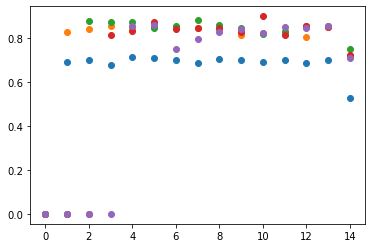

In [21]:
for i, L_min in enumerate(L_min_list):

    plt.scatter(np.arange(L_min_list.min(), L_max), corr_array[i, :]/n_runs)